<a href="https://colab.research.google.com/github/Ruben474/BLT-PINNs/blob/main/652025NavierStokes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# %% PINN Couette híbrido: PDE + BC + referencia FD (sin solución compuesta en la pérdida)
import os, random
import numpy as np
import torch, torch.nn as nn, torch.optim as optim
import matplotlib.pyplot as plt
from scipy.sparse import lil_matrix, csc_matrix
from scipy.sparse.linalg import spsolve

# ===================== Configuración general =====================
CURRICULUM_EPS = [1.0, 0.1, 0.06, 0.04]   # valores de eps a recorrer
GRID_N   = 121
T0, Tw   = 1.0, 0.0      # T0: temperatura caliente (solo en x=0), Tw: frío (resto de la frontera)
SEED     = 1234
SAVE_DIR = "/content/outputs"
os.makedirs(SAVE_DIR, exist_ok=True)

# Entrenamiento
EPOCHS_PER_EPS = 6000         # épocas por valor de eps (ajustable)
MICRO_RES      = 2000         # puntos de residuo por batch
BC_POINTS      = 1000         # puntos de frontera por batch
LR_ADAM        = 1e-3

# RAR (Residual-based Adaptive Refinement)
RAR_ADD   = 500        # cuántos puntos nuevos añadir
RAR_POOL  = 5000       # tamaño del pool donde se checa el residuo
RAR_EVERY = 500        # cada cuántas épocas hacer RAR

# Ponderaciones de la pérdida
W_INLET   = 10.0       # peso para la condición de entrada x=0
LAMBDA_FD = 0.5        # peso base del término híbrido con FD

# Dispositivo
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Semillas
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)


# ===================== Malla y solver FD de referencia =====================
def build_grid(Nx, Ny):
    xs = np.linspace(0.0, 1.0, Nx)
    ys = np.linspace(0.0, 1.0, Ny)
    return xs, ys


def solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N):
    """
    Resuelve y*T_x = eps*(T_xx + T_yy) con:
      T(0,y) = T0  (entrada caliente)
      T(1,y) = Tw  (salida fría)
      T(x,0) = Tw  (pared inferior fría)
      T(x,1) = Tw  (pared superior fría)
    usando un esquema FD con diferencias centrales (lineal).
    """
    xs, ys = build_grid(Nx, Ny)
    hx = xs[1] - xs[0]
    hy = ys[1] - ys[0]

    N = Nx * Ny
    A = lil_matrix((N, N), dtype=float)
    b = np.zeros(N, dtype=float)

    def idx(i, j):
        return i * Ny + j

    for i in range(Nx):
        x = xs[i]
        for j in range(Ny):
            y = ys[j]
            k = idx(i, j)

            # Fronteras: caliente solo en x=0, frío en las demás
            if i == 0:        # entrada x=0 (CALIENTE)
                A[k, k] = 1.0
                b[k]    = T0
            elif i == Nx - 1:   # salida x=1 (FRÍA)
                A[k, k] = 1.0
                b[k]    = Tw
            elif j == 0:      # pared inferior y=0 (FRÍA)
                A[k, k] = 1.0
                b[k]    = Tw
            elif j == Ny - 1:   # pared superior y=1 (FRÍA)
                A[k, k] = 1.0
                b[k]    = Tw
            else:
                # Punto interior: y*T_x - eps*(T_xx + T_yy) = 0
                coef_ip =  y/(2*hx) - eps/(hx*hx)
                coef_im = -y/(2*hx) - eps/(hx*hx)
                coef_jp = -eps/(hy*hy)
                coef_jm = -eps/(hy*hy)
                coef_ii =  2*eps*(1/(hx*hx) + 1/(hy*hy))

                A[k, idx(i+1, j)] += coef_ip
                A[k, idx(i-1, j)] += coef_im
                A[k, idx(i, j+1)] += coef_jp
                A[k, idx(i, j-1)] += coef_jm
                A[k, k]           += coef_ii
                b[k] = 0.0

    A_csc = csc_matrix(A)
    T_flat = spsolve(A_csc, b)
    T = T_flat.reshape(Nx, Ny)
    return T


# ===================== Red neuronal y transformada de salida =====================
class MLP(nn.Module):
    def __init__(self, layers):
        super().__init__()
        mods = []
        for i in range(len(layers) - 1):
            mods.append(nn.Linear(layers[i], layers[i+1]))
            if i < len(layers) - 2:
                mods.append(nn.Tanh())
        self.net = nn.Sequential(*mods)

    def forward(self, x):
        return self.net(x)


def T_model(net, xy):
    # salida directa, sin imponer nada duro en la frontera
    return net(xy)


# ===================== Utilidades para métricas =====================
def metrics_all(Tp, Tr):
    """
    Tp, Tr: numpy arrays [Nx,Ny]
    Devuelve diccionario con L2, Linf, MAE global y en núcleo,
    y percentil 99 del error absoluto.
    """
    E = Tp - Tr
    absE = np.abs(E)
    L2   = np.sqrt(np.mean(E**2))
    Linf = np.max(absE)
    MAE  = np.mean(absE)

    core = (slice(1, -1), slice(1, -1))
    Ec   = E[core]
    absEc = np.abs(Ec)
    L2c   = np.sqrt(np.mean(Ec**2))
    Linfc = np.max(absEc)
    MAEc  = np.mean(absEc)

    p99 = np.percentile(absE, 99.0)

    return {
        "L2": L2, "Linf": Linf, "MAE": MAE,
        "L2_core": L2c, "Linf_core": Linfc, "MAE_core": MAEc,
        "P99": p99
    }


# ===================== Muestreo de puntos y pérdidas =====================
def sample_interior(N):
    # (x,y) uniformes en [0,1]^2
    xy = torch.rand(N, 2, device=device)
    return xy


def sample_bc(N):
    """
    Puntos de frontera:
      - y=0  (inferior, fría Tw)
      - y=1  (superior, fría Tw)
      - x=0  (inlet, caliente T0)
      - x=1  (outlet, fría Tw)
    """
    Nb = N // 4

    # y = 0
    xb0 = torch.rand(Nb, 1, device=device)
    yb0 = torch.zeros(Nb, 1, device=device)

    # y = 1
    xb1 = torch.rand(Nb, 1, device=device)
    yb1 = torch.ones(Nb, 1, device=device)

    # x = 0 (inlet caliente)
    xi0 = torch.zeros(Nb, 1, device=device)
    yi0 = torch.rand(Nb, 1, device=device)

    # x = 1 (outlet frío)
    xi1 = torch.ones(N - 3*Nb, 1, device=device)
    yi1 = torch.rand(N - 3*Nb, 1, device=device)

    Xb = torch.cat([xb0, xb1, xi0, xi1], dim=0)
    Yb = torch.cat([yb0, yb1, yi0, yi1], dim=0)
    XYb = torch.cat([Xb, Yb], dim=1)

    # Máscaras (todas [N,1])
    mask_bottom = (Yb < 1e-6).float()       # y=0
    mask_top    = (Yb > 1-1e-6).float()     # y=1
    mask_inlet  = (Xb < 1e-6).float()       # x=0
    mask_outlet = (Xb > 1-1e-6).float()     # x=1

    return XYb, mask_inlet, mask_bottom, mask_top, mask_outlet


def pde_residual(net, xy, eps):
    """
    Residuo R(x,y) = y*T_x - eps*(T_xx + T_yy)
    """
    xy = xy.clone().detach().requires_grad_(True)
    T = T_model(net, xy)      # [N,1]

    gradT = torch.autograd.grad(
        T, xy, grad_outputs=torch.ones_like(T),
        create_graph=True, retain_graph=True
    )[0]
    Tx = gradT[:, 0:1]
    Ty = gradT[:, 1:2]

    # Segunda derivada respecto a x
    Txx = torch.autograd.grad(
        Tx, xy, grad_outputs=torch.ones_like(Tx),
        create_graph=True, retain_graph=True
    )[0][:, 0:1]

    # Segunda derivada respecto a y
    Tyy = torch.autograd.grad(
        Ty, xy, grad_outputs=torch.ones_like(Ty),
        create_graph=True, retain_graph=True
    )[0][:, 1:2]

    y = xy[:, 1:2]
    R = y*Tx - eps*(Txx + Tyy)
    return R


def fd_loss_to_reference(net, xy, xs_np, ys_np, Tfd_np):
    """
    MSE entre T_PINN(x,y) y T_FD(x,y) interpolando bilinealmente T_FD.
    """
    xs = torch.tensor(xs_np, dtype=torch.float32, device=xy.device)
    ys = torch.tensor(ys_np, dtype=torch.float32, device=xy.device)
    Tfd = torch.tensor(Tfd_np, dtype=torch.float32, device=xy.device)  # [Nx,Ny]

    x = xy[:, 0]
    y = xy[:, 1]
    Nx = xs.numel()
    Ny = ys.numel()
    hx = xs[1] - xs[0]
    hy = ys[1] - ys[0]

    ix = torch.clamp(((x/xs[-1])*(Nx-1)).floor().long(), 0, Nx-2)
    iy = torch.clamp(((y/ys[-1])*(Ny-1)).floor().long(), 0, Ny-2)

    tx = (x - xs[ix])/(hx + 1e-12)
    ty = (y - ys[iy])/(hy + 1e-12)

    def G(ii, jj):
        return Tfd[ii, jj]

    T_fd_interp = (
        (1-tx)*(1-ty)*G(ix,   iy)
      + tx*(1-ty)    *G(ix+1, iy)
      + (1-tx)*ty    *G(ix,   iy+1)
      + tx*ty        *G(ix+1, iy+1)
    ).unsqueeze(1)

    T_pred = T_model(net, xy)
    return torch.mean((T_pred - T_fd_interp)**2)


# ===================== RAR: augmentar con puntos de alto residuo =====================
def rar_augment(net, eps, base_XY, add=RAR_ADD, pool=RAR_POOL):
    XYpool = torch.rand(pool, 2, device=device)
    Rpool  = pde_residual(net, XYpool, eps)
    scores = torch.abs(Rpool).detach().squeeze(1)
    _, idx_top = torch.topk(scores, add, largest=True)
    XYnew = XYpool.detach()[idx_top]
    return torch.cat([base_XY, XYnew], dim=0).detach()


# ===================== Entrenamiento por fase (para un eps dado) =====================
def train_for_eps(net, eps, xs_np, ys_np, Tfd_np):
    net.train()
    opt = optim.Adam(net.parameters(), lr=LR_ADAM)

    XYc = sample_interior(MICRO_RES).detach()

    for ep in range(1, EPOCHS_PER_EPS + 1):
        # Submuestreo de puntos de residuo
        if XYc.shape[0] > MICRO_RES:
            perm = torch.randperm(XYc.shape[0], device=device)[:MICRO_RES]
            XYr = XYc[perm]
        else:
            XYr = XYc

        opt.zero_grad()

        # --- Pérdida PDE ---
        R = pde_residual(net, XYr, eps)
        loss_pde = torch.mean(R**2)

        # --- Pérdida de frontera ---
        XYb, mask_inlet, mask_bottom, mask_top, mask_outlet = sample_bc(BC_POINTS)
        Tb = T_model(net, XYb)

        # caliente sólo en x=0
        loss_hot = torch.mean(mask_inlet * (Tb - T0)**2)

        # frío en todas las demás fronteras: x=1, y=0, y=1
        mask_cold = mask_outlet + mask_bottom + mask_top
        loss_cold = torch.mean(mask_cold * (Tb - Tw)**2)

        loss_bc = W_INLET*loss_hot + loss_cold

        # --- Pérdida híbrida vs FD ---
        loss_fd = fd_loss_to_reference(net, XYr, xs_np, ys_np, Tfd_np)

        # Programación del peso FD (decreciente en la época)
        alpha = ep / EPOCHS_PER_EPS
        lam_fd = LAMBDA_FD * (1.0 - 0.5*alpha)

        # --- Pérdida total ---
        loss = loss_pde + loss_bc + lam_fd*loss_fd

        loss.backward()
        opt.step()

        # --- RAR ---
        if ep % RAR_EVERY == 0:
            XYc = rar_augment(net, eps, XYc)

        if ep % 500 == 0:
            print(f"[eps={eps:.3f}] epoch {ep}/{EPOCHS_PER_EPS} "
                  f"loss={loss.item():.3e}  (PDE={loss_pde.item():.3e}, "
                  f"BC={loss_bc.item():.3e}, FD={loss_fd.item():.3e})")

    return net


# ===================== Bucle principal (curriculum en eps) =====================
def run_curriculum():
    xs_np = np.linspace(0.0, 1.0, GRID_N)
    ys_np = np.linspace(0.0, 1.0, GRID_N)
    Xg, Yg = np.meshgrid(xs_np, ys_np, indexing='ij')
    XY_grid = np.stack([Xg.flatten(), Yg.flatten()], axis=1)
    XY_grid_torch = torch.tensor(XY_grid, dtype=torch.float32, device=device)

    net = MLP([2, 64, 64, 64, 1]).to(device)

    results = []

    for eps in CURRICULUM_EPS:
        print("\n" + "="*70)
        print(f" Entrenando para eps = {eps}")
        print("="*70)

        # --- Solución FD de referencia ---
        Tfd_np = solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N)

        # --- Entrenamiento PINN híbrido ---
        net = train_for_eps(net, eps, xs_np, ys_np, Tfd_np)

        # --- Evaluar red en la malla completa ---
        net.eval()
        with torch.no_grad():
            T_pred = T_model(net, XY_grid_torch).cpu().numpy().reshape(GRID_N, GRID_N)

        # --- Métricas globales vs FD ---
        mets = metrics_all(T_pred, Tfd_np)
        print(f"\nMétricas vs FD para eps={eps}:")
        for k, v in mets.items():
            print(f"  {k:10s}: {v:.3e}")

        results.append((eps, mets, T_pred, Tfd_np))

        # ===================== GRÁFICAS COMPARATIVAS =====================
        # 1) Campos 2D lado a lado (FD vs PINN híbrido)
        fig, axes = plt.subplots(1, 2, figsize=(10, 4), sharex=True, sharey=True)

        im0 = axes[0].imshow(
            Tfd_np.T,
            origin='lower',
            extent=[0, 1, 0, 1],
            aspect='auto'
        )
        axes[0].set_title(f"FD referencia - eps={eps}")
        axes[0].set_xlabel("x")
        axes[0].set_ylabel("y")
        fig.colorbar(im0, ax=axes[0], label='T_FD')

        im1 = axes[1].imshow(
            T_pred.T,
            origin='lower',
            extent=[0, 1, 0, 1],
            aspect='auto'
        )
        axes[1].set_title(f"PINN híbrido (PDE+FD) - eps={eps}")
        axes[1].set_xlabel("x")
        axes[1].set_ylabel("y")
        fig.colorbar(im1, ax=axes[1], label='T_PINN')

        plt.tight_layout()
        plt.savefig(os.path.join(SAVE_DIR, f"compare_2D_eps_{eps:.2f}.png"))
        plt.close(fig)

        # 2) Corte 1D a y = 0.5 para ver curvas juntas
        y_mid = 0.5
        j_mid = np.argmin(np.abs(ys_np - y_mid))

        Tfd_line   = Tfd_np[:, j_mid]
        Tpred_line = T_pred[:, j_mid]

        plt.figure(figsize=(6, 4))
        plt.plot(xs_np, Tfd_line,  label="FD", marker='o', markersize=3, linestyle='-')
        plt.plot(xs_np, Tpred_line, label="PINN híbrido", linestyle='--')
        plt.xlabel("x")
        plt.ylabel(f"T(x, y={ys_np[j_mid]:.2f})")
        plt.title(f"Corte 1D a y ≈ {ys_np[j_mid]:.2f} - eps={eps}")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.savefig(os.path.join(SAVE_DIR, f"compare_1D_eps_{eps:.2f}.png"))
        plt.close()

    return results


# ===================== Ejecutar curriculum y mostrar resumen =====================
results = run_curriculum()

print("\nResumen L2 vs FD por eps (modelo híbrido PDE+FD):")
for eps, mets, _, _ in results:
    print(f"eps={eps:.3f}  L2={mets['L2']:.3e}  L2_core={mets['L2_core']:.3e}  P99={mets['P99']:.3e}")



 Entrenando para eps = 1.0


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: Attempting to run cuBLAS, but there was no current CUDA context! Attempting to set the primary context... (Triggered internally at /pytorch/aten/src/ATen/cuda/CublasHandlePool.cpp:270.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


[eps=1.000] epoch 500/6000 loss=9.998e-02  (PDE=1.759e-03, BC=8.780e-02, FD=2.175e-02)
[eps=1.000] epoch 1000/6000 loss=8.040e-02  (PDE=1.656e-03, BC=6.894e-02, FD=2.139e-02)
[eps=1.000] epoch 1500/6000 loss=7.642e-02  (PDE=3.020e-03, BC=6.462e-02, FD=2.008e-02)
[eps=1.000] epoch 2000/6000 loss=7.586e-02  (PDE=2.858e-03, BC=6.550e-02, FD=1.800e-02)
[eps=1.000] epoch 2500/6000 loss=6.637e-02  (PDE=5.327e-03, BC=5.559e-02, FD=1.377e-02)
[eps=1.000] epoch 3000/6000 loss=5.609e-02  (PDE=2.114e-03, BC=4.847e-02, FD=1.469e-02)
[eps=1.000] epoch 3500/6000 loss=5.697e-02  (PDE=2.154e-03, BC=5.016e-02, FD=1.313e-02)
[eps=1.000] epoch 4000/6000 loss=5.853e-02  (PDE=7.804e-03, BC=4.655e-02, FD=1.251e-02)
[eps=1.000] epoch 4500/6000 loss=4.292e-02  (PDE=2.871e-03, BC=3.660e-02, FD=1.104e-02)
[eps=1.000] epoch 5000/6000 loss=4.980e-02  (PDE=1.385e-02, BC=3.263e-02, FD=1.138e-02)
[eps=1.000] epoch 5500/6000 loss=3.462e-02  (PDE=2.251e-03, BC=2.989e-02, FD=9.164e-03)
[eps=1.000] epoch 6000/6000 loss=

In [ ]:
# %% PINN Couette híbrido: PDE + BC + referencia FD + prior asintótico (composite) para TODO el curriculum
import os, random
import numpy as np
import torch, torch.nn as nn, torch.optim as optim
import matplotlib.pyplot as plt
from scipy.sparse import lil_matrix, csc_matrix
from scipy.sparse.linalg import spsolve
from scipy.special import gammaincc

# ===================== Configuración general =====================
CURRICULUM_EPS = [1.0, 0.1, 0.06, 0.04]   # valores de eps a recorrer
GRID_N   = 121
T0, Tw   = 1.0, 0.0      # T0: temperatura caliente (solo en x=0), Tw: frío (resto de la frontera)
SEED     = 1234
SAVE_DIR = "/content/outputs"
os.makedirs(SAVE_DIR, exist_ok=True)

# Entrenamiento
EPOCHS_PER_EPS = 6000         # épocas por valor de eps
MICRO_RES      = 2000         # puntos de residuo por batch
BC_POINTS      = 1000         # puntos de frontera por batch
LR_ADAM        = 1e-3

# RAR (Residual-based Adaptive Refinement)
RAR_ADD   = 500        # cuántos puntos nuevos añadir
RAR_POOL  = 5000       # tamaño del pool donde se checa el residuo
RAR_EVERY = 500        # cada cuántas épocas hacer RAR

# Ponderaciones de la pérdida
W_INLET   = 10.0       # peso para la condición de entrada x=0
LAMBDA_FD = 0.5        # peso base del término híbrido con FD

# ===== Prior asintótico (composite) =====
USE_PRIOR_ALL_EPS = True

PRIOR_LAMBDA0 = 0.20   # peso inicial del prior (0.1–0.5)
PRIOR_LAMBDAF = 0.05   # peso final (casi apagado)

# ventana "núcleo" (evita fronteras)
CORE_MARGIN_Y  = 0.10
CORE_MARGIN_XL = 0.08
CORE_MARGIN_XR = 0.08

# opcional: hacer el prior más fuerte para eps pequeño
PRIOR_EPS_BOOST = True

# Dispositivo
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Semillas
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

print("Device:", device)

# ===================== Malla y solver FD de referencia =====================
def build_grid(Nx, Ny):
    xs = np.linspace(0.0, 1.0, Nx)
    ys = np.linspace(0.0, 1.0, Ny)
    return xs, ys

def solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N):
    """
    Resuelve y*T_x = eps*(T_xx + T_yy) con:
      T(0,y) = T0  (entrada caliente)
      T(1,y) = Tw  (salida fría)
      T(x,0) = Tw  (pared inferior fría)
      T(x,1) = Tw  (pared superior fría)
    usando un esquema FD lineal.
    """
    xs, ys = build_grid(Nx, Ny)
    hx = xs[1] - xs[0]
    hy = ys[1] - ys[0]

    N = Nx * Ny
    A = lil_matrix((N, N), dtype=float)
    b = np.zeros(N, dtype=float)

    def idx(i, j):
        return i * Ny + j

    for i in range(Nx):
        for j in range(Ny):
            k = idx(i, j)
            y = ys[j]

            # Fronteras
            if i == 0:          # inlet caliente
                A[k, k] = 1.0
                b[k]    = T0
            elif i == Nx - 1:   # outlet frío
                A[k, k] = 1.0
                b[k]    = Tw
            elif j == 0:        # y=0 frío
                A[k, k] = 1.0
                b[k]    = Tw
            elif j == Ny - 1:   # y=1 frío
                A[k, k] = 1.0
                b[k]    = Tw
            else:
                # Interior: y*T_x - eps*(T_xx + T_yy)=0
                coef_ip =  y/(2*hx) - eps/(hx*hx)
                coef_im = -y/(2*hx) - eps/(hx*hx)
                coef_jp = -eps/(hy*hy)
                coef_jm = -eps/(hy*hy)
                coef_ii =  2*eps*(1/(hx*hx) + 1/(hy*hy))

                A[k, idx(i+1, j)] += coef_ip
                A[k, idx(i-1, j)] += coef_im
                A[k, idx(i, j+1)] += coef_jp
                A[k, idx(i, j-1)] += coef_jm
                A[k, k]           += coef_ii
                b[k] = 0.0

    T_flat = spsolve(csc_matrix(A), b)
    return T_flat.reshape(Nx, Ny)

# ===================== Red neuronal =====================
class MLP(nn.Module):
    def __init__(self, layers):
        super().__init__()
        mods = []
        for i in range(len(layers) - 1):
            mods.append(nn.Linear(layers[i], layers[i+1]))
            if i < len(layers) - 2:
                mods.append(nn.Tanh())
        self.net = nn.Sequential(*mods)

    def forward(self, x):
        return self.net(x)

def T_model(net, xy):
    return net(xy)

# ===================== Métricas =====================
def metrics_all(Tp, Tr):
    E = Tp - Tr
    absE = np.abs(E)

    L2   = np.sqrt(np.mean(E**2))
    Linf = np.max(absE)
    MAE  = np.mean(absE)

    core = (slice(1, -1), slice(1, -1))
    Ec = E[core]
    absEc = np.abs(Ec)

    L2c   = np.sqrt(np.mean(Ec**2))
    Linfc = np.max(absEc)
    MAEc  = np.mean(absEc)

    p99 = np.percentile(absE, 99.0)

    return {
        "L2": L2, "Linf": Linf, "MAE": MAE,
        "L2_core": L2c, "Linf_core": Linfc, "MAE_core": MAEc,
        "P99": p99
    }

# ===================== Muestreo y pérdidas =====================
def sample_interior(N):
    return torch.rand(N, 2, device=device)

def sample_bc(N):
    Nb = N // 4

    # y=0
    xb0 = torch.rand(Nb, 1, device=device)
    yb0 = torch.zeros(Nb, 1, device=device)

    # y=1
    xb1 = torch.rand(Nb, 1, device=device)
    yb1 = torch.ones(Nb, 1, device=device)

    # x=0 (inlet caliente)
    xi0 = torch.zeros(Nb, 1, device=device)
    yi0 = torch.rand(Nb, 1, device=device)

    # x=1 (outlet frío)
    xi1 = torch.ones(N - 3*Nb, 1, device=device)
    yi1 = torch.rand(N - 3*Nb, 1, device=device)

    Xb = torch.cat([xb0, xb1, xi0, xi1], dim=0)
    Yb = torch.cat([yb0, yb1, yi0, yi1], dim=0)
    XYb = torch.cat([Xb, Yb], dim=1)

    mask_bottom = (Yb < 1e-6).float()
    mask_top    = (Yb > 1-1e-6).float()
    mask_inlet  = (Xb < 1e-6).float()
    mask_outlet = (Xb > 1-1e-6).float()

    return XYb, mask_inlet, mask_bottom, mask_top, mask_outlet

def pde_residual(net, xy, eps):
    xy = xy.clone().detach().requires_grad_(True)
    T = T_model(net, xy)

    gradT = torch.autograd.grad(
        T, xy, grad_outputs=torch.ones_like(T),
        create_graph=True, retain_graph=True
    )[0]
    Tx = gradT[:, 0:1]
    Ty = gradT[:, 1:2]

    Txx = torch.autograd.grad(
        Tx, xy, grad_outputs=torch.ones_like(Tx),
        create_graph=True, retain_graph=True
    )[0][:, 0:1]

    Tyy = torch.autograd.grad(
        Ty, xy, grad_outputs=torch.ones_like(Ty),
        create_graph=True, retain_graph=True
    )[0][:, 1:2]

    y = xy[:, 1:2]
    return y*Tx - eps*(Txx + Tyy)

def fd_loss_to_reference(net, xy, xs_np, ys_np, Tfd_np):
    xs = torch.tensor(xs_np, dtype=torch.float32, device=xy.device)
    ys = torch.tensor(ys_np, dtype=torch.float32, device=xy.device)
    Tfd = torch.tensor(Tfd_np, dtype=torch.float32, device=xy.device)

    x = xy[:, 0]
    y = xy[:, 1]
    Nx = xs.numel()
    Ny = ys.numel()
    hx = xs[1] - xs[0]
    hy = ys[1] - ys[0]

    ix = torch.clamp(((x/xs[-1])*(Nx-1)).floor().long(), 0, Nx-2)
    iy = torch.clamp(((y/ys[-1])*(Ny-1)).floor().long(), 0, Ny-2)

    tx = (x - xs[ix])/(hx + 1e-12)
    ty = (y - ys[iy])/(hy + 1e-12)

    def G(ii, jj):
        return Tfd[ii, jj]

    T_fd_interp = (
        (1-tx)*(1-ty)*G(ix,   iy)
      + tx*(1-ty)    *G(ix+1, iy)
      + (1-tx)*ty    *G(ix,   iy+1)
      + tx*ty        *G(ix+1, iy+1)
    ).unsqueeze(1)

    T_pred = T_model(net, xy)
    return torch.mean((T_pred - T_fd_interp)**2)

# ===================== Prior asintótico (composite) =====================
def composite_couette(x_grid, y_grid, eps, h=1.0, T0=1.0, Tw=0.0, p=2):
    """
    Composite para: y*T_x = eps*(T_xx + T_yy),
    con x=0: T=T0, y=0,1: T=Tw, x=1: T=Tw.
    """
    X, Y = np.meshgrid(x_grid, y_grid, indexing='ij')
    s     = 1.0/3.0
    delta = 1e-12

    z1 = (Y**3)       / (3.0*eps*np.maximum(X, delta))
    z2 = ((h - Y)**3) / (3.0*eps*np.maximum(X, delta))
    Qb = gammaincc(s, z1)
    Qt = gammaincc(s, z2)

    S = Qb + Qt - Qb*Qt
    core = 1.0 - S

    w = X**p
    outlet = np.exp(-(1.0 - X)*Y/eps)

    Tcomp = T0 + (Tw - T0) * ( S + w*outlet*core )
    return Tcomp

def core_window_torch(xy):
    x = xy[:, 0:1]; y = xy[:, 1:2]
    m_y = (y > CORE_MARGIN_Y) & (y < 1.0 - CORE_MARGIN_Y)
    m_x = (x > CORE_MARGIN_XL) & (x < 1.0 - CORE_MARGIN_XR)
    return (m_x & m_y).float()

def prior_loss_to_composite(net, xy, xs_np, ys_np, Tcomp_np):
    xs = torch.tensor(xs_np, dtype=torch.float32, device=xy.device)
    ys = torch.tensor(ys_np, dtype=torch.float32, device=xy.device)
    Tc = torch.tensor(Tcomp_np, dtype=torch.float32, device=xy.device)

    x = xy[:, 0]
    y = xy[:, 1]
    Nx = xs.numel()
    Ny = ys.numel()
    hx = xs[1] - xs[0]
    hy = ys[1] - ys[0]

    ix = torch.clamp(((x/xs[-1])*(Nx-1)).floor().long(), 0, Nx-2)
    iy = torch.clamp(((y/ys[-1])*(Ny-1)).floor().long(), 0, Ny-2)

    tx = (x - xs[ix])/(hx + 1e-12)
    ty = (y - ys[iy])/(hy + 1e-12)

    def G(ii, jj): return Tc[ii, jj]

    Tc_interp = (
        (1-tx)*(1-ty)*G(ix,   iy)
      + tx*(1-ty)    *G(ix+1, iy)
      + (1-tx)*ty    *G(ix,   iy+1)
      + tx*ty        *G(ix+1, iy+1)
    ).unsqueeze(1)

    T_pred = T_model(net, xy)

    wcore = core_window_torch(xy)
    num = torch.sum(wcore * (T_pred - Tc_interp)**2)
    den = torch.sum(wcore) + 1e-12
    return num / den

# ===================== RAR =====================
def rar_augment(net, eps, base_XY, add=RAR_ADD, pool=RAR_POOL):
    XYpool = torch.rand(pool, 2, device=device)
    Rpool  = pde_residual(net, XYpool, eps)
    scores = torch.abs(Rpool).detach().squeeze(1)
    _, idx_top = torch.topk(scores, add, largest=True)
    XYnew = XYpool.detach()[idx_top]
    return torch.cat([base_XY, XYnew], dim=0).detach()

# ===================== Entrenamiento por eps =====================
def train_for_eps(net, eps, xs_np, ys_np, Tfd_np):
    net.train()
    opt = optim.Adam(net.parameters(), lr=LR_ADAM)

    # prior precomputado para este eps
    Tcomp_np = composite_couette(xs_np, ys_np, eps, T0=T0, Tw=Tw) if USE_PRIOR_ALL_EPS else None

    XYc = sample_interior(MICRO_RES).detach()

    for ep in range(1, EPOCHS_PER_EPS + 1):
        # submuestreo de puntos de residuo
        if XYc.shape[0] > MICRO_RES:
            perm = torch.randperm(XYc.shape[0], device=device)[:MICRO_RES]
            XYr = XYc[perm]
        else:
            XYr = XYc

        opt.zero_grad()

        # PDE
        R = pde_residual(net, XYr, eps)
        loss_pde = torch.mean(R**2)

        # BC
        XYb, mask_inlet, mask_bottom, mask_top, mask_outlet = sample_bc(BC_POINTS)
        Tb = T_model(net, XYb)

        loss_hot = torch.mean(mask_inlet * (Tb - T0)**2)
        mask_cold = mask_outlet + mask_bottom + mask_top
        loss_cold = torch.mean(mask_cold * (Tb - Tw)**2)

        loss_bc = W_INLET*loss_hot + loss_cold

        # FD anchor
        loss_fd = fd_loss_to_reference(net, XYr, xs_np, ys_np, Tfd_np)
        alpha = ep / EPOCHS_PER_EPS
        lam_fd = LAMBDA_FD * (1.0 - 0.5*alpha)

        # Prior asintótico (annealing)
        loss_prior = 0.0
        lam_prior  = 0.0
        if USE_PRIOR_ALL_EPS:
            c = 0.5*(1.0 + np.cos(np.pi*min(alpha, 1.0)))  # 1→0 suave
            lam_prior = PRIOR_LAMBDAF + (PRIOR_LAMBDA0 - PRIOR_LAMBDAF)*c
            if PRIOR_EPS_BOOST:
                lam_prior *= float((0.04/eps)**0.5)  # boost suave para eps pequeño
            loss_prior = prior_loss_to_composite(net, XYr, xs_np, ys_np, Tcomp_np)

        # Total
        loss = loss_pde + loss_bc + lam_fd*loss_fd + lam_prior*loss_prior

        loss.backward()
        opt.step()

        # RAR
        if ep % RAR_EVERY == 0:
            XYc = rar_augment(net, eps, XYc)

        if ep % 500 == 0:
            lp = float(loss_prior) if isinstance(loss_prior, (int,float)) else loss_prior.item()
            print(f"[eps={eps:.3f}] epoch {ep}/{EPOCHS_PER_EPS} "
                  f"loss={loss.item():.3e} (PDE={loss_pde.item():.3e}, "
                  f"BC={loss_bc.item():.3e}, FD={loss_fd.item():.3e}, "
                  f"PRIOR={lp:.3e}, lamP={lam_prior:.3g})")

    return net

# ===================== Bucle principal (curriculum en eps) =====================
def run_curriculum():
    xs_np = np.linspace(0.0, 1.0, GRID_N)
    ys_np = np.linspace(0.0, 1.0, GRID_N)

    Xg, Yg = np.meshgrid(xs_np, ys_np, indexing='ij')
    XY_grid = np.stack([Xg.flatten(), Yg.flatten()], axis=1)
    XY_grid_torch = torch.tensor(XY_grid, dtype=torch.float32, device=device)

    net = MLP([2, 64, 64, 64, 1]).to(device)

    results = []

    for eps in CURRICULUM_EPS:
        print("\n" + "="*70)
        print(f" Entrenando para eps = {eps}")
        print("="*70)

        # FD referencia
        Tfd_np = solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N)

        # Entrenar
        net = train_for_eps(net, eps, xs_np, ys_np, Tfd_np)

        # Evaluar en malla
        net.eval()
        with torch.no_grad():
            T_pred = T_model(net, XY_grid_torch).cpu().numpy().reshape(GRID_N, GRID_N)

        mets = metrics_all(T_pred, Tfd_np)
        print(f"\nMétricas vs FD para eps={eps}:")
        for k, v in mets.items():
            print(f"  {k:10s}: {v:.3e}")

        results.append((eps, mets, T_pred, Tfd_np))

        # ===================== GRÁFICAS =====================
        # 1) Campos 2D (FD vs PINN)
        fig, axes = plt.subplots(1, 2, figsize=(10, 4), sharex=True, sharey=True)

        im0 = axes[0].imshow(Tfd_np.T, origin='lower', extent=[0, 1, 0, 1], aspect='auto')
        axes[0].set_title(f"FD referencia - eps={eps}")
        axes[0].set_xlabel("x"); axes[0].set_ylabel("y")
        fig.colorbar(im0, ax=axes[0], label='T_FD')

        im1 = axes[1].imshow(T_pred.T, origin='lower', extent=[0, 1, 0, 1], aspect='auto')
        axes[1].set_title(f"PINN híbrido (PDE+FD+prior) - eps={eps}")
        axes[1].set_xlabel("x"); axes[1].set_ylabel("y")
        fig.colorbar(im1, ax=axes[1], label='T_PINN')

        plt.tight_layout()
        plt.savefig(os.path.join(SAVE_DIR, f"compare_2D_eps_{eps:.2f}.png"), dpi=150)
        plt.close(fig)

        # 2) Corte 1D a y≈0.5
        y_mid = 0.5
        j_mid = np.argmin(np.abs(ys_np - y_mid))

        Tfd_line   = Tfd_np[:, j_mid]
        Tpred_line = T_pred[:, j_mid]

        plt.figure(figsize=(6, 4))
        plt.plot(xs_np, Tfd_line,  label="FD", marker='o', markersize=3, linestyle='-')
        plt.plot(xs_np, Tpred_line, label="PINN híbrido", linestyle='--')
        plt.xlabel("x")
        plt.ylabel(f"T(x, y={ys_np[j_mid]:.2f})")
        plt.title(f"Corte 1D a y ≈ {ys_np[j_mid]:.2f} - eps={eps}")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.savefig(os.path.join(SAVE_DIR, f"compare_1D_eps_{eps:.2f}.png"), dpi=150)
        plt.close()

    return results

# ===================== Ejecutar =====================
results = run_curriculum()

print("\nResumen L2 vs FD por eps (modelo híbrido PDE+FD+prior):")
for eps, mets, _, _ in results:
    print(f"eps={eps:.3f}  L2={mets['L2']:.3e}  L2_core={mets['L2_core']:.3e}  P99={mets['P99']:.3e}")


Device: cuda

 Entrenando para eps = 1.0


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: Attempting to run cuBLAS, but there was no current CUDA context! Attempting to set the primary context... (Triggered internally at /pytorch/aten/src/ATen/cuda/CublasHandlePool.cpp:270.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


[eps=1.000] epoch 500/6000 loss=1.021e-01 (PDE=1.847e-03, BC=8.766e-02, FD=2.120e-02, PRIOR=6.049e-02, lamP=0.0395)
[eps=1.000] epoch 1000/6000 loss=8.202e-02 (PDE=1.580e-03, BC=6.862e-02, FD=2.071e-02, PRIOR=6.135e-02, lamP=0.038)
[eps=1.000] epoch 1500/6000 loss=7.636e-02 (PDE=1.153e-03, BC=6.527e-02, FD=1.815e-02, PRIOR=5.624e-02, lamP=0.0356)
[eps=1.000] epoch 2000/6000 loss=7.700e-02 (PDE=2.380e-03, BC=6.504e-02, FD=1.846e-02, PRIOR=5.792e-02, lamP=0.0325)
[eps=1.000] epoch 2500/6000 loss=7.128e-02 (PDE=8.579e-03, BC=5.589e-02, FD=1.359e-02, PRIOR=4.955e-02, lamP=0.0289)
[eps=1.000] epoch 3000/6000 loss=5.756e-02 (PDE=1.892e-03, BC=4.840e-02, FD=1.536e-02, PRIOR=6.061e-02, lamP=0.025)
[eps=1.000] epoch 3500/6000 loss=5.791e-02 (PDE=2.181e-03, BC=4.997e-02, FD=1.301e-02, PRIOR=5.423e-02, lamP=0.0211)
[eps=1.000] epoch 4000/6000 loss=5.503e-02 (PDE=3.077e-03, BC=4.667e-02, FD=1.336e-02, PRIOR=4.771e-02, lamP=0.0175)
[eps=1.000] epoch 4500/6000 loss=4.370e-02 (PDE=3.174e-03, BC=3.631

Device: cuda
[eps=1|warm=True] Ep   25 | PDE 5.723e+00 | inlet*w 5.404e+01 | prior 5.213e-03 | Total 5.976e+01
[eps=1|warm=True] Ep   50 | PDE 1.669e+01 | inlet*w 1.070e+01 | prior 4.176e-02 | Total 2.744e+01
[eps=1|warm=True] Ep   75 | PDE 8.748e+00 | inlet*w 1.351e+01 | prior 2.403e-02 | Total 2.228e+01
[eps=1|warm=True] Ep  100 | PDE 2.942e+00 | inlet*w 1.201e+01 | prior 1.652e-02 | Total 1.497e+01
[eps=1|warm=True] Ep  125 | PDE 8.353e-01 | inlet*w 1.075e+01 | prior 1.623e-02 | Total 1.160e+01
[eps=1|warm=True] Ep  150 | PDE 5.707e-01 | inlet*w 9.767e+00 | prior 1.290e-02 | Total 1.035e+01
[eps=1|warm=True] Ep  175 | PDE 5.139e-01 | inlet*w 1.077e+01 | prior 1.011e-02 | Total 1.129e+01
[eps=1|warm=True] Ep  200 | PDE 4.756e-01 | inlet*w 1.089e+01 | prior 7.101e-03 | Total 1.137e+01
[eps=1|warm=True] Ep  300 | PDE 5.123e-01 | inlet*w 1.031e+01 | prior 1.859e-03 | Total 1.083e+01
[eps=1|warm=False] Ep   25 | PDE 5.464e-01 | inlet*w 1.081e+01 | prior 2.206e-02 | Total 1.138e+01
[eps=1

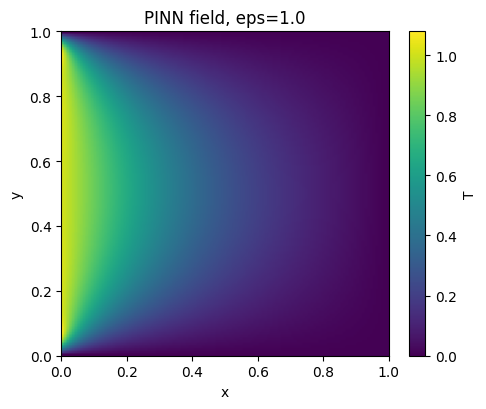

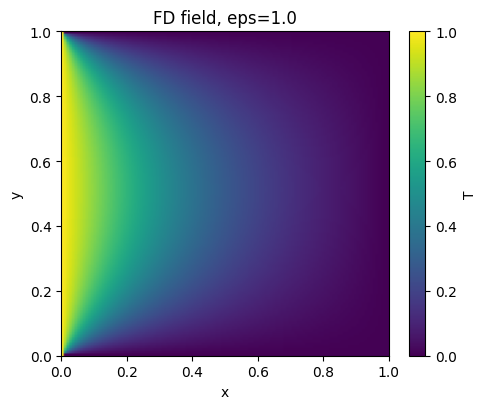

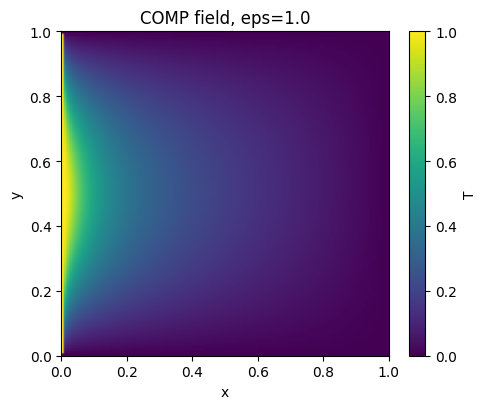

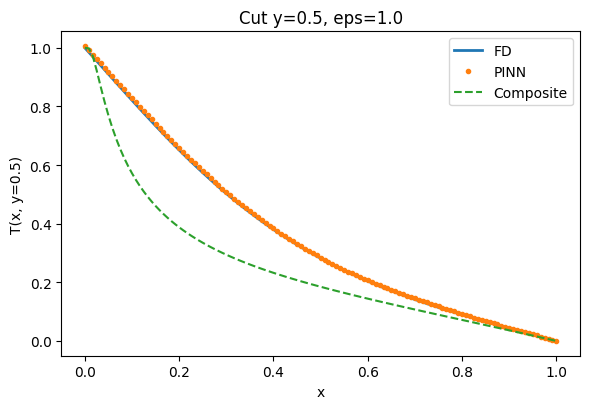

[eps=0.1|warm=True] Ep   25 | PDE 1.349e-01 | inlet*w 1.887e-01 | prior 2.798e-02 | Total 3.516e-01
[eps=0.1|warm=True] Ep   50 | PDE 6.713e-02 | inlet*w 1.182e-01 | prior 2.499e-02 | Total 2.103e-01
[eps=0.1|warm=True] Ep   75 | PDE 4.465e-02 | inlet*w 1.627e-01 | prior 2.263e-02 | Total 2.300e-01
[eps=0.1|warm=True] Ep  100 | PDE 3.616e-02 | inlet*w 1.306e-01 | prior 1.982e-02 | Total 1.866e-01
[eps=0.1|warm=True] Ep  125 | PDE 3.128e-02 | inlet*w 1.421e-01 | prior 1.673e-02 | Total 1.901e-01
[eps=0.1|warm=True] Ep  150 | PDE 2.489e-02 | inlet*w 1.247e-01 | prior 1.353e-02 | Total 1.632e-01
[eps=0.1|warm=True] Ep  175 | PDE 2.336e-02 | inlet*w 1.408e-01 | prior 1.043e-02 | Total 1.746e-01
[eps=0.1|warm=True] Ep  200 | PDE 2.361e-02 | inlet*w 1.483e-01 | prior 7.598e-03 | Total 1.795e-01
[eps=0.1|warm=True] Ep  300 | PDE 4.847e-02 | inlet*w 1.509e-01 | prior 1.971e-03 | Total 2.014e-01
[eps=0.1|warm=False] Ep   25 | PDE 1.239e-01 | inlet*w 3.820e-01 | prior 2.358e-02 | Total 5.294e-01

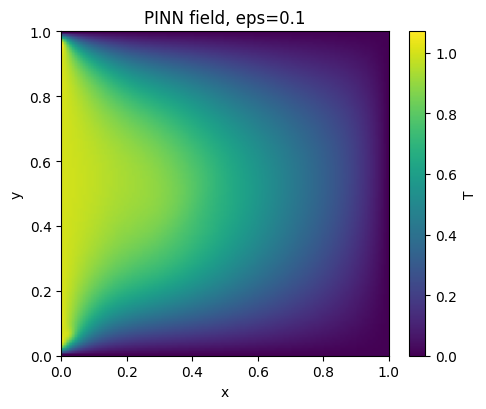

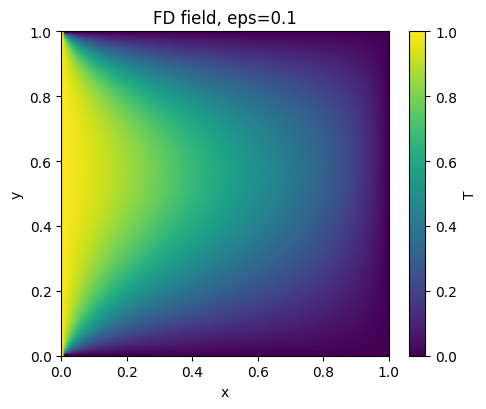

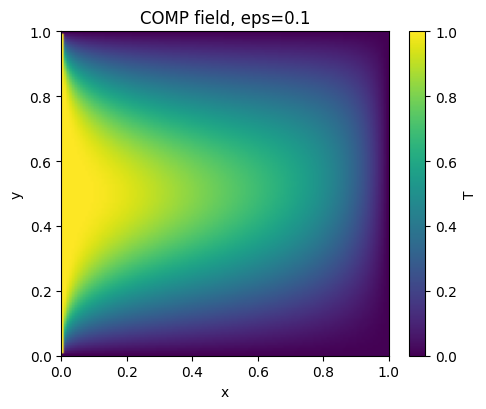

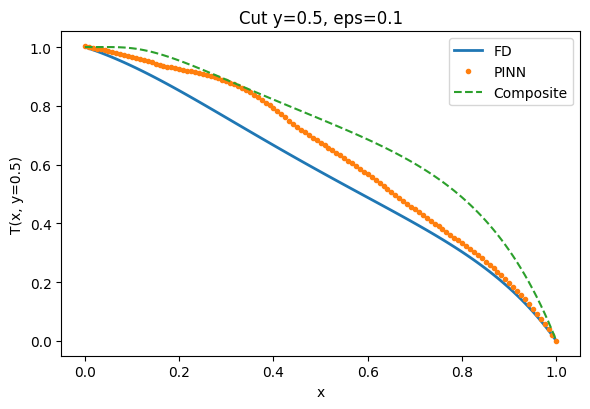

[eps=0.06|warm=True] Ep   25 | PDE 1.223e+00 | inlet*w 8.502e-01 | prior 2.599e-02 | Total 2.099e+00
[eps=0.06|warm=True] Ep   50 | PDE 3.734e-01 | inlet*w 3.399e-01 | prior 2.188e-02 | Total 7.352e-01
[eps=0.06|warm=True] Ep   75 | PDE 1.599e-01 | inlet*w 2.000e-01 | prior 1.883e-02 | Total 3.787e-01
[eps=0.06|warm=True] Ep  100 | PDE 7.998e-02 | inlet*w 1.335e-01 | prior 1.657e-02 | Total 2.301e-01
[eps=0.06|warm=True] Ep  125 | PDE 4.900e-02 | inlet*w 1.241e-01 | prior 1.411e-02 | Total 1.872e-01
[eps=0.06|warm=True] Ep  150 | PDE 3.859e-02 | inlet*w 8.464e-02 | prior 1.150e-02 | Total 1.347e-01
[eps=0.06|warm=True] Ep  175 | PDE 3.407e-02 | inlet*w 8.173e-02 | prior 8.894e-03 | Total 1.247e-01
[eps=0.06|warm=True] Ep  200 | PDE 2.958e-02 | inlet*w 7.177e-02 | prior 6.524e-03 | Total 1.079e-01
[eps=0.06|warm=True] Ep  300 | PDE 2.191e-02 | inlet*w 6.119e-02 | prior 1.733e-03 | Total 8.483e-02
[eps=0.06|warm=False] Ep   25 | PDE 1.258e-01 | inlet*w 2.140e-01 | prior 1.862e-02 | Total

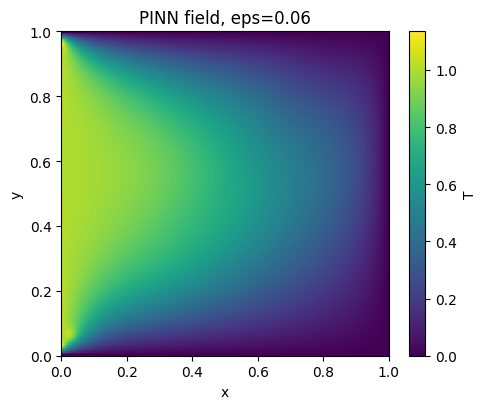

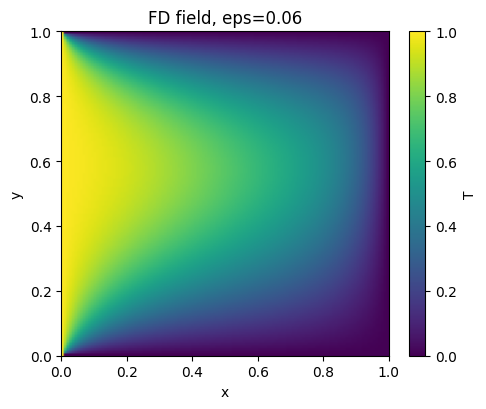

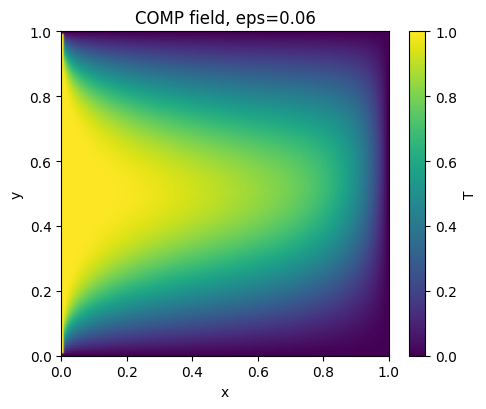

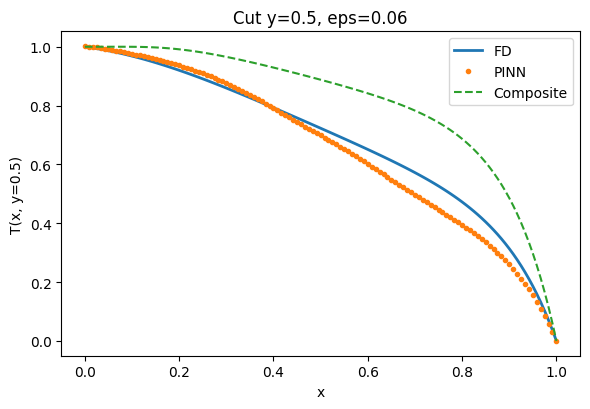

[eps=0.04|warm=True] Ep   25 | PDE 2.391e+00 | inlet*w 2.896e-01 | prior 6.253e-02 | Total 2.743e+00
[eps=0.04|warm=True] Ep   50 | PDE 7.663e-01 | inlet*w 2.322e-01 | prior 4.985e-02 | Total 1.048e+00
[eps=0.04|warm=True] Ep   75 | PDE 5.430e-01 | inlet*w 2.671e-01 | prior 4.334e-02 | Total 8.534e-01
[eps=0.04|warm=True] Ep  100 | PDE 4.184e-01 | inlet*w 3.749e-01 | prior 3.594e-02 | Total 8.293e-01
[eps=0.04|warm=True] Ep  125 | PDE 3.386e-01 | inlet*w 1.898e-01 | prior 2.932e-02 | Total 5.578e-01
[eps=0.04|warm=True] Ep  150 | PDE 2.697e-01 | inlet*w 1.980e-01 | prior 2.322e-02 | Total 4.909e-01
[eps=0.04|warm=True] Ep  175 | PDE 2.239e-01 | inlet*w 1.516e-01 | prior 1.767e-02 | Total 3.933e-01
[eps=0.04|warm=True] Ep  200 | PDE 1.821e-01 | inlet*w 1.500e-01 | prior 1.285e-02 | Total 3.449e-01
[eps=0.04|warm=True] Ep  300 | PDE 9.044e-02 | inlet*w 1.238e-01 | prior 3.237e-03 | Total 2.175e-01
[eps=0.04|warm=False] Ep   25 | PDE 2.521e-01 | inlet*w 3.802e-01 | prior 3.562e-02 | Total

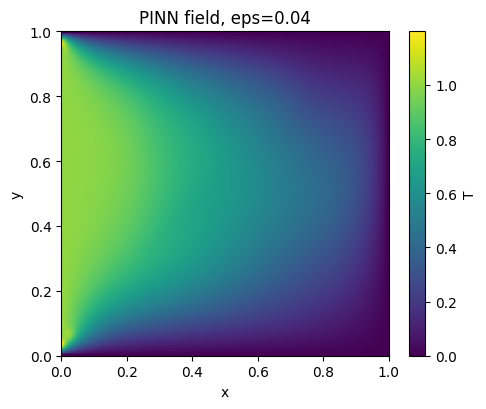

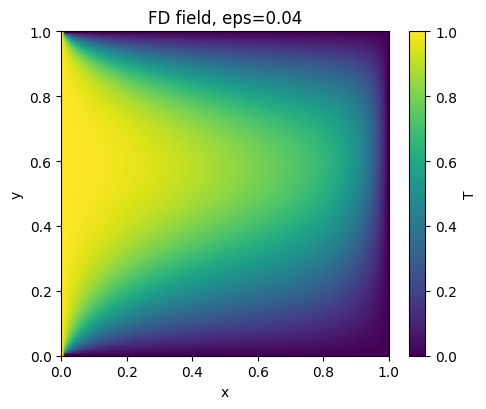

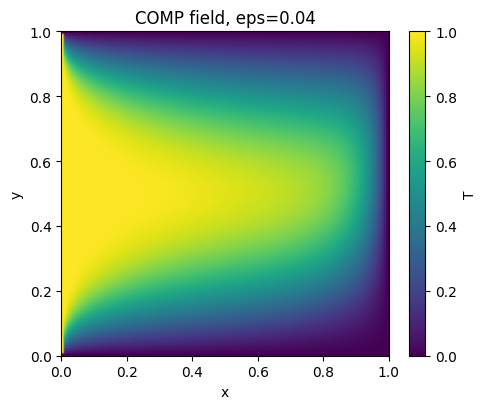

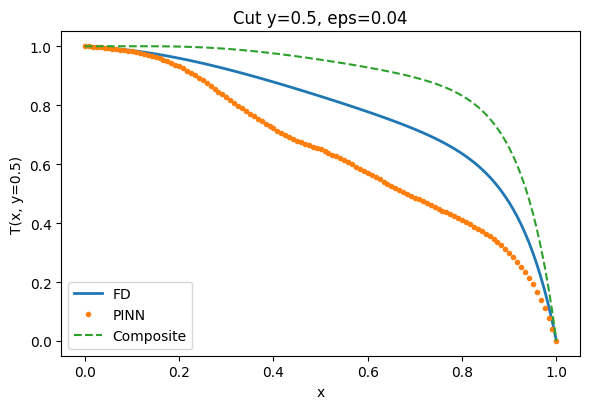


Tabla LaTeX (errores vs FD; global, núcleo y p99):
\begin{table}[H]
\centering
\caption{Errors of PINN and Composite against FD on a $121\times121$ grid. Core excludes one-cell boundary.}
\begin{tabular}{lcccccc}
\toprule
$\varepsilon$ & $L^2$ & $L^\infty$ & MAE & $L^2_{\text{core}}$ & $L^\infty_{\text{core}}$ & P99 \\
\midrule
\multicolumn{7}{l}{\textbf{PINN vs FD} ($\varepsilon=1$)} \\
 & 2.032e-02 & 1.000e+00 & 4.161e-03 & 1.047e-02 & 3.530e-01 & 1.986e-02 \\
\multicolumn{7}{l}{\textbf{Composite vs FD} ($\varepsilon=1$)} \\
 & 1.586e-01 & 1.000e+00 & 1.025e-01 & 1.608e-01 & 7.171e-01 & 4.919e-01 \\
\multicolumn{7}{l}{\textbf{PINN vs FD} ($\varepsilon=0.1$)} \\
 & 6.716e-02 & 1.000e+00 & 4.785e-02 & 6.655e-02 & 2.485e-01 & 1.633e-01 \\
\multicolumn{7}{l}{\textbf{Composite vs FD} ($\varepsilon=0.1$)} \\
 & 1.078e-01 & 1.000e+00 & 8.042e-02 & 1.090e-01 & 6.147e-01 & 3.042e-01 \\
\multicolumn{7}{l}{\textbf{PINN vs FD} ($\varepsilon=0.06$)} \\
 & 4.921e-02 & 1.000e+00 & 3.436e-02 & 4.78

In [ ]:
# %% PINN Couette FULL + Curriculum + Outlet-focus + RAR + Prior asintótico (híbrido)
import os, random
import numpy as np
import pandas as pd
import torch, torch.nn as nn, torch.optim as optim
import matplotlib.pyplot as plt
from scipy.sparse import lil_matrix, csc_matrix
from scipy.sparse.linalg import spsolve
from scipy.special import gammaincc

# ---------------- Configuración ----------------
CURRICULUM_EPS = [1.0, 0.1, 0.06, 0.04]   # warm-start
GRID_N   = 121
T0, Tw   = 1.0, 0.0
SEED     = 1234
SAVE_DIR = "/content/outputs"
os.makedirs(SAVE_DIR, exist_ok=True)

# Entrenamiento (OOM-safe)
NR_WARMUP, NB_WARMUP = 2000, 600
NR_MAIN,   NB_MAIN   = 7000, 1000
MICRO_WARMUP = 800
MICRO_MAIN   = 2000
EPOCHS_WARMUP = 300
EPOCHS_MAIN   = 5000
LBFGS_IT      = 600

# Red
WIDTH, DEPTH = 48, 4
MODEL_NAME   = "couette_hybrid"

# ===== Muestreo y pesos (más capa de salida) =====
INLET_MARGIN  = 0.05
STRIP_X0      = 0.02
BIAS_POW      = 10.0          # más sesgo a x→1
OUTLET_STRIPE = (0.90, 1.0)   # franja pegada a salida
FRAC_OUTLET   = 0.50          # 50% de puntos en la franja de salida
W_REGION      = 10.0          # peso PDE adicional en x>0.90

# RAR
RAR_ROUNDS = 2
RAR_POOL   = 20000
RAR_ADD    = 3000

# ===== Regularización suave hacia la compuesta (prior) =====
PRIOR_LAMBDA_MAX = 0.6    # peso inicial del prior
PRIOR_LAMBDA_MIN = 0.05   # peso final (casi apagado)
CORE_MARGIN_Y    = 0.10   # núcleo: y∈[0.10, 0.90]
CORE_MARGIN_XL   = 0.08   # evita inlet inmediato
CORE_MARGIN_XR   = 0.08   # evita outlet inmediato

# ---------------- Utilidades ----------------
def set_seed(s=SEED):
    random.seed(s); np.random.seed(s); torch.manual_seed(s)
set_seed()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

# Red + transform
class MLP(nn.Module):
    def __init__(self, in_dim=2, out_dim=1, width=WIDTH, depth=DEPTH):
        super().__init__()
        layers = [nn.Linear(in_dim, width), nn.Tanh()]
        for _ in range(depth-1):
            layers += [nn.Linear(width, width), nn.Tanh()]
        layers += [nn.Linear(width, out_dim)]
        self.net = nn.Sequential(*layers)
        for m in self.net:
            if isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight); nn.init.zeros_(m.bias)
    def forward(self, z):  # z en [-1,1]^2
        return self.net(z)

def output_transform(xy, raw):
    x = xy[:,0:1]; y = xy[:,1:2]
    g = (1.0 - x) * y * (1.0 - y)
    return Tw + g * raw

def to_net_coords(xy): return 2.0*xy - 1.0

def T_model(net, xy):
    z = to_net_coords(xy)
    return output_transform(xy, net(z))

# PDE residual y pérdida (con ponderación de región)
def pde_residual(net, xy, eps):
    xy = xy.clone().detach().requires_grad_(True)
    T  = T_model(net, xy)
    grads = torch.autograd.grad(T, xy, torch.ones_like(T), retain_graph=True, create_graph=True)[0]
    Tx, Ty = grads[:,0:1], grads[:,1:2]
    g2x = torch.autograd.grad(Tx, xy, torch.ones_like(Tx), retain_graph=True, create_graph=True)[0]
    g2y = torch.autograd.grad(Ty, xy, torch.ones_like(Ty), retain_graph=True, create_graph=True)[0]
    Txx, Tyy = g2x[:,0:1], g2y[:,1:2]
    eps = torch.as_tensor(eps, dtype=T.dtype, device=T.device)
    y   = xy[:,1:2]
    return y*Tx - eps*(Txx + Tyy)

def region_weight(xy):
    x = xy[:,0:1]
    w = torch.ones_like(x)
    w = w + (W_REGION-1.0)*(x > OUTLET_STRIPE[0]).float()  # mayor peso en x>0.90
    return w

def pde_loss_micro(net, XY, eps, micro):
    n = XY.shape[0]; total = XY.new_tensor(0.0); k=0
    for i in range(0, n, micro):
        X = XY[i:i+micro]
        R = pde_residual(net, X, eps)
        w = region_weight(X)
        total = total + torch.mean((w*R)**2)
        k+=1
    return total/max(k,1)

#def mse(a):
#    return torch.mean(a**2)
mse = lambda a: torch.mean(a**2)


# Muestreo (con franja de salida)
def sample_interior(N, device):
    N_out = int(N*FRAC_OUTLET)
    N_rest= N - N_out
    # frente
    N_front = N_rest//2
    x1 = torch.rand(N_front,1,device=device)*0.2
    y1 = torch.rand(N_front,1,device=device)
    # sesgo a x→1
    N_bias = N_rest - N_front
    u = torch.rand(N_bias,1,device=device); x2 = 1 - (1-u)**BIAS_POW
    y2 = torch.rand(N_bias,1,device=device)
    # franja salida
    xl, xr = OUTLET_STRIPE
    x3 = torch.rand(N_out,1,device=device)*(xr-xl)+xl
    y3 = torch.rand(N_out,1,device=device)
    X = torch.cat([x1,x2,x3], dim=0)
    Y = torch.cat([y1,y2,y3], dim=0)
    return torch.cat([X,Y], dim=1)

def bd_x0(N, device):
    x = torch.zeros(N,1,device=device)
    y = torch.rand(N,1,device=device)*(1-2*INLET_MARGIN)+INLET_MARGIN
    return torch.cat([x,y], dim=1)

def bd_strip_x0(N, device, x_max=STRIP_X0):
    x = torch.rand(N,1,device=device)*x_max
    y = torch.rand(N,1,device=device)*(1-2*INLET_MARGIN)+INLET_MARGIN
    return torch.cat([x,y], dim=1)

# RAR: añade puntos donde el residual es mayor (sin requires_grad aquí)
def rar_augment(net, eps, base_XY, add=RAR_ADD, pool=RAR_POOL):
    with torch.no_grad():
        XYpool = torch.rand(pool,2,device=device)  # uniforme
    # pde_residual ya activa grad en copia interna
    R = pde_residual(net, XYpool, eps).detach().abs().view(-1)
    idx = torch.topk(R, k=min(add, R.numel())).indices
    return torch.cat([base_XY, XYpool[idx]], dim=0)

# Composite (diagnóstico opcional)
def composite_couette(x_grid, y_grid, eps, h=1.0, T0=1.0, Tw=0.0, p=2):
    """
    Composite para y*T_x = eps*(T_xx + T_yy) con:
      x=0: T=T0, y=0,h: T=Tw, x=1: T=Tw.
    Usa Q(s,z)=gammaincc(s,z), unión de capas por inclusión–exclusión
    y ventana w(x)=x**p para la capa de salida. Devuelve [Nx,Ny] (ij).
    """
    X, Y = np.meshgrid(x_grid, y_grid, indexing='ij')
    s     = 1.0/3.0
    delta = 1e-12

    z1 = (Y**3)       / (3.0*eps*np.maximum(X, delta))  # pared inferior
    z2 = ((h - Y)**3) / (3.0*eps*np.maximum(X, delta))  # pared superior
    Qb = gammaincc(s, z1)
    Qt = gammaincc(s, z2)

    S = Qb + Qt - Qb*Qt
    core = 1.0 - S

    w = X**p
    outlet = np.exp(-(1.0 - X)*Y/eps)

    Tcomp = T0 + (Tw - T0) * ( S + w*outlet*core )
    return Tcomp

# ====== Prior suave hacia la compuesta (sólo en núcleo) ======
def core_window(xy):
    x = xy[:,0:1]; y = xy[:,1:2]
    m_y = (y > CORE_MARGIN_Y) & (y < 1.0-CORE_MARGIN_Y)
    m_x = (x > CORE_MARGIN_XL) & (x < 1.0-CORE_MARGIN_XR)
    return (m_x & m_y).float()

def prior_loss_to_composite(net, xy, eps, xs_np, ys_np, Tcomp_np):
    """
    Interpola T_comp en (xy) y penaliza sólo en el núcleo (ventana).
    """
    with torch.no_grad():
        xs = torch.tensor(xs_np, dtype=torch.float32, device=xy.device)
        ys = torch.tensor(ys_np, dtype=torch.float32, device=xy.device)
        Tcomp = torch.tensor(Tcomp_np, dtype=torch.float32, device=xy.device)  # [Nx,Ny]

    x = xy[:,0]; y = xy[:,1]
    Nx, Ny = xs.numel(), ys.numel()
    hx = xs[1]-xs[0]; hy = ys[1]-ys[0]

    ix = torch.clamp(((x/xs[-1])*(Nx-1)).floor().long(), 0, Nx-2)
    iy = torch.clamp(((y/ys[-1])*(Ny-1)).floor().long(), 0, Ny-2)
    tx = (x - xs[ix])/(hx+1e-12); ty = (y - ys[iy])/(hy+1e-12)

    def G(i,j): return Tcomp[i, j]
    Tc = ( (1-tx)*(1-ty)*G(ix,   iy)   + tx*(1-ty)*G(ix+1, iy)
         + (1-tx)*ty*G(ix,   iy+1)     + tx*ty*G(ix+1, iy+1) ).unsqueeze(1)

    Tpred = T_model(net, xy)
    wcore = core_window(xy)
    return torch.sum(wcore * (Tpred - Tc)**2) / (torch.sum(wcore)+1e-12)

# FD de referencia (difusión central + upwind en x)
def solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N):
    xs = np.linspace(0,1,Nx); ys = np.linspace(0,1,Ny)
    hx = xs[1]-xs[0]; hy = ys[1]-ys[0]
    def idx(i,j): return j*Nx + i
    N = Nx*Ny
    A = lil_matrix((N,N), dtype=float)
    b = np.zeros(N, dtype=float)
    for j in range(Ny):
        y = ys[j]
        for i in range(Nx):
            k = idx(i,j)
            if i==0:      A[k,k]=1; b[k]=1;  continue
            if i==Nx-1:   A[k,k]=1; b[k]=0;  continue
            if j==0 or j==Ny-1: A[k,k]=1; b[k]=0; continue
            cx = eps/(hx*hx); cy = eps/(hy*hy); conv = y/hx
            A[k, idx(i-1,j)] += ( cx + conv)   # upwind
            A[k, idx(i+1,j)] += ( cx)
            A[k, idx(i,  j-1)] += ( cy)
            A[k, idx(i,  j+1)] += ( cy)
            A[k, k]           += (-2*cx - 2*cy - conv)
    T = spsolve(csc_matrix(A), b).reshape(Ny, Nx)
    return np.array(T.T, dtype=np.float64)

# Métricas robustas
def metrics_all(Tp, Tr):
    E = Tp - Tr
    L2   = float(np.sqrt(np.mean(E**2)))
    Linf = float(np.max(np.abs(E)))
    MAE  = float(np.mean(np.abs(E)))
    core = (slice(1,-1), slice(1,-1))
    Ec   = E[core]
    L2c   = float(np.sqrt(np.mean(Ec**2)))
    Linfc = float(np.max(np.abs(Ec)))
    MAEc  = float(np.mean(np.abs(Ec)))
    p99   = float(np.percentile(np.abs(E).ravel(), 99))
    return dict(L2=L2, Linf=Linf, MAE=MAE, L2_core=L2c, Linf_core=Linfc, MAE_core=MAEc, P99=p99)

def should_log(ep, total):
    if ep<=200: return ep%25==0
    if ep<=1000:return ep%100==0
    return ep%max(total//12,500)==0

# Entrena una fase (con RAR y prior con annealing)
def train_phase(net, eps, NR, NB, MICRO, EPOCHS, W_INLET, do_rar=False):
    opt = optim.Adam(net.parameters(), lr=1e-3)
    XYr = sample_interior(NR, device)

    # precomputo del campo compuesto para el prior
    xs_np = np.linspace(0,1,GRID_N); ys_np = np.linspace(0,1,GRID_N)
    Tcomp_np = composite_couette(xs_np, ys_np, eps)

    for ep in range(1, EPOCHS+1):
        if do_rar and ep in [int(EPOCHS*0.4), int(EPOCHS*0.75)]:
            XYr = rar_augment(net, eps, XYr, add=RAR_ADD, pool=RAR_POOL)

        X0  = bd_x0(NB, device)
        X0s = bd_strip_x0(NB, device, x_max=STRIP_X0)

        # --- grafos independientes para cada término ---
        loss_pde = pde_loss_micro(net, XYr, eps, micro=MICRO)
        loss_bc  = mse(T_model(net, X0)-T0) + mse(T_model(net, X0s)-T0)

        XY_prior   = XYr.detach()  # evita reusar grafo del PDE
        loss_prior = prior_loss_to_composite(net, XY_prior, eps, xs_np, ys_np, Tcomp_np)

        # annealing del prior
        alpha = 0.5*(1 + np.cos(np.pi*min(ep/EPOCHS,1.0)))
        lam_prior = PRIOR_LAMBDA_MIN + (PRIOR_LAMBDA_MAX - PRIOR_LAMBDA_MIN)*alpha

        loss = loss_pde + W_INLET*loss_bc + lam_prior*loss_prior

        opt.zero_grad()
        loss.backward()
        opt.step()

        if should_log(ep, EPOCHS):
            print(f"[eps={eps:.3g}|warm={NR==NR_WARMUP}] Ep {ep:4d} | PDE {loss_pde.item():.3e} "
                  f"| inlet*w {W_INLET*loss_bc.item():.3e} | prior {lam_prior*loss_prior.item():.3e} "
                  f"| Total {loss.item():.3e}")

# Ejecuta un caso con warm-up → main → L-BFGS
def run_case(eps, init_state_dict=None):
    set_seed()
    net = MLP().to(device)
    if init_state_dict is not None:
        net.load_state_dict(init_state_dict)

    W_INLET = 50.0 if eps>=0.5 else 100.0

    # warm-up (sin RAR)
    train_phase(net, eps, NR_WARMUP, NB_WARMUP, MICRO_WARMUP, EPOCHS_WARMUP, W_INLET, do_rar=False)
    # fase principal (con RAR)
    train_phase(net, eps, NR_MAIN, NB_MAIN, MICRO_MAIN, EPOCHS_MAIN, W_INLET, do_rar=True)

    # L-BFGS: recompone grafo en cada closure + prior pequeño
    XYc  = sample_interior(4000, device).detach()
    X0c  = bd_x0(NB_MAIN, device).detach()
    X0sc = bd_strip_x0(NB_MAIN, device, x_max=STRIP_X0).detach()

    xs_np = np.linspace(0,1,GRID_N); ys_np = np.linspace(0,1,GRID_N)
    Tcomp_np = composite_couette(xs_np, ys_np, eps)
    LBF_PRIOR = 0.05

    opt2 = optim.LBFGS(net.parameters(), lr=1.0, max_iter=LBFGS_IT, history_size=50, line_search_fn="strong_wolfe")
    def closure():
        opt2.zero_grad()
        loss = pde_loss_micro(net, XYc, eps, micro=MICRO_MAIN) \
             + W_INLET*mse(T_model(net, X0c)-T0) + W_INLET*mse(T_model(net, X0sc)-T0) \
             + LBF_PRIOR*prior_loss_to_composite(net, XYc, eps, xs_np, ys_np, Tcomp_np)
        loss.backward()
        return loss
    print(f"[eps={eps:.3g}] L-BFGS x{LBFGS_IT}..."); opt2.step(closure)

    # Evaluación vs FD + figuras
    xs = np.linspace(0,1,GRID_N); ys = np.linspace(0,1,GRID_N)
    xs_t = torch.tensor(xs, dtype=torch.float32, device=device)
    ys_t = torch.tensor(ys, dtype=torch.float32, device=device)
    Xg, Yg = torch.meshgrid(xs_t, ys_t, indexing='ij')
    XY = torch.stack([Xg.reshape(-1), Yg.reshape(-1)], dim=1)
    with torch.no_grad():
        Tpred = T_model(net, XY).reshape(GRID_N, GRID_N).cpu().numpy()
    Tfd = solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N)
    Tcomp = composite_couette(xs, ys, eps)

    m_pinn = metrics_all(Tpred, Tfd)
    m_comp = metrics_all(Tcomp, Tfd)
    print(f"[eps={eps:.3g}] PINN vs FD -> {m_pinn}")
    print(f"[eps={eps:.3g}] COMP vs FD -> {m_comp}")

    # Guardar CSV + mapas + corte
    pd.DataFrame(Tpred, index=xs, columns=ys).to_csv(f"{SAVE_DIR}/T_PINN_eps_{eps:.3g}_{MODEL_NAME}.csv", float_format="%.6f")
    pd.DataFrame(Tfd,   index=xs, columns=ys).to_csv(f"{SAVE_DIR}/T_FD_eps_{eps:.3g}.csv", float_format="%.6f")
    pd.DataFrame(Tcomp, index=xs, columns=ys).to_csv(f"{SAVE_DIR}/T_Composite_eps_{eps:.3g}.csv", float_format="%.6f")

    for tag, Tmat in [("PINN",Tpred), ("FD",Tfd), ("COMP",Tcomp)]:
        plt.figure(figsize=(5.0,4.2))
        im=plt.imshow(Tmat.T, origin='lower', extent=[0,1,0,1], aspect='auto')
        plt.colorbar(im,label='T'); plt.xlabel('x'); plt.ylabel('y'); plt.title(f'{tag} field, eps={eps}')
        plt.tight_layout(); plt.savefig(f"{SAVE_DIR}/{tag}_field_eps_{eps:.3g}.png", dpi=140); plt.show()

    jmid = GRID_N//2
    plt.figure(figsize=(6.0,4.2))
    plt.plot(xs, Tfd[:,jmid], '-',  lw=2, label='FD')
    plt.plot(xs, Tpred[:,jmid], 'o', ms=3, label='PINN')
    plt.plot(xs, Tcomp[:,jmid], '--', lw=1.5, label='Composite')
    plt.xlabel('x'); plt.ylabel('T(x, y=0.5)'); plt.title(f'Cut y=0.5, eps={eps}')
    plt.legend(); plt.tight_layout(); plt.savefig(f"{SAVE_DIR}/cut_y05_eps_{eps:.3g}.png", dpi=150); plt.show()

    if torch.cuda.is_available(): torch.cuda.empty_cache()
    return net.state_dict(), m_pinn, m_comp

# ---------------- Loop curriculum (warm-start) + tabla ----------------
results = []
state = None
for eps in CURRICULUM_EPS:
    print("="*72)
    state, m_pinn, m_comp = run_case(eps, init_state_dict=state)
    results.append((eps, m_pinn, m_comp))

print("\nTabla LaTeX (errores vs FD; global, núcleo y p99):")
print(r"\begin{table}[H]")
print(r"\centering")
print(r"\caption{Errors of PINN and Composite against FD on a $121\times121$ grid. Core excludes one-cell boundary.}")
print(r"\begin{tabular}{lcccccc}")
print(r"\toprule")
print(r"$\varepsilon$ & $L^2$ & $L^\infty$ & MAE & $L^2_{\text{core}}$ & $L^\infty_{\text{core}}$ & P99 \\")
print(r"\midrule")
for eps, m_pinn, m_comp in results:
    print(rf"\multicolumn{{7}}{{l}}{{\textbf{{PINN vs FD}} ($\varepsilon={eps:g}$)}} \\")
    print(rf" & {m_pinn['L2']:.3e} & {m_pinn['Linf']:.3e} & {m_pinn['MAE']:.3e} & {m_pinn['L2_core']:.3e} & {m_pinn['Linf_core']:.3e} & {m_pinn['P99']:.3e} \\")
    print(rf"\multicolumn{{7}}{{l}}{{\textbf{{Composite vs FD}} ($\varepsilon={eps:g}$)}} \\")
    print(rf" & {m_comp['L2']:.3e} & {m_comp['Linf']:.3e} & {m_comp['MAE']:.3e} & {m_comp['L2_core']:.3e} & {m_comp['Linf_core']:.3e} & {m_comp['P99']:.3e} \\")
print(r"\bottomrule")
print(r"\end{tabular}")
print(r"\end{table}")


In [ ]:
# %% PINN Couette FULL + Curriculum + Outlet-focus + RAR + Prior asintótico (híbrido) — CORREGIDO
import os, random
import numpy as np
import pandas as pd
import torch, torch.nn as nn, torch.optim as optim
import matplotlib.pyplot as plt
from scipy.sparse import lil_matrix, csc_matrix
from scipy.sparse.linalg import spsolve
from scipy.special import gammaincc

# ---------------- Configuración ----------------
CURRICULUM_EPS = [1.0, 0.1, 0.06, 0.04]   # warm-start
GRID_N   = 121
T0, Tw   = 1.0, 0.0
SEED     = 1234
SAVE_DIR = "/content/outputs"
os.makedirs(SAVE_DIR, exist_ok=True)

# Entrenamiento (OOM-safe)
NR_WARMUP, NB_WARMUP = 2000, 600
NR_MAIN,   NB_MAIN   = 7000, 1000
MICRO_WARMUP = 800
MICRO_MAIN   = 2000
EPOCHS_WARMUP = 300
EPOCHS_MAIN   = 5000
LBFGS_IT      = 600

# Red
WIDTH, DEPTH = 48, 4
MODEL_NAME   = "couette_hybrid"

# ===== Muestreo y pesos =====
INLET_MARGIN  = 0.05
STRIP_X0      = 0.02
BIAS_POW      = 10.0
OUTLET_STRIPE = (0.90, 1.0)
FRAC_OUTLET   = 0.50
W_REGION      = 10.0

# RAR
RAR_POOL   = 20000
RAR_ADD    = 3000

# ===== Prior suave hacia la compuesta =====
PRIOR_LAMBDA_MAX = 0.6
PRIOR_LAMBDA_MIN = 0.05
CORE_MARGIN_Y    = 0.10
CORE_MARGIN_XL   = 0.08
CORE_MARGIN_XR   = 0.08

# ---------------- Utilidades ----------------
def set_seed(s=SEED):
    random.seed(s); np.random.seed(s); torch.manual_seed(s)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(s)

set_seed()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

mse = lambda a: torch.mean(a**2)

# ---------------- Red ----------------
class MLP(nn.Module):
    def __init__(self, in_dim=2, out_dim=1, width=WIDTH, depth=DEPTH):
        super().__init__()
        layers = [nn.Linear(in_dim, width), nn.Tanh()]
        for _ in range(depth-1):
            layers += [nn.Linear(width, width), nn.Tanh()]
        layers += [nn.Linear(width, out_dim)]
        self.net = nn.Sequential(*layers)
        for m in self.net:
            if isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight); nn.init.zeros_(m.bias)
    def forward(self, z):
        return self.net(z)

def to_net_coords(xy):
    return 2.0*xy - 1.0

# Ventana suave en y para inlet (solo eps pequeños/intermedios)
def phi_inlet_y(y, eps, m=INLET_MARGIN, s=0.10):
    if float(eps) >= 0.3:
        return torch.ones_like(y)
    return torch.sigmoid((y - m)/s) * torch.sigmoid(((1.0 - m) - y)/s)

# ---- Output transform (CORREGIDO: acotación con tanh) ----
def output_transform(xy, raw, eps):
    x = xy[:,0:1]
    y = xy[:,1:2]

    # corrector que NO altera BC (se anula en x=0, x=1, y=0, y=1)
    if float(eps) <= 0.2:
        g = 0.5 * x*(1.0-x)*y*(1.0-y)   # más suave para eps intermedio/pequeño
    else:
        g = x*(1.0-x)*y*(1.0-y)

    # eps grande: no impongas un "base" que sesgue demasiado; aprende con corrector acotado
    if float(eps) >= 0.3:
        return g * torch.tanh(raw)

    # eps pequeño/intermedio: inlet suave + corrector acotado
    phi = phi_inlet_y(y, eps)
    base = Tw + (1.0 - x) * (T0 - Tw) * phi
    return base + g * torch.tanh(raw)

def T_model(net, xy, eps):
    z = to_net_coords(xy)
    return output_transform(xy, net(z), eps)

# ---------------- PDE residual ----------------
def pde_residual(net, xy, eps):
    xy = xy.clone().detach().requires_grad_(True)
    T  = T_model(net, xy, eps)
    grads = torch.autograd.grad(T, xy, torch.ones_like(T), retain_graph=True, create_graph=True)[0]
    Tx, Ty = grads[:,0:1], grads[:,1:2]
    g2x = torch.autograd.grad(Tx, xy, torch.ones_like(Tx), retain_graph=True, create_graph=True)[0]
    g2y = torch.autograd.grad(Ty, xy, torch.ones_like(Ty), retain_graph=True, create_graph=True)[0]
    Txx, Tyy = g2x[:,0:1], g2y[:,1:2]
    eps_t = torch.as_tensor(eps, dtype=T.dtype, device=T.device)
    y = xy[:,1:2]
    return y*Tx - eps_t*(Txx + Tyy)

def region_weight(xy):
    x = xy[:,0:1]
    w = torch.ones_like(x)
    w = w + (W_REGION-1.0)*(x > OUTLET_STRIPE[0]).float()
    return w

def pde_loss_micro(net, XY, eps, micro):
    n = XY.shape[0]
    total = XY.new_tensor(0.0)
    k = 0
    for i in range(0, n, micro):
        X = XY[i:i+micro]
        R = pde_residual(net, X, eps)
        w = region_weight(X)
        total = total + torch.mean((w*R)**2)
        k += 1
    return total / max(k,1)

# ---------------- Muestreo ----------------
def sample_interior(N, device):
    N_out  = int(N*FRAC_OUTLET)
    N_rest = N - N_out

    N_front = N_rest//2
    x1 = torch.rand(N_front,1,device=device)*0.2
    y1 = torch.rand(N_front,1,device=device)

    N_bias = N_rest - N_front
    u = torch.rand(N_bias,1,device=device)
    x2 = 1 - (1-u)**BIAS_POW
    y2 = torch.rand(N_bias,1,device=device)

    xl, xr = OUTLET_STRIPE
    x3 = torch.rand(N_out,1,device=device)*(xr-xl)+xl
    y3 = torch.rand(N_out,1,device=device)

    X = torch.cat([x1,x2,x3], dim=0)
    Y = torch.cat([y1,y2,y3], dim=0)
    return torch.cat([X,Y], dim=1)

def bd_x0(N, device):
    x = torch.zeros(N,1,device=device)
    y = torch.rand(N,1,device=device)*(1-2*INLET_MARGIN)+INLET_MARGIN
    return torch.cat([x,y], dim=1)

def bd_strip_x0(N, device, x_max=STRIP_X0):
    x = torch.rand(N,1,device=device)*x_max
    y = torch.rand(N,1,device=device)*(1-2*INLET_MARGIN)+INLET_MARGIN
    return torch.cat([x,y], dim=1)

# ---------------- RAR ----------------
def rar_augment(net, eps, base_XY, add=RAR_ADD, pool=RAR_POOL):
    with torch.no_grad():
        XYpool = torch.rand(pool,2,device=device)
    R = pde_residual(net, XYpool, eps).detach().abs().view(-1)
    idx = torch.topk(R, k=min(add, R.numel())).indices
    return torch.cat([base_XY, XYpool[idx]], dim=0).detach()

# ---------------- Composite (diagnóstico/prior) ----------------
def composite_couette(x_grid, y_grid, eps, h=1.0, T0=1.0, Tw=0.0, p=2):
    X, Y = np.meshgrid(x_grid, y_grid, indexing='ij')
    s = 1.0/3.0
    delta = 1e-12
    z1 = (Y**3)       / (3.0*eps*np.maximum(X, delta))
    z2 = ((h - Y)**3) / (3.0*eps*np.maximum(X, delta))
    Qb = gammaincc(s, z1)
    Qt = gammaincc(s, z2)
    S = Qb + Qt - Qb*Qt
    core = 1.0 - S
    w = X**p
    outlet = np.exp(-(1.0 - X)*Y/eps)
    Tcomp = T0 + (Tw - T0) * ( S + w*outlet*core )
    return Tcomp

def core_window(xy):
    x = xy[:,0:1]; y = xy[:,1:2]
    m_y = (y > CORE_MARGIN_Y) & (y < 1.0-CORE_MARGIN_Y)
    m_x = (x > CORE_MARGIN_XL) & (x < 1.0-CORE_MARGIN_XR)
    return (m_x & m_y).float()

def prior_loss_to_composite(net, xy, eps, xs_np, ys_np, Tcomp_np):
    # bilinear interp de Tcomp en puntos xy; penaliza solo core
    xs = torch.tensor(xs_np, dtype=torch.float32, device=xy.device)
    ys = torch.tensor(ys_np, dtype=torch.float32, device=xy.device)
    Tcomp = torch.tensor(Tcomp_np, dtype=torch.float32, device=xy.device)

    x = xy[:,0]; y = xy[:,1]
    Nx, Ny = xs.numel(), ys.numel()
    hx = xs[1]-xs[0]; hy = ys[1]-ys[0]

    ix = torch.clamp(((x - xs[0])/(xs[-1]-xs[0]+1e-12)*(Nx-1)).floor().long(), 0, Nx-2)
    iy = torch.clamp(((y - ys[0])/(ys[-1]-ys[0]+1e-12)*(Ny-1)).floor().long(), 0, Ny-2)
    tx = (x - xs[ix])/(hx+1e-12)
    ty = (y - ys[iy])/(hy+1e-12)

    Tc = ((1-tx)*(1-ty)*Tcomp[ix,   iy]   + tx*(1-ty)*Tcomp[ix+1, iy] +
          (1-tx)*ty*Tcomp[ix,   iy+1]     + tx*ty*Tcomp[ix+1, iy+1]).unsqueeze(1)

    Tpred = T_model(net, xy, eps)
    wcore = core_window(xy)
    return torch.sum(wcore*(Tpred - Tc)**2) / (torch.sum(wcore)+1e-12)

# ---------------- FD referencia ----------------
def solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N):
    xs = np.linspace(0,1,Nx); ys = np.linspace(0,1,Ny)
    hx = xs[1]-xs[0]; hy = ys[1]-ys[0]
    def idx(i,j): return j*Nx + i
    N = Nx*Ny
    A = lil_matrix((N,N), dtype=float)
    b = np.zeros(N, dtype=float)
    for j in range(Ny):
        y = ys[j]
        for i in range(Nx):
            k = idx(i,j)
            if i==0:      A[k,k]=1; b[k]=T0; continue
            if i==Nx-1:   A[k,k]=1; b[k]=Tw; continue
            if j==0 or j==Ny-1: A[k,k]=1; b[k]=Tw; continue
            cx = eps/(hx*hx); cy = eps/(hy*hy); conv = y/hx
            # upwind en x para el término convectivo
            A[k, idx(i-1,j)] += ( cx + conv)
            A[k, idx(i+1,j)] += ( cx)
            A[k, idx(i,  j-1)] += ( cy)
            A[k, idx(i,  j+1)] += ( cy)
            A[k, k] += (-2*cx - 2*cy - conv)
    T = spsolve(csc_matrix(A), b).reshape(Ny, Nx)
    return np.array(T.T, dtype=np.float64)

# ---------------- Métricas ----------------
def metrics_all(Tp, Tr):
    E = Tp - Tr
    L2   = float(np.sqrt(np.mean(E**2)))
    Linf = float(np.max(np.abs(E)))
    MAE  = float(np.mean(np.abs(E)))
    core = (slice(1,-1), slice(1,-1))
    Ec   = E[core]
    L2c   = float(np.sqrt(np.mean(Ec**2)))
    Linfc = float(np.max(np.abs(Ec)))
    MAEc  = float(np.mean(np.abs(Ec)))
    p99   = float(np.percentile(np.abs(E).ravel(), 99))
    return dict(L2=L2, Linf=Linf, MAE=MAE, L2_core=L2c, Linf_core=Linfc, MAE_core=MAEc, P99=p99)

def should_log(ep, total):
    if ep<=200: return ep%25==0
    if ep<=1000:return ep%100==0
    return ep%max(total//12,500)==0

# ---------------- Entrenamiento por fase ----------------
def train_phase(net, eps, NR, NB, MICRO, EPOCHS, W_INLET, do_rar=False):
    opt = optim.Adam(net.parameters(), lr=1e-3)
    XYr = sample_interior(NR, device)

    xs_np = np.linspace(0,1,GRID_N); ys_np = np.linspace(0,1,GRID_N)
    Tcomp_np = composite_couette(xs_np, ys_np, eps)  # prior (solo si eps<=0.06)

    for ep in range(1, EPOCHS+1):
        if do_rar and ep in [int(EPOCHS*0.4), int(EPOCHS*0.75)]:
            XYr = rar_augment(net, eps, XYr, add=RAR_ADD, pool=RAR_POOL)

        X0  = bd_x0(NB, device)
        X0s = bd_strip_x0(NB, device, x_max=STRIP_X0)

        loss_pde = pde_loss_micro(net, XYr, eps, micro=MICRO)

        # inlet: en x=0 y franja x<STRIP_X0
        loss_bc  = mse(T_model(net, X0,  eps) - T0) + mse(T_model(net, X0s, eps) - T0)

        # prior: solo eps pequeños
        if float(eps) <= 0.06:
            XY_prior = XYr.detach()
            loss_prior = prior_loss_to_composite(net, XY_prior, eps, xs_np, ys_np, Tcomp_np)
            alpha = 0.5*(1 + np.cos(np.pi*min(ep/EPOCHS,1.0)))
            lam_prior = PRIOR_LAMBDA_MIN + (PRIOR_LAMBDA_MAX - PRIOR_LAMBDA_MIN)*alpha
        else:
            loss_prior = XYr.new_tensor(0.0)
            lam_prior = 0.0

        loss = loss_pde + W_INLET*loss_bc + lam_prior*loss_prior

        opt.zero_grad()
        loss.backward()
        opt.step()

        if should_log(ep, EPOCHS):
            print(f"[eps={eps:.3g}|warm={NR==NR_WARMUP}] Ep {ep:4d} | PDE {loss_pde.item():.3e} "
                  f"| inlet*w {W_INLET*loss_bc.item():.3e} | prior {lam_prior*loss_prior.item():.3e} "
                  f"| Total {loss.item():.3e}")

# ---------------- Run case: warm-up → main → L-BFGS ----------------
def run_case(eps, init_state_dict=None):
    set_seed()
    net = MLP().to(device)
    if init_state_dict is not None:
        net.load_state_dict(init_state_dict)

    # pesos de inlet (moderados; ya no necesitamos 100)
    W_INLET = 5.0 if float(eps)>=0.5 else 10.0

    train_phase(net, eps, NR_WARMUP, NB_WARMUP, MICRO_WARMUP, EPOCHS_WARMUP, W_INLET, do_rar=False)
    train_phase(net, eps, NR_MAIN,   NB_MAIN,   MICRO_MAIN,   EPOCHS_MAIN,   W_INLET, do_rar=True)

    # L-BFGS (prior solo eps pequeños)
    XYc  = sample_interior(4000, device).detach()
    X0c  = bd_x0(NB_MAIN, device).detach()
    X0sc = bd_strip_x0(NB_MAIN, device, x_max=STRIP_X0).detach()

    xs_np = np.linspace(0,1,GRID_N); ys_np = np.linspace(0,1,GRID_N)
    Tcomp_np = composite_couette(xs_np, ys_np, eps)
    LBF_PRIOR = 0.05 if float(eps) <= 0.06 else 0.0

    opt2 = optim.LBFGS(net.parameters(), lr=1.0, max_iter=LBFGS_IT,
                       history_size=50, line_search_fn="strong_wolfe")

    def closure():
        opt2.zero_grad()
        loss = pde_loss_micro(net, XYc, eps, micro=MICRO_MAIN) \
             + W_INLET*mse(T_model(net, X0c,  eps)-T0) \
             + W_INLET*mse(T_model(net, X0sc, eps)-T0)
        if LBF_PRIOR > 0:
            loss = loss + LBF_PRIOR*prior_loss_to_composite(net, XYc, eps, xs_np, ys_np, Tcomp_np)
        loss.backward()
        return loss

    print(f"[eps={eps:.3g}] L-BFGS x{LBFGS_IT}...")
    opt2.step(closure)

    # Evaluación vs FD + figuras
    xs = np.linspace(0,1,GRID_N); ys = np.linspace(0,1,GRID_N)
    xs_t = torch.tensor(xs, dtype=torch.float32, device=device)
    ys_t = torch.tensor(ys, dtype=torch.float32, device=device)
    Xg, Yg = torch.meshgrid(xs_t, ys_t, indexing='ij')
    XY = torch.stack([Xg.reshape(-1), Yg.reshape(-1)], dim=1)

    with torch.no_grad():
        Tpred = T_model(net, XY, eps).reshape(GRID_N, GRID_N).cpu().numpy()

    Tfd   = solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N)
    Tcomp = composite_couette(xs, ys, eps)

    m_pinn = metrics_all(Tpred, Tfd)
    m_comp = metrics_all(Tcomp, Tfd)
    print(f"[eps={eps:.3g}] PINN vs FD -> {m_pinn}")
    print(f"[eps={eps:.3g}] COMP vs FD -> {m_comp}")

    # Guardar
    pd.DataFrame(Tpred, index=xs, columns=ys).to_csv(f"{SAVE_DIR}/T_PINN_eps_{eps:.3g}_{MODEL_NAME}.csv", float_format="%.6f")
    pd.DataFrame(Tfd,   index=xs, columns=ys).to_csv(f"{SAVE_DIR}/T_FD_eps_{eps:.3g}.csv", float_format="%.6f")
    pd.DataFrame(Tcomp, index=xs, columns=ys).to_csv(f"{SAVE_DIR}/T_Composite_eps_{eps:.3g}.csv", float_format="%.6f")

    for tag, Tmat in [("PINN",Tpred), ("FD",Tfd), ("COMP",Tcomp)]:
        plt.figure(figsize=(5.0,4.2))
        im = plt.imshow(Tmat.T, origin='lower', extent=[0,1,0,1], aspect='auto')
        plt.colorbar(im,label='T'); plt.xlabel('x'); plt.ylabel('y')
        plt.title(f'{tag} field, eps={eps}')
        plt.tight_layout()
        plt.savefig(f"{SAVE_DIR}/{tag}_field_eps_{eps:.3g}.png", dpi=140)
        plt.show()

    jmid = GRID_N//2
    plt.figure(figsize=(6.0,4.2))
    plt.plot(xs, Tfd[:,jmid], '-',  lw=2, label='FD')
    plt.plot(xs, Tpred[:,jmid], 'o', ms=3, label='PINN')
    plt.plot(xs, Tcomp[:,jmid], '--', lw=1.5, label='Composite')
    plt.xlabel('x'); plt.ylabel('T(x, y=0.5)')
    plt.title(f'Cut y=0.5, eps={eps}')
    plt.legend()
    plt.tight_layout()
    plt.savefig(f"{SAVE_DIR}/cut_y05_eps_{eps:.3g}.png", dpi=150)
    plt.show()

    if torch.cuda.is_available(): torch.cuda.empty_cache()
    return net.state_dict(), m_pinn, m_comp

# ---------------- Loop curriculum ----------------
results = []
state = None
for eps in CURRICULUM_EPS:
    print("="*72)
    state, m_pinn, m_comp = run_case(eps, init_state_dict=state)
    results.append((eps, m_pinn, m_comp))

print("\nTabla LaTeX (errores vs FD; global, núcleo y p99):")
print(r"\begin{table}[H]")
print(r"\centering")
print(r"\caption{Errors of PINN and Composite against FD on a $121\times121$ grid. Core excludes one-cell boundary.}")
print(r"\begin{tabular}{lcccccc}")
print(r"\toprule")
print(r"$\varepsilon$ & $L^2$ & $L^\infty$ & MAE & $L^2_{\text{core}}$ & $L^\infty_{\text{core}}$ & P99 \\")
print(r"\midrule")
for eps, m_pinn, m_comp in results:
    print(rf"\multicolumn{{7}}{{l}}{{\textbf{{PINN vs FD}} ($\varepsilon={eps:g}$)}} \\")
    print(rf" & {m_pinn['L2']:.3e} & {m_pinn['Linf']:.3e} & {m_pinn['MAE']:.3e} & {m_pinn['L2_core']:.3e} & {m_pinn['Linf_core']:.3e} & {m_pinn['P99']:.3e} \\")
    print(rf"\multicolumn{{7}}{{l}}{{\textbf{{Composite vs FD}} ($\varepsilon={eps:g}$)}} \\")
    print(rf" & {m_comp['L2']:.3e} & {m_comp['Linf']:.3e} & {m_comp['MAE']:.3e} & {m_comp['L2_core']:.3e} & {m_comp['Linf_core']:.3e} & {m_comp['P99']:.3e} \\")
print(r"\bottomrule")
print(r"\end{tabular}")
print(r"\end{table}")


Device: cuda


KeyboardInterrupt: 

Device: cuda
[eps=1|warm=True] Ep   25 | PDE 1.095e+01 | inlet*w 5.112e+01 | Total 6.207e+01
[eps=1|warm=True] Ep   50 | PDE 1.744e+01 | inlet*w 1.265e+01 | Total 3.009e+01
[eps=1|warm=True] Ep   75 | PDE 1.240e+01 | inlet*w 1.716e+01 | Total 2.956e+01
[eps=1|warm=True] Ep  100 | PDE 1.316e+01 | inlet*w 1.540e+01 | Total 2.855e+01
[eps=1|warm=True] Ep  125 | PDE 1.199e+01 | inlet*w 1.449e+01 | Total 2.648e+01
[eps=1|warm=True] Ep  150 | PDE 7.336e+00 | inlet*w 1.199e+01 | Total 1.933e+01
[eps=1|warm=True] Ep  175 | PDE 1.230e+00 | inlet*w 1.113e+01 | Total 1.236e+01
[eps=1|warm=True] Ep  200 | PDE 4.870e-01 | inlet*w 1.124e+01 | Total 1.173e+01
[eps=1|warm=True] Ep  300 | PDE 3.875e-01 | inlet*w 1.063e+01 | Total 1.102e+01
[eps=1|warm=False] Ep   25 | PDE 4.103e-01 | inlet*w 1.119e+01 | Total 1.160e+01
[eps=1|warm=False] Ep   50 | PDE 3.905e-01 | inlet*w 1.041e+01 | Total 1.080e+01
[eps=1|warm=False] Ep   75 | PDE 3.775e-01 | inlet*w 1.106e+01 | Total 1.144e+01
[eps=1|warm=False] Ep  1

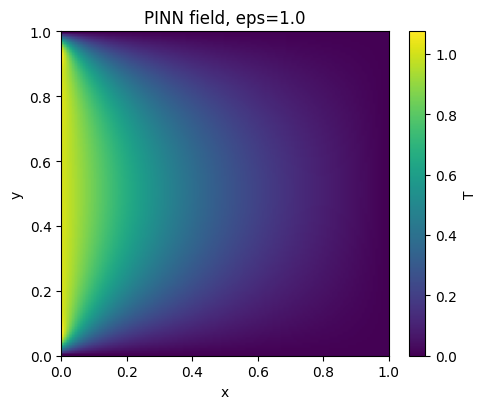

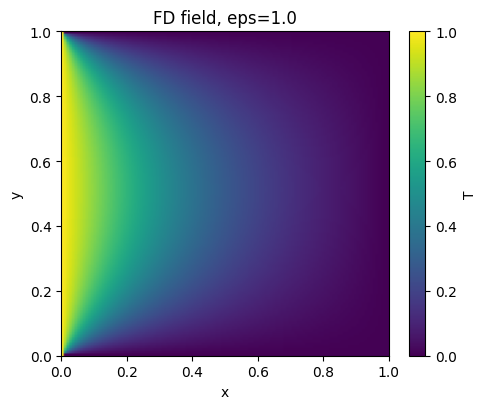

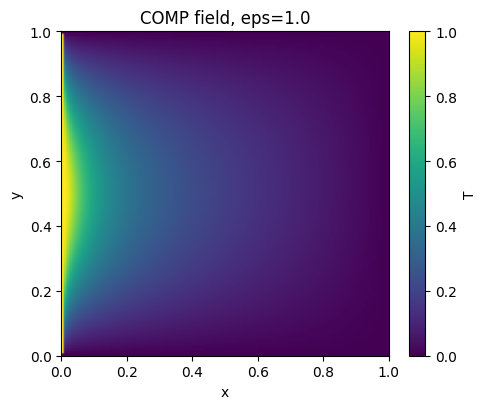

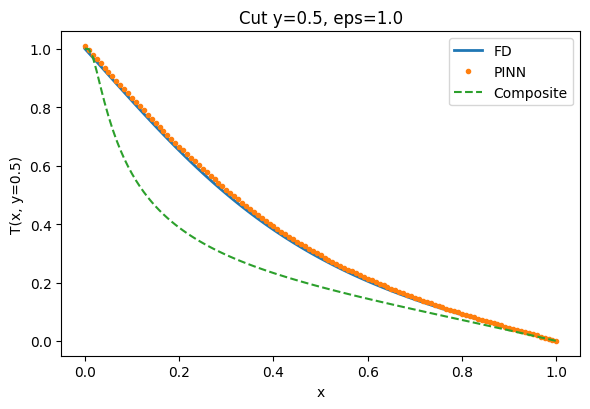

[eps=0.1|warm=True] Ep   25 | PDE 1.268e-01 | inlet*w 1.835e-01 | Total 3.103e-01
[eps=0.1|warm=True] Ep   50 | PDE 4.999e-02 | inlet*w 1.311e-01 | Total 1.811e-01
[eps=0.1|warm=True] Ep   75 | PDE 3.424e-02 | inlet*w 1.571e-01 | Total 1.913e-01
[eps=0.1|warm=True] Ep  100 | PDE 3.043e-02 | inlet*w 1.314e-01 | Total 1.618e-01
[eps=0.1|warm=True] Ep  125 | PDE 2.677e-02 | inlet*w 1.447e-01 | Total 1.715e-01
[eps=0.1|warm=True] Ep  150 | PDE 2.569e-02 | inlet*w 1.223e-01 | Total 1.480e-01
[eps=0.1|warm=True] Ep  175 | PDE 2.664e-02 | inlet*w 1.392e-01 | Total 1.658e-01
[eps=0.1|warm=True] Ep  200 | PDE 3.289e-02 | inlet*w 1.395e-01 | Total 1.724e-01
[eps=0.1|warm=True] Ep  300 | PDE 2.731e-02 | inlet*w 1.308e-01 | Total 1.581e-01
[eps=0.1|warm=False] Ep   25 | PDE 5.002e-02 | inlet*w 2.079e-01 | Total 2.579e-01
[eps=0.1|warm=False] Ep   50 | PDE 3.600e-02 | inlet*w 1.470e-01 | Total 1.830e-01
[eps=0.1|warm=False] Ep   75 | PDE 2.968e-02 | inlet*w 1.366e-01 | Total 1.663e-01
[eps=0.1|warm

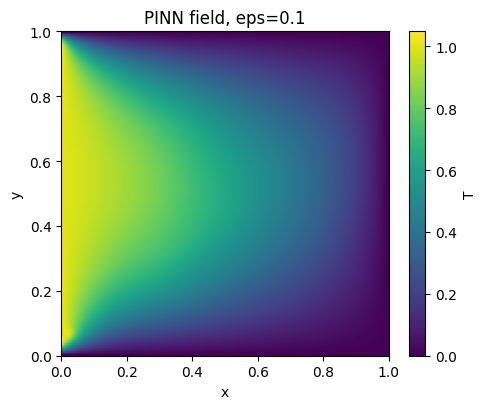

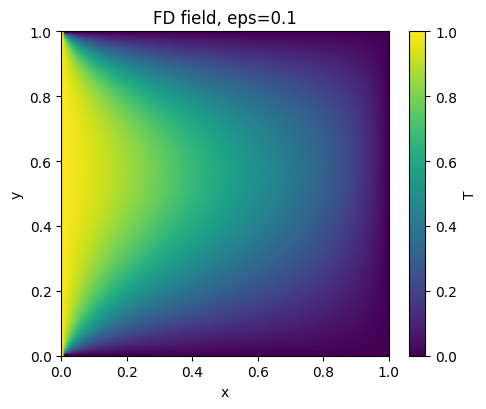

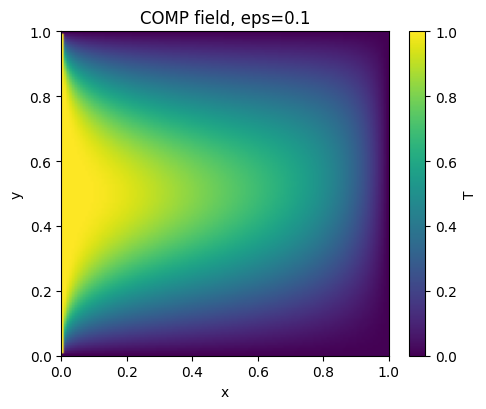

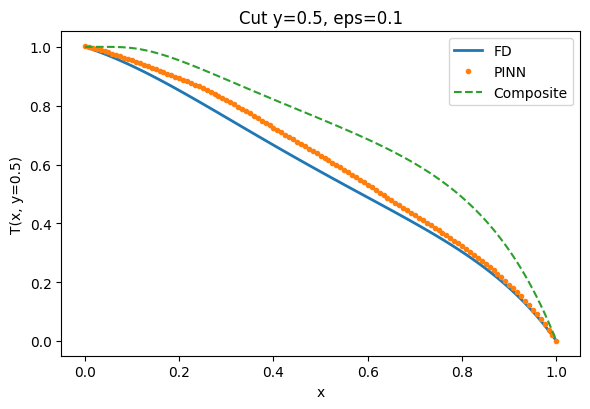

[eps=0.06|warm=True] Ep   25 | PDE 1.676e+00 | inlet*w 1.327e+00 | Total 3.003e+00
[eps=0.06|warm=True] Ep   50 | PDE 4.470e-01 | inlet*w 8.237e-01 | Total 1.271e+00
[eps=0.06|warm=True] Ep   75 | PDE 3.230e-01 | inlet*w 5.901e-01 | Total 9.131e-01
[eps=0.06|warm=True] Ep  100 | PDE 2.375e-01 | inlet*w 4.352e-01 | Total 6.727e-01
[eps=0.06|warm=True] Ep  125 | PDE 1.763e-01 | inlet*w 3.224e-01 | Total 4.987e-01
[eps=0.06|warm=True] Ep  150 | PDE 1.239e-01 | inlet*w 2.870e-01 | Total 4.109e-01
[eps=0.06|warm=True] Ep  175 | PDE 9.375e-02 | inlet*w 2.895e-01 | Total 3.833e-01
[eps=0.06|warm=True] Ep  200 | PDE 7.855e-02 | inlet*w 2.661e-01 | Total 3.446e-01
[eps=0.06|warm=True] Ep  300 | PDE 5.303e-02 | inlet*w 1.763e-01 | Total 2.293e-01
[eps=0.06|warm=False] Ep   25 | PDE 6.499e-02 | inlet*w 1.903e-01 | Total 2.553e-01
[eps=0.06|warm=False] Ep   50 | PDE 5.038e-02 | inlet*w 1.439e-01 | Total 1.942e-01
[eps=0.06|warm=False] Ep   75 | PDE 3.926e-02 | inlet*w 1.276e-01 | Total 1.669e-01
[

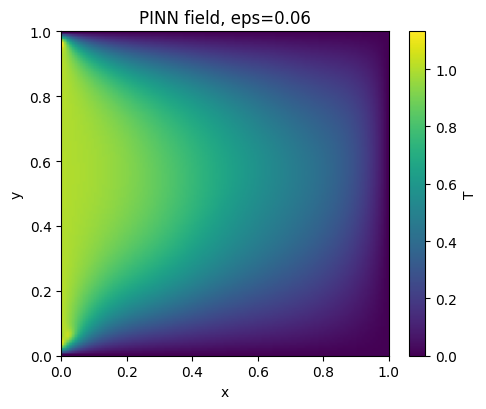

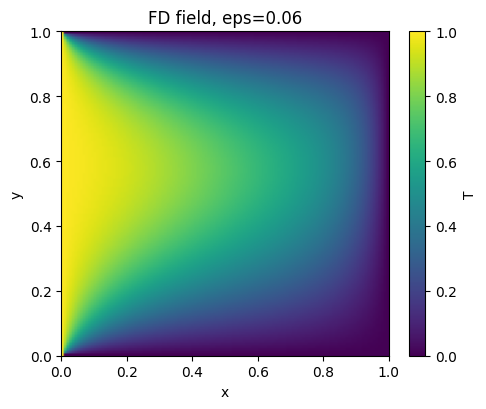

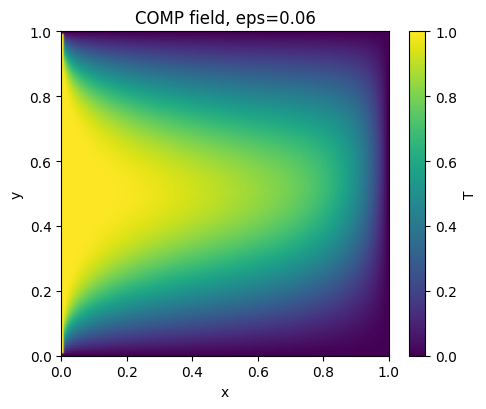

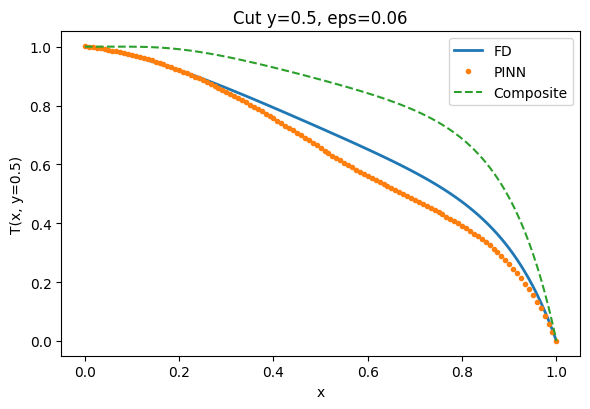

[eps=0.04|warm=True] Ep   25 | PDE 1.273e+00 | inlet*w 5.863e-01 | Total 1.859e+00
[eps=0.04|warm=True] Ep   50 | PDE 5.914e-01 | inlet*w 3.230e-01 | Total 9.144e-01
[eps=0.04|warm=True] Ep   75 | PDE 2.213e-01 | inlet*w 2.870e-01 | Total 5.084e-01
[eps=0.04|warm=True] Ep  100 | PDE 1.538e-01 | inlet*w 2.217e-01 | Total 3.755e-01
[eps=0.04|warm=True] Ep  125 | PDE 1.159e-01 | inlet*w 1.565e-01 | Total 2.724e-01
[eps=0.04|warm=True] Ep  150 | PDE 8.921e-02 | inlet*w 1.442e-01 | Total 2.335e-01
[eps=0.04|warm=True] Ep  175 | PDE 7.218e-02 | inlet*w 1.363e-01 | Total 2.085e-01
[eps=0.04|warm=True] Ep  200 | PDE 6.152e-02 | inlet*w 1.308e-01 | Total 1.924e-01
[eps=0.04|warm=True] Ep  300 | PDE 4.225e-02 | inlet*w 8.609e-02 | Total 1.283e-01
[eps=0.04|warm=False] Ep   25 | PDE 7.840e-02 | inlet*w 1.488e-01 | Total 2.272e-01
[eps=0.04|warm=False] Ep   50 | PDE 4.419e-02 | inlet*w 1.017e-01 | Total 1.459e-01
[eps=0.04|warm=False] Ep   75 | PDE 3.771e-02 | inlet*w 9.062e-02 | Total 1.283e-01
[

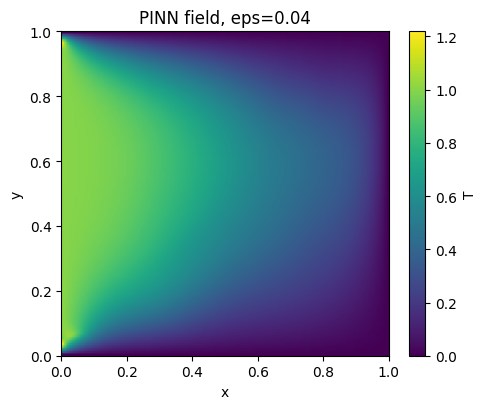

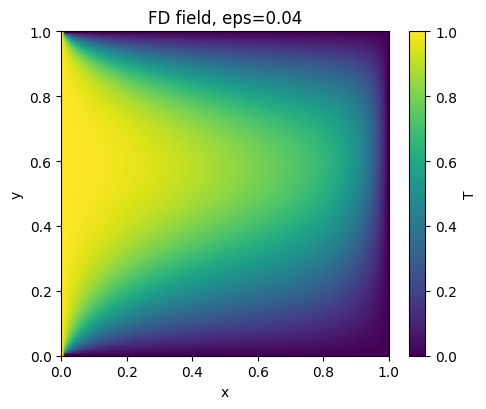

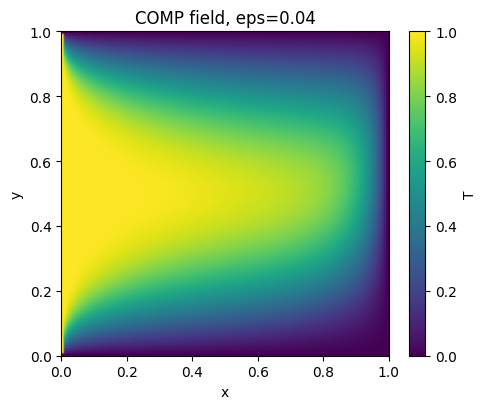

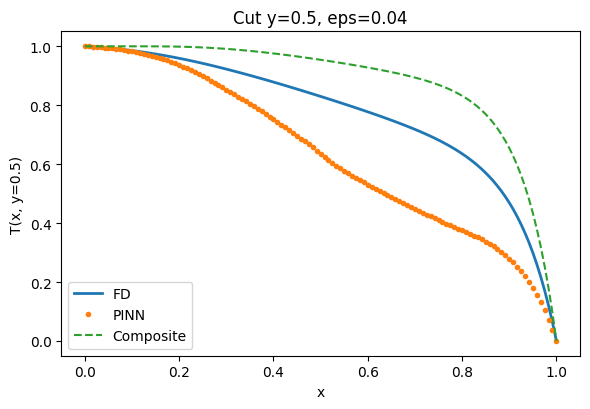


Tabla LaTeX (errores vs FD; global, núcleo y p99):
\begin{table}[H]
\centering
\caption{Errors of PINN and Composite against FD on a $121\times121$ grid. Core excludes one-cell boundary.}
\begin{tabular}{lcccccc}
\toprule
$\varepsilon$ & $L^2$ & $L^\infty$ & MAE & $L^2_{\text{core}}$ & $L^\infty_{\text{core}}$ & P99 \\
\midrule
\multicolumn{7}{l}{\textbf{PINN vs FD} ($\varepsilon=1$)} \\
 & 2.099e-02 & 1.000e+00 & 6.541e-03 & 1.187e-02 & 3.516e-01 & 2.042e-02 \\
\multicolumn{7}{l}{\textbf{Composite vs FD} ($\varepsilon=1$)} \\
 & 1.586e-01 & 1.000e+00 & 1.025e-01 & 1.608e-01 & 7.171e-01 & 4.919e-01 \\
\multicolumn{7}{l}{\textbf{PINN vs FD} ($\varepsilon=0.1$)} \\
 & 4.223e-02 & 1.000e+00 & 2.752e-02 & 3.994e-02 & 2.643e-01 & 1.074e-01 \\
\multicolumn{7}{l}{\textbf{Composite vs FD} ($\varepsilon=0.1$)} \\
 & 1.078e-01 & 1.000e+00 & 8.042e-02 & 1.090e-01 & 6.147e-01 & 3.042e-01 \\
\multicolumn{7}{l}{\textbf{PINN vs FD} ($\varepsilon=0.06$)} \\
 & 4.665e-02 & 1.000e+00 & 3.227e-02 & 4.50

NameError: name 'ys' is not defined

In [ ]:
# %% PINN Couette FULL + Curriculum + Outlet-focus + RAR + Métricas robustas (listo para pegar)
import os, random
import numpy as np
import pandas as pd
import torch, torch.nn as nn, torch.optim as optim
import matplotlib.pyplot as plt
from scipy.sparse import lil_matrix, csc_matrix
from scipy.sparse.linalg import spsolve
from scipy.special import gammaincc

# ---------------- Configuración ----------------
CURRICULUM_EPS = [1.0, 0.1, 0.06, 0.04]   # orden de entrenamiento (warm-start)
GRID_N   = 121
T0, Tw   = 1.0, 0.0
SEED     = 1234
SAVE_DIR = "/content/outputs"
os.makedirs(SAVE_DIR, exist_ok=True)

# Entrenamiento (OOM-safe)
NR_WARMUP, NB_WARMUP = 2000, 600
NR_MAIN,   NB_MAIN   = 7000, 1000
MICRO_WARMUP = 800
MICRO_MAIN   = 2000
EPOCHS_WARMUP = 300
EPOCHS_MAIN   = 5000
LBFGS_IT      = 600

# Red
WIDTH, DEPTH = 48, 4
MODEL_NAME   = "couette_full_curr"

# Muestreo y pesos
INLET_MARGIN = 0.05
STRIP_X0     = 0.02
BIAS_POW     = 8.0          # sesgo fuerte a x→1
OUTLET_STRIPE = (0.85, 1.0) # franja de salida
FRAC_OUTLET   = 0.35        # ~35% puntos en franja de salida
W_REGION      = 6.0         # peso adicional en PDE para x>0.85

# RAR
RAR_ROUNDS   = 2
RAR_POOL     = 20000        # puntos para sondeo residual
RAR_ADD      = 3000         # puntos nuevos añadidos por ronda

# ---------------- Utilidades ----------------
def set_seed(s=SEED):
    random.seed(s); np.random.seed(s); torch.manual_seed(s)
set_seed()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

# Red + transform
class MLP(nn.Module):
    def __init__(self, in_dim=2, out_dim=1, width=WIDTH, depth=DEPTH):
        super().__init__()
        layers = [nn.Linear(in_dim, width), nn.Tanh()]
        for _ in range(depth-1):
            layers += [nn.Linear(width, width), nn.Tanh()]
        layers += [nn.Linear(width, out_dim)]
        self.net = nn.Sequential(*layers)
        for m in self.net:
            if isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight); nn.init.zeros_(m.bias)
    def forward(self, z):  # z en [-1,1]^2
        return self.net(z)

def output_transform(xy, raw):
    x = xy[:,0:1]; y = xy[:,1:2]
    g = (1.0 - x) * y * (1.0 - y)
    return Tw + g * raw

def to_net_coords(xy): return 2.0*xy - 1.0

def T_model(net, xy):
    z = to_net_coords(xy)
    return output_transform(xy, net(z))

# PDE residual y pérdida (con ponderación de región)
def pde_residual(net, xy, eps):
    xy = xy.clone().detach().requires_grad_(True)
    T  = T_model(net, xy)
    grads = torch.autograd.grad(T, xy, torch.ones_like(T), retain_graph=True, create_graph=True)[0]
    Tx, Ty = grads[:,0:1], grads[:,1:2]
    g2x = torch.autograd.grad(Tx, xy, torch.ones_like(Tx), retain_graph=True, create_graph=True)[0]
    g2y = torch.autograd.grad(Ty, xy, torch.ones_like(Ty), retain_graph=True, create_graph=True)[0]
    Txx, Tyy = g2x[:,0:1], g2y[:,1:2]
    eps = torch.as_tensor(eps, dtype=T.dtype, device=T.device)
    y   = xy[:,1:2]
    return y*Tx - eps*(Txx + Tyy)

def region_weight(xy):
    x = xy[:,0:1]
    w = torch.ones_like(x)
    w = w + (W_REGION-1.0)*(x > OUTLET_STRIPE[0]).float()  # mayor peso en x>0.85
    return w

def pde_loss_micro(net, XY, eps, micro):
    n = XY.shape[0]; total = XY.new_tensor(0.0); k=0
    for i in range(0, n, micro):
        X = XY[i:i+micro]
        R = pde_residual(net, X, eps)
        w = region_weight(X)
        total = total + torch.mean((w*R)**2)
        k+=1
    return total/max(k,1)

mse =  a: torch.mean(a**2)

# Muestreo (con franja de salida)
def sample_interior(N, device):
    N_out = int(N*FRAC_OUTLET)
    N_rest= N - N_out
    # frente
    N_front = N_rest//2
    x1 = torch.rand(N_front,1,device=device)*0.2
    y1 = torch.rand(N_front,1,device=device)
    # sesgado a x→1
    N_bias = N_rest - N_front
    u = torch.rand(N_bias,1,device=device); x2 = 1 - (1-u)**BIAS_POW
    y2 = torch.rand(N_bias,1,device=device)
    # franja salida
    xl, xr = OUTLET_STRIPE
    x3 = torch.rand(N_out,1,device=device)*(xr-xl)+xl
    y3 = torch.rand(N_out,1,device=device)
    X = torch.cat([x1,x2,x3], dim=0)
    Y = torch.cat([y1,y2,y3], dim=0)
    return torch.cat([X,Y], dim=1)

def bd_x0(N, device):
    x = torch.zeros(N,1,device=device)
    y = torch.rand(N,1,device=device)*(1-2*INLET_MARGIN)+INLET_MARGIN
    return torch.cat([x,y], dim=1)

def bd_strip_x0(N, device, x_max=STRIP_X0):
    x = torch.rand(N,1,device=device)*x_max
    y = torch.rand(N,1,device=device)*(1-2*INLET_MARGIN)+INLET_MARGIN
    return torch.cat([x,y], dim=1)

# RAR: añade puntos donde el residual es mayor
def rar_augment(net, eps, base_XY, add=RAR_ADD, pool=RAR_POOL):
    with torch.no_grad():
        XYpool = torch.rand(pool,2,device=device)  # uniforme en dominio
    XYpool.requires_grad_(True)
    R = pde_residual(net, XYpool, eps).detach().abs().view(-1)
    idx = torch.topk(R, k=min(add, R.numel())).indices
    return torch.cat([base_XY, XYpool[idx]], dim=0)

# Composite (diagnóstico opcional)
# --- REEMPLAZA tu composite_couette por esta versión ---
from scipy.special import gammaincc

def composite_couette(x_grid, y_grid, eps, h=1.0, T0=1.0, Tw=0.0, p=2):
    """
    Composite para y*T_x = eps*(T_xx + T_yy) con:
      - Entrada x=0: T = T0
      - Muros y=0,y=h: T = Tw
      - Salida x=1: T = Tw
    Usa Q(s,z)=gammaincc(s,z) con s=1/3, unión de capas de pared por inclusión–exclusión
    y una ventana w(x)=x**p para que la capa de salida esté apagada en x=0.
    Devuelve un array de forma [Nx, Ny] con indexing='ij'.
    """
    X, Y = np.meshgrid(x_grid, y_grid, indexing='ij')
    s     = 1.0/3.0
    delta = 1e-12

    # Capas de pared (gamma regularizada); evitar división por cero en x=0
    z1 = (Y**3)        / (3.0*eps*np.maximum(X, delta))       # pared inferior
    z2 = ((h - Y)**3)  / (3.0*eps*np.maximum(X, delta))       # pared superior
    Qb = gammaincc(s, z1)
    Qt = gammaincc(s, z2)

    # Unión de capas: inclusión–exclusión
    S = Qb + Qt - Qb*Qt          # 0 en núcleo, 1 cerca de muros
    core = 1.0 - S

    # Capa de salida sólo en el núcleo, con ventana w(0)=0, w(1)=1
    w = X**p
    outlet = np.exp(-(1.0 - X)*Y/eps)

    Tcomp = T0 + (Tw - T0) * ( S + w*outlet*core )
    return Tcomp


# FD de referencia (difusión central + upwind en x)
def solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N):
    xs = np.linspace(0,1,Nx); ys = np.linspace(0,1,Ny)
    hx = xs[1]-xs[0]; hy = ys[1]-ys[0]
    def idx(i,j): return j*Nx + i
    N = Nx*Ny
    A = lil_matrix((N,N), dtype=float)
    b = np.zeros(N, dtype=float)
    for j in range(Ny):
        y = ys[j]
        for i in range(Nx):
            k = idx(i,j)
            if i==0:      A[k,k]=1; b[k]=1;  continue
            if i==Nx-1:   A[k,k]=1; b[k]=0;  continue
            if j==0 or j==Ny-1: A[k,k]=1; b[k]=0; continue
            cx = eps/(hx*hx); cy = eps/(hy*hy); conv = y/hx
            A[k, idx(i-1,j)] += ( cx + conv)   # upwind
            A[k, idx(i+1,j)] += ( cx)
            A[k, idx(i,  j-1)] += ( cy)
            A[k, idx(i,  j+1)] += ( cy)
            A[k, k]           += (-2*cx - 2*cy - conv)
    T = spsolve(csc_matrix(A), b).reshape(Ny, Nx)
    return np.array(T.T, dtype=np.float64)

# Métricas robustas
def metrics_all(Tp, Tr):
    E = Tp - Tr
    L2   = float(np.sqrt(np.mean(E**2)))
    Linf = float(np.max(np.abs(E)))
    MAE  = float(np.mean(np.abs(E)))
    # núcleo (quita 1 celda de borde)
    core = (slice(1,-1), slice(1,-1))
    Ec   = E[core]
    L2c   = float(np.sqrt(np.mean(Ec**2)))
    Linfc = float(np.max(np.abs(Ec)))
    MAEc  = float(np.mean(np.abs(Ec)))
    p99   = float(np.percentile(np.abs(E).ravel(), 99))
    return dict(L2=L2, Linf=Linf, MAE=MAE, L2_core=L2c, Linf_core=Linfc, MAE_core=MAEc, P99=p99)

def should_log(ep, total):
    if ep<=200: return ep%25==0
    if ep<=1000:return ep%100==0
    return ep%max(total//12,500)==0

# Entrena una fase (con opción RAR)
def train_phase(net, eps, NR, NB, MICRO, EPOCHS, W_INLET, do_rar=False):
    opt = optim.Adam(net.parameters(), lr=1e-3)
    XYr = sample_interior(NR, device)
    for ep in range(1, EPOCHS+1):
        # RAR cada cierto tiempo
        if do_rar and ep in [int(EPOCHS*0.4), int(EPOCHS*0.75)]:
            XYr = rar_augment(net, eps, XYr, add=RAR_ADD, pool=RAR_POOL)

        X0  = bd_x0(NB, device)
        X0s = bd_strip_x0(NB, device, x_max=STRIP_X0)

        loss_pde = pde_loss_micro(net, XYr, eps, micro=MICRO)
        loss_bc  = mse(T_model(net, X0)-T0) + mse(T_model(net, X0s)-T0)
        loss     = loss_pde + W_INLET*loss_bc

        opt.zero_grad(); loss.backward(); opt.step()

        if should_log(ep, EPOCHS):
            print(f"[eps={eps:.3g}|warm={NR==NR_WARMUP}] Ep {ep:4d} | PDE {loss_pde.item():.3e} | inlet*w {W_INLET*loss_bc.item():.3e} | Total {loss.item():.3e}")

# Ejecuta un caso con warm-up → main → L-BFGS
def run_case(eps, init_state_dict=None):
    set_seed()
    net = MLP().to(device)
    if init_state_dict is not None:
        net.load_state_dict(init_state_dict)

    W_INLET = 50.0 if eps>=0.5 else 100.0

    # warm-up (sin RAR, feedback rápido)
    train_phase(net, eps, NR_WARMUP, NB_WARMUP, MICRO_WARMUP, EPOCHS_WARMUP, W_INLET, do_rar=False)
    # fase principal (con RAR)
    train_phase(net, eps, NR_MAIN, NB_MAIN, MICRO_MAIN, EPOCHS_MAIN, W_INLET, do_rar=True)

    # L-BFGS breve en minibatch fijo
    XYc  = sample_interior(4000, device)
    X0c  = bd_x0(NB_MAIN, device)
    X0sc = bd_strip_x0(NB_MAIN, device, x_max=STRIP_X0)
    opt2 = optim.LBFGS(net.parameters(), lr=1.0, max_iter=LBFGS_IT, history_size=50, line_search_fn="strong_wolfe")
    def closure():
        opt2.zero_grad()
        loss = pde_loss_micro(net, XYc, eps, micro=MICRO_MAIN) \
             + W_INLET*mse(T_model(net, X0c)-T0) + W_INLET*mse(T_model(net, X0sc)-T0)
        loss.backward(); return loss
    print(f"[eps={eps:.3g}] L-BFGS x{LBFGS_IT}..."); opt2.step(closure)

    # Evaluación vs FD + figuras
    xs = np.linspace(0,1,GRID_N); ys = np.linspace(0,1,GRID_N)
    xs_t = torch.tensor(xs, dtype=torch.float32, device=device)
    ys_t = torch.tensor(ys, dtype=torch.float32, device=device)
    Xg, Yg = torch.meshgrid(xs_t, ys_t, indexing='ij')
    XY = torch.stack([Xg.reshape(-1), Yg.reshape(-1)], dim=1)
    with torch.no_grad():
        Tpred = T_model(net, XY).reshape(GRID_N, GRID_N).cpu().numpy()
    Tfd = solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N)
    Tcomp = composite_couette(xs, ys, eps)

    m_pinn = metrics_all(Tpred, Tfd)
    m_comp = metrics_all(Tcomp, Tfd)
    print(f"[eps={eps:.3g}] PINN vs FD -> {m_pinn}")
    print(f"[eps={eps:.3g}] COMP vs FD -> {m_comp}")

    # Guardar CSV + mapas + corte
    pd.DataFrame(Tpred, index=xs, columns=ys).to_csv(f"{SAVE_DIR}/T_PINN_eps_{eps:.3g}_{MODEL_NAME}.csv", float_format="%.6f")
    pd.DataFrame(Tfd,   index=xs, columns=ys).to_csv(f"{SAVE_DIR}/T_FD_eps_{eps:.3g}.csv", float_format="%.6f")
    pd.DataFrame(Tcomp, index=xs, columns=ys).to_csv(f"{SAVE_DIR}/T_Composite_eps_{eps:.3g}.csv", float_format="%.6f")

    for tag, Tmat in [("PINN",Tpred), ("FD",Tfd), ("COMP",Tcomp)]:
        plt.figure(figsize=(5.0,4.2))
        im=plt.imshow(Tmat.T, origin='lower', extent=[0,1,0,1], aspect='auto')
        plt.colorbar(im,label='T'); plt.xlabel('x'); plt.ylabel('y'); plt.title(f'{tag} field, eps={eps}')
        plt.tight_layout(); plt.savefig(f"{SAVE_DIR}/{tag}_field_eps_{eps:.3g}.png", dpi=140); plt.show()

    jmid = GRID_N//2
    plt.figure(figsize=(6.0,4.2))
    plt.plot(xs, Tfd[:,jmid], '-',  lw=2, label='FD')
    plt.plot(xs, Tpred[:,jmid], 'o', ms=3, label='PINN')
    plt.plot(xs, Tcomp[:,jmid], '--', lw=1.5, label='Composite')
    plt.xlabel('x'); plt.ylabel('T(x, y=0.5)'); plt.title(f'Cut y=0.5, eps={eps}')
    plt.legend(); plt.tight_layout(); plt.savefig(f"{SAVE_DIR}/cut_y05_eps_{eps:.3g}.png", dpi=150); plt.show()

    if torch.cuda.is_available(): torch.cuda.empty_cache()
    return net.state_dict(), m_pinn, m_comp

# ---------------- Loop curriculum (warm-start) + tabla ----------------
results = []
state = None
for eps in CURRICULUM_EPS:
    print("="*72)
    state, m_pinn, m_comp = run_case(eps, init_state_dict=state)
    results.append((eps, m_pinn, m_comp))

print("\nTabla LaTeX (errores vs FD; global, núcleo y p99):")
print(r"\begin{table}[H]")
print(r"\centering")
print(r"\caption{Errors of PINN and Composite against FD on a $121\times121$ grid. Core excludes one-cell boundary.}")
print(r"\begin{tabular}{lcccccc}")
print(r"\toprule")
print(r"$\varepsilon$ & $L^2$ & $L^\infty$ & MAE & $L^2_{\text{core}}$ & $L^\infty_{\text{core}}$ & P99 \\")
print(r"\midrule")
for eps, m_pinn, m_comp in results:
    print(rf"\multicolumn{{7}}{{l}}{{\textbf{{PINN vs FD}} ($\varepsilon={eps:g}$)}} \\")
    print(rf" & {m_pinn['L2']:.3e} & {m_pinn['Linf']:.3e} & {m_pinn['MAE']:.3e} & {m_pinn['L2_core']:.3e} & {m_pinn['Linf_core']:.3e} & {m_pinn['P99']:.3e} \\")
    print(rf"\multicolumn{{7}}{{l}}{{\textbf{{Composite vs FD}} ($\varepsilon={eps:g}$)}} \\")
    print(rf" & {m_comp['L2']:.3e} & {m_comp['Linf']:.3e} & {m_comp['MAE']:.3e} & {m_comp['L2_core']:.3e} & {m_comp['Linf_core']:.3e} & {m_comp['P99']:.3e} \\")
print(r"\bottomrule")
print(r"\end{tabular}")
print(r"\end{table}")



In [ ]:
pip install torch numpy scipy matplotlib

Device: cuda
Warm-up ...
[eps=0.04] Ep    50 | PDE 3.520e+00 | inlet*w 4.276e+00 | Total 7.796e+00
[eps=0.04] Ep   100 | PDE 2.619e+00 | inlet*w 4.348e+00 | Total 6.967e+00
[eps=0.04] Ep   150 | PDE 2.488e+00 | inlet*w 4.026e+00 | Total 6.514e+00
[eps=0.04] Ep   200 | PDE 2.471e+00 | inlet*w 4.378e+00 | Total 6.849e+00
[eps=0.04] Ep   250 | PDE 2.405e+00 | inlet*w 3.903e+00 | Total 6.308e+00
[eps=0.04] Ep   300 | PDE 2.397e+00 | inlet*w 3.880e+00 | Total 6.277e+00
[eps=0.04] Ep   400 | PDE 2.249e+00 | inlet*w 4.398e+00 | Total 6.647e+00
[eps=0.04] Ep   600 | PDE 2.241e+00 | inlet*w 4.520e+00 | Total 6.762e+00
Main + RAR ...
[eps=0.04] Ep    50 | PDE 1.923e+00 | inlet*w 4.198e+00 | Total 6.121e+00
[eps=0.04] Ep   100 | PDE 1.752e+00 | inlet*w 4.266e+00 | Total 6.018e+00
[eps=0.04] Ep   150 | PDE 1.621e+00 | inlet*w 4.134e+00 | Total 5.755e+00
[eps=0.04] Ep   200 | PDE 1.448e+00 | inlet*w 4.336e+00 | Total 5.783e+00
[eps=0.04] Ep   250 | PDE 1.312e+00 | inlet*w 3.979e+00 | Total 5.291e+0

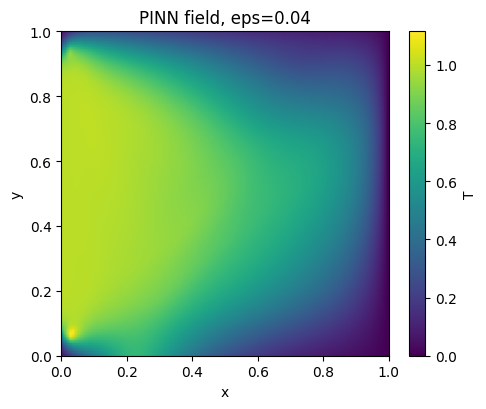

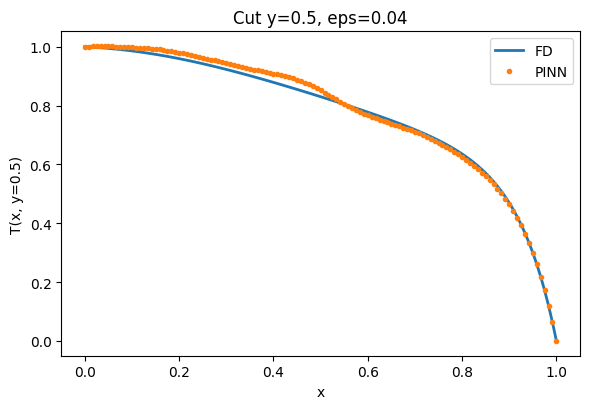

DONE. Metrics: {'L2': 0.15970243831969158, 'Linf': 0.9241418614983559, 'MAE': 0.10230915791410079, 'L2_core': 0.1553264103560073, 'Linf_core': 0.7127787813771453, 'MAE_core': 0.10069246708117448, 'P99': 0.5685350786692933}


In [ ]:
# %% PINN Couette para eps = 0.04 (corregido: inlet casi-hard en el núcleo + estabilidad)
import os, random
import numpy as np
import pandas as pd
import torch, torch.nn as nn, torch.optim as optim
import matplotlib.pyplot as plt
from scipy.sparse import lil_matrix, csc_matrix
from scipy.sparse.linalg import spsolve
from scipy.special import gammaincc

# ---------------- Configuración ----------------
EPS = 0.04
GRID_N   = 121
T0, Tw   = 1.0, 0.0
SEED     = 1234
SAVE_DIR = "/content/outputs"
os.makedirs(SAVE_DIR, exist_ok=True)

# Entrenamiento
NR_WARMUP, NB_WARMUP = 4000, 2000
NR_MAIN,   NB_MAIN   = 12000, 3000
MICRO_WARMUP = 1000
MICRO_MAIN   = 2500
EPOCHS_WARMUP = 600
EPOCHS_MAIN   = 7000
LBFGS_IT      = 800

# Red
WIDTH, DEPTH = 64, 4
MODEL_NAME   = "couette_pinn_eps004"

# Muestreo y pesos (menos tirón a la salida)
INLET_MARGIN  = 0.05
STRIP_X0      = 0.06
BIAS_POW      = 4.0          # antes 8.0 (muy agresivo)
OUTLET_STRIPE = (0.88, 1.0)
FRAC_OUTLET   = 0.20         # antes 0.35
W_REGION      = 2.0          # antes 6.0 (muy alto)

# RAR
RAR_POOL     = 25000
RAR_ADD      = 4000

# ---------------- Utilidades ----------------
def set_seed(s=SEED):
    random.seed(s); np.random.seed(s); torch.manual_seed(s)
set_seed()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

# ---------------- Red ----------------
class MLP(nn.Module):
    def __init__(self, in_dim=2, out_dim=1, width=WIDTH, depth=DEPTH):
        super().__init__()
        layers = [nn.Linear(in_dim, width), nn.Tanh()]
        for _ in range(depth-1):
            layers += [nn.Linear(width, width), nn.Tanh()]
        layers += [nn.Linear(width, out_dim)]
        self.net = nn.Sequential(*layers)
        for m in self.net:
            if isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight); nn.init.zeros_(m.bias)
    def forward(self, z):
        return self.net(z)

def to_net_coords(xy):  # [0,1]^2 -> [-1,1]^2
    return 2.0*xy - 1.0

# --------- CLAVE: inlet casi-hard en el núcleo con máscara suave ---------
# m(y) ~ 1 en [margin, 1-margin], m(y)=0 en muros.
def smooth_mask_y(y, margin=INLET_MARGIN, sharp=0.02):
    # sigmoids suaves para evitar discontinuidades
    a = torch.sigmoid((y - margin)/sharp)
    b = torch.sigmoid(((1.0 - margin) - y)/sharp)
    return a*b

def output_transform(xy, raw):
    x = xy[:,0:1]; y = xy[:,1:2]
    m = smooth_mask_y(y)
    # base: Tw en muros y outlet; en inlet (x=0) fuerza T≈T0 solo en el núcleo (m≈1)
    base = Tw + (1.0 - x)*m*(T0 - Tw)
    # corrección libre: se apaga en x=0, x=1 y en muros (m=0)
    g = x*(1.0 - x)*m
    return base + g*raw

def T_model(net, xy):
    z = to_net_coords(xy)
    return output_transform(xy, net(z))

# ---------------- PDE residual y pérdidas ----------------
def pde_residual(net, xy, eps):
    xy = xy.clone().detach().requires_grad_(True)
    T  = T_model(net, xy)
    grads = torch.autograd.grad(T, xy, torch.ones_like(T), retain_graph=True, create_graph=True)[0]
    Tx, Ty = grads[:,0:1], grads[:,1:2]
    g2x = torch.autograd.grad(Tx, xy, torch.ones_like(Tx), retain_graph=True, create_graph=True)[0]
    g2y = torch.autograd.grad(Ty, xy, torch.ones_like(Ty), retain_graph=True, create_graph=True)[0]
    Txx, Tyy = g2x[:,0:1], g2y[:,1:2]
    eps = torch.as_tensor(eps, dtype=T.dtype, device=T.device)
    y   = xy[:,1:2]
    return y*Tx - eps*(Txx + Tyy)

def region_weight(xy):
    x = xy[:,0:1]
    w = torch.ones_like(x)
    w = w + (W_REGION-1.0)*(x > OUTLET_STRIPE[0]).float()
    return w

def pde_loss_micro(net, XY, eps, micro):
    n = XY.shape[0]; total = XY.new_tensor(0.0); k=0
    for i in range(0, n, micro):
        X = XY[i:i+micro]
        R = pde_residual(net, X, eps)
        w = region_weight(X)
        total = total + torch.mean((w*R)**2)
        k += 1
    return total/max(k,1)

mse = lambda a: torch.mean(a**2)

# ---------------- Muestreo ----------------
def sample_interior(N, device):
    N_out = int(N*FRAC_OUTLET)
    N_rest= N - N_out

    N_front = N_rest//2
    x1 = torch.rand(N_front,1,device=device)*0.25
    y1 = torch.rand(N_front,1,device=device)

    N_bias = N_rest - N_front
    u = torch.rand(N_bias,1,device=device)
    x2 = 1 - (1-u)**BIAS_POW
    y2 = torch.rand(N_bias,1,device=device)

    xl, xr = OUTLET_STRIPE
    x3 = torch.rand(N_out,1,device=device)*(xr-xl)+xl
    y3 = torch.rand(N_out,1,device=device)

    X = torch.cat([x1,x2,x3], dim=0)
    Y = torch.cat([y1,y2,y3], dim=0)
    return torch.cat([X,Y], dim=1)

def bd_x0(N, device):
    x = torch.zeros(N,1,device=device)
    y = torch.rand(N,1,device=device)*(1-2*INLET_MARGIN)+INLET_MARGIN
    return torch.cat([x,y], dim=1)

def bd_strip_x0(N, device, x_max=STRIP_X0):
    x = torch.rand(N,1,device=device)*x_max
    y = torch.rand(N,1,device=device)*(1-2*INLET_MARGIN)+INLET_MARGIN
    return torch.cat([x,y], dim=1)

def rar_augment(net, eps, base_XY, add=RAR_ADD, pool=RAR_POOL):
    with torch.no_grad():
        XYpool = torch.rand(pool,2,device=device)
    XYpool.requires_grad_(True)
    R = pde_residual(net, XYpool, eps).detach().abs().view(-1)
    idx = torch.topk(R, k=min(add, R.numel())).indices
    return torch.cat([base_XY, XYpool[idx]], dim=0)

# ---------------- FD de referencia ----------------
def solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N):
    xs = np.linspace(0,1,Nx); ys = np.linspace(0,1,Ny)
    hx = xs[1]-xs[0]; hy = ys[1]-ys[0]
    def idx(i,j): return j*Nx + i
    N = Nx*Ny
    A = lil_matrix((N,N), dtype=float)
    b = np.zeros(N, dtype=float)
    for j in range(Ny):
        y = ys[j]
        for i in range(Nx):
            k = idx(i,j)
            if i==0:      A[k,k]=1; b[k]=1;  continue
            if i==Nx-1:   A[k,k]=1; b[k]=0;  continue
            if j==0 or j==Ny-1: A[k,k]=1; b[k]=0; continue
            cx = eps/(hx*hx); cy = eps/(hy*hy); conv = y/hx
            A[k, idx(i-1,j)] += ( cx + conv)  # upwind
            A[k, idx(i+1,j)] += ( cx)
            A[k, idx(i,  j-1)] += ( cy)
            A[k, idx(i,  j+1)] += ( cy)
            A[k, k]           += (-2*cx - 2*cy - conv)
    T = spsolve(csc_matrix(A), b).reshape(Ny, Nx)
    return np.array(T.T, dtype=np.float64)

# ---------------- Métricas ----------------
def metrics_all(Tp, Tr):
    E = Tp - Tr
    L2   = float(np.sqrt(np.mean(E**2)))
    Linf = float(np.max(np.abs(E)))
    MAE  = float(np.mean(np.abs(E)))
    core = (slice(1,-1), slice(1,-1))
    Ec   = E[core]
    L2c   = float(np.sqrt(np.mean(Ec**2)))
    Linfc = float(np.max(np.abs(Ec)))
    MAEc  = float(np.mean(np.abs(Ec)))
    p99   = float(np.percentile(np.abs(E).ravel(), 99))
    return dict(L2=L2, Linf=Linf, MAE=MAE, L2_core=L2c, Linf_core=Linfc, MAE_core=MAEc, P99=p99)

def should_log(ep, total):
    if ep<=300: return ep%50==0
    if ep<=1500:return ep%200==0
    return ep%max(total//10,500)==0

# ---------------- Entrenamiento ----------------
def train_phase(net, eps, NR, NB, MICRO, EPOCHS, W_INLET, do_rar=False):
    opt = optim.Adam(net.parameters(), lr=8e-4)
    sched = optim.lr_scheduler.StepLR(opt, step_size=max(EPOCHS//3,1), gamma=0.5)

    XYr = sample_interior(NR, device)
    for ep in range(1, EPOCHS+1):

        if do_rar and ep in [int(EPOCHS*0.45), int(EPOCHS*0.8)]:
            XYr = rar_augment(net, eps, XYr, add=RAR_ADD, pool=RAR_POOL)

        X0  = bd_x0(NB, device)
        X0s = bd_strip_x0(NB, device, x_max=STRIP_X0)

        loss_pde = pde_loss_micro(net, XYr, eps, micro=MICRO)
        loss_bc  = mse(T_model(net, X0)-T0) + mse(T_model(net, X0s)-T0)

        loss = loss_pde + W_INLET*loss_bc

        opt.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(net.parameters(), 1.0)
        opt.step()
        sched.step()

        if should_log(ep, EPOCHS):
            print(f"[eps={eps:.3g}] Ep {ep:5d} | PDE {loss_pde.item():.3e} | inlet*w {W_INLET*loss_bc.item():.3e} | Total {loss.item():.3e}")

def run_eps004(eps=EPS):
    set_seed()
    net = MLP().to(device)

    # ahora el inlet está casi-hard en el núcleo => no necesitas W_INLET absurdo
    W_INLET = 200.0

    print("Warm-up ...")
    train_phase(net, eps, NR_WARMUP, NB_WARMUP, MICRO_WARMUP, EPOCHS_WARMUP, W_INLET, do_rar=False)

    print("Main + RAR ...")
    train_phase(net, eps, NR_MAIN, NB_MAIN, MICRO_MAIN, EPOCHS_MAIN, W_INLET, do_rar=True)

    # L-BFGS (incluye inlet en el closure)
    XYc  = sample_interior(6000, device)
    X0c  = bd_x0(NB_MAIN, device)
    X0sc = bd_strip_x0(NB_MAIN, device, x_max=STRIP_X0)

    opt2 = optim.LBFGS(net.parameters(), lr=1.0, max_iter=LBFGS_IT,
                      history_size=50, line_search_fn="strong_wolfe")

    def closure():
        opt2.zero_grad()
        loss = pde_loss_micro(net, XYc, eps, micro=MICRO_MAIN) \
             + W_INLET*mse(T_model(net, X0c)-T0) + W_INLET*mse(T_model(net, X0sc)-T0)
        loss.backward()
        return loss

    print(f"[eps={eps:.3g}] L-BFGS x{LBFGS_IT} ...")
    opt2.step(closure)

    # Evaluación
    xs = np.linspace(0,1,GRID_N); ys = np.linspace(0,1,GRID_N)
    xs_t = torch.tensor(xs, dtype=torch.float32, device=device)
    ys_t = torch.tensor(ys, dtype=torch.float32, device=device)
    Xg, Yg = torch.meshgrid(xs_t, ys_t, indexing='ij')
    XY = torch.stack([Xg.reshape(-1), Yg.reshape(-1)], dim=1)
    with torch.no_grad():
        Tpred = T_model(net, XY).reshape(GRID_N, GRID_N).cpu().numpy()

    Tfd = solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N)
    m_pinn = metrics_all(Tpred, Tfd)
    print(f"[eps={eps:.3g}] PINN vs FD -> {m_pinn}")

    # Guardar CSV + plots
    pd.DataFrame(Tpred, index=xs, columns=ys).to_csv(f"{SAVE_DIR}/T_PINN_eps_{eps:.3g}_{MODEL_NAME}.csv", float_format="%.6f")
    pd.DataFrame(Tfd,   index=xs, columns=ys).to_csv(f"{SAVE_DIR}/T_FD_eps_{eps:.3g}.csv", float_format="%.6f")

    # Field
    plt.figure(figsize=(5.0,4.2))
    im=plt.imshow(Tpred.T, origin='lower', extent=[0,1,0,1], aspect='auto')
    plt.colorbar(im,label='T'); plt.xlabel('x'); plt.ylabel('y'); plt.title(f'PINN field, eps={eps}')
    plt.tight_layout(); plt.savefig(f"{SAVE_DIR}/PINN_field_eps_{eps:.3g}.png", dpi=150); plt.show()

    # Cut y=0.5
    jmid = GRID_N//2
    plt.figure(figsize=(6.0,4.2))
    plt.plot(xs, Tfd[:,jmid], '-',  lw=2, label='FD')
    plt.plot(xs, Tpred[:,jmid], 'o', ms=3, label='PINN')
    plt.xlabel('x'); plt.ylabel('T(x, y=0.5)'); plt.title(f'Cut y=0.5, eps={eps}')
    plt.legend(); plt.tight_layout(); plt.savefig(f"{SAVE_DIR}/cut_y05_eps_{eps:.3g}.png", dpi=160); plt.show()

    if torch.cuda.is_available(): torch.cuda.empty_cache()
    return net, m_pinn

net, metrics = run_eps004(EPS)
print("DONE. Metrics:", metrics)


In [ ]:
import numpy as np
import pandas as pd
from scipy.sparse import lil_matrix, csc_matrix
from scipy.sparse.linalg import spsolve
from scipy.special import gammaincc

# ---------- Config ----------
eps = 1.0
Nx = Ny = 121
xs = np.linspace(0,1,Nx)
ys = np.linspace(0,1,Ny)
hx = xs[1]-xs[0]
hy = ys[1]-ys[0]

# (opcional) ruta a PINN CSV con columnas x,y,Tpinn (densamente en la misma malla)
PINN_CSV = None  # p.ej. "/content/outputs/T_PINN_eps_1.0_couette_full.csv"

# ---------- Ensamblaje matriz A T = b ----------
N = Nx*Ny
A = lil_matrix((N,N), dtype=float)
b = np.zeros(N, dtype=float)

def idx(i,j):  # i=0..Nx-1, j=0..Ny-1
    return j*Nx + i

for j in range(Ny):
    y = ys[j]
    for i in range(Nx):
        k = idx(i,j)

        # Frontera: Dirichlet
        on_left   = (i==0)
        on_right  = (i==Nx-1)
        on_bottom = (j==0)
        on_top    = (j==Ny-1)

        if on_left:
            A[k,k] = 1.0
            b[k]   = 1.0
            continue
        if on_right or on_bottom or on_top:
            A[k,k] = 1.0
            b[k]   = 0.0
            continue

        # Interior:
        # Difusión central: -eps*(Txx+Tyy)
        cx = eps/(hx*hx)
        cy = eps/(hy*hy)

        # Convección upwind en x: y*T_x ≈ y*(T[i]-T[i-1])/hx  (porque y>=0 en [0,1])
        # (si y=0 el término convectivo se anula)
        conv = y/hx

        # Coeficientes:
        A[k, idx(i-1,j)] += (+cx + conv)   # izquierda (difusión + upwind)
        A[k, idx(i+1,j)] += (+cx)          # derecha
        A[k, idx(i,j-1)] += (+cy)          # abajo
        A[k, idx(i,j+1)] += (+cy)          # arriba
        A[k, k]          += ( -2*cx - 2*cy - conv )

# Resolver
A = csc_matrix(A)
T_num = spsolve(A, b).reshape(Ny, Nx)  # ojo: (j,i) = (y,x)
T_num = T_num.T                        # ahora T_num[i,j] con shape (Nx,Ny)

# ---------- (Opcional) Comparar con composite ----------
def composite_couette(xs, ys, eps):
    X, Y = np.meshgrid(xs, ys, indexing='ij')
    s = 1.0/3.0; tiny = 1e-14
    Z1 = (Y**3) / (9.0*eps*np.maximum(X, tiny))
    Z2 = ((1.0 - Y)**3) / (9.0*eps*np.maximum(X, tiny))
    Q1, Q2 = gammaincc(s, Z1), gammaincc(s, Z2)
    return 1.0 - Q1 - Q2 + np.exp(-(1.0 - X)*Y/eps)

T_comp = composite_couette(xs, ys, eps)

# ---------- (Opcional) Cargar PINN y reordenar a malla ----------
def load_pinn_grid(csv_path):
    df = pd.read_csv(csv_path)
    # pivot asume que x,y tienen exactamente los nodos xs,ys
    grid = df.pivot(index='y', columns='x', values='Tpinn')
    grid = grid.reindex(index=np.sort(grid.index.values), columns=np.sort(grid.columns.values))
    return grid.values  # shape (Ny,Nx) en (y,x)

T_pinn = None
if PINN_CSV:
    gp = load_pinn_grid(PINN_CSV)
    T_pinn = gp.T   # pasa a (Nx,Ny) para alinear con T_num

# ---------- Métricas ----------
def metrics(T_pred, T_ref):
    err = T_pred - T_ref
    L2   = np.sqrt(np.mean(err**2))
    Linf = np.max(np.abs(err))
    MAE  = np.mean(np.abs(err))
    return L2, Linf, MAE

rows = []

# (a) Composite vs Numérico (diagnóstico de la composite)
L2c, Linc, MAEc = metrics(T_comp, T_num)
rows.append(("Composite vs FD", L2c, Linc, MAEc))

# (b) PINN vs Numérico (¡esta es la comparación principal!)
if T_pinn is not None:
    L2p, Linp, MAEp = metrics(T_pinn, T_num)
    rows.append(("PINN vs FD", L2p, Linp, MAEp))

# ---------- Imprimir tabla LaTeX ----------
print(r"\begin{table}[H]")
print(r"\centering")
print(rf"\caption{{Errors against the finite-difference reference for $\varepsilon={eps:g}$ on a ${Nx}\times{Ny}$ grid.}}")
print(r"\label{tab:errors_fd_ref}")
print(r"\begin{tabular}{lccc}")
print(r"\toprule")
print(r"Comparison & $L^2$ & $L^\infty$ & MAE \\")
print(r"\midrule")
for name, L2, Linf, MAE in rows:
    print(rf"{name} & {L2:.3e} & {Linf:.3e} & {MAE:.3e} \\")
print(r"\bottomrule")
print(r"\end{tabular}")
print(r"\end{table}")


\begin{table}[H]
\centering
\caption{Errors against the finite-difference reference for $\varepsilon=1$ on a $121\times121$ grid.}
\label{tab:errors_fd_ref}
\begin{tabular}{lccc}
\toprule
Comparison & $L^2$ & $L^\infty$ & MAE \\
\midrule
Composite vs FD & 3.544e-01 & 1.000e+00 & 3.032e-01 \\
\bottomrule
\end{tabular}
\end{table}


In [ ]:
# %% Comparación justa: FD (referencia) vs PINN y vs Composite, para varios eps.
import numpy as np
import pandas as pd
from scipy.sparse import lil_matrix, csc_matrix
from scipy.sparse.linalg import spsolve
from scipy.special import gammaincc
import os, glob

# ---------------- Configuración ----------------
EPS_LIST   = [1.0, 0.1, 0.04]
Nx = Ny    = 121
MAKE_FIGS  = False  # pon True si quieres heatmaps y cortes
SAVE_DIR   = "/content/outputs"
os.makedirs(SAVE_DIR, exist_ok=True)

# Si tienes CSV del PINN en la misma malla (columnas: x,y,Tpinn), define la plantilla:
# Ejemplos de plantillas:
# PINN_CSV_TMPL = "/content/outputs/T_PINN_eps_{eps}_couette_full.csv"
# PINN_CSV_TMPL = "/content/outputs/T_PINN_eps_{eps:.3g}_couette_full.csv"
PINN_CSV_TMPL = None  # <-- ajusta aquí o deja None para no cargar PINN

# ---------------- Utilidades ----------------
xs = np.linspace(0,1,Nx)
ys = np.linspace(0,1,Ny)
hx = xs[1]-xs[0]
hy = ys[1]-ys[0]

def idx(i,j):  # i=0..Nx-1, j=0..Ny-1
    return j*Nx + i

def solve_fd_reference(eps):
    """Resuelve -eps*(Txx+Tyy) + y*T_x = 0 con Dirichlet por FD (centrales + upwind)."""
    N = Nx*Ny
    A = lil_matrix((N,N), dtype=float)
    b = np.zeros(N, dtype=float)
    for j in range(Ny):
        y = ys[j]
        for i in range(Nx):
            k = idx(i,j)
            # Fronteras
            if i==0:           # x=0, inlet -> T=1
                A[k,k] = 1.0; b[k] = 1.0;  continue
            if i==Nx-1:        # x=1
                A[k,k] = 1.0; b[k] = 0.0;  continue
            if j==0 or j==Ny-1:# y=0,1
                A[k,k] = 1.0; b[k] = 0.0;  continue

            # Interior
            cx = eps/(hx*hx)
            cy = eps/(hy*hy)
            conv = y/hx       # upwind en x (y>=0 en [0,1])

            A[k, idx(i-1,j)] += ( cx + conv)  # izq (difusión + upwind)
            A[k, idx(i+1,j)] += ( cx)         # der
            A[k, idx(i,  j-1)] += ( cy)       # abajo
            A[k, idx(i,  j+1)] += ( cy)       # arriba
            A[k, k]           += (-2*cx - 2*cy - conv)

    T = spsolve(csc_matrix(A), b).reshape(Ny, Nx)  # (y,x)
    return T.T  # (x,y)

def composite_couette(eps):
    """Solución compuesta (válida para eps pequeño, aquí solo para diagnóstico)."""
    X, Y = np.meshgrid(xs, ys, indexing='ij')
    s = 1.0/3.0; tiny = 1e-14
    Z1 = (Y**3) / (9.0*eps*np.maximum(X, tiny))
    Z2 = ((1.0 - Y)**3) / (9.0*eps*np.maximum(X, tiny))
    Q1, Q2 = gammaincc(s, Z1), gammaincc(s, Z2)
    return 1.0 - Q1 - Q2 + np.exp(-(1.0 - X)*Y/eps)

def load_pinn_grid(csv_path):
    """Lee CSV con columnas x,y,Tpinn y lo reordena a (Nx,Ny) en la malla xs,ys."""
    df = pd.read_csv(csv_path)
    grid = df.pivot(index='y', columns='x', values='Tpinn')
    grid = grid.reindex(index=np.sort(grid.index.values), columns=np.sort(grid.columns.values))
    # Asegura que los nodos coinciden:
    if grid.shape != (len(ys), len(xs)):
        raise ValueError("La malla del CSV PINN no coincide con Nx,Ny esperados.")
    return grid.values.T  # (x,y)

def metrics(T_pred, T_ref):
    err = T_pred - T_ref
    L2   = np.sqrt(np.mean(err**2))
    Linf = np.max(np.abs(err))
    MAE  = np.mean(np.abs(err))
    return L2, Linf, MAE

# ---------------- Bucle principal ----------------
rows = []
for eps in EPS_LIST:
    print(f"Resolviendo FD para eps={eps} …")
    T_fd   = solve_fd_reference(eps)

    # (Opcional) Composite vs FD
    T_comp = composite_couette(eps)
    L2c, Linc, MAEc = metrics(T_comp, T_fd)
    rows.append((f"Composite vs FD (eps={eps:g})", L2c, Linc, MAEc))

    # (Opcional) PINN vs FD
    if PINN_CSV_TMPL is not None:
        # Intenta formatos frecuentes {eps} o {eps:.3g}
        candidates = [
            PINN_CSV_TMPL.format(eps=eps),
            PINN_CSV_TMPL.format(eps=f"{eps:.3g}"),
            PINN_CSV_TMPL.format(eps=f"{eps:.2f}")
        ]
        csv_path = None
        for c in candidates:
            if os.path.exists(c):
                csv_path = c; break
        if csv_path is None:
            # busca por glob (por si el nombre exacto difiere)
            patt = PINN_CSV_TMPL.replace("{eps}", "*").replace("{eps:.3g}", "*").replace("{eps:.2f}", "*")
            gl = glob.glob(patt)
            if gl: csv_path = gl[0]
        if csv_path is not None:
            print(f"  Leyendo PINN desde: {csv_path}")
            T_pinn = load_pinn_grid(csv_path)
            L2p, Linp, MAEp = metrics(T_pinn, T_fd)
            rows.append((f"PINN vs FD (eps={eps:g})", L2p, Linp, MAEp))
        else:
            print(f"  (No se encontró CSV de PINN para eps={eps}. Omitiendo comparación PINN.)")

    # (Figuras opcionales)
    if MAKE_FIGS:
        import matplotlib.pyplot as plt
        plt.figure(figsize=(5,4))
        im=plt.imshow(T_fd.T, origin='lower', extent=[0,1,0,1], aspect='auto')
        plt.colorbar(im); plt.title(f"FD reference, eps={eps}"); plt.xlabel('x'); plt.ylabel('y')
        plt.tight_layout(); plt.savefig(os.path.join(SAVE_DIR,f"FD_field_eps_{eps}.png"), dpi=150); plt.close()

        plt.figure(figsize=(5,4))
        im=plt.imshow(T_comp.T, origin='lower', extent=[0,1,0,1], aspect='auto')
        plt.colorbar(im); plt.title(f"Composite, eps={eps}"); plt.xlabel('x'); plt.ylabel('y')
        plt.tight_layout(); plt.savefig(os.path.join(SAVE_DIR,f"Composite_field_eps_{eps}.png"), dpi=150); plt.close()

        # corte a y=0.5
        jmid = Ny//2
        plt.figure(figsize=(5.8,4.2))
        plt.plot(xs, T_fd[:, jmid], '-',  label='FD')
        plt.plot(xs, T_comp[:, jmid], '--', label='Composite')
        if PINN_CSV_TMPL and csv_path:
            plt.plot(xs, T_pinn[:, jmid], 'o', ms=3, label='PINN')
        plt.xlabel('x'); plt.ylabel('T(x, y=0.5)'); plt.legend()
        plt.title(f'Cut y=0.5, eps={eps}')
        plt.tight_layout(); plt.savefig(os.path.join(SAVE_DIR,f"cut_y05_eps_{eps}.png"), dpi=150); plt.close()

# ---------------- Tabla LaTeX ----------------
print(r"\begin{table}[H]")
print(r"\centering")
print(r"\caption{Errors against the finite-difference (FD) reference on a $121\times121$ grid.}")
print(r"\label{tab:fd_ref_multi_eps}")
print(r"\begin{tabular}{lccc}")
print(r"\toprule")
print(r"Comparison & $L^2$ & $L^\infty$ & MAE \\")
print(r"\midrule")
for name, L2, Linf, MAE in rows:
    print(rf"{name} & {L2:.3e} & {Linf:.3e} & {MAE:.3e} \\")
print(r"\bottomrule")
print(r"\end{tabular}")
print(r"\end{table}")


Resolviendo FD para eps=1.0 …
Resolviendo FD para eps=0.1 …
Resolviendo FD para eps=0.04 …
\begin{table}[H]
\centering
\caption{Errors against the finite-difference (FD) reference on a $121\times121$ grid.}
\label{tab:fd_ref_multi_eps}
\begin{tabular}{lccc}
\toprule
Comparison & $L^2$ & $L^\infty$ & MAE \\
\midrule
Composite vs FD (eps=1) & 3.544e-01 & 1.000e+00 & 3.032e-01 \\
Composite vs FD (eps=0.1) & 4.199e-01 & 1.121e+00 & 3.061e-01 \\
Composite vs FD (eps=0.04) & 3.720e-01 & 1.450e+00 & 2.489e-01 \\
\bottomrule
\end{tabular}
\end{table}


Device: cuda
[eps=1|warm=True] Ep   25 | PDE 1.095e+01 | inlet*w 5.112e+01 | Total 6.207e+01
[eps=1|warm=True] Ep   50 | PDE 1.744e+01 | inlet*w 1.265e+01 | Total 3.009e+01
[eps=1|warm=True] Ep   75 | PDE 1.240e+01 | inlet*w 1.716e+01 | Total 2.956e+01
[eps=1|warm=True] Ep  100 | PDE 1.316e+01 | inlet*w 1.540e+01 | Total 2.855e+01
[eps=1|warm=True] Ep  125 | PDE 1.199e+01 | inlet*w 1.449e+01 | Total 2.648e+01
[eps=1|warm=True] Ep  150 | PDE 7.336e+00 | inlet*w 1.199e+01 | Total 1.933e+01
[eps=1|warm=True] Ep  175 | PDE 1.230e+00 | inlet*w 1.113e+01 | Total 1.236e+01
[eps=1|warm=True] Ep  200 | PDE 4.870e-01 | inlet*w 1.124e+01 | Total 1.173e+01
[eps=1|warm=True] Ep  300 | PDE 3.875e-01 | inlet*w 1.063e+01 | Total 1.102e+01
[eps=1|warm=False] Ep   25 | PDE 4.103e-01 | inlet*w 1.119e+01 | Total 1.160e+01
[eps=1|warm=False] Ep   50 | PDE 3.905e-01 | inlet*w 1.041e+01 | Total 1.080e+01
[eps=1|warm=False] Ep   75 | PDE 3.775e-01 | inlet*w 1.106e+01 | Total 1.144e+01
[eps=1|warm=False] Ep  1

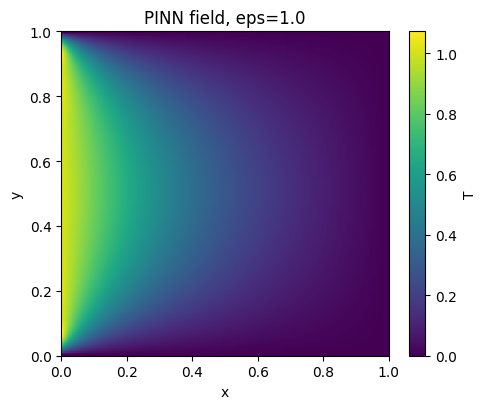

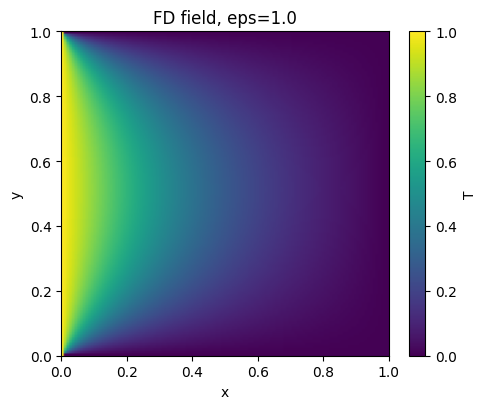

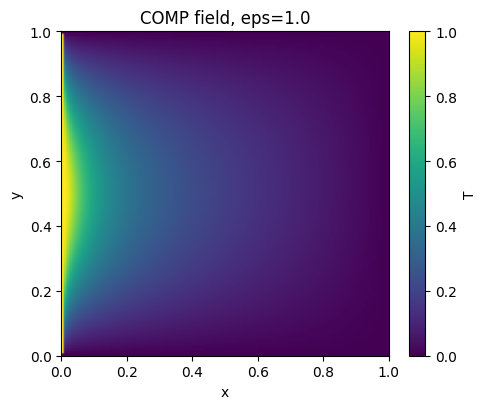

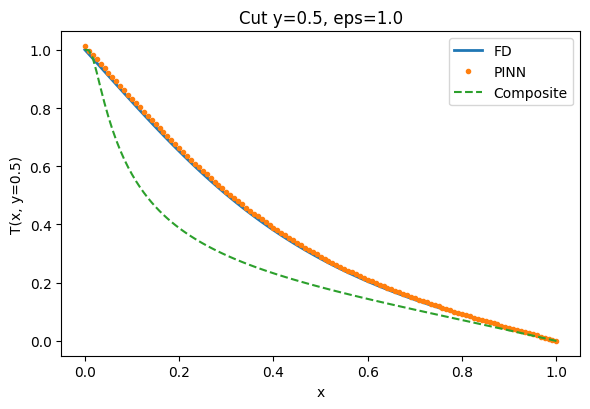

[eps=0.1|warm=True] Ep   25 | PDE 1.616e-01 | inlet*w 2.999e-01 | Total 4.615e-01
[eps=0.1|warm=True] Ep   50 | PDE 7.072e-02 | inlet*w 1.763e-01 | Total 2.470e-01
[eps=0.1|warm=True] Ep   75 | PDE 4.307e-02 | inlet*w 2.025e-01 | Total 2.456e-01
[eps=0.1|warm=True] Ep  100 | PDE 3.563e-02 | inlet*w 1.436e-01 | Total 1.793e-01
[eps=0.1|warm=True] Ep  125 | PDE 3.011e-02 | inlet*w 1.502e-01 | Total 1.803e-01
[eps=0.1|warm=True] Ep  150 | PDE 2.808e-02 | inlet*w 1.260e-01 | Total 1.541e-01
[eps=0.1|warm=True] Ep  175 | PDE 2.442e-02 | inlet*w 1.426e-01 | Total 1.670e-01
[eps=0.1|warm=True] Ep  200 | PDE 2.655e-02 | inlet*w 1.465e-01 | Total 1.730e-01
[eps=0.1|warm=True] Ep  300 | PDE 2.505e-02 | inlet*w 1.320e-01 | Total 1.571e-01
[eps=0.1|warm=False] Ep   25 | PDE 3.835e-02 | inlet*w 1.638e-01 | Total 2.021e-01
[eps=0.1|warm=False] Ep   50 | PDE 2.905e-02 | inlet*w 1.437e-01 | Total 1.728e-01
[eps=0.1|warm=False] Ep   75 | PDE 2.739e-02 | inlet*w 1.395e-01 | Total 1.669e-01
[eps=0.1|warm

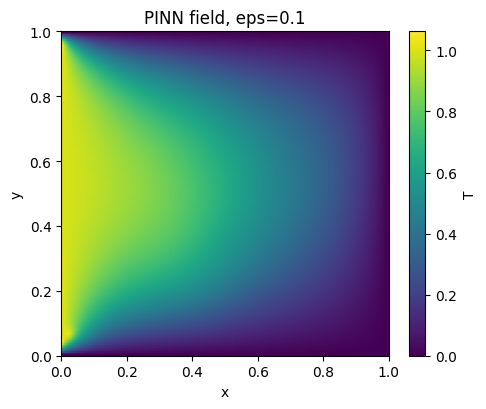

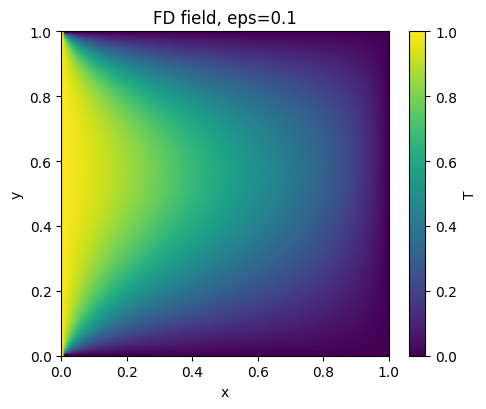

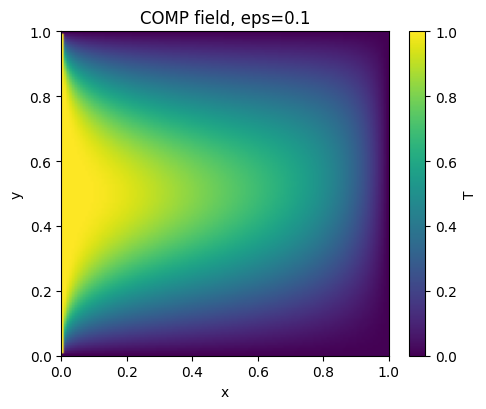

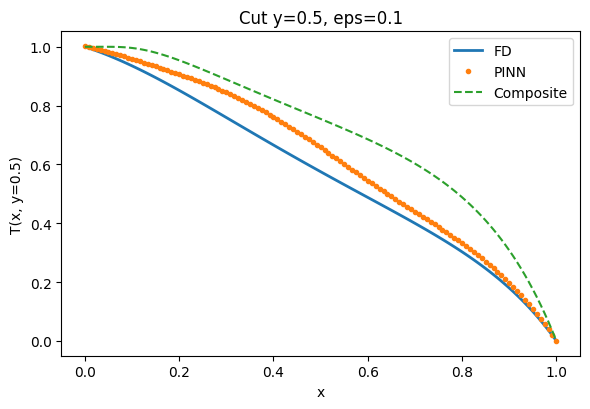

[eps=0.06|warm=True] Ep   25 | PDE 8.649e-01 | inlet*w 8.013e-01 | Total 1.666e+00
[eps=0.06|warm=True] Ep   50 | PDE 3.615e-01 | inlet*w 4.985e-01 | Total 8.600e-01
[eps=0.06|warm=True] Ep   75 | PDE 2.564e-01 | inlet*w 4.835e-01 | Total 7.399e-01
[eps=0.06|warm=True] Ep  100 | PDE 1.792e-01 | inlet*w 4.180e-01 | Total 5.973e-01
[eps=0.06|warm=True] Ep  125 | PDE 1.410e-01 | inlet*w 3.374e-01 | Total 4.784e-01
[eps=0.06|warm=True] Ep  150 | PDE 1.159e-01 | inlet*w 3.053e-01 | Total 4.211e-01
[eps=0.06|warm=True] Ep  175 | PDE 9.743e-02 | inlet*w 3.087e-01 | Total 4.062e-01
[eps=0.06|warm=True] Ep  200 | PDE 8.678e-02 | inlet*w 2.930e-01 | Total 3.797e-01
[eps=0.06|warm=True] Ep  300 | PDE 5.658e-02 | inlet*w 1.828e-01 | Total 2.394e-01
[eps=0.06|warm=False] Ep   25 | PDE 5.966e-02 | inlet*w 1.580e-01 | Total 2.176e-01
[eps=0.06|warm=False] Ep   50 | PDE 4.709e-02 | inlet*w 1.208e-01 | Total 1.679e-01
[eps=0.06|warm=False] Ep   75 | PDE 3.535e-02 | inlet*w 1.115e-01 | Total 1.468e-01
[

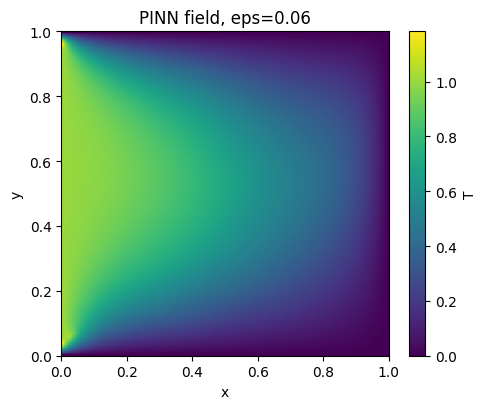

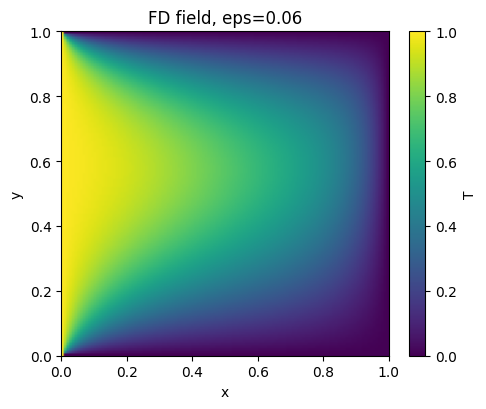

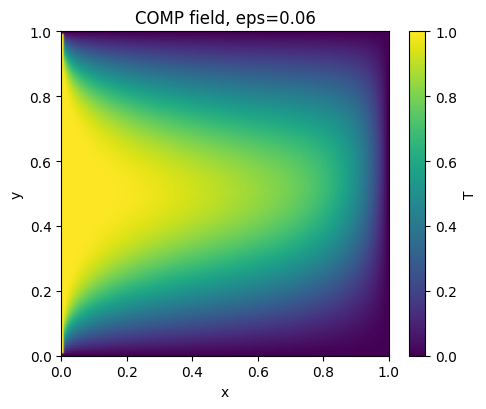

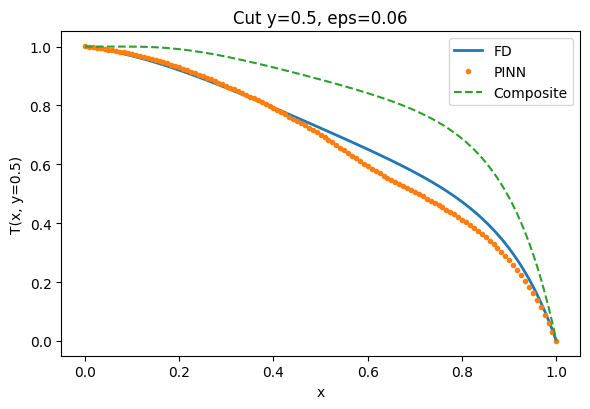

[eps=0.04|warm=True] Ep   25 | PDE 4.425e-01 | inlet*w 1.539e+00 | Total 1.982e+00
[eps=0.04|warm=True] Ep   50 | PDE 3.603e-01 | inlet*w 4.323e-01 | Total 7.925e-01
[eps=0.04|warm=True] Ep   75 | PDE 3.668e-01 | inlet*w 2.732e-01 | Total 6.400e-01
[eps=0.04|warm=True] Ep  100 | PDE 2.900e-01 | inlet*w 2.466e-01 | Total 5.367e-01
[eps=0.04|warm=True] Ep  125 | PDE 2.315e-01 | inlet*w 1.879e-01 | Total 4.195e-01
[eps=0.04|warm=True] Ep  150 | PDE 1.825e-01 | inlet*w 1.925e-01 | Total 3.750e-01
[eps=0.04|warm=True] Ep  175 | PDE 1.508e-01 | inlet*w 2.032e-01 | Total 3.540e-01
[eps=0.04|warm=True] Ep  200 | PDE 1.310e-01 | inlet*w 2.038e-01 | Total 3.349e-01
[eps=0.04|warm=True] Ep  300 | PDE 8.171e-02 | inlet*w 1.413e-01 | Total 2.230e-01
[eps=0.04|warm=False] Ep   25 | PDE 1.227e-01 | inlet*w 1.714e-01 | Total 2.942e-01
[eps=0.04|warm=False] Ep   50 | PDE 6.978e-02 | inlet*w 1.371e-01 | Total 2.069e-01
[eps=0.04|warm=False] Ep   75 | PDE 5.845e-02 | inlet*w 1.405e-01 | Total 1.989e-01
[

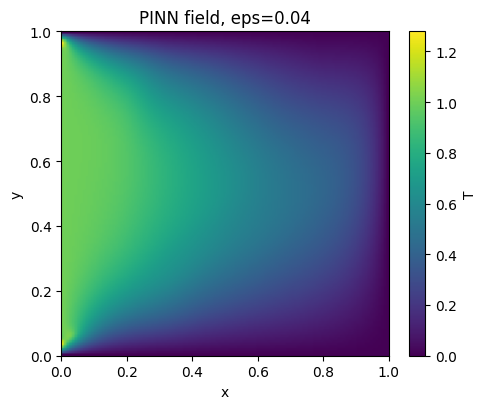

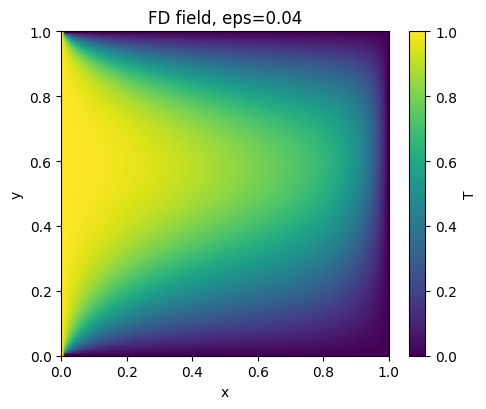

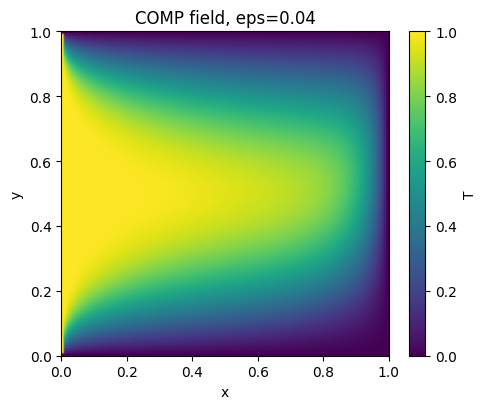

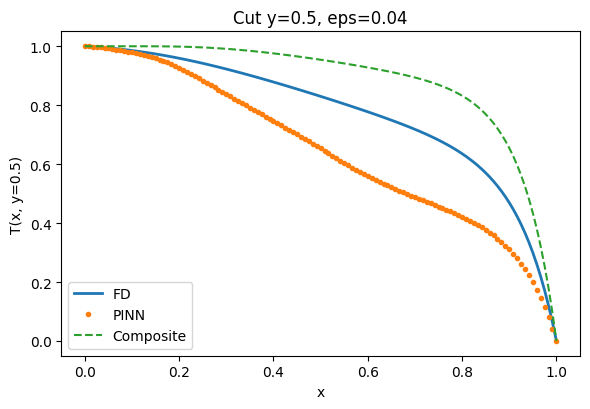


Tabla LaTeX (errores vs FD; global, núcleo y p99):
\begin{table}[H]
\centering
\caption{Errors of PINN and Composite against FD on a $121\times121$ grid. Core excludes one-cell boundary.}
\begin{tabular}{lcccccc}
\toprule
$\varepsilon$ & $L^2$ & $L^\infty$ & MAE & $L^2_{\text{core}}$ & $L^\infty_{\text{core}}$ & P99 \\
\midrule
\multicolumn{7}{l}{\textbf{PINN vs FD} ($\varepsilon=1$)} \\
 & 2.050e-02 & 1.000e+00 & 5.731e-03 & 1.104e-02 & 3.474e-01 & 2.032e-02 \\
\multicolumn{7}{l}{\textbf{Composite vs FD} ($\varepsilon=1$)} \\
 & 1.586e-01 & 1.000e+00 & 1.025e-01 & 1.608e-01 & 7.171e-01 & 4.919e-01 \\
\multicolumn{7}{l}{\textbf{PINN vs FD} ($\varepsilon=0.1$)} \\
 & 5.518e-02 & 1.000e+00 & 3.751e-02 & 5.385e-02 & 2.671e-01 & 1.479e-01 \\
\multicolumn{7}{l}{\textbf{Composite vs FD} ($\varepsilon=0.1$)} \\
 & 1.078e-01 & 1.000e+00 & 8.042e-02 & 1.090e-01 & 6.147e-01 & 3.042e-01 \\
\multicolumn{7}{l}{\textbf{PINN vs FD} ($\varepsilon=0.06$)} \\
 & 4.403e-02 & 1.000e+00 & 3.018e-02 & 4.21

In [ ]:
# %% PINN Couette FULL + Curriculum + Outlet-focus + RAR + Métricas robustas (listo para pegar)
import os, random
import numpy as np
import pandas as pd
import torch, torch.nn as nn, torch.optim as optim
import matplotlib.pyplot as plt
from scipy.sparse import lil_matrix, csc_matrix
from scipy.sparse.linalg import spsolve
from scipy.special import gammaincc

# ---------------- Configuración ----------------
CURRICULUM_EPS = [1.0, 0.1, 0.06, 0.04]   # orden de entrenamiento (warm-start)
GRID_N   = 121
T0, Tw   = 1.0, 0.0
SEED     = 1234
SAVE_DIR = "/content/outputs"
os.makedirs(SAVE_DIR, exist_ok=True)

# Entrenamiento (OOM-safe)
NR_WARMUP, NB_WARMUP = 2000, 600
NR_MAIN,   NB_MAIN   = 7000, 1000
MICRO_WARMUP = 800
MICRO_MAIN   = 2000
EPOCHS_WARMUP = 300
EPOCHS_MAIN   = 5000
LBFGS_IT      = 600

# Red
WIDTH, DEPTH = 48, 4
MODEL_NAME   = "couette_pinn"

# Muestreo y pesos
INLET_MARGIN = 0.05
STRIP_X0     = 0.02
BIAS_POW     = 8.0          # sesgo fuerte a x→1
OUTLET_STRIPE = (0.85, 1.0) # franja de salida
FRAC_OUTLET   = 0.35        # ~35% puntos en franja de salida
W_REGION      = 6.0         # peso adicional en PDE para x>0.85

# RAR
RAR_ROUNDS   = 2
RAR_POOL     = 20000        # puntos para sondeo residual
RAR_ADD      = 3000         # puntos nuevos añadidos por ronda

# ---------------- Utilidades ----------------
def set_seed(s=SEED):
    random.seed(s); np.random.seed(s); torch.manual_seed(s)
set_seed()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

# Red + transform
class MLP(nn.Module):
    def __init__(self, in_dim=2, out_dim=1, width=WIDTH, depth=DEPTH):
        super().__init__()
        layers = [nn.Linear(in_dim, width), nn.Tanh()]
        for _ in range(depth-1):
            layers += [nn.Linear(width, width), nn.Tanh()]
        layers += [nn.Linear(width, out_dim)]
        self.net = nn.Sequential(*layers)
        for m in self.net:
            if isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight); nn.init.zeros_(m.bias)
    def forward(self, z):  # z en [-1,1]^2
        return self.net(z)

def output_transform(xy, raw):
    x = xy[:,0:1]; y = xy[:,1:2]
    g = (1.0 - x) * y * (1.0 - y)
    return Tw + g * raw

def to_net_coords(xy): return 2.0*xy - 1.0

def T_model(net, xy):
    z = to_net_coords(xy)
    return output_transform(xy, net(z))

# PDE residual y pérdida (con ponderación de región)
def pde_residual(net, xy, eps):
    xy = xy.clone().detach().requires_grad_(True)
    T  = T_model(net, xy)
    grads = torch.autograd.grad(T, xy, torch.ones_like(T), retain_graph=True, create_graph=True)[0]
    Tx, Ty = grads[:,0:1], grads[:,1:2]
    g2x = torch.autograd.grad(Tx, xy, torch.ones_like(Tx), retain_graph=True, create_graph=True)[0]
    g2y = torch.autograd.grad(Ty, xy, torch.ones_like(Ty), retain_graph=True, create_graph=True)[0]
    Txx, Tyy = g2x[:,0:1], g2y[:,1:2]
    eps = torch.as_tensor(eps, dtype=T.dtype, device=T.device)
    y   = xy[:,1:2]
    return y*Tx - eps*(Txx + Tyy)

def region_weight(xy):
    x = xy[:,0:1]
    w = torch.ones_like(x)
    w = w + (W_REGION-1.0)*(x > OUTLET_STRIPE[0]).float()  # mayor peso en x>0.85
    return w

def pde_loss_micro(net, XY, eps, micro):
    n = XY.shape[0]; total = XY.new_tensor(0.0); k=0
    for i in range(0, n, micro):
        X = XY[i:i+micro]
        R = pde_residual(net, X, eps)
        w = region_weight(X)
        total = total + torch.mean((w*R)**2)
        k+=1
    return total/max(k,1)

mse = lambda a: torch.mean(a**2)

# Muestreo (con franja de salida)
def sample_interior(N, device):
    N_out = int(N*FRAC_OUTLET)
    N_rest= N - N_out
    # frente
    N_front = N_rest//2
    x1 = torch.rand(N_front,1,device=device)*0.2
    y1 = torch.rand(N_front,1,device=device)
    # sesgado a x→1
    N_bias = N_rest - N_front
    u = torch.rand(N_bias,1,device=device); x2 = 1 - (1-u)**BIAS_POW
    y2 = torch.rand(N_bias,1,device=device)
    # franja salida
    xl, xr = OUTLET_STRIPE
    x3 = torch.rand(N_out,1,device=device)*(xr-xl)+xl
    y3 = torch.rand(N_out,1,device=device)
    X = torch.cat([x1,x2,x3], dim=0)
    Y = torch.cat([y1,y2,y3], dim=0)
    return torch.cat([X,Y], dim=1)

def bd_x0(N, device):
    x = torch.zeros(N,1,device=device)
    y = torch.rand(N,1,device=device)*(1-2*INLET_MARGIN)+INLET_MARGIN
    return torch.cat([x,y], dim=1)

def bd_strip_x0(N, device, x_max=STRIP_X0):
    x = torch.rand(N,1,device=device)*x_max
    y = torch.rand(N,1,device=device)*(1-2*INLET_MARGIN)+INLET_MARGIN
    return torch.cat([x,y], dim=1)

# RAR: añade puntos donde el residual es mayor
def rar_augment(net, eps, base_XY, add=RAR_ADD, pool=RAR_POOL):
    with torch.no_grad():
        XYpool = torch.rand(pool,2,device=device)  # uniforme en dominio
    XYpool.requires_grad_(True)
    R = pde_residual(net, XYpool, eps).detach().abs().view(-1)
    idx = torch.topk(R, k=min(add, R.numel())).indices
    return torch.cat([base_XY, XYpool[idx]], dim=0)

# Composite (diagnóstico opcional)
# --- REEMPLAZA tu composite_couette por esta versión ---
from scipy.special import gammaincc

def composite_couette(x_grid, y_grid, eps, h=1.0, T0=1.0, Tw=0.0, p=2):
    """
    Composite para y*T_x = eps*(T_xx + T_yy) con:
      - Entrada x=0: T = T0
      - Muros y=0,y=h: T = Tw
      - Salida x=1: T = Tw
    Usa Q(s,z)=gammaincc(s,z) con s=1/3, unión de capas de pared por inclusión–exclusión
    y una ventana w(x)=x**p para que la capa de salida esté apagada en x=0.
    Devuelve un array de forma [Nx, Ny] con indexing='ij'.
    """
    X, Y = np.meshgrid(x_grid, y_grid, indexing='ij')
    s     = 1.0/3.0
    delta = 1e-12

    # Capas de pared (gamma regularizada); evitar división por cero en x=0
    z1 = (Y**3)        / (3.0*eps*np.maximum(X, delta))       # pared inferior
    z2 = ((h - Y)**3)  / (3.0*eps*np.maximum(X, delta))       # pared superior
    Qb = gammaincc(s, z1)
    Qt = gammaincc(s, z2)

    # Unión de capas: inclusión–exclusión
    S = Qb + Qt - Qb*Qt          # 0 en núcleo, 1 cerca de muros
    core = 1.0 - S

    # Capa de salida sólo en el núcleo, con ventana w(0)=0, w(1)=1
    w = X**p
    outlet = np.exp(-(1.0 - X)*Y/eps)

    Tcomp = T0 + (Tw - T0) * ( S + w*outlet*core )
    return Tcomp


# FD de referencia (difusión central + upwind en x)
def solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N):
    xs = np.linspace(0,1,Nx); ys = np.linspace(0,1,Ny)
    hx = xs[1]-xs[0]; hy = ys[1]-ys[0]
    def idx(i,j): return j*Nx + i
    N = Nx*Ny
    A = lil_matrix((N,N), dtype=float)
    b = np.zeros(N, dtype=float)
    for j in range(Ny):
        y = ys[j]
        for i in range(Nx):
            k = idx(i,j)
            if i==0:      A[k,k]=1; b[k]=1;  continue
            if i==Nx-1:   A[k,k]=1; b[k]=0;  continue
            if j==0 or j==Ny-1: A[k,k]=1; b[k]=0; continue
            cx = eps/(hx*hx); cy = eps/(hy*hy); conv = y/hx
            A[k, idx(i-1,j)] += ( cx + conv)   # upwind
            A[k, idx(i+1,j)] += ( cx)
            A[k, idx(i,  j-1)] += ( cy)
            A[k, idx(i,  j+1)] += ( cy)
            A[k, k]           += (-2*cx - 2*cy - conv)
    T = spsolve(csc_matrix(A), b).reshape(Ny, Nx)
    return np.array(T.T, dtype=np.float64)

# Métricas robustas
def metrics_all(Tp, Tr):
    E = Tp - Tr
    L2   = float(np.sqrt(np.mean(E**2)))
    Linf = float(np.max(np.abs(E)))
    MAE  = float(np.mean(np.abs(E)))
    # núcleo (quita 1 celda de borde)
    core = (slice(1,-1), slice(1,-1))
    Ec   = E[core]
    L2c   = float(np.sqrt(np.mean(Ec**2)))
    Linfc = float(np.max(np.abs(Ec)))
    MAEc  = float(np.mean(np.abs(Ec)))
    p99   = float(np.percentile(np.abs(E).ravel(), 99))
    return dict(L2=L2, Linf=Linf, MAE=MAE, L2_core=L2c, Linf_core=Linfc, MAE_core=MAEc, P99=p99)

def should_log(ep, total):
    if ep<=200: return ep%25==0
    if ep<=1000:return ep%100==0
    return ep%max(total//12,500)==0

# Entrena una fase (con opción RAR)
def train_phase(net, eps, NR, NB, MICRO, EPOCHS, W_INLET, do_rar=False):
    opt = optim.Adam(net.parameters(), lr=1e-3)
    XYr = sample_interior(NR, device)
    for ep in range(1, EPOCHS+1):
        # RAR cada cierto tiempo
        if do_rar and ep in [int(EPOCHS*0.4), int(EPOCHS*0.75)]:
            XYr = rar_augment(net, eps, XYr, add=RAR_ADD, pool=RAR_POOL)

        X0  = bd_x0(NB, device)
        X0s = bd_strip_x0(NB, device, x_max=STRIP_X0)

        loss_pde = pde_loss_micro(net, XYr, eps, micro=MICRO)
        loss_bc  = mse(T_model(net, X0)-T0) + mse(T_model(net, X0s)-T0)
        loss     = loss_pde + W_INLET*loss_bc

        opt.zero_grad(); loss.backward(); opt.step()

        if should_log(ep, EPOCHS):
            print(f"[eps={eps:.3g}|warm={NR==NR_WARMUP}] Ep {ep:4d} | PDE {loss_pde.item():.3e} | inlet*w {W_INLET*loss_bc.item():.3e} | Total {loss.item():.3e}")

# Ejecuta un caso con warm-up → main → L-BFGS
def run_case(eps, init_state_dict=None):
    set_seed()
    net = MLP().to(device)
    if init_state_dict is not None:
        net.load_state_dict(init_state_dict)

    W_INLET = 50.0 if eps>=0.5 else 100.0

    # warm-up (sin RAR, feedback rápido)
    train_phase(net, eps, NR_WARMUP, NB_WARMUP, MICRO_WARMUP, EPOCHS_WARMUP, W_INLET, do_rar=False)
    # fase principal (con RAR)
    train_phase(net, eps, NR_MAIN, NB_MAIN, MICRO_MAIN, EPOCHS_MAIN, W_INLET, do_rar=True)

    # L-BFGS breve en minibatch fijo
    XYc  = sample_interior(4000, device)
    X0c  = bd_x0(NB_MAIN, device)
    X0sc = bd_strip_x0(NB_MAIN, device, x_max=STRIP_X0)
    opt2 = optim.LBFGS(net.parameters(), lr=1.0, max_iter=LBFGS_IT, history_size=50, line_search_fn="strong_wolfe")
    def closure():
        opt2.zero_grad()
        loss = pde_loss_micro(net, XYc, eps, micro=MICRO_MAIN) \
             + W_INLET*mse(T_model(net, X0c)-T0) + W_INLET*mse(T_model(net, X0sc)-T0)
        loss.backward(); return loss
    print(f"[eps={eps:.3g}] L-BFGS x{LBFGS_IT}..."); opt2.step(closure)

    # Evaluación vs FD + figuras
    xs = np.linspace(0,1,GRID_N); ys = np.linspace(0,1,GRID_N)
    xs_t = torch.tensor(xs, dtype=torch.float32, device=device)
    ys_t = torch.tensor(ys, dtype=torch.float32, device=device)
    Xg, Yg = torch.meshgrid(xs_t, ys_t, indexing='ij')
    XY = torch.stack([Xg.reshape(-1), Yg.reshape(-1)], dim=1)
    with torch.no_grad():
        Tpred = T_model(net, XY).reshape(GRID_N, GRID_N).cpu().numpy()
    Tfd = solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N)
    Tcomp = composite_couette(xs, ys, eps)

    m_pinn = metrics_all(Tpred, Tfd)
    m_comp = metrics_all(Tcomp, Tfd)
    print(f"[eps={eps:.3g}] PINN vs FD -> {m_pinn}")
    print(f"[eps={eps:.3g}] COMP vs FD -> {m_comp}")

    # Guardar CSV + mapas + corte
    pd.DataFrame(Tpred, index=xs, columns=ys).to_csv(f"{SAVE_DIR}/T_PINN_eps_{eps:.3g}_{MODEL_NAME}.csv", float_format="%.6f")
    pd.DataFrame(Tfd,   index=xs, columns=ys).to_csv(f"{SAVE_DIR}/T_FD_eps_{eps:.3g}.csv", float_format="%.6f")
    pd.DataFrame(Tcomp, index=xs, columns=ys).to_csv(f"{SAVE_DIR}/T_Composite_eps_{eps:.3g}.csv", float_format="%.6f")

    for tag, Tmat in [("PINN",Tpred), ("FD",Tfd), ("COMP",Tcomp)]:
        plt.figure(figsize=(5.0,4.2))
        im=plt.imshow(Tmat.T, origin='lower', extent=[0,1,0,1], aspect='auto')
        plt.colorbar(im,label='T'); plt.xlabel('x'); plt.ylabel('y'); plt.title(f'{tag} field, eps={eps}')
        plt.tight_layout(); plt.savefig(f"{SAVE_DIR}/{tag}_field_eps_{eps:.3g}.png", dpi=140); plt.show()

    jmid = GRID_N//2
    plt.figure(figsize=(6.0,4.2))
    plt.plot(xs, Tfd[:,jmid], '-',  lw=2, label='FD')
    plt.plot(xs, Tpred[:,jmid], 'o', ms=3, label='PINN')
    plt.plot(xs, Tcomp[:,jmid], '--', lw=1.5, label='Composite')
    plt.xlabel('x'); plt.ylabel('T(x, y=0.5)'); plt.title(f'Cut y=0.5, eps={eps}')
    plt.legend(); plt.tight_layout(); plt.savefig(f"{SAVE_DIR}/cut_y05_eps_{eps:.3g}.png", dpi=150); plt.show()

    if torch.cuda.is_available(): torch.cuda.empty_cache()
    return net.state_dict(), m_pinn, m_comp

# ---------------- Loop curriculum (warm-start) + tabla ----------------
results = []
state = None
for eps in CURRICULUM_EPS:
    print("="*72)
    state, m_pinn, m_comp = run_case(eps, init_state_dict=state)
    results.append((eps, m_pinn, m_comp))

print("\nTabla LaTeX (errores vs FD; global, núcleo y p99):")
print(r"\begin{table}[H]")
print(r"\centering")
print(r"\caption{Errors of PINN and Composite against FD on a $121\times121$ grid. Core excludes one-cell boundary.}")
print(r"\begin{tabular}{lcccccc}")
print(r"\toprule")
print(r"$\varepsilon$ & $L^2$ & $L^\infty$ & MAE & $L^2_{\text{core}}$ & $L^\infty_{\text{core}}$ & P99 \\")
print(r"\midrule")
for eps, m_pinn, m_comp in results:
    print(rf"\multicolumn{{7}}{{l}}{{\textbf{{PINN vs FD}} ($\varepsilon={eps:g}$)}} \\")
    print(rf" & {m_pinn['L2']:.3e} & {m_pinn['Linf']:.3e} & {m_pinn['MAE']:.3e} & {m_pinn['L2_core']:.3e} & {m_pinn['Linf_core']:.3e} & {m_pinn['P99']:.3e} \\")
    print(rf"\multicolumn{{7}}{{l}}{{\textbf{{Composite vs FD}} ($\varepsilon={eps:g}$)}} \\")
    print(rf" & {m_comp['L2']:.3e} & {m_comp['Linf']:.3e} & {m_comp['MAE']:.3e} & {m_comp['L2_core']:.3e} & {m_comp['Linf_core']:.3e} & {m_comp['P99']:.3e} \\")
print(r"\bottomrule")
print(r"\end{tabular}")
print(r"\end{table}")



In [ ]:
import os, random
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from scipy.sparse import lil_matrix, csc_matrix
from scipy.sparse.linalg import spsolve

# ===================== Configuración general =====================
M_SHEAR = 2          # exponente del perfil de velocidad u(y) = y^M_SHEAR
CURRICULUM_EPS = [1.0, 0.1]   # valores de epsilon a recorrer
GRID_N   = 121
T0, Tw   = 1.0, 0.0      # T0 placa superior, Tw placa inferior
SEED     = 1234
SAVE_DIR = "/content/outputs"
os.makedirs(SAVE_DIR, exist_ok=True)

# Entrenamiento
EPOCHS_PER_EPS = 2000
MICRO_RES      = 4000
BATCH_FD       = 4000
LR             = 1e-3

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.manual_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)

# ===================== Definición de la red PINN =====================

class PINN(nn.Module):
    def __init__(self, in_dim=2, out_dim=1, hidden_layers=7, hidden_neurons=128):
        super().__init__()
        layers = []
        last_dim = in_dim
        for _ in range(hidden_layers):
            layers.append(nn.Linear(last_dim, hidden_neurons))
            layers.append(nn.Tanh())
            last_dim = hidden_neurons
        layers.append(nn.Linear(last_dim, out_dim))
        self.net = nn.Sequential(*layers)

    def forward(self, x):
        return self.net(x)

# ===================== Utilidades varias =====================

def couette_u(y, m=M_SHEAR):
    """Perfil de velocidad u(y) = y^m (solo componente en x)."""
    return y**m

def pde_residual(model, xy, eps, m_shear=M_SHEAR):
    """
    Residuo de la ecuación estacionaria de advección-difusión 2D:
        u(y) * T_x = eps * (T_xx + T_yy)
    con u(y) = y^m.
    """
    xy = xy.clone().detach().requires_grad_(True)
    T = model(xy)  # (N,1)
    x = xy[:, 0:1]
    y = xy[:, 1:2]

    # Gradientes
    grad_T = torch.autograd.grad(T, xy, torch.ones_like(T),
                                 retain_graph=True, create_graph=True)[0]
    T_x = grad_T[:, 0:1]
    T_y = grad_T[:, 1:2]

    grad_Tx = torch.autograd.grad(T_x, xy, torch.ones_like(T_x),
                                  retain_graph=True, create_graph=True)[0]
    grad_Ty = torch.autograd.grad(T_y, xy, torch.ones_like(T_y),
                                  retain_graph=True, create_graph=True)[0]

    T_xx = grad_Tx[:, 0:1]
    T_yy = grad_Ty[:, 1:2]

    u = couette_u(y, m_shear)
    res = u * T_x - eps * (T_xx + T_yy)
    return res

def sample_interior(n_pts):
    """Muestrea puntos interiores en (0,1)x(0,1)."""
    x = np.random.rand(n_pts, 1)
    y = np.random.rand(n_pts, 1)
    xy = np.hstack([x, y])
    return torch.tensor(xy, dtype=torch.float32, device=DEVICE)

def sample_bc(N_side):
    """
    Muestra puntos de frontera:
    - x = 0  (inlet, T=1)
    - y = 0  (pared inferior, T=0)
    - x = 1, y in (0,1)  (Neumann aprox: dT/dx=0)
    - y = 1, x in (0,1)  (Neumann aprox: dT/dy=0)
    """
    xs = np.linspace(0, 1, N_side)
    ys = np.linspace(0, 1, N_side)

    # Inlet x=0, T=1
    x0 = np.zeros((N_side,1))
    y0 = ys[:,None]
    bc_in = np.hstack([x0, y0])

    # bottom y=0, T=0
    xb = xs[:,None]
    yb = np.zeros((N_side,1))
    bc_bottom = np.hstack([xb, yb])

    # outlet x=1
    xo = np.ones((N_side,1))
    yo = ys[:,None]
    bc_out = np.hstack([xo, yo])

    # top y=1
    xt = xs[:,None]
    yt = np.ones((N_side,1))
    bc_top = np.hstack([xt, yt])

    return (
        torch.tensor(bc_in, dtype=torch.float32, device=DEVICE),
        torch.tensor(bc_bottom, dtype=torch.float32, device=DEVICE),
        torch.tensor(bc_out, dtype=torch.float32, device=DEVICE),
        torch.tensor(bc_top, dtype=torch.float32, device=DEVICE),
    )

def loss_bc(model, eps, N_side=200):
    bc_in, bc_bottom, bc_out, bc_top = sample_bc(N_side)

    # Dirichlet
    T_in = model(bc_in)
    T_bottom = model(bc_bottom)
    loss_in = torch.mean((T_in - T0)**2)
    loss_bottom = torch.mean((T_bottom - Tw)**2)

    # Neumann "suave": imponemos gradiente ~ 0
    bc_out.requires_grad_(True)
    bc_top.requires_grad_(True)

    T_out = model(bc_out)
    T_top = model(bc_top)

    grad_out = torch.autograd.grad(T_out, bc_out, torch.ones_like(T_out),
                                   retain_graph=True, create_graph=True)[0]
    grad_top = torch.autograd.grad(T_top, bc_top, torch.ones_like(T_top),
                                   retain_graph=True, create_graph=True)[0]

    dTdx_out = grad_out[:, 0:1]
    dTdy_top = grad_top[:, 1:2]

    loss_out = torch.mean(dTdx_out**2)
    loss_top = torch.mean(dTdy_top**2)

    return loss_in + loss_bottom + loss_out + loss_top

# ===================== Interpolación FD-anchor =====================

def fd_grid(GRID_N):
    xs = np.linspace(0, 1, GRID_N)
    ys = np.linspace(0, 1, GRID_N)
    X, Y = np.meshgrid(xs, ys, indexing="ij")
    return X, Y

def bilinear_interp_fd(xy, X, Y, T_fd):
    """
    Interpolación bilineal sobre la malla FD.
    xy: (N,2) tensores en [0,1]^2 (torch, en DEVICE)
    X,Y,T_fd: arrays numpy de tamaño (Ngrid,Ngrid)
    """
    xs = X[:,0]
    ys = Y[0,:]
    dx = xs[1] - xs[0]
    dy = ys[1] - ys[0]

    x = xy[:,0].detach().cpu().numpy()
    y = xy[:,1].detach().cpu().numpy()

    # Índices enteros de celda
    ix = np.clip(((x - xs[0]) / dx).astype(int), 0, len(xs)-2)
    iy = np.clip(((y - ys[0]) / dy).astype(int), 0, len(ys)-2)

    x1 = xs[ix]
    x2 = xs[ix+1]
    y1 = ys[iy]
    y2 = ys[iy+1]

    # Pesos
    wx = (x - x1) / (x2 - x1 + 1e-12)
    wy = (y - y1) / (y2 - y1 + 1e-12)

    # Valores nodales
    f11 = T_fd[ix    , iy    ]
    f21 = T_fd[ix + 1, iy    ]
    f12 = T_fd[ix    , iy + 1]
    f22 = T_fd[ix + 1, iy + 1]

    # Interpolación bilineal
    val = (
        (1-wx)*(1-wy)*f11 +
        wx*(1-wy)*f21 +
        (1-wx)*wy*f12 +
        wx*wy*f22
    )
    return torch.tensor(val[:,None], dtype=torch.float32, device=DEVICE)

def loss_fd_anchor(model, xy_fd, X_fd, Y_fd, T_fd, weight=1.0):
    """
    Pérdida de anclaje: || T_pinn(x,y) - T_fd(x,y) ||^2 en los puntos xy_fd.
    """
    T_pinn = model(xy_fd)
    T_ref  = bilinear_interp_fd(xy_fd, X_fd, Y_fd, T_fd)
    return weight * torch.mean((T_pinn - T_ref)**2)

# ===================== Solver FD (básico, puedes reemplazarlo por el tuyo) =====================

def solve_fd_couette(eps, m_shear=M_SHEAR, N=GRID_N):
    """
    Resuelve un problema estacionario de advección-difusión
        u(y) T_x = eps (T_xx + T_yy)
    con u(y) = y^m, en [0,1]^2,
    con T=1 en x=0, T=0 en y=0, Neumann homogénea en x=1,y=1 (aprox).
    Es un solver sencillo para generar la referencia T_fd.
    """
    xs = np.linspace(0, 1, N)
    ys = np.linspace(0, 1, N)
    dx = xs[1] - xs[0]
    dy = ys[1] - ys[0]

    X, Y = np.meshgrid(xs, ys, indexing="ij")

    n_tot = N * N
    A = lil_matrix((n_tot, n_tot))
    b = np.zeros(n_tot)

    def idx(i,j):
        return i*N + j

    for i in range(N):
        for j in range(N):
            k = idx(i,j)
            x = xs[i]
            y = ys[j]

            # Bordes Dirichlet
            if i == 0:  # x=0, inlet T=1
                A[k,k] = 1.0
                b[k]   = T0
                continue
            if j == 0:  # y=0, bottom T=0
                A[k,k] = 1.0
                b[k]   = Tw
                continue

            # Bordes Neumann simples (dT/dn=0 aprox) en x=1, y=1
            if i == N-1:
                # aprox T[i,j] - T[i-1,j] = 0  -> T[i,j] = T[i-1,j]
                A[k,k] = 1.0
                A[k,idx(i-1,j)] = -1.0
                continue
            if j == N-1:
                A[k,k] = 1.0
                A[k,idx(i,j-1)] = -1.0
                continue

            # Nodo interior: upwind en x, central en y
            u = y**m_shear

            # upwind T_x ~ (T[i,j] - T[i-1,j]) / dx
            # T_xx ~ (T[i+1,j] - 2T[i,j] + T[i-1,j]) / dx^2
            # T_yy ~ (T[i,j+1] - 2T[i,j] + T[i,j-1]) / dy^2
            coef_center = u / dx - 2*eps/dx**2 - 2*eps/dy**2
            coef_xm = -u/dx + eps/dx**2
            coef_xp = eps/dx**2
            coef_ym = eps/dy**2
            coef_yp = eps/dy**2

            A[k, idx(i,j)]     = coef_center
            A[k, idx(i-1,j)]   = coef_xm
            A[k, idx(i+1,j)]   = coef_xp
            A[k, idx(i,j-1)]   = coef_ym
            A[k, idx(i,j+1)]   = coef_yp
            b[k] = 0.0

    A_csc = csc_matrix(A)
    T_vec = spsolve(A_csc, b)
    T_fd = T_vec.reshape((N,N))
    return X, Y, T_fd

# ===================== Entrenamiento =====================

def train_pinn_couette():
    model = PINN().to(DEVICE)
    optimizer = optim.Adam(model.parameters(), lr=LR)

    for eps in CURRICULUM_EPS:
        print("="*70)
        print(f" Entrenando para eps = {eps}, m = {M_SHEAR}")
        print("="*70)

        # Resolver FD para este eps (anchor)
        X_fd, Y_fd, T_fd = solve_fd_couette(eps, M_SHEAR, GRID_N)

        # Entrenamiento
        for epoch in range(1, EPOCHS_PER_EPS+1):
            optimizer.zero_grad()

            # Puntos interiores para PDE
            xy_pde = sample_interior(MICRO_RES)

            # Pérdidas
            res = pde_residual(model, xy_pde, eps, M_SHEAR)
            loss_pde = torch.mean(res**2)

            loss_bc_val = loss_bc(model, eps, N_side=64)

            # Puntos para FD-anchor
            x_fd = np.random.rand(BATCH_FD,1)
            y_fd = np.random.rand(BATCH_FD,1)
            xy_fd = torch.tensor(np.hstack([x_fd,y_fd]),
                                 dtype=torch.float32, device=DEVICE)
            loss_fd_val = loss_fd_anchor(model, xy_fd, X_fd, Y_fd, T_fd, weight=1.0)

            loss = loss_pde + loss_bc_val + loss_fd_val

            loss.backward()
            optimizer.step()

            if epoch % 200 == 0 or epoch == 1:
                print(f"[eps={eps}] epoch {epoch}/{EPOCHS_PER_EPS} "
                      f"loss={loss.item():.3e} (PDE={loss_pde.item():.3e}, "
                      f"BC={loss_bc_val.item():.3e}, FD={loss_fd_val.item():.3e})")

        # Guardar modelo parcial
        torch.save(model.state_dict(),
                   os.path.join(SAVE_DIR, f"pinn_couette_eps_{eps:.2f}.pt"))

    return model

# ===================== Post-proceso: comparación visual =====================

def plot_comparison(model, eps, fname_prefix="couette"):
    model.eval()
    with torch.no_grad():
        X_fd, Y_fd, T_fd = solve_fd_couette(eps, M_SHEAR, GRID_N)
        xs = np.linspace(0, 1, GRID_N)
        ys = np.linspace(0, 1, GRID_N)
        XX, YY = np.meshgrid(xs, ys, indexing="ij")
        pts = np.stack([XX.ravel(), YY.ravel()], axis=1)
        pts_t = torch.tensor(pts, dtype=torch.float32, device=DEVICE)
        T_pinn = model(pts_t).cpu().numpy().reshape((GRID_N,GRID_N))

    fig, axs = plt.subplots(1,3, figsize=(15,4))
    im0 = axs[0].imshow(T_fd.T, origin="lower", extent=[0,1,0,1], aspect="auto")
    axs[0].set_title("FD reference")
    plt.colorbar(im0, ax=axs[0])

    im1 = axs[1].imshow(T_pinn.T, origin="lower", extent=[0,1,0,1], aspect="auto")
    axs[1].set_title("PINN hybrid")
    plt.colorbar(im1, ax=axs[1])

    im2 = axs[2].imshow((T_pinn-T_fd).T, origin="lower", extent=[0,1,0,1], aspect="auto")
    axs[2].set_title("Error (PINN - FD)")
    plt.colorbar(im2, ax=axs[2])

    for ax in axs:
        ax.set_xlabel("x")
        ax.set_ylabel("y")

    plt.tight_layout()
    out_png = os.path.join(SAVE_DIR, f"{fname_prefix}_eps_{eps:.2f}.png")
    plt.savefig(out_png, dpi=200)
    plt.close(fig)
    print(f"Figuras guardadas en {out_png}")

if __name__ == "__main__":
    model = train_pinn_couette()
    # ejemplo: graficar para el último eps
    plot_comparison(model, eps=CURRICULUM_EPS[-1], fname_prefix="couette_hybrid")


 Entrenando para eps = 1.0, m = 2
[eps=1.0] epoch 1/2000 loss=1.516e+00 (PDE=4.838e-06, BC=1.154e+00, FD=3.618e-01)
[eps=1.0] epoch 200/2000 loss=9.679e-02 (PDE=3.421e-03, BC=8.940e-02, FD=3.967e-03)
[eps=1.0] epoch 400/2000 loss=8.565e-02 (PDE=2.716e-03, BC=7.867e-02, FD=4.271e-03)
[eps=1.0] epoch 600/2000 loss=7.979e-02 (PDE=4.162e-03, BC=7.000e-02, FD=5.629e-03)
[eps=1.0] epoch 800/2000 loss=7.502e-02 (PDE=3.414e-03, BC=6.694e-02, FD=4.670e-03)
[eps=1.0] epoch 1000/2000 loss=6.595e-02 (PDE=2.880e-03, BC=5.900e-02, FD=4.074e-03)
[eps=1.0] epoch 1200/2000 loss=6.772e-02 (PDE=3.331e-03, BC=6.070e-02, FD=3.689e-03)
[eps=1.0] epoch 1400/2000 loss=6.562e-02 (PDE=5.223e-03, BC=5.786e-02, FD=2.537e-03)
[eps=1.0] epoch 1600/2000 loss=5.749e-02 (PDE=5.234e-03, BC=4.965e-02, FD=2.601e-03)
[eps=1.0] epoch 1800/2000 loss=7.073e-02 (PDE=8.985e-03, BC=5.809e-02, FD=3.652e-03)
[eps=1.0] epoch 2000/2000 loss=4.930e-02 (PDE=4.608e-03, BC=4.168e-02, FD=3.010e-03)
 Entrenando para eps = 0.1, m = 2
[eps

In [ ]:
import os, random
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from scipy.sparse import lil_matrix, csc_matrix
from scipy.sparse.linalg import spsolve

# ===================== Configuración general =====================
M_SHEAR = 2          # exponente del perfil de velocidad u(y) = y^M_SHEAR
CURRICULUM_EPS = [1.0, 0.1]   # valores de epsilon a recorrer
GRID_N   = 121
T0, Tw   = 1.0, 0.0      # T0 = 1 en x=0, Tw = 0 en las demás fronteras
SEED     = 1234
SAVE_DIR = "/content/outputs"
os.makedirs(SAVE_DIR, exist_ok=True)

# Entrenamiento
EPOCHS_PER_EPS = 2000
MICRO_RES      = 4000
BATCH_FD       = 4000
LR             = 1e-3

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.manual_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)

# ===================== Definición de la red PINN =====================

class PINN(nn.Module):
    def __init__(self, in_dim=2, out_dim=1, hidden_layers=7, hidden_neurons=128):
        super().__init__()
        layers = []
        last_dim = in_dim
        for _ in range(hidden_layers):
            layers.append(nn.Linear(last_dim, hidden_neurons))
            layers.append(nn.Tanh())
            last_dim = hidden_neurons
        layers.append(nn.Linear(last_dim, out_dim))
        self.net = nn.Sequential(*layers)

    def forward(self, x):
        return self.net(x)

# ===================== Utilidades varias =====================

def couette_u(y, m=M_SHEAR):
    """Perfil de velocidad u(y) = y^m (solo componente en x)."""
    return y**m

def pde_residual(model, xy, eps, m_shear=M_SHEAR):
    """
    Residuo de la ecuación estacionaria de advección-difusión 2D:
        u(y) * T_x = eps * (T_xx + T_yy)
    con u(y) = y^m.
    """
    xy = xy.clone().detach().requires_grad_(True)
    T = model(xy)  # (N,1)
    x = xy[:, 0:1]
    y = xy[:, 1:2]

    # Gradientes
    grad_T = torch.autograd.grad(
        T, xy, torch.ones_like(T),
        retain_graph=True, create_graph=True
    )[0]
    T_x = grad_T[:, 0:1]
    T_y = grad_T[:, 1:2]

    grad_Tx = torch.autograd.grad(
        T_x, xy, torch.ones_like(T_x),
        retain_graph=True, create_graph=True
    )[0]
    grad_Ty = torch.autograd.grad(
        T_y, xy, torch.ones_like(T_y),
        retain_graph=True, create_graph=True
    )[0]

    T_xx = grad_Tx[:, 0:1]
    T_yy = grad_Ty[:, 1:2]

    u = couette_u(y, m_shear)
    res = u * T_x - eps * (T_xx + T_yy)
    return res

def sample_interior(n_pts):
    """Muestrea puntos interiores en (0,1)x(0,1)."""
    x = np.random.rand(n_pts, 1)
    y = np.random.rand(n_pts, 1)
    xy = np.hstack([x, y])
    return torch.tensor(xy, dtype=torch.float32, device=DEVICE)

def sample_bc(N_side):
    """
    Muestra puntos de frontera:
    - x = 0  (inlet)
    - y = 0  (pared inferior)
    - x = 1  (salida)
    - y = 1  (pared superior)
    """
    xs = np.linspace(0, 1, N_side)
    ys = np.linspace(0, 1, N_side)

    # Inlet x=0
    x0 = np.zeros((N_side,1))
    y0 = ys[:,None]
    bc_in = np.hstack([x0, y0])

    # bottom y=0
    xb = xs[:,None]
    yb = np.zeros((N_side,1))
    bc_bottom = np.hstack([xb, yb])

    # outlet x=1
    xo = np.ones((N_side,1))
    yo = ys[:,None]
    bc_out = np.hstack([xo, yo])

    # top y=1
    xt = xs[:,None]
    yt = np.ones((N_side,1))
    bc_top = np.hstack([xt, yt])

    return (
        torch.tensor(bc_in, dtype=torch.float32, device=DEVICE),
        torch.tensor(bc_bottom, dtype=torch.float32, device=DEVICE),
        torch.tensor(bc_out, dtype=torch.float32, device=DEVICE),
        torch.tensor(bc_top, dtype=torch.float32, device=DEVICE),
    )

# ======= Pérdida de frontera: Dirichlet puro con inlet caliente =======

def loss_bc_dirichlet_inlet_hot(model, eps, N_side=200):
    """
    Condiciones de frontera:
      - x = 0  → T = T0  (inlet caliente)
      - y = 0  → T = Tw  (pared inferior fría)
      - y = 1  → T = Tw  (pared superior fría)
      - x = 1  → T = Tw  (salida fría)

    Convención:
      - En las esquinas que están en x=0 domina T0 (en sample_bc ya viene separado).
    """
    bc_in, bc_bottom, bc_out, bc_top = sample_bc(N_side)

    # x = 0 → T = T0
    T_in = model(bc_in)
    loss_in = torch.mean((T_in - T0)**2)

    # y = 0 → T = Tw
    T_bottom = model(bc_bottom)
    loss_bottom = torch.mean((T_bottom - Tw)**2)

    # x = 1 → T = Tw
    T_out = model(bc_out)
    loss_out = torch.mean((T_out - Tw)**2)

    # y = 1 → T = Tw
    T_top = model(bc_top)
    loss_top = torch.mean((T_top - Tw)**2)

    return loss_in + loss_bottom + loss_out + loss_top

# ===================== Interpolación FD-anchor =====================

def fd_grid(GRID_N):
    xs = np.linspace(0, 1, GRID_N)
    ys = np.linspace(0, 1, GRID_N)
    X, Y = np.meshgrid(xs, ys, indexing="ij")
    return X, Y

def bilinear_interp_fd(xy, X, Y, T_fd):
    """
    Interpolación bilineal sobre la malla FD.
    xy: (N,2) tensores en [0,1]^2 (torch, en DEVICE)
    X,Y,T_fd: arrays numpy de tamaño (Ngrid,Ngrid)
    """
    xs = X[:,0]
    ys = Y[0,:]
    dx = xs[1] - xs[0]
    dy = ys[1] - ys[0]

    x = xy[:,0].detach().cpu().numpy()
    y = xy[:,1].detach().cpu().numpy()

    # Índices enteros de celda
    ix = np.clip(((x - xs[0]) / dx).astype(int), 0, len(xs)-2)
    iy = np.clip(((y - ys[0]) / dy).astype(int), 0, len(ys)-2)

    x1 = xs[ix]
    x2 = xs[ix+1]
    y1 = ys[iy]
    y2 = ys[iy+1]

    # Pesos
    wx = (x - x1) / (x2 - x1 + 1e-12)
    wy = (y - y1) / (y2 - y1 + 1e-12)

    # Valores nodales
    f11 = T_fd[ix    , iy    ]
    f21 = T_fd[ix + 1, iy    ]
    f12 = T_fd[ix    , iy + 1]
    f22 = T_fd[ix + 1, iy + 1]

    # Interpolación bilineal
    val = (
        (1-wx)*(1-wy)*f11 +
        wx*(1-wy)*f21 +
        (1-wx)*wy*f12 +
        wx*wy*f22
    )
    return torch.tensor(val[:,None], dtype=torch.float32, device=DEVICE)

def loss_fd_anchor(model, xy_fd, X_fd, Y_fd, T_fd, weight=1.0):
    """
    Pérdida de anclaje: || T_pinn(x,y) - T_fd(x,y) ||^2 en los puntos xy_fd.
    """
    T_pinn = model(xy_fd)
    T_ref  = bilinear_interp_fd(xy_fd, X_fd, Y_fd, T_fd)
    return weight * torch.mean((T_pinn - T_ref)**2)

# ===================== Solver FD =====================

def solve_fd_couette(eps, m_shear=M_SHEAR, N=GRID_N):
    """
    Resuelve un problema estacionario de advección-difusión
        u(y) T_x = eps (T_xx + T_yy)
    con u(y) = y^m, en [0,1]^2,

    Condiciones de frontera:
      - x = 0  → T = T0
      - y = 0  → T = Tw
      - y = 1  → T = Tw
      - x = 1  → T = Tw

    Convención: en las esquinas x=0 domina T0 (ya que i==0 se evalúa primero).
    """
    xs = np.linspace(0, 1, N)
    ys = np.linspace(0, 1, N)
    dx = xs[1] - xs[0]
    dy = ys[1] - ys[0]

    X, Y = np.meshgrid(xs, ys, indexing="ij")

    n_tot = N * N
    A = lil_matrix((n_tot, n_tot))
    b = np.zeros(n_tot)

    def idx(i, j):
        return i*N + j

    for i in range(N):
        for j in range(N):
            k = idx(i, j)
            x = xs[i]
            y = ys[j]

            # --- Bordes Dirichlet ---
            if i == 0:          # x = 0 → T = T0
                A[k, k] = 1.0
                b[k] = T0
                continue

            if j == 0:          # y = 0 → T = Tw
                A[k, k] = 1.0
                b[k] = Tw
                continue

            if j == N-1:        # y = 1 → T = Tw
                A[k, k] = 1.0
                b[k] = Tw
                continue

            if i == N-1:        # x = 1 → T = Tw
                A[k, k] = 1.0
                b[k] = Tw
                continue

            # --- Nodo interior: upwind en x, central en y ---
            u = y**m_shear

            # upwind T_x ~ (T[i,j] - T[i-1,j]) / dx
            # T_xx ~ (T[i+1,j] - 2T[i,j] + T[i-1,j]) / dx^2
            # T_yy ~ (T[i,j+1] - 2T[i,j] + T[i,j-1]) / dy^2
            coef_center = u/dx - 2*eps/dx**2 - 2*eps/dy**2
            coef_xm = -u/dx + eps/dx**2
            coef_xp = eps/dx**2
            coef_ym = eps/dy**2
            coef_yp = eps/dy**2

            A[k, idx(i, j)    ] = coef_center
            A[k, idx(i-1, j)  ] = coef_xm
            A[k, idx(i+1, j)  ] = coef_xp
            A[k, idx(i, j-1)  ] = coef_ym
            A[k, idx(i, j+1)  ] = coef_yp
            b[k] = 0.0

    A_csc = csc_matrix(A)
    T_vec = spsolve(A_csc, b)
    T_fd = T_vec.reshape((N, N))
    return X, Y, T_fd

# ===================== Entrenamiento =====================

def train_pinn_couette():
    model = PINN().to(DEVICE)
    optimizer = optim.Adam(model.parameters(), lr=LR)

    for eps in CURRICULUM_EPS:
        print("="*70)
        print(f" Entrenando para eps = {eps}, m = {M_SHEAR}")
        print("="*70)

        # Resolver FD para este eps (anchor)
        X_fd, Y_fd, T_fd = solve_fd_couette(eps, M_SHEAR, GRID_N)

        # Entrenamiento
        for epoch in range(1, EPOCHS_PER_EPS+1):
            optimizer.zero_grad()

            # Puntos interiores para PDE
            xy_pde = sample_interior(MICRO_RES)

            # Pérdidas
            res = pde_residual(model, xy_pde, eps, M_SHEAR)
            loss_pde = torch.mean(res**2)

            loss_bc_val = loss_bc_dirichlet_inlet_hot(model, eps, N_side=64)

            # Puntos para FD-anchor
            x_fd = np.random.rand(BATCH_FD,1)
            y_fd = np.random.rand(BATCH_FD,1)
            xy_fd = torch.tensor(
                np.hstack([x_fd,y_fd]),
                dtype=torch.float32, device=DEVICE
            )
            loss_fd_val = loss_fd_anchor(model, xy_fd, X_fd, Y_fd, T_fd, weight=1.0)

            loss = loss_pde + loss_bc_val + loss_fd_val

            loss.backward()
            optimizer.step()

            if epoch % 200 == 0 or epoch == 1:
                print(
                    f"[eps={eps}] epoch {epoch}/{EPOCHS_PER_EPS} "
                    f"loss={loss.item():.3e} (PDE={loss_pde.item():.3e}, "
                    f"BC={loss_bc_val.item():.3e}, FD={loss_fd_val.item():.3e})"
                )

        # Guardar modelo parcial
        torch.save(
            model.state_dict(),
            os.path.join(SAVE_DIR, f"pinn_couette_eps_{eps:.2f}.pt")
        )

    return model

# ===================== Post-proceso: comparación visual =====================

def plot_comparison(model, eps, fname_prefix="couette"):
    model.eval()
    with torch.no_grad():
        X_fd, Y_fd, T_fd = solve_fd_couette(eps, M_SHEAR, GRID_N)
        xs = np.linspace(0, 1, GRID_N)
        ys = np.linspace(0, 1, GRID_N)
        XX, YY = np.meshgrid(xs, ys, indexing="ij")
        pts = np.stack([XX.ravel(), YY.ravel()], axis=1)
        pts_t = torch.tensor(pts, dtype=torch.float32, device=DEVICE)
        T_pinn = model(pts_t).cpu().numpy().reshape((GRID_N,GRID_N))

    fig, axs = plt.subplots(1,3, figsize=(15,4))
    im0 = axs[0].imshow(
        T_fd.T, origin="lower", extent=[0,1,0,1], aspect="auto"
    )
    axs[0].set_title("FD reference")
    plt.colorbar(im0, ax=axs[0])

    im1 = axs[1].imshow(
        T_pinn.T, origin="lower", extent=[0,1,0,1], aspect="auto"
    )
    axs[1].set_title("PINN hybrid")
    plt.colorbar(im1, ax=axs[1])

    im2 = axs[2].imshow(
        (T_pinn - T_fd).T, origin="lower", extent=[0,1,0,1], aspect="auto"
    )
    axs[2].set_title("Error (PINN - FD)")
    plt.colorbar(im2, ax=axs[2])

    for ax in axs:
        ax.set_xlabel("x")
        ax.set_ylabel("y")

    plt.tight_layout()
    out_png = os.path.join(SAVE_DIR, f"{fname_prefix}_eps_{eps:.2f}.png")
    plt.savefig(out_png, dpi=200)
    plt.close(fig)
    print(f"Figuras guardadas en {out_png}")

if __name__ == "__main__":
    model = train_pinn_couette()
    # ejemplo: graficar para el último eps
    plot_comparison(model, eps=CURRICULUM_EPS[-1], fname_prefix="couette_hybrid_dirichlet")


 Entrenando para eps = 1.0, m = 2


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: Attempting to run cuBLAS, but there was no current CUDA context! Attempting to set the primary context... (Triggered internally at /pytorch/aten/src/ATen/cuda/CublasHandlePool.cpp:270.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


[eps=1.0] epoch 1/2000 loss=1.334e+00 (PDE=4.838e-06, BC=1.165e+00, FD=1.692e-01)
[eps=1.0] epoch 200/2000 loss=2.485e-01 (PDE=1.343e-02, BC=2.238e-01, FD=1.128e-02)
[eps=1.0] epoch 400/2000 loss=1.317e-01 (PDE=6.587e-03, BC=1.201e-01, FD=5.012e-03)
[eps=1.0] epoch 600/2000 loss=1.530e-01 (PDE=1.077e-02, BC=1.321e-01, FD=1.013e-02)
[eps=1.0] epoch 800/2000 loss=1.268e-01 (PDE=1.137e-02, BC=1.117e-01, FD=3.669e-03)
[eps=1.0] epoch 1000/2000 loss=1.043e-01 (PDE=3.228e-03, BC=9.831e-02, FD=2.738e-03)
[eps=1.0] epoch 1200/2000 loss=1.232e-01 (PDE=1.009e-02, BC=1.094e-01, FD=3.654e-03)
[eps=1.0] epoch 1400/2000 loss=9.976e-02 (PDE=2.642e-03, BC=9.398e-02, FD=3.134e-03)
[eps=1.0] epoch 1600/2000 loss=9.818e-02 (PDE=3.131e-03, BC=9.223e-02, FD=2.823e-03)
[eps=1.0] epoch 1800/2000 loss=9.649e-02 (PDE=2.695e-03, BC=9.102e-02, FD=2.773e-03)
[eps=1.0] epoch 2000/2000 loss=1.112e-01 (PDE=1.287e-02, BC=9.638e-02, FD=1.989e-03)
 Entrenando para eps = 0.1, m = 2
[eps=0.1] epoch 1/2000 loss=2.753e-01 

In [ ]:
# %% PINN Couette híbrido: PDE + BC + referencia FD (sin solución compuesta en la pérdida)
import os, random
import numpy as np
import torch, torch.nn as nn, torch.optim as optim
import matplotlib.pyplot as plt
from scipy.sparse import lil_matrix, csc_matrix
from scipy.sparse.linalg import spsolve

# ===================== Configuración general =====================
CURRICULUM_EPS = [1.0, 0.1, 0.06, 0.04]   # valores de eps a recorrer
GRID_N   = 121
T0, Tw   = 1.0, 0.0      # T0 placa superior, Tw placa inferior
SEED     = 1234
SAVE_DIR = "/content/outputs"
os.makedirs(SAVE_DIR, exist_ok=True)

# Entrenamiento
EPOCHS_PER_EPS = 6000         # épocas por valor de eps (ajustable)
MICRO_RES      = 2000         # puntos de residuo por batch
BC_POINTS      = 1000         # puntos de frontera por batch
LR_ADAM        = 1e-3

# RAR (Residual-based Adaptive Refinement)
RAR_ADD   = 500        # cuántos puntos nuevos añadir
RAR_POOL  = 5000       # tamaño del pool donde se checa el residuo
RAR_EVERY = 500        # cada cuántas épocas hacer RAR

# Ponderaciones de la pérdida
W_INLET   = 10.0       # peso para la condición de entrada x=0
LAMBDA_FD = 0.5        # peso base del término híbrido con FD

# Dispositivo
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Semillas
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)


# ===================== Malla y solver FD de referencia =====================
def build_grid(Nx, Ny):
    xs = np.linspace(0.0, 1.0, Nx)
    ys = np.linspace(0.0, 1.0, Ny)
    return xs, ys


def solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N):
    """
    Resuelve y*T_x = eps*(T_xx + T_yy) con:
      T(0,y)=T0, T(x,0)=Tw, T(x,1)=T0, T(1,y)=T0
    usando un esquema FD con diferencias centrales (lineal).
    """
    xs, ys = build_grid(Nx, Ny)
    hx = xs[1] - xs[0]
    hy = ys[1] - ys[0]

    N = Nx * Ny
    A = lil_matrix((N, N), dtype=float)
    b = np.zeros(N, dtype=float)

    def idx(i, j):
        return i * Ny + j

    for i in range(Nx):
        x = xs[i]
        for j in range(Ny):
            y = ys[j]
            k = idx(i, j)

            # Fronteras: imponemos Dirichlet
            if i == 0:        # entrada x=0
                A[k, k] = 1.0
                b[k]    = T0
            elif i == Nx - 1:   # salida x=1
                A[k, k] = 1.0
                b[k]    = T0
            elif j == 0:      # pared inferior y=0
                A[k, k] = 1.0
                b[k]    = Tw
            elif j == Ny - 1:   # pared superior y=1
                A[k, k] = 1.0
                b[k]    = T0
            else:
                # Punto interior en (i,j)
                # Ecuación: y*T_x - eps*(T_xx + T_yy) = 0
                coef_ip =  y/(2*hx) - eps/(hx*hx)
                coef_im = -y/(2*hx) - eps/(hx*hx)
                coef_jp = -eps/(hy*hy)
                coef_jm = -eps/(hy*hy)
                coef_ii =  2*eps*(1/(hx*hx) + 1/(hy*hy))

                A[k, idx(i+1, j)] += coef_ip
                A[k, idx(i-1, j)] += coef_im
                A[k, idx(i, j+1)] += coef_jp
                A[k, idx(i, j-1)] += coef_jm
                A[k, k]           += coef_ii
                b[k] = 0.0

    A_csc = csc_matrix(A)
    T_flat = spsolve(A_csc, b)
    T = T_flat.reshape(Nx, Ny)
    return T


# ===================== Red neuronal y transformada de salida =====================
class MLP(nn.Module):
    def __init__(self, layers):
        super().__init__()
        mods = []
        for i in range(len(layers) - 1):
            mods.append(nn.Linear(layers[i], layers[i+1]))
            if i < len(layers) - 2:
                mods.append(nn.Tanh())
        self.net = nn.Sequential(*mods)

    def forward(self, x):
        return self.net(x)


def T_model(net, xy):
    """
    Transformada de salida para respetar:
      T(x,0)=Tw, T(x,1)=T0  (exacto)
    y dejar x=0 (inlet) libre para que la red aprenda T(0,y)=T0.
    """
    x = xy[:, 0:1]
    y = xy[:, 1:2]
    base = Tw + y*(T0 - Tw)              # perfil lineal Couette
    # corrección que se anula solo en y=0,1 (no en x=0)
    corr = y*(1.0 - y)*net(torch.cat([x, y], dim=1))
    return base + corr


# ===================== Utilidades para métricas =====================
def metrics_all(Tp, Tr):
    """
    Tp, Tr: numpy arrays [Nx,Ny]
    Devuelve diccionario con L2, Linf, MAE global y en núcleo,
    y percentil 99 del error absoluto.
    """
    E = Tp - Tr
    absE = np.abs(E)
    L2   = np.sqrt(np.mean(E**2))
    Linf = np.max(absE)
    MAE  = np.mean(absE)

    core = (slice(1, -1), slice(1, -1))
    Ec   = E[core]
    absEc = np.abs(Ec)
    L2c   = np.sqrt(np.mean(Ec**2))
    Linfc = np.max(absEc)
    MAEc  = np.mean(absEc)

    p99 = np.percentile(absE, 99.0)

    return {
        "L2": L2, "Linf": Linf, "MAE": MAE,
        "L2_core": L2c, "Linf_core": Linfc, "MAE_core": MAEc,
        "P99": p99
    }


# ===================== Muestreo de puntos y pérdidas =====================
def sample_interior(N):
    xy = torch.rand(N, 2, device=device)  # (x,y) uniformes en [0,1]^2
    return xy


def sample_bc(N):
    """
    Puntos de frontera:
      - Pared inferior y=0, x~U(0,1)
      - Pared superior y=1, x~U(0,1)
      - Inlet x=0, y~U(0,1)
    """
    Nb = N // 3
    # inferior
    xb = torch.rand(Nb, 1, device=device)
    y0 = torch.zeros(Nb, 1, device=device)
    # superior
    xt = torch.rand(Nb, 1, device=device)
    yt = torch.ones(Nb, 1, device=device)
    # inlet
    xi = torch.zeros(N - 2*Nb, 1, device=device)
    yi = torch.rand(N - 2*Nb, 1, device=device)

    Xb = torch.cat([xb, xt, xi], dim=0)
    Yb = torch.cat([y0, yt, yi], dim=0)
    XYb = torch.cat([Xb, Yb], dim=1)

    # Máscara para saber qué puntos son inlet
    mask_inlet = torch.zeros(N, 1, device=device)
    mask_inlet[2*Nb:] = 1.0  # los últimos corresponden a x=0
    return XYb, mask_inlet


def pde_residual(net, xy, eps):
    """
    Residuo R(x,y) = y*T_x - eps*(T_xx + T_yy)
    """
    xy = xy.clone().detach().requires_grad_(True)
    T = T_model(net, xy)      # [N,1]

    gradT = torch.autograd.grad(
        T, xy, grad_outputs=torch.ones_like(T),
        create_graph=True, retain_graph=True
    )[0]
    Tx = gradT[:, 0:1]
    Ty = gradT[:, 1:2]

    # Segunda derivada respecto a x
    Txx = torch.autograd.grad(
        Tx, xy, grad_outputs=torch.ones_like(Tx),
        create_graph=True, retain_graph=True
    )[0][:, 0:1]

    # Segunda derivada respecto a y
    Tyy = torch.autograd.grad(
        Ty, xy, grad_outputs=torch.ones_like(Ty),
        create_graph=True, retain_graph=True
    )[0][:, 1:2]

    y = xy[:, 1:2]
    R = y*Tx - eps*(Txx + Tyy)
    return R


def fd_loss_to_reference(net, xy, xs_np, ys_np, Tfd_np):
    """
    MSE entre T_PINN(x,y) y T_FD(x,y) interpolando bilinealmente T_FD.
    """
    xs = torch.tensor(xs_np, dtype=torch.float32, device=xy.device)
    ys = torch.tensor(ys_np, dtype=torch.float32, device=xy.device)
    Tfd = torch.tensor(Tfd_np, dtype=torch.float32, device=xy.device)  # [Nx,Ny]

    x = xy[:, 0]
    y = xy[:, 1]
    Nx = xs.numel()
    Ny = ys.numel()
    hx = xs[1] - xs[0]
    hy = ys[1] - ys[0]

    ix = torch.clamp(((x/xs[-1])*(Nx-1)).floor().long(), 0, Nx-2)
    iy = torch.clamp(((y/ys[-1])*(Ny-1)).floor().long(), 0, Ny-2)

    tx = (x - xs[ix])/(hx + 1e-12)
    ty = (y - ys[iy])/(hy + 1e-12)

    def G(ii, jj):
        return Tfd[ii, jj]

    T_fd_interp = (
        (1-tx)*(1-ty)*G(ix,   iy)
      + tx*(1-ty)    *G(ix+1, iy)
      + (1-tx)*ty    *G(ix,   iy+1)
      + tx*ty        *G(ix+1, iy+1)
    ).unsqueeze(1)

    T_pred = T_model(net, xy)
    return torch.mean((T_pred - T_fd_interp)**2)


# ===================== RAR: augmentar con puntos de alto residuo =====================
def rar_augment(net, eps, base_XY, add=RAR_ADD, pool=RAR_POOL):
    XYpool = torch.rand(pool, 2, device=device)
    Rpool  = pde_residual(net, XYpool, eps)
    scores = torch.abs(Rpool).detach().squeeze(1)
    _, idx_top = torch.topk(scores, add, largest=True)
    XYnew = XYpool.detach()[idx_top]
    return torch.cat([base_XY, XYnew], dim=0).detach()


# ===================== Entrenamiento por fase (para un eps dado) =====================
def train_for_eps(net, eps, xs_np, ys_np, Tfd_np):
    net.train()
    opt = optim.Adam(net.parameters(), lr=LR_ADAM)

    XYc = sample_interior(MICRO_RES).detach()

    for ep in range(1, EPOCHS_PER_EPS + 1):
        if XYc.shape[0] > MICRO_RES:
            perm = torch.randperm(XYc.shape[0], device=device)[:MICRO_RES]
            XYr = XYc[perm]
        else:
            XYr = XYc

        XYb, mask_inlet = sample_bc(BC_POINTS)

        opt.zero_grad()

        R = pde_residual(net, XYr, eps)
        loss_pde = torch.mean(R**2)

        Tb = T_model(net, XYb)
        yb = XYb[:, 1:2]

        mask_bottom = (yb < 1e-6).float()
        mask_top    = (yb > 1-1e-6).float()
        loss_wall = torch.mean(mask_bottom*(Tb - Tw)**2 + mask_top*(Tb - T0)**2)

        loss_inlet = torch.mean(mask_inlet*(Tb - T0)**2)

        loss_bc = loss_wall + W_INLET*loss_inlet

        loss_fd = fd_loss_to_reference(net, XYr, xs_np, ys_np, Tfd_np)

        alpha = ep / EPOCHS_PER_EPS
        lam_fd = LAMBDA_FD * (1.0 - 0.5*alpha)

        loss = loss_pde + loss_bc + lam_fd*loss_fd

        loss.backward()
        opt.step()

        if ep % RAR_EVERY == 0:
            XYc = rar_augment(net, eps, XYc)

        if ep % 500 == 0:
            print(f"[eps={eps:.3f}] epoch {ep}/{EPOCHS_PER_EPS} "
                  f"loss={loss.item():.3e}  (PDE={loss_pde.item():.3e}, "
                  f"BC={loss_bc.item():.3e}, FD={loss_fd.item():.3e})")

    return net


# ===================== Bucle principal (curriculum en eps) =====================
def run_curriculum():
    xs_np = np.linspace(0.0, 1.0, GRID_N)
    ys_np = np.linspace(0.0, 1.0, GRID_N)
    Xg, Yg = np.meshgrid(xs_np, ys_np, indexing='ij')
    XY_grid = np.stack([Xg.flatten(), Yg.flatten()], axis=1)
    XY_grid_torch = torch.tensor(XY_grid, dtype=torch.float32, device=device)

    net = MLP([2, 64, 64, 64, 1]).to(device)

    results = []

    for eps in CURRICULUM_EPS:
        print("\n" + "="*70)
        print(f" Entrenando para eps = {eps}")
        print("="*70)

        Tfd_np = solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N)

        net = train_for_eps(net, eps, xs_np, ys_np, Tfd_np)

        net.eval()
        with torch.no_grad():
            T_pred = T_model(net, XY_grid_torch).cpu().numpy().reshape(GRID_N, GRID_N)

        mets = metrics_all(T_pred, Tfd_np)
        print(f"\nMétricas vs FD para eps={eps}:")
        for k, v in mets.items():
            print(f"  {k:10s}: {v:.3e}")

        results.append((eps, mets, T_pred, Tfd_np))

        plt.figure()
        plt.imshow(T_pred.T, origin='lower', extent=[0, 1, 0, 1], aspect='auto')
        plt.colorbar(label='T_pred')
        plt.title(f"PINN híbrido (PDE+FD) - eps={eps}")
        plt.xlabel("x")
        plt.ylabel("y")
        plt.tight_layout()
        plt.savefig(os.path.join(SAVE_DIR, f"Tpred_eps_{eps:.2f}.png"))
        plt.close()

    return results


# ===================== Ejecutar curriculum y mostrar resumen =====================
results = run_curriculum()

print("\nResumen L2 vs FD por eps (modelo híbrido PDE+FD):")
for eps, mets, _, _ in results:
    print(f"eps={eps:.3f}  L2={mets['L2']:.3e}  L2_core={mets['L2_core']:.3e}  P99={mets['P99']:.3e}")



 Entrenando para eps = 1.0
[eps=1.000] epoch 500/6000 loss=1.703e-01  (PDE=5.653e-03, BC=1.486e-01, FD=3.366e-02)
[eps=1.000] epoch 1000/6000 loss=1.790e-01  (PDE=8.210e-03, BC=1.578e-01, FD=2.843e-02)
[eps=1.000] epoch 1500/6000 loss=2.201e-01  (PDE=3.214e-03, BC=2.060e-01, FD=2.502e-02)
[eps=1.000] epoch 2000/6000 loss=1.542e-01  (PDE=3.186e-03, BC=1.414e-01, FD=2.323e-02)
[eps=1.000] epoch 2500/6000 loss=1.446e-01  (PDE=4.483e-03, BC=1.315e-01, FD=2.191e-02)
[eps=1.000] epoch 3000/6000 loss=1.420e-01  (PDE=5.403e-03, BC=1.285e-01, FD=2.179e-02)
[eps=1.000] epoch 3500/6000 loss=1.089e-01  (PDE=4.966e-03, BC=9.666e-02, FD=2.057e-02)
[eps=1.000] epoch 4000/6000 loss=1.409e-01  (PDE=1.411e-02, BC=1.208e-01, FD=1.772e-02)
[eps=1.000] epoch 4500/6000 loss=9.611e-02  (PDE=5.092e-03, BC=8.459e-02, FD=2.057e-02)
[eps=1.000] epoch 5000/6000 loss=9.434e-02  (PDE=2.656e-03, BC=8.717e-02, FD=1.547e-02)
[eps=1.000] epoch 5500/6000 loss=1.300e-01  (PDE=1.380e-02, BC=1.121e-01, FD=1.498e-02)
[eps=

In [ ]:
# %% PINN Couette: comparación entre PINN estándar y PINN híbrido (PDE + BC + FD)
import os, random
import numpy as np
import torch, torch.nn as nn, torch.optim as optim
import matplotlib.pyplot as plt
from scipy.sparse import lil_matrix, csc_matrix
from scipy.sparse.linalg import spsolve

# ===================== Configuración general =====================
CURRICULUM_EPS = [1.0, 0.1, 0.06, 0.04]   # valores de eps a recorrer
GRID_N   = 121
T0, Tw   = 1.0, 0.0      # T0: temperatura caliente (solo en x=0), Tw: frío (resto de la frontera)
SEED     = 1234
SAVE_DIR = "/content/outputs"
os.makedirs(SAVE_DIR, exist_ok=True)

# Entrenamiento
EPOCHS_PER_EPS = 6000         # épocas por valor de eps (ajustable)
MICRO_RES      = 2000         # puntos de residuo por batch
BC_POINTS      = 1000         # puntos de frontera por batch
LR_ADAM        = 1e-3

# RAR (Residual-based Adaptive Refinement)
RAR_ADD   = 500        # cuántos puntos nuevos añadir
RAR_POOL  = 5000       # tamaño del pool donde se checa el residuo
RAR_EVERY = 500        # cada cuántas épocas hacer RAR

# Ponderaciones de la pérdida
W_INLET   = 10.0       # peso para la condición de entrada x=0
LAMBDA_FD = 0.5        # peso base del término híbrido con FD

# Dispositivo
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Semillas
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)


# ===================== Malla y solver FD de referencia =====================
def build_grid(Nx, Ny):
    xs = np.linspace(0.0, 1.0, Nx)
    ys = np.linspace(0.0, 1.0, Ny)
    return xs, ys


def solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N):
    """
    Resuelve y*T_x = eps*(T_xx + T_yy) con:
      T(0,y) = T0  (entrada caliente)
      T(1,y) = Tw  (salida fría)
      T(x,0) = Tw  (pared inferior fría)
      T(x,1) = Tw  (pared superior fría)
    usando un esquema FD con diferencias centrales (lineal).
    """
    xs, ys = build_grid(Nx, Ny)
    hx = xs[1] - xs[0]
    hy = ys[1] - ys[0]

    N = Nx * Ny
    A = lil_matrix((N, N), dtype=float)
    b = np.zeros(N, dtype=float)

    def idx(i, j):
        return i * Ny + j

    for i in range(Nx):
        x = xs[i]
        for j in range(Ny):
            y = ys[j]
            k = idx(i, j)

            # Fronteras: caliente solo en x=0, frío en las demás
            if i == 0:        # entrada x=0 (CALIENTE)
                A[k, k] = 1.0
                b[k]    = T0
            elif i == Nx - 1:   # salida x=1 (FRÍA)
                A[k, k] = 1.0
                b[k]    = Tw
            elif j == 0:      # pared inferior y=0 (FRÍA)
                A[k, k] = 1.0
                b[k]    = Tw
            elif j == Ny - 1:   # pared superior y=1 (FRÍA)
                A[k, k] = 1.0
                b[k]    = Tw
            else:
                # Punto interior: y*T_x - eps*(T_xx + T_yy) = 0
                coef_ip =  y/(2*hx) - eps/(hx*hx)
                coef_im = -y/(2*hx) - eps/(hx*hx)
                coef_jp = -eps/(hy*hy)
                coef_jm = -eps/(hy*hy)
                coef_ii =  2*eps*(1/(hx*hx) + 1/(hy*hy))

                A[k, idx(i+1, j)] += coef_ip
                A[k, idx(i-1, j)] += coef_im
                A[k, idx(i, j+1)] += coef_jp
                A[k, idx(i, j-1)] += coef_jm
                A[k, k]           += coef_ii
                b[k] = 0.0

    A_csc = csc_matrix(A)
    T_flat = spsolve(A_csc, b)
    T = T_flat.reshape(Nx, Ny)
    return T


# ===================== Red neuronal y transformada de salida =====================
class MLP(nn.Module):
    def __init__(self, layers):
        super().__init__()
        mods = []
        for i in range(len(layers) - 1):
            mods.append(nn.Linear(layers[i], layers[i+1]))
            if i < len(layers) - 2:
                mods.append(nn.Tanh())
        self.net = nn.Sequential(*mods)

    def forward(self, x):
        return self.net(x)


def T_model(net, xy):
    # salida directa, sin imponer nada duro en la frontera
    return net(xy)


# ===================== Utilidades para métricas =====================
def metrics_all(Tp, Tr):
    """
    Tp, Tr: numpy arrays [Nx,Ny]
    Devuelve diccionario con L2, Linf, MAE global y en núcleo,
    y percentil 99 del error absoluto.
    """
    E = Tp - Tr
    absE = np.abs(E)
    L2   = np.sqrt(np.mean(E**2))
    Linf = np.max(absE)
    MAE  = np.mean(absE)

    core = (slice(1, -1), slice(1, -1))
    Ec   = E[core]
    absEc = np.abs(Ec)
    L2c   = np.sqrt(np.mean(Ec**2))
    Linfc = np.max(absEc)
    MAEc  = np.mean(absEc)

    p99 = np.percentile(absE, 99.0)

    return {
        "L2": L2, "Linf": Linf, "MAE": MAE,
        "L2_core": L2c, "Linf_core": Linfc, "MAE_core": MAEc,
        "P99": p99
    }


# ===================== Muestreo de puntos y pérdidas =====================
def sample_interior(N):
    # (x,y) uniformes en [0,1]^2
    xy = torch.rand(N, 2, device=device)
    return xy


def sample_bc(N):
    """
    Puntos de frontera:
      - y=0  (inferior, fría Tw)
      - y=1  (superior, fría Tw)
      - x=0  (inlet, caliente T0)
      - x=1  (outlet, fría Tw)
    """
    Nb = N // 4

    # y = 0
    xb0 = torch.rand(Nb, 1, device=device)
    yb0 = torch.zeros(Nb, 1, device=device)

    # y = 1
    xb1 = torch.rand(Nb, 1, device=device)
    yb1 = torch.ones(Nb, 1, device=device)

    # x = 0 (inlet caliente)
    xi0 = torch.zeros(Nb, 1, device=device)
    yi0 = torch.rand(Nb, 1, device=device)

    # x = 1 (outlet frío)
    xi1 = torch.ones(N - 3*Nb, 1, device=device)
    yi1 = torch.rand(N - 3*Nb, 1, device=device)

    Xb = torch.cat([xb0, xb1, xi0, xi1], dim=0)
    Yb = torch.cat([yb0, yb1, yi0, yi1], dim=0)
    XYb = torch.cat([Xb, Yb], dim=1)

    # Máscaras (todas [N,1])
    mask_bottom = (Yb < 1e-6).float()       # y=0
    mask_top    = (Yb > 1-1e-6).float()     # y=1
    mask_inlet  = (Xb < 1e-6).float()       # x=0
    mask_outlet = (Xb > 1-1e-6).float()     # x=1

    return XYb, mask_inlet, mask_bottom, mask_top, mask_outlet


def pde_residual(net, xy, eps):
    """
    Residuo R(x,y) = y*T_x - eps*(T_xx + T_yy)
    """
    xy = xy.clone().detach().requires_grad_(True)
    T = T_model(net, xy)      # [N,1]

    gradT = torch.autograd.grad(
        T, xy, grad_outputs=torch.ones_like(T),
        create_graph=True, retain_graph=True
    )[0]
    Tx = gradT[:, 0:1]
    Ty = gradT[:, 1:2]

    # Segunda derivada respecto a x
    Txx = torch.autograd.grad(
        Tx, xy, grad_outputs=torch.ones_like(Tx),
        create_graph=True, retain_graph=True
    )[0][:, 0:1]

    # Segunda derivada respecto a y
    Tyy = torch.autograd.grad(
        Ty, xy, grad_outputs=torch.ones_like(Ty),
        create_graph=True, retain_graph=True
    )[0][:, 1:2]

    y = xy[:, 1:2]
    R = y*Tx - eps*(Txx + Tyy)
    return R


def fd_loss_to_reference(net, xy, xs_np, ys_np, Tfd_np):
    """
    MSE entre T_PINN(x,y) y T_FD(x,y) interpolando bilinealmente T_FD.
    """
    xs = torch.tensor(xs_np, dtype=torch.float32, device=xy.device)
    ys = torch.tensor(ys_np, dtype=torch.float32, device=xy.device)
    Tfd = torch.tensor(Tfd_np, dtype=torch.float32, device=xy.device)  # [Nx,Ny]

    x = xy[:, 0]
    y = xy[:, 1]
    Nx = xs.numel()
    Ny = ys.numel()
    hx = xs[1] - xs[0]
    hy = ys[1] - ys[0]

    ix = torch.clamp(((x/xs[-1])*(Nx-1)).floor().long(), 0, Nx-2)
    iy = torch.clamp(((y/ys[-1])*(Ny-1)).floor().long(), 0, Ny-2)

    tx = (x - xs[ix])/(hx + 1e-12)
    ty = (y - ys[iy])/(hy + 1e-12)

    def G(ii, jj):
        return Tfd[ii, jj]

    T_fd_interp = (
        (1-tx)*(1-ty)*G(ix,   iy)
      + tx*(1-ty)    *G(ix+1, iy)
      + (1-tx)*ty    *G(ix,   iy+1)
      + tx*ty        *G(ix+1, iy+1)
    ).unsqueeze(1)

    T_pred = T_model(net, xy)
    return torch.mean((T_pred - T_fd_interp)**2)


# ===================== RAR: augmentar con puntos de alto residuo =====================
def rar_augment(net, eps, base_XY, add=RAR_ADD, pool=RAR_POOL):
    XYpool = torch.rand(pool, 2, device=device)
    Rpool  = pde_residual(net, XYpool, eps)
    scores = torch.abs(Rpool).detach().squeeze(1)
    _, idx_top = torch.topk(scores, add, largest=True)
    XYnew = XYpool.detach()[idx_top]
    return torch.cat([base_XY, XYnew], dim=0).detach()


# ===================== Entrenamiento por fase (para un eps dado) =====================
def train_for_eps(net, eps, xs_np, ys_np, Tfd_np, use_fd=False, label="STD"):
    """
    use_fd=False  -> PINN estándar (PDE + BC).
    use_fd=True   -> PINN híbrido (PDE + BC + FD).
    """
    net.train()
    opt = optim.Adam(net.parameters(), lr=LR_ADAM)

    XYc = sample_interior(MICRO_RES).detach()

    for ep in range(1, EPOCHS_PER_EPS + 1):
        # Submuestreo de puntos de residuo
        if XYc.shape[0] > MICRO_RES:
            perm = torch.randperm(XYc.shape[0], device=device)[:MICRO_RES]
            XYr = XYc[perm]
        else:
            XYr = XYc

        opt.zero_grad()

        # --- Pérdida PDE ---
        R = pde_residual(net, XYr, eps)
        loss_pde = torch.mean(R**2)

        # --- Pérdida de frontera ---
        XYb, mask_inlet, mask_bottom, mask_top, mask_outlet = sample_bc(BC_POINTS)
        Tb = T_model(net, XYb)

        # caliente sólo en x=0
        loss_hot = torch.mean(mask_inlet * (Tb - T0)**2)

        # frío en todas las demás fronteras: x=1, y=0, y=1
        mask_cold = mask_outlet + mask_bottom + mask_top
        loss_cold = torch.mean(mask_cold * (Tb - Tw)**2)

        loss_bc = W_INLET*loss_hot + loss_cold

        # --- Pérdida híbrida vs FD (solo si use_fd=True) ---
        if use_fd:
            loss_fd = fd_loss_to_reference(net, XYr, xs_np, ys_np, Tfd_np)
            alpha = ep / EPOCHS_PER_EPS
            lam_fd = LAMBDA_FD * (1.0 - 0.5*alpha)
        else:
            loss_fd = torch.tensor(0.0, device=device)
            lam_fd  = 0.0

        # --- Pérdida total ---
        loss = loss_pde + loss_bc + lam_fd*loss_fd

        loss.backward()
        opt.step()

        # --- RAR ---
        if ep % RAR_EVERY == 0:
            XYc = rar_augment(net, eps, XYc)

        if ep % 500 == 0:
            print(f"[{label} eps={eps:.3f}] epoch {ep}/{EPOCHS_PER_EPS} "
                  f"loss={loss.item():.3e}  (PDE={loss_pde.item():.3e}, "
                  f"BC={loss_bc.item():.3e}, FD={loss_fd.item():.3e})")

    return net


# ===================== Bucle principal (curriculum en eps) =====================
def run_curriculum():
    xs_np = np.linspace(0.0, 1.0, GRID_N)
    ys_np = np.linspace(0.0, 1.0, GRID_N)
    Xg, Yg = np.meshgrid(xs_np, ys_np, indexing='ij')
    XY_grid = np.stack([Xg.flatten(), Yg.flatten()], axis=1)
    XY_grid_torch = torch.tensor(XY_grid, dtype=torch.float32, device=device)

    # Dos redes: estándar e híbrida
    net_std = MLP([2, 64, 64, 64, 1]).to(device)
    net_hyb = MLP([2, 64, 64, 64, 1]).to(device)
    # Mismas condiciones iniciales
    net_hyb.load_state_dict(net_std.state_dict())

    results = []

    for eps in CURRICULUM_EPS:
        print("\n" + "="*70)
        print(f" Entrenando para eps = {eps}")
        print("="*70)

        # --- Solución FD de referencia ---
        Tfd_np = solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N)

        # --- Entrenamiento PINN estándar ---
        net_std = train_for_eps(net_std, eps, xs_np, ys_np, Tfd_np,
                                use_fd=False, label="STD")

        # --- Entrenamiento PINN híbrido (PDE+FD) ---
        net_hyb = train_for_eps(net_hyb, eps, xs_np, ys_np, Tfd_np,
                                use_fd=True, label="HYB")

        # --- Evaluar redes en la malla completa ---
        net_std.eval()
        net_hyb.eval()
        with torch.no_grad():
            T_std = T_model(net_std, XY_grid_torch).cpu().numpy().reshape(GRID_N, GRID_N)
            T_hyb = T_model(net_hyb, XY_grid_torch).cpu().numpy().reshape(GRID_N, GRID_N)

        # --- Métricas globales vs FD ---
        mets_std = metrics_all(T_std, Tfd_np)
        mets_hyb = metrics_all(T_hyb, Tfd_np)

        print(f"\nMétricas vs FD para eps={eps} (PINN estándar):")
        for k, v in mets_std.items():
            print(f"  {k:10s}: {v:.3e}")

        print(f"\nMétricas vs FD para eps={eps} (PINN híbrido PDE+FD):")
        for k, v in mets_hyb.items():
            print(f"  {k:10s}: {v:.3e}")

        results.append((eps, mets_std, mets_hyb, T_std, T_hyb, Tfd_np))

        # ===================== GRÁFICAS COMPARATIVAS =====================
        # 1) Campos 2D: FD vs PINN estándar vs PINN híbrido
        fig, axes = plt.subplots(1, 3, figsize=(14, 4), sharex=True, sharey=True)

        im0 = axes[0].imshow(
            Tfd_np.T,
            origin='lower',
            extent=[0, 1, 0, 1],
            aspect='auto'
        )
        axes[0].set_title(f"FD referencia - eps={eps}")
        axes[0].set_xlabel("x")
        axes[0].set_ylabel("y")
        fig.colorbar(im0, ax=axes[0], label='T_FD')

        im1 = axes[1].imshow(
            T_std.T,
            origin='lower',
            extent=[0, 1, 0, 1],
            aspect='auto'
        )
        axes[1].set_title(f"PINN estándar - eps={eps}")
        axes[1].set_xlabel("x")
        axes[1].set_ylabel("y")
        fig.colorbar(im1, ax=axes[1], label='T_STD')

        im2 = axes[2].imshow(
            T_hyb.T,
            origin='lower',
            extent=[0, 1, 0, 1],
            aspect='auto'
        )
        axes[2].set_title(f"PINN híbrido (PDE+FD) - eps={eps}")
        axes[2].set_xlabel("x")
        axes[2].set_ylabel("y")
        fig.colorbar(im2, ax=axes[2], label='T_HYB')

        plt.tight_layout()
        plt.savefig(os.path.join(SAVE_DIR, f"compare_2D_STD_HYB_eps_{eps:.2f}.png"))
        plt.close(fig)

        # 2) Corte 1D a y = 0.5 para ver curvas juntas
        y_mid = 0.5
        j_mid = np.argmin(np.abs(ys_np - y_mid))

        Tfd_line   = Tfd_np[:, j_mid]
        Tstd_line  = T_std[:, j_mid]
        Thyb_line  = T_hyb[:, j_mid]

        plt.figure(figsize=(6, 4))
        plt.plot(xs_np, Tfd_line,   label="FD",           marker='o', markersize=3, linestyle='-')
        plt.plot(xs_np, Tstd_line,  label="PINN estándar", linestyle='--')
        plt.plot(xs_np, Thyb_line,  label="PINN híbrido",  linestyle='-.')
        plt.xlabel("x")
        plt.ylabel(f"T(x, y={ys_np[j_mid]:.2f})")
        plt.title(f"Corte 1D a y ≈ {ys_np[j_mid]:.2f} - eps={eps}")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.savefig(os.path.join(SAVE_DIR, f"compare_1D_STD_HYB_eps_{eps:.2f}.png"))
        plt.close()

    return results


# ===================== Ejecutar curriculum y mostrar resumen =====================
results = run_curriculum()

print("\nResumen L2 vs FD por eps:")
print("eps    L2_STD     L2core_STD   P99_STD    ||   L2_HYB     L2core_HYB   P99_HYB")
for eps, mets_std, mets_hyb, *_ in results:
    print(f"{eps:4.2f}  {mets_std['L2']:.3e}  {mets_std['L2_core']:.3e}  {mets_std['P99']:.3e}  "
          f"||  {mets_hyb['L2']:.3e}  {mets_hyb['L2_core']:.3e}  {mets_hyb['P99']:.3e}")



 Entrenando para eps = 1.0
[STD eps=1.000] epoch 500/6000 loss=9.271e-02  (PDE=1.613e-03, BC=9.110e-02, FD=0.000e+00)
[STD eps=1.000] epoch 1000/6000 loss=7.289e-02  (PDE=1.803e-03, BC=7.108e-02, FD=0.000e+00)
[STD eps=1.000] epoch 1500/6000 loss=6.505e-02  (PDE=9.527e-04, BC=6.410e-02, FD=0.000e+00)
[STD eps=1.000] epoch 2000/6000 loss=6.619e-02  (PDE=1.583e-03, BC=6.461e-02, FD=0.000e+00)
[STD eps=1.000] epoch 2500/6000 loss=6.402e-02  (PDE=7.873e-03, BC=5.615e-02, FD=0.000e+00)
[STD eps=1.000] epoch 3000/6000 loss=5.249e-02  (PDE=2.726e-03, BC=4.977e-02, FD=0.000e+00)
[STD eps=1.000] epoch 3500/6000 loss=5.718e-02  (PDE=2.518e-03, BC=5.466e-02, FD=0.000e+00)
[STD eps=1.000] epoch 4000/6000 loss=5.344e-02  (PDE=2.279e-03, BC=5.116e-02, FD=0.000e+00)
[STD eps=1.000] epoch 4500/6000 loss=4.886e-02  (PDE=9.124e-03, BC=3.973e-02, FD=0.000e+00)
[STD eps=1.000] epoch 5000/6000 loss=3.629e-02  (PDE=1.961e-03, BC=3.433e-02, FD=0.000e+00)
[STD eps=1.000] epoch 5500/6000 loss=3.267e-02  (PDE=

In [ ]:
# %% PINN Couette / generalized shear: comparación entre PINN estándar y PINN híbrido (PDE + BC + FD)
import os, random
import numpy as np
import torch, torch.nn as nn, torch.optim as optim
import matplotlib.pyplot as plt
from scipy.sparse import lil_matrix, csc_matrix
from scipy.sparse.linalg import spsolve

# ===================== Configuración general =====================
# --- perfil de velocidad: u_m(y) = y^m ---
M_SHEAR = 2          # <-- cambia aquí a 1, 2 o 3 según el caso que quieras

CURRICULUM_EPS = [1.0, 0.1]   # solo dos eps para test
GRID_N   = 121
T0, Tw   = 1.0, 0.0      # T0: temperatura caliente (solo en x=0), Tw: frío (resto de la frontera)
SEED     = 1234
SAVE_DIR = "/content/outputs"
os.makedirs(SAVE_DIR, exist_ok=True)

# Entrenamiento
EPOCHS_PER_EPS = 1500         # menos épocas para probar
MICRO_RES      = 2000         # puntos de residuo por batch
BC_POINTS      = 1000         # puntos de frontera por batch
LR_ADAM        = 1e-3

# RAR (Residual-based Adaptive Refinement)
RAR_ADD   = 500        # cuántos puntos nuevos añadir
RAR_POOL  = 5000       # tamaño del pool donde se checa el residuo
RAR_EVERY = 500        # cada cuántas épocas hacer RAR

# Ponderaciones de la pérdida
W_INLET   = 10.0       # peso para la condición de entrada x=0
LAMBDA_FD = 0.5        # peso base del término híbrido con FD

# Dispositivo
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Semillas
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)


# ===================== Malla y solver FD de referencia =====================
def build_grid(Nx, Ny):
    xs = np.linspace(0.0, 1.0, Nx)
    ys = np.linspace(0.0, 1.0, Ny)
    return xs, ys


def solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N):
    """
    Resuelve y^m * T_x = eps*(T_xx + T_yy) con:
      T(0,y) = T0  (entrada caliente)
      T(1,y) = Tw  (salida fría)
      T(x,0) = Tw  (pared inferior fría)
      T(x,1) = Tw  (pared superior fría)
    usando un esquema FD con diferencias centrales (lineal).
    """
    xs, ys = build_grid(Nx, Ny)
    hx = xs[1] - xs[0]
    hy = ys[1] - ys[0]

    N = Nx * Ny
    A = lil_matrix((N, N), dtype=float)
    b = np.zeros(N, dtype=float)

    def idx(i, j):
        return i * Ny + j

    for i in range(Nx):
        x = xs[i]
        for j in range(Ny):
            y = ys[j]
            k = idx(i, j)

            # Fronteras: caliente solo en x=0, frío en las demás
            if i == 0:        # entrada x=0 (CALIENTE)
                A[k, k] = 1.0
                b[k]    = T0
            elif i == Nx - 1:   # salida x=1 (FRÍA)
                A[k, k] = 1.0
                b[k]    = Tw
            elif j == 0:      # pared inferior y=0 (FRÍA)
                A[k, k] = 1.0
                b[k]    = Tw
            elif j == Ny - 1:   # pared superior y=1 (FRÍA)
                A[k, k] = 1.0
                b[k]    = Tw
            else:
                # Punto interior: y^m * T_x - eps*(T_xx + T_yy) = 0
                u = y**M_SHEAR
                coef_ip =  u/(2*hx) - eps/(hx*hx)
                coef_im = -u/(2*hx) - eps/(hx*hx)
                coef_jp = -eps/(hy*hy)
                coef_jm = -eps/(hy*hy)
                coef_ii =  2*eps*(1/(hx*hx) + 1/(hy*hy))

                A[k, idx(i+1, j)] += coef_ip
                A[k, idx(i-1, j)] += coef_im
                A[k, idx(i, j+1)] += coef_jp
                A[k, idx(i, j-1)] += coef_jm
                A[k, k]           += coef_ii
                b[k] = 0.0

    A_csc = csc_matrix(A)
    T_flat = spsolve(A_csc, b)
    T = T_flat.reshape(Nx, Ny)
    return T


# ===================== Red neuronal y transformada de salida =====================
class MLP(nn.Module):
    def __init__(self, layers):
        super().__init__()
        mods = []
        for i in range(len(layers) - 1):
            mods.append(nn.Linear(layers[i], layers[i+1]))
            if i < len(layers) - 2:
                mods.append(nn.Tanh())
        self.net = nn.Sequential(*mods)

    def forward(self, x):
        return self.net(x)


def T_model(net, xy):
    # salida directa, sin imponer nada duro en la frontera
    return net(xy)


# ===================== Utilidades para métricas =====================
def metrics_all(Tp, Tr):
    """
    Tp, Tr: numpy arrays [Nx,Ny]
    Devuelve diccionario con L2, Linf, MAE global y en núcleo,
    y percentil 99 del error absoluto.
    """
    E = Tp - Tr
    absE = np.abs(E)
    L2   = np.sqrt(np.mean(E**2))
    Linf = np.max(absE)
    MAE  = np.mean(absE)

    core = (slice(1, -1), slice(1, -1))
    Ec   = E[core]
    absEc = np.abs(Ec)
    L2c   = np.sqrt(np.mean(Ec**2))
    Linfc = np.max(absEc)
    MAEc  = np.mean(absEc)

    p99 = np.percentile(absE, 99.0)

    return {
        "L2": L2, "Linf": Linf, "MAE": MAE,
        "L2_core": L2c, "Linf_core": Linfc, "MAE_core": MAEc,
        "P99": p99
    }


# ===================== Muestreo de puntos y pérdidas =====================
def sample_interior(N):
    # (x,y) uniformes en [0,1]^2
    xy = torch.rand(N, 2, device=device)
    return xy


def sample_bc(N):
    """
    Puntos de frontera:
      - y=0  (inferior, fría Tw)
      - y=1  (superior, fría Tw)
      - x=0  (inlet, caliente T0)
      - x=1  (outlet, fría Tw)
    """
    Nb = N // 4

    # y = 0
    xb0 = torch.rand(Nb, 1, device=device)
    yb0 = torch.zeros(Nb, 1, device=device)

    # y = 1
    xb1 = torch.rand(Nb, 1, device=device)
    yb1 = torch.ones(Nb, 1, device=device)

    # x = 0 (inlet caliente)
    xi0 = torch.zeros(Nb, 1, device=device)
    yi0 = torch.rand(Nb, 1, device=device)

    # x = 1 (outlet frío)
    xi1 = torch.ones(N - 3*Nb, 1, device=device)
    yi1 = torch.rand(N - 3*Nb, 1, device=device)

    Xb = torch.cat([xb0, xb1, xi0, xi1], dim=0)
    Yb = torch.cat([yb0, yb1, yi0, yi1], dim=0)
    XYb = torch.cat([Xb, Yb], dim=1)

    # Máscaras (todas [N,1])
    mask_bottom = (Yb < 1e-6).float()       # y=0
    mask_top    = (Yb > 1-1e-6).float()     # y=1
    mask_inlet  = (Xb < 1e-6).float()       # x=0
    mask_outlet = (Xb > 1-1e-6).float()     # x=1

    return XYb, mask_inlet, mask_bottom, mask_top, mask_outlet


def pde_residual(net, xy, eps, m_shear=M_SHEAR):
    """
    Residuo R(x,y) = u_m(y)*T_x - eps*(T_xx + T_yy),
    con u_m(y) = y^m_shear.
    """
    xy = xy.clone().detach().requires_grad_(True)
    T = T_model(net, xy)      # [N,1]

    gradT = torch.autograd.grad(
        T, xy, grad_outputs=torch.ones_like(T),
        create_graph=True, retain_graph=True
    )[0]
    Tx = gradT[:, 0:1]
    Ty = gradT[:, 1:2]

    # Segunda derivada respecto a x
    Txx = torch.autograd.grad(
        Tx, xy, grad_outputs=torch.ones_like(Tx),
        create_graph=True, retain_graph=True
    )[0][:, 0:1]

    # Segunda derivada respecto a y
    Tyy = torch.autograd.grad(
        Ty, xy, grad_outputs=torch.ones_like(Ty),
        create_graph=True, retain_graph=True
    )[0][:, 1:2]

    y = xy[:, 1:2]
    u = y**m_shear
    R = u*Tx - eps*(Txx + Tyy)
    return R


def fd_loss_to_reference(net, xy, xs_np, ys_np, Tfd_np):
    """
    MSE entre T_PINN(x,y) y T_FD(x,y) interpolando bilinealmente T_FD.
    """
    xs = torch.tensor(xs_np, dtype=torch.float32, device=xy.device)
    ys = torch.tensor(ys_np, dtype=torch.float32, device=xy.device)
    Tfd = torch.tensor(Tfd_np, dtype=torch.float32, device=xy.device)  # [Nx,Ny]

    x = xy[:, 0]
    y = xy[:, 1]
    Nx = xs.numel()
    Ny = ys.numel()
    hx = xs[1] - xs[0]
    hy = ys[1] - ys[0]

    ix = torch.clamp(((x/xs[-1])*(Nx-1)).floor().long(), 0, Nx-2)
    iy = torch.clamp(((y/ys[-1])*(Ny-1)).floor().long(), 0, Ny-2)

    tx = (x - xs[ix])/(hx + 1e-12)
    ty = (y - ys[iy])/(hy + 1e-12)

    def G(ii, jj):
        return Tfd[ii, jj]

    T_fd_interp = (
        (1-tx)*(1-ty)*G(ix,   iy)
      + tx*(1-ty)    *G(ix+1, iy)
      + (1-tx)*ty    *G(ix,   iy+1)
      + tx*ty        *G(ix+1, iy+1)
    ).unsqueeze(1)

    T_pred = T_model(net, xy)
    return torch.mean((T_pred - T_fd_interp)**2)


# ===================== RAR: augmentar con puntos de alto residuo =====================
def rar_augment(net, eps, base_XY, add=RAR_ADD, pool=RAR_POOL, m_shear=M_SHEAR):
    XYpool = torch.rand(pool, 2, device=device)
    Rpool  = pde_residual(net, XYpool, eps, m_shear=m_shear)
    scores = torch.abs(Rpool).detach().squeeze(1)
    _, idx_top = torch.topk(scores, add, largest=True)
    XYnew = XYpool.detach()[idx_top]
    return torch.cat([base_XY, XYnew], dim=0).detach()


# ===================== Entrenamiento por fase (para un eps dado) =====================
def train_for_eps(net, eps, xs_np, ys_np, Tfd_np, use_fd=False, label="STD", m_shear=M_SHEAR):
    """
    use_fd=False  -> PINN estándar (PDE + BC).
    use_fd=True   -> PINN híbrido (PDE + BC + FD).
    """
    net.train()
    opt = optim.Adam(net.parameters(), lr=LR_ADAM)

    XYc = sample_interior(MICRO_RES).detach()

    for ep in range(1, EPOCHS_PER_EPS + 1):
        # Submuestreo de puntos de residuo
        if XYc.shape[0] > MICRO_RES:
            perm = torch.randperm(XYc.shape[0], device=device)[:MICRO_RES]
            XYr = XYc[perm]
        else:
            XYr = XYc

        opt.zero_grad()

        # --- Pérdida PDE ---
        R = pde_residual(net, XYr, eps, m_shear=m_shear)
        loss_pde = torch.mean(R**2)

        # --- Pérdida de frontera ---
        XYb, mask_inlet, mask_bottom, mask_top, mask_outlet = sample_bc(BC_POINTS)
        Tb = T_model(net, XYb)

        # caliente sólo en x=0
        loss_hot = torch.mean(mask_inlet * (Tb - T0)**2)

        # frío en todas las demás fronteras: x=1, y=0, y=1
        mask_cold = mask_outlet + mask_bottom + mask_top
        loss_cold = torch.mean(mask_cold * (Tb - Tw)**2)

        loss_bc = W_INLET*loss_hot + loss_cold

        # --- Pérdida híbrida vs FD (solo si use_fd=True) ---
        if use_fd:
            loss_fd = fd_loss_to_reference(net, XYr, xs_np, ys_np, Tfd_np)
            alpha = ep / EPOCHS_PER_EPS
            lam_fd = LAMBDA_FD * (1.0 - 0.5*alpha)
        else:
            loss_fd = torch.tensor(0.0, device=device)
            lam_fd  = 0.0

        # --- Pérdida total ---
        loss = loss_pde + loss_bc + lam_fd*loss_fd

        loss.backward()
        opt.step()

        # --- RAR ---
        if ep % RAR_EVERY == 0:
            XYc = rar_augment(net, eps, XYc, m_shear=m_shear)

        if ep % 500 == 0:
            print(f"[m={m_shear} {label} eps={eps:.3f}] epoch {ep}/{EPOCHS_PER_EPS} "
                  f"loss={loss.item():.3e}  (PDE={loss_pde.item():.3e}, "
                  f"BC={loss_bc.item():.3e}, FD={loss_fd.item():.3e})")

    return net


# ===================== Bucle principal (curriculum en eps) =====================
def run_curriculum(m_shear=M_SHEAR):
    xs_np = np.linspace(0.0, 1.0, GRID_N)
    ys_np = np.linspace(0.0, 1.0, GRID_N)
    Xg, Yg = np.meshgrid(xs_np, ys_np, indexing='ij')
    XY_grid = np.stack([Xg.flatten(), Yg.flatten()], axis=1)
    XY_grid_torch = torch.tensor(XY_grid, dtype=torch.float32, device=device)

    # Dos redes: estándar e híbrida
    net_std = MLP([2, 64, 64, 64, 1]).to(device)
    net_hyb = MLP([2, 64, 64, 64, 1]).to(device)
    # Mismas condiciones iniciales
    net_hyb.load_state_dict(net_std.state_dict())

    results = []

    for eps in CURRICULUM_EPS:
        print("\n" + "="*70)
        print(f" Entrenando para eps = {eps}, m = {m_shear}")
        print("="*70)

        # --- Solución FD de referencia ---
        Tfd_np = solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N)

        # --- Entrenamiento PINN estándar ---
        net_std = train_for_eps(net_std, eps, xs_np, ys_np, Tfd_np,
                                use_fd=False, label="STD", m_shear=m_shear)

        # --- Entrenamiento PINN híbrido (PDE+FD) ---
        net_hyb = train_for_eps(net_hyb, eps, xs_np, ys_np, Tfd_np,
                                use_fd=True, label="HYB", m_shear=m_shear)

        # --- Evaluar redes en la malla completa ---
        net_std.eval()
        net_hyb.eval()
        with torch.no_grad():
            T_std = T_model(net_std, XY_grid_torch).cpu().numpy().reshape(GRID_N, GRID_N)
            T_hyb = T_model(net_hyb, XY_grid_torch).cpu().numpy().reshape(GRID_N, GRID_N)

        # --- Métricas globales vs FD ---
        mets_std = metrics_all(T_std, Tfd_np)
        mets_hyb = metrics_all(T_hyb, Tfd_np)

        print(f"\nMétricas vs FD para eps={eps}, m={m_shear} (PINN estándar):")
        for k, v in mets_std.items():
            print(f"  {k:10s}: {v:.3e}")

        print(f"\nMétricas vs FD para eps={eps}, m={m_shear} (PINN híbrido PDE+FD):")
        for k, v in mets_hyb.items():
            print(f"  {k:10s}: {v:.3e}")

        results.append((eps, mets_std, mets_hyb, T_std, T_hyb, Tfd_np))

        # ===================== GRÁFICAS COMPARATIVAS =====================
        # 1) Campos 2D: FD vs PINN estándar vs PINN híbrido
        fig, axes = plt.subplots(1, 3, figsize=(14, 4), sharex=True, sharey=True)

        im0 = axes[0].imshow(
            Tfd_np.T,
            origin='lower',
            extent=[0, 1, 0, 1],
            aspect='auto'
        )
        axes[0].set_title(f"FD referencia - eps={eps}, m={m_shear}")
        axes[0].set_xlabel("x")
        axes[0].set_ylabel("y")
        fig.colorbar(im0, ax=axes[0], label='T_FD')

        im1 = axes[1].imshow(
            T_std.T,
            origin='lower',
            extent=[0, 1, 0, 1],
            aspect='auto'
        )
        axes[1].set_title(f"PINN estándar - eps={eps}, m={m_shear}")
        axes[1].set_xlabel("x")
        axes[1].set_ylabel("y")
        fig.colorbar(im1, ax=axes[1], label='T_STD')

        im2 = axes[2].imshow(
            T_hyb.T,
            origin='lower',
            extent=[0, 1, 0, 1],
            aspect='auto'
        )
        axes[2].set_title(f"PINN híbrido (PDE+FD) - eps={eps}, m={m_shear}")
        axes[2].set_xlabel("x")
        axes[2].set_ylabel("y")
        fig.colorbar(im2, ax=axes[2], label='T_HYB')

        plt.tight_layout()
        plt.savefig(os.path.join(SAVE_DIR, f"compare_2D_STD_HYB_eps_{eps:.2f}_m_{m_shear}.png"))
        plt.close(fig)

        # 2) Corte 1D a y = 0.5 para ver curvas juntas
        y_mid = 0.5
        j_mid = np.argmin(np.abs(ys_np - y_mid))

        Tfd_line   = Tfd_np[:, j_mid]
        Tstd_line  = T_std[:, j_mid]
        Thyb_line  = T_hyb[:, j_mid]

        plt.figure(figsize=(6, 4))
        plt.plot(xs_np, Tfd_line,   label="FD",           marker='o', markersize=3, linestyle='-')
        plt.plot(xs_np, Tstd_line,  label="PINN estándar", linestyle='--')
        plt.plot(xs_np, Thyb_line,  label="PINN híbrido",  linestyle='-.')
        plt.xlabel("x")
        plt.ylabel(f"T(x, y={ys_np[j_mid]:.2f})")
        plt.title(f"Corte 1D a y ≈ {ys_np[j_mid]:.2f} - eps={eps}, m={m_shear}")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.savefig(os.path.join(SAVE_DIR, f"compare_1D_STD_HYB_eps_{eps:.2f}_m_{m_shear}.png"))
        plt.close()

    return results


# ===================== Ejecutar curriculum y mostrar resumen =====================
results = run_curriculum(m_shear=M_SHEAR)

print(f"\nResumen L2 vs FD por eps (m = {M_SHEAR}):")
print("eps    L2_STD     L2core_STD   P99_STD    ||   L2_HYB     L2core_HYB   P99_HYB")
for eps, mets_std, mets_hyb, *_ in results:
    print(f"{eps:4.2f}  {mets_std['L2']:.3e}  {mets_std['L2_core']:.3e}  {mets_std['P99']:.3e}  "
          f"||  {mets_hyb['L2']:.3e}  {mets_hyb['L2_core']:.3e}  {mets_hyb['P99']:.3e}")



 Entrenando para eps = 1.0, m = 2


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: Attempting to run cuBLAS, but there was no current CUDA context! Attempting to set the primary context... (Triggered internally at /pytorch/aten/src/ATen/cuda/CublasHandlePool.cpp:270.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


[m=2 STD eps=1.000] epoch 500/1500 loss=9.804e-02  (PDE=3.769e-03, BC=9.428e-02, FD=0.000e+00)
[m=2 STD eps=1.000] epoch 1000/1500 loss=7.071e-02  (PDE=1.357e-03, BC=6.936e-02, FD=0.000e+00)
[m=2 STD eps=1.000] epoch 1500/1500 loss=6.506e-02  (PDE=1.114e-03, BC=6.394e-02, FD=0.000e+00)
[m=2 HYB eps=1.000] epoch 500/1500 loss=9.951e-02  (PDE=4.542e-03, BC=8.562e-02, FD=2.243e-02)
[m=2 HYB eps=1.000] epoch 1000/1500 loss=8.123e-02  (PDE=2.816e-03, BC=7.117e-02, FD=2.173e-02)
[m=2 HYB eps=1.000] epoch 1500/1500 loss=6.352e-02  (PDE=1.339e-03, BC=5.801e-02, FD=1.667e-02)

Métricas vs FD para eps=1.0, m=2 (PINN estándar):
  L2        : 1.128e-01
  Linf      : 7.818e-01
  MAE       : 8.146e-02
  L2_core   : 1.074e-01
  Linf_core : 5.970e-01
  MAE_core  : 7.937e-02
  P99       : 4.220e-01

Métricas vs FD para eps=1.0, m=2 (PINN híbrido PDE+FD):
  L2        : 9.590e-02
  Linf      : 7.520e-01
  MAE       : 6.577e-02
  L2_core   : 8.991e-02
  Linf_core : 5.624e-01
  MAE_core  : 6.339e-02
  P99 

In [ ]:
# %% PINN Couette / generalized shear: comparación entre PINN estándar y PINN híbrido (PDE + BC + FD)
import os, random
import numpy as np
import torch, torch.nn as nn, torch.optim as optim
import matplotlib.pyplot as plt
from scipy.sparse import lil_matrix, csc_matrix
from scipy.sparse.linalg import spsolve

# ===================== Configuración general =====================
# --- perfil de velocidad: u_m(y) = y^m ---
M_SHEAR = 2          # <-- cambia aquí a 1, 2 o 3 según el caso que quieras

CURRICULUM_EPS = [1.0, 0.1]   # solo dos eps para test
GRID_N   = 121
T0, Tw   = 1.0, 0.0      # T0: temperatura caliente (solo en x=0), Tw: frío (resto de la frontera)
SEED     = 1234
SAVE_DIR = "/content/outputs"
os.makedirs(SAVE_DIR, exist_ok=True)

# Entrenamiento
EPOCHS_PER_EPS = 1500         # menos épocas para probar
MICRO_RES      = 2000         # puntos de residuo por batch
BC_POINTS      = 1000         # puntos de frontera por batch
LR_ADAM        = 1e-3

# RAR (Residual-based Adaptive Refinement)
RAR_ADD   = 500        # cuántos puntos nuevos añadir
RAR_POOL  = 5000       # tamaño del pool donde se checa el residuo
RAR_EVERY = 500        # cada cuántas épocas hacer RAR

# Ponderaciones de la pérdida
W_INLET   = 10.0       # peso para la condición de entrada x=0
LAMBDA_FD = 0.5        # peso base del término híbrido con FD

# Dispositivo
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Semillas
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)


# ===================== Malla y solver FD de referencia =====================
def build_grid(Nx, Ny):
    xs = np.linspace(0.0, 1.0, Nx)
    ys = np.linspace(0.0, 1.0, Ny)
    return xs, ys


def solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N):
    """
    Resuelve y^m * T_x = eps*(T_xx + T_yy) con:
      T(0,y) = T0  (entrada caliente)
      T(1,y) = Tw  (salida fría)
      T(x,0) = Tw  (pared inferior fría)
      T(x,1) = Tw  (pared superior fría)
    usando un esquema FD con diferencias centrales (lineal).
    """
    xs, ys = build_grid(Nx, Ny)
    hx = xs[1] - xs[0]
    hy = ys[1] - ys[0]

    N = Nx * Ny
    A = lil_matrix((N, N), dtype=float)
    b = np.zeros(N, dtype=float)

    def idx(i, j):
        return i * Ny + j

    for i in range(Nx):
        x = xs[i]
        for j in range(Ny):
            y = ys[j]
            k = idx(i, j)

            # Fronteras: caliente solo en x=0, frío en las demás
            if i == 0:        # entrada x=0 (CALIENTE)
                A[k, k] = 1.0
                b[k]    = T0
            elif i == Nx - 1:   # salida x=1 (FRÍA)
                A[k, k] = 1.0
                b[k]    = Tw
            elif j == 0:      # pared inferior y=0 (FRÍA)
                A[k, k] = 1.0
                b[k]    = Tw
            elif j == Ny - 1:   # pared superior y=1 (FRÍA)
                A[k, k] = 1.0
                b[k]    = Tw
            else:
                # Punto interior: y^m * T_x - eps*(T_xx + T_yy) = 0
                u = y**M_SHEAR
                coef_ip =  u/(2*hx) - eps/(hx*hx)
                coef_im = -u/(2*hx) - eps/(hx*hx)
                coef_jp = -eps/(hy*hy)
                coef_jm = -eps/(hy*hy)
                coef_ii =  2*eps*(1/(hx*hx) + 1/(hy*hy))

                A[k, idx(i+1, j)] += coef_ip
                A[k, idx(i-1, j)] += coef_im
                A[k, idx(i, j+1)] += coef_jp
                A[k, idx(i, j-1)] += coef_jm
                A[k, k]           += coef_ii
                b[k] = 0.0

    A_csc = csc_matrix(A)
    T_flat = spsolve(A_csc, b)
    T = T_flat.reshape(Nx, Ny)
    return T


# ===================== Red neuronal y transformada de salida =====================
class MLP(nn.Module):
    def __init__(self, layers):
        super().__init__()
        mods = []
        for i in range(len(layers) - 1):
            mods.append(nn.Linear(layers[i], layers[i+1]))
            if i < len(layers) - 2:
                mods.append(nn.Tanh())
        self.net = nn.Sequential(*mods)

    def forward(self, x):
        return self.net(x)


def T_model(net, xy):
    # salida directa, sin imponer nada duro en la frontera
    return net(xy)


# ===================== Utilidades para métricas =====================
def metrics_all(Tp, Tr):
    """
    Tp, Tr: numpy arrays [Nx,Ny]
    Devuelve diccionario con L2, Linf, MAE global y en núcleo,
    y percentil 99 del error absoluto.
    """
    E = Tp - Tr
    absE = np.abs(E)
    L2   = np.sqrt(np.mean(E**2))
    Linf = np.max(absE)
    MAE  = np.mean(absE)

    core = (slice(1, -1), slice(1, -1))
    Ec   = E[core]
    absEc = np.abs(Ec)
    L2c   = np.sqrt(np.mean(Ec**2))
    Linfc = np.max(absEc)
    MAEc  = np.mean(absEc)

    p99 = np.percentile(absE, 99.0)

    return {
        "L2": L2, "Linf": Linf, "MAE": MAE,
        "L2_core": L2c, "Linf_core": Linfc, "MAE_core": MAEc,
        "P99": p99
    }


# ===================== Muestreo de puntos y pérdidas =====================
def sample_interior(N):
    # (x,y) uniformes en [0,1]^2
    xy = torch.rand(N, 2, device=device)
    return xy


def sample_bc(N):
    """
    Puntos de frontera:
      - y=0  (inferior, fría Tw)
      - y=1  (superior, fría Tw)
      - x=0  (inlet, caliente T0)
      - x=1  (outlet, fría Tw)
    """
    Nb = N // 4

    # y = 0
    xb0 = torch.rand(Nb, 1, device=device)
    yb0 = torch.zeros(Nb, 1, device=device)

    # y = 1
    xb1 = torch.rand(Nb, 1, device=device)
    yb1 = torch.ones(Nb, 1, device=device)

    # x = 0 (inlet caliente)
    xi0 = torch.zeros(Nb, 1, device=device)
    yi0 = torch.rand(Nb, 1, device=device)

    # x = 1 (outlet frío)
    xi1 = torch.ones(N - 3*Nb, 1, device=device)
    yi1 = torch.rand(N - 3*Nb, 1, device=device)

    Xb = torch.cat([xb0, xb1, xi0, xi1], dim=0)
    Yb = torch.cat([yb0, yb1, yi0, yi1], dim=0)
    XYb = torch.cat([Xb, Yb], dim=1)

    # Máscaras (todas [N,1])
    mask_bottom = (Yb < 1e-6).float()       # y=0
    mask_top    = (Yb > 1-1e-6).float()     # y=1
    mask_inlet  = (Xb < 1e-6).float()       # x=0
    mask_outlet = (Xb > 1-1e-6).float()     # x=1

    return XYb, mask_inlet, mask_bottom, mask_top, mask_outlet


def pde_residual(net, xy, eps, m_shear=M_SHEAR):
    """
    Residuo R(x,y) = u_m(y)*T_x - eps*(T_xx + T_yy),
    con u_m(y) = y^m_shear.
    """
    xy = xy.clone().detach().requires_grad_(True)
    T = T_model(net, xy)      # [N,1]

    gradT = torch.autograd.grad(
        T, xy, grad_outputs=torch.ones_like(T),
        create_graph=True, retain_graph=True
    )[0]
    Tx = gradT[:, 0:1]
    Ty = gradT[:, 1:2]

    # Segunda derivada respecto a x
    Txx = torch.autograd.grad(
        Tx, xy, grad_outputs=torch.ones_like(Tx),
        create_graph=True, retain_graph=True
    )[0][:, 0:1]

    # Segunda derivada respecto a y
    Tyy = torch.autograd.grad(
        Ty, xy, grad_outputs=torch.ones_like(Ty),
        create_graph=True, retain_graph=True
    )[0][:, 1:2]

    y = xy[:, 1:2]
    u = y**m_shear
    R = u*Tx - eps*(Txx + Tyy)
    return R


def fd_loss_to_reference(net, xy, xs_np, ys_np, Tfd_np):
    """
    MSE entre T_PINN(x,y) y T_FD(x,y) interpolando bilinealmente T_FD,
    pero SOLO en el núcleo (excluyendo una celda de borde en x e y).
    Así el término híbrido no contamina la entrada/salida ni las paredes.
    """
    # Tensorizar malla y solución FD
    xs = torch.tensor(xs_np, dtype=torch.float32, device=xy.device)
    ys = torch.tensor(ys_np, dtype=torch.float32, device=xy.device)
    Tfd = torch.tensor(Tfd_np, dtype=torch.float32, device=xy.device)  # [Nx,Ny]

    x = xy[:, 0]
    y = xy[:, 1]
    Nx = xs.numel()
    Ny = ys.numel()
    hx = xs[1] - xs[0]
    hy = ys[1] - ys[0]

    # Máscara de núcleo: excluye una celda en cada borde
    x_min_core = xs[1]       # ~1/120
    x_max_core = xs[-2]      # 1 - 1/120
    y_min_core = ys[1]
    y_max_core = ys[-2]

    mask_core = (
        (x >= x_min_core) & (x <= x_max_core) &
        (y >= y_min_core) & (y <= y_max_core)
    )

    core_idx = mask_core.nonzero(as_tuple=True)[0]
    if core_idx.numel() == 0:
        # fallback de seguridad: si no hay puntos, usar todos
        core_idx = torch.arange(x.numel(), device=xy.device)

    x_core = x[core_idx]
    y_core = y[core_idx]

    # Índices de la malla FD para los puntos en el núcleo
    ix = torch.clamp(((x_core/xs[-1])*(Nx-1)).floor().long(), 0, Nx-2)
    iy = torch.clamp(((y_core/ys[-1])*(Ny-1)).floor().long(), 0, Ny-2)

    tx = (x_core - xs[ix])/(hx + 1e-12)
    ty = (y_core - ys[iy])/(hy + 1e-12)

    def G(ii, jj):
        return Tfd[ii, jj]

    T_fd_interp = (
        (1-tx)*(1-ty)*G(ix,   iy)
      + tx*(1-ty)    *G(ix+1, iy)
      + (1-tx)*ty    *G(ix,   iy+1)
      + tx*ty        *G(ix+1, iy+1)
    ).unsqueeze(1)

    # Predicción de la red en los mismos puntos del núcleo
    XY_core = torch.stack([x_core, y_core], dim=1)
    T_pred_core = T_model(net, XY_core)

    return torch.mean((T_pred_core - T_fd_interp)**2)


# ===================== RAR: augmentar con puntos de alto residuo =====================
def rar_augment(net, eps, base_XY, add=RAR_ADD, pool=RAR_POOL, m_shear=M_SHEAR):
    XYpool = torch.rand(pool, 2, device=device)
    Rpool  = pde_residual(net, XYpool, eps, m_shear=m_shear)
    scores = torch.abs(Rpool).detach().squeeze(1)
    _, idx_top = torch.topk(scores, add, largest=True)
    XYnew = XYpool.detach()[idx_top]
    return torch.cat([base_XY, XYnew], dim=0).detach()


# ===================== Entrenamiento por fase (para un eps dado) =====================
def train_for_eps(net, eps, xs_np, ys_np, Tfd_np, use_fd=False, label="STD", m_shear=M_SHEAR):
    """
    use_fd=False  -> PINN estándar (PDE + BC).
    use_fd=True   -> PINN híbrido (PDE + BC + FD en el núcleo).
    """
    net.train()
    opt = optim.Adam(net.parameters(), lr=LR_ADAM)

    XYc = sample_interior(MICRO_RES).detach()

    for ep in range(1, EPOCHS_PER_EPS + 1):
        # Submuestreo de puntos de residuo
        if XYc.shape[0] > MICRO_RES:
            perm = torch.randperm(XYc.shape[0], device=device)[:MICRO_RES]
            XYr = XYc[perm]
        else:
            XYr = XYc

        opt.zero_grad()

        # --- Pérdida PDE ---
        R = pde_residual(net, XYr, eps, m_shear=m_shear)
        loss_pde = torch.mean(R**2)

        # --- Pérdida de frontera ---
        XYb, mask_inlet, mask_bottom, mask_top, mask_outlet = sample_bc(BC_POINTS)
        Tb = T_model(net, XYb)

        # caliente sólo en x=0
        loss_hot = torch.mean(mask_inlet * (Tb - T0)**2)

        # frío en todas las demás fronteras: x=1, y=0, y=1
        mask_cold = mask_outlet + mask_bottom + mask_top
        loss_cold = torch.mean(mask_cold * (Tb - Tw)**2)

        loss_bc = W_INLET*loss_hot + loss_cold

        # --- Pérdida híbrida vs FD (solo si use_fd=True) ---
        if use_fd:
            loss_fd = fd_loss_to_reference(net, XYr, xs_np, ys_np, Tfd_np)
            # schedule suave: peso FD disminuye un poco al final
            alpha = ep / EPOCHS_PER_EPS
            lam_fd = LAMBDA_FD * (1.0 - 0.5*alpha)
        else:
            loss_fd = torch.tensor(0.0, device=device)
            lam_fd  = 0.0

        # --- Pérdida total ---
        loss = loss_pde + loss_bc + lam_fd*loss_fd

        loss.backward()
        opt.step()

        # --- RAR ---
        if ep % RAR_EVERY == 0:
            XYc = rar_augment(net, eps, XYc, m_shear=m_shear)

        if ep % 500 == 0:
            print(
                f"[m={m_shear} {label} eps={eps:.3f}] epoch {ep}/{EPOCHS_PER_EPS} "
                f"loss={loss.item():.3e}  (PDE={loss_pde.item():.3e}, "
                f"BC={loss_bc.item():.3e}, FD={loss_fd.item():.3e}, lamFD={lam_fd:.3f})"
            )

    return net


# ===================== Bucle principal (curriculum en eps) =====================
def run_curriculum(m_shear=M_SHEAR):
    xs_np = np.linspace(0.0, 1.0, GRID_N)
    ys_np = np.linspace(0.0, 1.0, GRID_N)
    Xg, Yg = np.meshgrid(xs_np, ys_np, indexing='ij')
    XY_grid = np.stack([Xg.flatten(), Yg.flatten()], axis=1)
    XY_grid_torch = torch.tensor(XY_grid, dtype=torch.float32, device=device)

    # Dos redes: estándar e híbrida
    net_std = MLP([2, 64, 64, 64, 1]).to(device)
    net_hyb = MLP([2, 64, 64, 64, 1]).to(device)
    # Mismas condiciones iniciales
    net_hyb.load_state_dict(net_std.state_dict())

    results = []

    for eps in CURRICULUM_EPS:
        print("\n" + "="*70)
        print(f" Entrenando para eps = {eps}, m = {m_shear}")
        print("="*70)

        # --- Solución FD de referencia ---
        Tfd_np = solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N)

        # --- Entrenamiento PINN estándar ---
        net_std = train_for_eps(
            net_std, eps, xs_np, ys_np, Tfd_np,
            use_fd=False, label="STD", m_shear=m_shear
        )

        # --- Entrenamiento PINN híbrido (PDE+FD en el núcleo) ---
        net_hyb = train_for_eps(
            net_hyb, eps, xs_np, ys_np, Tfd_np,
            use_fd=True, label="HYB", m_shear=m_shear
        )

        # --- Evaluar redes en la malla completa ---
        net_std.eval()
        net_hyb.eval()
        with torch.no_grad():
            T_std = T_model(net_std, XY_grid_torch).cpu().numpy().reshape(GRID_N, GRID_N)
            T_hyb = T_model(net_hyb, XY_grid_torch).cpu().numpy().reshape(GRID_N, GRID_N)

        # --- Métricas globales vs FD ---
        mets_std = metrics_all(T_std, Tfd_np)
        mets_hyb = metrics_all(T_hyb, Tfd_np)

        print(f"\nMétricas vs FD para eps={eps}, m={m_shear} (PINN estándar):")
        for k, v in mets_std.items():
            print(f"  {k:10s}: {v:.3e}")

        print(f"\nMétricas vs FD para eps={eps}, m={m_shear} (PINN híbrido PDE+FD núcleo):")
        for k, v in mets_hyb.items():
            print(f"  {k:10s}: {v:.3e}")

        results.append((eps, mets_std, mets_hyb, T_std, T_hyb, Tfd_np))

        # ===================== GRÁFICAS COMPARATIVAS =====================
        # 1) Campos 2D: FD vs PINN estándar vs PINN híbrido
        fig, axes = plt.subplots(1, 3, figsize=(14, 4), sharex=True, sharey=True)

        im0 = axes[0].imshow(
            Tfd_np.T,
            origin='lower',
            extent=[0, 1, 0, 1],
            aspect='auto'
        )
        axes[0].set_title(f"FD referencia - eps={eps}, m={m_shear}")
        axes[0].set_xlabel("x")
        axes[0].set_ylabel("y")
        fig.colorbar(im0, ax=axes[0], label='T_FD')

        im1 = axes[1].imshow(
            T_std.T,
            origin='lower',
            extent=[0, 1, 0, 1],
            aspect='auto'
        )
        axes[1].set_title(f"PINN estándar - eps={eps}, m={m_shear}")
        axes[1].set_xlabel("x")
        axes[1].set_ylabel("y")
        fig.colorbar(im1, ax=axes[1], label='T_STD')

        im2 = axes[2].imshow(
            T_hyb.T,
            origin='lower',
            extent=[0, 1, 0, 1],
            aspect='auto'
        )
        axes[2].set_title(f"PINN híbrido (PDE+FD núcleo) - eps={eps}, m={m_shear}")
        axes[2].set_xlabel("x")
        axes[2].set_ylabel("y")
        fig.colorbar(im2, ax=axes[2], label='T_HYB')

        plt.tight_layout()
        plt.savefig(os.path.join(SAVE_DIR, f"compare_2D_STD_HYB_eps_{eps:.2f}_m_{m_shear}.png"))
        plt.close(fig)

        # 2) Corte 1D a y = 0.5 para ver curvas juntas
        y_mid = 0.5
        j_mid = np.argmin(np.abs(ys_np - y_mid))

        Tfd_line   = Tfd_np[:, j_mid]
        Tstd_line  = T_std[:, j_mid]
        Thyb_line  = T_hyb[:, j_mid]

        plt.figure(figsize=(6, 4))
        plt.plot(xs_np, Tfd_line,   label="FD",            marker='o', markersize=3, linestyle='-')
        plt.plot(xs_np, Tstd_line,  label="PINN estándar", linestyle='--')
        plt.plot(xs_np, Thyb_line,  label="PINN híbrido",  linestyle='-.')
        plt.xlabel("x")
        plt.ylabel(f"T(x, y={ys_np[j_mid]:.2f})")
        plt.title(f"Corte 1D a y ≈ {ys_np[j_mid]:.2f} - eps={eps}, m={m_shear}")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.savefig(os.path.join(SAVE_DIR, f"compare_1D_STD_HYB_eps_{eps:.2f}_m_{m_shear}.png"))
        plt.close()

    return results


# ===================== Ejecutar curriculum y mostrar resumen =====================
results = run_curriculum(m_shear=M_SHEAR)

print(f"\nResumen L2 vs FD por eps (m = {M_SHEAR}):")
print("eps    L2_STD     L2core_STD   P99_STD    ||   L2_HYB     L2core_HYB   P99_HYB")
for eps, mets_std, mets_hyb, *_ in results:
    print(
        f"{eps:4.2f}  {mets_std['L2']:.3e}  {mets_std['L2_core']:.3e}  {mets_std['P99']:.3e}  "
        f"||  {mets_hyb['L2']:.3e}  {mets_hyb['L2_core']:.3e}  {mets_hyb['P99']:.3e}"
    )



 Entrenando para eps = 1.0, m = 2
[m=2 STD eps=1.000] epoch 500/1500 loss=9.804e-02  (PDE=3.769e-03, BC=9.428e-02, FD=0.000e+00, lamFD=0.000)
[m=2 STD eps=1.000] epoch 1000/1500 loss=7.071e-02  (PDE=1.357e-03, BC=6.936e-02, FD=0.000e+00, lamFD=0.000)
[m=2 STD eps=1.000] epoch 1500/1500 loss=6.506e-02  (PDE=1.114e-03, BC=6.394e-02, FD=0.000e+00, lamFD=0.000)
[m=2 HYB eps=1.000] epoch 500/1500 loss=9.896e-02  (PDE=4.550e-03, BC=8.585e-02, FD=2.054e-02, lamFD=0.417)
[m=2 HYB eps=1.000] epoch 1000/1500 loss=8.052e-02  (PDE=2.790e-03, BC=7.122e-02, FD=1.951e-02, lamFD=0.333)
[m=2 HYB eps=1.000] epoch 1500/1500 loss=6.280e-02  (PDE=1.371e-03, BC=5.783e-02, FD=1.439e-02, lamFD=0.250)

Métricas vs FD para eps=1.0, m=2 (PINN estándar):
  L2        : 1.128e-01
  Linf      : 7.818e-01
  MAE       : 8.146e-02
  L2_core   : 1.074e-01
  Linf_core : 5.970e-01
  MAE_core  : 7.937e-02
  P99       : 4.220e-01

Métricas vs FD para eps=1.0, m=2 (PINN híbrido PDE+FD núcleo):
  L2        : 9.537e-02
  Linf

In [ ]:
# %% PINN Couette / generalized shear: comparación entre PINN estándar y PINN híbrido (PDE + BC + FD núcleo)
import os, random
import numpy as np
import torch, torch.nn as nn, torch.optim as optim
import matplotlib.pyplot as plt
from scipy.sparse import lil_matrix, csc_matrix
from scipy.sparse.linalg import spsolve

# ===================== Configuración general =====================
# --- perfil de velocidad: u_m(y) = y^m ---
M_SHEAR = 2          # <-- cambia aquí a 1, 2 o 3 según el caso que quieras

CURRICULUM_EPS = [1.0, 0.1]   # solo dos eps para test
GRID_N   = 121
T0, Tw   = 1.0, 0.0      # T0: temperatura caliente (solo en x=0), Tw: frío (resto de la frontera)
SEED     = 1234
SAVE_DIR = "/content/outputs"
os.makedirs(SAVE_DIR, exist_ok=True)

# Entrenamiento
EPOCHS_PER_EPS = 1500         # menos épocas para probar
MICRO_RES      = 2000         # puntos de residuo por batch
BC_POINTS      = 1000         # puntos de frontera por batch
LR_ADAM        = 1e-3

# RAR (Residual-based Adaptive Refinement)
RAR_ADD   = 500        # cuántos puntos nuevos añadir
RAR_POOL  = 5000       # tamaño del pool donde se checa el residuo
RAR_EVERY = 500        # cada cuántas épocas hacer RAR

# Ponderaciones de la pérdida
W_INLET   = 10.0       # peso para la condición de entrada x=0
LAMBDA_FD = 0.2        # peso base del término híbrido con FD (más pequeño)
CORE_MARGIN_FRAC = 0.10  # margen del 10% en cada lado para el núcleo FD

# Dispositivo
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Semillas
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)


# ===================== Malla y solver FD de referencia =====================
def build_grid(Nx, Ny):
    xs = np.linspace(0.0, 1.0, Nx)
    ys = np.linspace(0.0, 1.0, Ny)
    return xs, ys


def solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N):
    """
    Resuelve y^m * T_x = eps*(T_xx + T_yy) con:
      T(0,y) = T0  (entrada caliente)
      T(1,y) = Tw  (salida fría)
      T(x,0) = Tw  (pared inferior fría)
      T(x,1) = Tw  (pared superior fría)
    usando un esquema FD con diferencias centrales (lineal).
    """
    xs, ys = build_grid(Nx, Ny)
    hx = xs[1] - xs[0]
    hy = ys[1] - ys[0]

    N = Nx * Ny
    A = lil_matrix((N, N), dtype=float)
    b = np.zeros(N, dtype=float)

    def idx(i, j):
        return i * Ny + j

    for i in range(Nx):
        for j in range(Ny):
            y = ys[j]
            k = idx(i, j)

            # Fronteras: caliente solo en x=0, frío en las demás
            if i == 0:        # entrada x=0 (CALIENTE)
                A[k, k] = 1.0
                b[k]    = T0
            elif i == Nx - 1:   # salida x=1 (FRÍA)
                A[k, k] = 1.0
                b[k]    = Tw
            elif j == 0:      # pared inferior y=0 (FRÍA)
                A[k, k] = 1.0
                b[k]    = Tw
            elif j == Ny - 1:   # pared superior y=1 (FRÍA)
                A[k, k] = 1.0
                b[k]    = Tw
            else:
                # Punto interior: y^m * T_x - eps*(T_xx + T_yy) = 0
                u = y**M_SHEAR
                coef_ip =  u/(2*hx) - eps/(hx*hx)
                coef_im = -u/(2*hx) - eps/(hx*hx)
                coef_jp = -eps/(hy*hy)
                coef_jm = -eps/(hy*hy)
                coef_ii =  2*eps*(1/(hx*hx) + 1/(hy*hy))

                A[k, idx(i+1, j)] += coef_ip
                A[k, idx(i-1, j)] += coef_im
                A[k, idx(i, j+1)] += coef_jp
                A[k, idx(i, j-1)] += coef_jm
                A[k, k]           += coef_ii
                b[k] = 0.0

    A_csc = csc_matrix(A)
    T_flat = spsolve(A_csc, b)
    T = T_flat.reshape(Nx, Ny)
    return T


# ===================== Red neuronal y transformada de salida =====================
class MLP(nn.Module):
    def __init__(self, layers):
        super().__init__()
        mods = []
        for i in range(len(layers) - 1):
            mods.append(nn.Linear(layers[i], layers[i+1]))
            if i < len(layers) - 2:
                mods.append(nn.Tanh())
        self.net = nn.Sequential(*mods)

    def forward(self, x):
        return self.net(x)


def T_model(net, xy):
    # salida directa, sin imponer nada duro en la frontera
    return net(xy)


# ===================== Utilidades para métricas =====================
def metrics_all(Tp, Tr):
    """
    Tp, Tr: numpy arrays [Nx,Ny]
    Devuelve diccionario con L2, Linf, MAE global y en núcleo,
    y percentil 99 del error absoluto.
    """
    E = Tp - Tr
    absE = np.abs(E)
    L2   = np.sqrt(np.mean(E**2))
    Linf = np.max(absE)
    MAE  = np.mean(absE)

    core = (slice(1, -1), slice(1, -1))
    Ec   = E[core]
    absEc = np.abs(Ec)
    L2c   = np.sqrt(np.mean(Ec**2))
    Linfc = np.max(absEc)
    MAEc  = np.mean(absEc)

    p99 = np.percentile(absE, 99.0)

    return {
        "L2": L2, "Linf": Linf, "MAE": MAE,
        "L2_core": L2c, "Linf_core": Linfc, "MAE_core": MAEc,
        "P99": p99
    }


# ===================== Muestreo de puntos y pérdidas =====================
def sample_interior(N):
    # (x,y) uniformes en [0,1]^2
    xy = torch.rand(N, 2, device=device)
    return xy


def sample_bc(N):
    """
    Puntos de frontera:
      - y=0  (inferior, fría Tw)
      - y=1  (superior, fría Tw)
      - x=0  (inlet, caliente T0)
      - x=1  (outlet, fría Tw)
    """
    Nb = N // 4

    # y = 0
    xb0 = torch.rand(Nb, 1, device=device)
    yb0 = torch.zeros(Nb, 1, device=device)

    # y = 1
    xb1 = torch.rand(Nb, 1, device=device)
    yb1 = torch.ones(Nb, 1, device=device)

    # x = 0 (inlet caliente)
    xi0 = torch.zeros(Nb, 1, device=device)
    yi0 = torch.rand(Nb, 1,  device=device)

    # x = 1 (outlet frío)
    xi1 = torch.ones(N - 3*Nb, 1, device=device)
    yi1 = torch.rand(N - 3*Nb, 1, device=device)

    Xb = torch.cat([xb0, xb1, xi0, xi1], dim=0)
    Yb = torch.cat([yb0, yb1, yi0, yi1], dim=0)
    XYb = torch.cat([Xb, Yb], dim=1)

    # Máscaras (todas [N,1])
    mask_bottom = (Yb < 1e-6).float()       # y=0
    mask_top    = (Yb > 1-1e-6).float()     # y=1
    mask_inlet  = (Xb < 1e-6).float()       # x=0
    mask_outlet = (Xb > 1-1e-6).float()     # x=1

    return XYb, mask_inlet, mask_bottom, mask_top, mask_outlet


def pde_residual(net, xy, eps, m_shear=M_SHEAR):
    """
    Residuo R(x,y) = u_m(y)*T_x - eps*(T_xx + T_yy),
    con u_m(y) = y^m_shear.
    """
    xy = xy.clone().detach().requires_grad_(True)
    T = T_model(net, xy)      # [N,1]

    gradT = torch.autograd.grad(
        T, xy, grad_outputs=torch.ones_like(T),
        create_graph=True, retain_graph=True
    )[0]
    Tx = gradT[:, 0:1]
    Ty = gradT[:, 1:2]

    # Segunda derivada respecto a x
    Txx = torch.autograd.grad(
        Tx, xy, grad_outputs=torch.ones_like(Tx),
        create_graph=True, retain_graph=True
    )[0][:, 0:1]

    # Segunda derivada respecto a y
    Tyy = torch.autograd.grad(
        Ty, xy, grad_outputs=torch.ones_like(Ty),
        create_graph=True, retain_graph=True
    )[0][:, 1:2]

    y = xy[:, 1:2]
    u = y**m_shear
    R = u*Tx - eps*(Txx + Tyy)
    return R


def fd_loss_to_reference(net, xy, xs_np, ys_np, Tfd_np):
    """
    MSE entre T_PINN(x,y) y T_FD(x,y) interpolando bilinealmente T_FD,
    pero SOLO en un núcleo 'grueso' central:
      x, y in [margin, 1-margin]
    con margin = CORE_MARGIN_FRAC.
    """
    xs = torch.tensor(xs_np, dtype=torch.float32, device=xy.device)
    ys = torch.tensor(ys_np, dtype=torch.float32, device=xy.device)
    Tfd = torch.tensor(Tfd_np, dtype=torch.float32, device=xy.device)  # [Nx,Ny]

    x = xy[:, 0]
    y = xy[:, 1]
    Nx = xs.numel()
    Ny = ys.numel()
    hx = xs[1] - xs[0]
    hy = ys[1] - ys[0]

    margin = CORE_MARGIN_FRAC
    x_min_core = margin
    x_max_core = 1.0 - margin
    y_min_core = margin
    y_max_core = 1.0 - margin

    mask_core = (
        (x >= x_min_core) & (x <= x_max_core) &
        (y >= y_min_core) & (y <= y_max_core)
    )

    core_idx = mask_core.nonzero(as_tuple=True)[0]
    if core_idx.numel() == 0:
        # fallback de seguridad
        core_idx = torch.arange(x.numel(), device=xy.device)

    x_core = x[core_idx]
    y_core = y[core_idx]

    ix = torch.clamp(((x_core/xs[-1])*(Nx-1)).floor().long(), 0, Nx-2)
    iy = torch.clamp(((y_core/ys[-1])*(Ny-1)).floor().long(), 0, Ny-2)

    tx = (x_core - xs[ix])/(hx + 1e-12)
    ty = (y_core - ys[iy])/(hy + 1e-12)

    def G(ii, jj):
        return Tfd[ii, jj]

    T_fd_interp = (
        (1-tx)*(1-ty)*G(ix,   iy)
      + tx*(1-ty)    *G(ix+1, iy)
      + (1-tx)*ty    *G(ix,   iy+1)
      + tx*ty        *G(ix+1, iy+1)
    ).unsqueeze(1)

    XY_core = torch.stack([x_core, y_core], dim=1)
    T_pred_core = T_model(net, XY_core)

    return torch.mean((T_pred_core - T_fd_interp)**2)


# ===================== RAR: augmentar con puntos de alto residuo =====================
def rar_augment(net, eps, base_XY, add=RAR_ADD, pool=RAR_POOL, m_shear=M_SHEAR):
    XYpool = torch.rand(pool, 2, device=device)
    Rpool  = pde_residual(net, XYpool, eps, m_shear=m_shear)
    scores = torch.abs(Rpool).detach().squeeze(1)
    _, idx_top = torch.topk(scores, add, largest=True)
    XYnew = XYpool.detach()[idx_top]
    return torch.cat([base_XY, XYnew], dim=0).detach()


# ===================== Entrenamiento por fase (para un eps dado) =====================
def train_for_eps(net, eps, xs_np, ys_np, Tfd_np, use_fd=False, label="STD", m_shear=M_SHEAR):
    """
    use_fd=False  -> PINN estándar (PDE + BC).
    use_fd=True   -> PINN híbrido (PDE + BC + FD en núcleo grueso).
    """
    net.train()
    opt = optim.Adam(net.parameters(), lr=LR_ADAM)

    XYc = sample_interior(MICRO_RES).detach()

    for ep in range(1, EPOCHS_PER_EPS + 1):
        # Submuestreo de puntos de residuo
        if XYc.shape[0] > MICRO_RES:
            perm = torch.randperm(XYc.shape[0], device=device)[:MICRO_RES]
            XYr = XYc[perm]
        else:
            XYr = XYc

        opt.zero_grad()

        # --- Pérdida PDE ---
        R = pde_residual(net, XYr, eps, m_shear=m_shear)
        loss_pde = torch.mean(R**2)

        # --- Pérdida de frontera ---
        XYb, mask_inlet, mask_bottom, mask_top, mask_outlet = sample_bc(BC_POINTS)
        Tb = T_model(net, XYb)

        loss_hot = torch.mean(mask_inlet * (Tb - T0)**2)
        mask_cold = mask_outlet + mask_bottom + mask_top
        loss_cold = torch.mean(mask_cold * (Tb - Tw)**2)

        loss_bc = W_INLET*loss_hot + loss_cold

        # --- Pérdida híbrida vs FD (solo si use_fd=True) ---
        if use_fd:
            loss_fd = fd_loss_to_reference(net, XYr, xs_np, ys_np, Tfd_np)
            # schedule que se apaga al final: al principio ~LAMBDA_FD, al final ~0
            alpha = ep / EPOCHS_PER_EPS
            lam_fd = LAMBDA_FD * (1.0 - alpha)**2
        else:
            loss_fd = torch.tensor(0.0, device=device)
            lam_fd  = 0.0

        # --- Pérdida total ---
        loss = loss_pde + loss_bc + lam_fd*loss_fd

        loss.backward()
        opt.step()

        # --- RAR ---
        if ep % RAR_EVERY == 0:
            XYc = rar_augment(net, eps, XYc, m_shear=m_shear)

        if ep % 500 == 0:
            print(
                f"[m={m_shear} {label} eps={eps:.3f}] epoch {ep}/{EPOCHS_PER_EPS} "
                f"loss={loss.item():.3e}  (PDE={loss_pde.item():.3e}, "
                f"BC={loss_bc.item():.3e}, FD={loss_fd.item():.3e}, lamFD={lam_fd:.3f})"
            )

    return net


# ===================== Bucle principal (curriculum en eps) =====================
def run_curriculum(m_shear=M_SHEAR):
    xs_np = np.linspace(0.0, 1.0, GRID_N)
    ys_np = np.linspace(0.0, 1.0, GRID_N)
    Xg, Yg = np.meshgrid(xs_np, ys_np, indexing='ij')
    XY_grid = np.stack([Xg.flatten(), Yg.flatten()], axis=1)
    XY_grid_torch = torch.tensor(XY_grid, dtype=torch.float32, device=device)

    # Dos redes: estándar e híbrida
    net_std = MLP([2, 64, 64, 64, 1]).to(device)
    net_hyb = MLP([2, 64, 64, 64, 1]).to(device)
    net_hyb.load_state_dict(net_std.state_dict())

    results = []

    for eps in CURRICULUM_EPS:
        print("\n" + "="*70)
        print(f" Entrenando para eps = {eps}, m = {m_shear}")
        print("="*70)

        # --- Solución FD de referencia ---
        Tfd_np = solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N)

        # --- PINN estándar ---
        net_std = train_for_eps(
            net_std, eps, xs_np, ys_np, Tfd_np,
            use_fd=False, label="STD", m_shear=m_shear
        )

        # --- PINN híbrido (PDE+FD en núcleo grueso) ---
        net_hyb = train_for_eps(
            net_hyb, eps, xs_np, ys_np, Tfd_np,
            use_fd=True, label="HYB", m_shear=m_shear
        )

        # --- Evaluar redes en la malla completa ---
        net_std.eval()
        net_hyb.eval()
        with torch.no_grad():
            T_std = T_model(net_std, XY_grid_torch).cpu().numpy().reshape(GRID_N, GRID_N)
            T_hyb = T_model(net_hyb, XY_grid_torch).cpu().numpy().reshape(GRID_N, GRID_N)

        mets_std = metrics_all(T_std, Tfd_np)
        mets_hyb = metrics_all(T_hyb, Tfd_np)

        print(f"\nMétricas vs FD para eps={eps}, m={m_shear} (PINN estándar):")
        for k, v in mets_std.items():
            print(f"  {k:10s}: {v:.3e}")

        print(f"\nMétricas vs FD para eps={eps}, m={m_shear} (PINN híbrido núcleo grueso):")
        for k, v in mets_hyb.items():
            print(f"  {k:10s}: {v:.3e}")

        results.append((eps, mets_std, mets_hyb, T_std, T_hyb, Tfd_np))

        # ===================== GRÁFICAS =====================
        fig, axes = plt.subplots(1, 3, figsize=(14, 4), sharex=True, sharey=True)

        im0 = axes[0].imshow(
            Tfd_np.T, origin='lower', extent=[0, 1, 0, 1], aspect='auto'
        )
        axes[0].set_title(f"FD referencia - eps={eps}, m={m_shear}")
        axes[0].set_xlabel("x"); axes[0].set_ylabel("y")
        fig.colorbar(im0, ax=axes[0], label='T_FD')

        im1 = axes[1].imshow(
            T_std.T, origin='lower', extent=[0, 1, 0, 1], aspect='auto'
        )
        axes[1].set_title(f"PINN estándar - eps={eps}, m={m_shear}")
        axes[1].set_xlabel("x"); axes[1].set_ylabel("y")
        fig.colorbar(im1, ax=axes[1], label='T_STD')

        im2 = axes[2].imshow(
            T_hyb.T, origin='lower', extent=[0, 1, 0, 1], aspect='auto'
        )
        axes[2].set_title(f"PINN híbrido núcleo - eps={eps}, m={m_shear}")
        axes[2].set_xlabel("x"); axes[2].set_ylabel("y")
        fig.colorbar(im2, ax=axes[2], label='T_HYB')

        plt.tight_layout()
        plt.savefig(os.path.join(SAVE_DIR, f"compare_2D_STD_HYB_eps_{eps:.2f}_m_{m_shear}.png"))
        plt.close(fig)

        # Corte 1D en y ≈ 0.5
        j_mid = np.argmin(np.abs(ys_np - 0.5))
        Tfd_line   = Tfd_np[:, j_mid]
        Tstd_line  = T_std[:, j_mid]
        Thyb_line  = T_hyb[:, j_mid]

        plt.figure(figsize=(6, 4))
        plt.plot(xs_np, Tfd_line,   label="FD",            marker='o', markersize=3, linestyle='-')
        plt.plot(xs_np, Tstd_line,  label="PINN estándar", linestyle='--')
        plt.plot(xs_np, Thyb_line,  label="PINN híbrido",  linestyle='-.')
        plt.xlabel("x")
        plt.ylabel(f"T(x, y={ys_np[j_mid]:.2f})")
        plt.title(f"Corte 1D a y ≈ {ys_np[j_mid]:.2f} - eps={eps}, m={m_shear}")
        plt.legend(); plt.grid(True); plt.tight_layout()
        plt.savefig(os.path.join(SAVE_DIR, f"compare_1D_STD_HYB_eps_{eps:.2f}_m_{m_shear}.png"))
        plt.close()

    return results


# ===================== Ejecutar curriculum y mostrar resumen =====================
results = run_curriculum(m_shear=M_SHEAR)

print(f"\nResumen L2 vs FD por eps (m = {M_SHEAR}):")
print("eps    L2_STD     L2core_STD   P99_STD    ||   L2_HYB     L2core_HYB   P99_HYB")
for eps, mets_std, mets_hyb, *_ in results:
    print(
        f"{eps:4.2f}  {mets_std['L2']:.3e}  {mets_std['L2_core']:.3e}  {mets_std['P99']:.3e}  "
        f"||  {mets_hyb['L2']:.3e}  {mets_hyb['L2_core']:.3e}  {mets_hyb['P99']:.3e}"
    )



 Entrenando para eps = 1.0, m = 2
[m=2 STD eps=1.000] epoch 500/1500 loss=9.804e-02  (PDE=3.769e-03, BC=9.428e-02, FD=0.000e+00, lamFD=0.000)
[m=2 STD eps=1.000] epoch 1000/1500 loss=7.071e-02  (PDE=1.357e-03, BC=6.936e-02, FD=0.000e+00, lamFD=0.000)
[m=2 STD eps=1.000] epoch 1500/1500 loss=6.506e-02  (PDE=1.114e-03, BC=6.394e-02, FD=0.000e+00, lamFD=0.000)
[m=2 HYB eps=1.000] epoch 500/1500 loss=9.401e-02  (PDE=4.390e-03, BC=8.831e-02, FD=1.478e-02, lamFD=0.089)
[m=2 HYB eps=1.000] epoch 1000/1500 loss=7.637e-02  (PDE=2.633e-03, BC=7.351e-02, FD=1.026e-02, lamFD=0.022)
[m=2 HYB eps=1.000] epoch 1500/1500 loss=5.834e-02  (PDE=1.214e-03, BC=5.713e-02, FD=4.001e-03, lamFD=0.000)

Métricas vs FD para eps=1.0, m=2 (PINN estándar):
  L2        : 1.128e-01
  Linf      : 7.818e-01
  MAE       : 8.146e-02
  L2_core   : 1.074e-01
  Linf_core : 5.970e-01
  MAE_core  : 7.937e-02
  P99       : 4.220e-01

Métricas vs FD para eps=1.0, m=2 (PINN híbrido núcleo grueso):
  L2        : 1.024e-01
  Linf

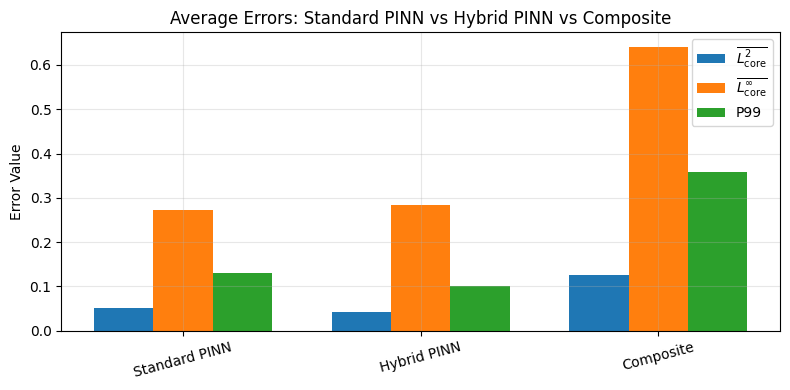

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Average metrics
methods = ["Standard PINN", "Hybrid PINN", "Composite"]
L2core = [0.0511, 0.0416, 0.1262]
Linfcore = [0.2733, 0.2833, 0.6416]
P99 = [0.1311, 0.1012, 0.3589]

x = np.arange(len(methods))
w = 0.25

plt.figure(figsize=(8,4))
plt.bar(x - w, L2core, width=w, label=r"$\overline{L^2_{\rm core}}$")
plt.bar(x, Linfcore, width=w, label=r"$\overline{L^\infty_{\rm core}}$")
plt.bar(x + w, P99, width=w, label="P99")

plt.xticks(x, methods, rotation=15)
plt.ylabel("Error Value")
plt.title("Average Errors: Standard PINN vs Hybrid PINN vs Composite")
plt.legend()
plt.grid(alpha=0.3)

plt.tight_layout()
plt.savefig("comparison_methods.png", dpi=300)
plt.show()


In [ ]:
# %% Validation and Error Analysis: PINN vs Hybrid vs Composite
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Deben coincidir con tus scripts
SAVE_DIR   = "/content/outputs"
GRID_N     = 121
EPS_VAL    = [1.0, 0.1, 0.06]
MODEL_PURE = "couette_pinn"
MODEL_HYB  = "couette_hybrid"

def load_field(fname):
    path = os.path.join(SAVE_DIR, fname)
    df = pd.read_csv(path, index_col=0)
    return df.values  # matriz GRID_N x GRID_N

def core_metrics(T_pred, T_ref):
    """
    Núcleo = quita 1 celda en cada borde, como en tu definición.
    Devuelve (E2_core, Einf_core, P99)
    """
    E = T_pred - T_ref
    core = (slice(1, -1), slice(1, -1))
    Ec = E[core]
    absE_core = np.abs(Ec)

    E2c   = float(np.sqrt(np.mean(Ec**2)))
    Einfc = float(np.max(absE_core))
    # P99 en todo el dominio (como en el texto)
    P99   = float(np.percentile(np.abs(E).ravel(), 99))
    return E2c, Einfc, P99

rows = []

for eps in EPS_VAL:
    tag = f"{eps:.3g}"  # 1.0 -> '1', 0.1 -> '0.1', 0.06 -> '0.06'

    # Carga FD, PINN puro, híbrido y compuesta
    T_fd   = load_field(f"T_FD_eps_{tag}.csv")
    T_pure = load_field(f"T_PINN_eps_{tag}_{MODEL_PURE}.csv")
    T_hyb  = load_field(f"T_PINN_eps_{tag}_{MODEL_HYB}.csv")
    T_comp = load_field(f"T_Composite_eps_{tag}.csv")

    for method, T in [("PINN", T_pure), ("Hybrid", T_hyb), ("Composite", T_comp)]:
        E2c, Einfc, P99 = core_metrics(T, T_fd)
        rows.append({
            "epsilon": eps,
            "Method": method,
            "E2_core": E2c,
            "Einf_core": Einfc,
            "P99": P99
        })

df_val = pd.DataFrame(rows)
print("\n=== DataFrame de validación (core) ===")
print(df_val)

# Guarda CSV por si quieres anexarlo
df_val.to_csv(os.path.join(SAVE_DIR, "validation_pinn_vs_hybrid_core_errors.csv"),
              index=False, float_format="%.6e")

# -------- Tabla LaTeX en el formato de tu subsección --------
print("\n=== Tabla LaTeX para \\ref{tab:validation_pinn_vs_hybrid} ===\n")
print(r"\begin{table}[H]")
print(r"  \centering")
print(r"  \caption{Validation of standard and hybrid PINNs against the FD reference on a $121\times121$ grid. Core $L^2$ and $L^\infty$ errors and P99 (99th percentile of the pointwise absolute error).}")
print(r"  \label{tab:validation_pinn_vs_hybrid}")
print(r"  \begin{tabular}{llccc}")
print(r"    \toprule")
print(r"    $\varepsilon$ & Method & $E_{2,\mathrm{core}}$ & $E_{\infty,\mathrm{core}}$ & P99 \\")
print(r"    \midrule")

for eps in EPS_VAL:
    for method in ["PINN", "Hybrid"]:
        row = df_val[(df_val["epsilon"] == eps) & (df_val["Method"] == method)].iloc[0]
        print(
            rf"    {eps:.2g} & {method} & "
            rf"{row['E2_core']:.1e} & {row['Einf_core']:.1e} & {row['P99']:.1e} \\"
        )
    print(r"    \midrule")

print(r"  \end{tabular}")
print(r"\end{table}")


FileNotFoundError: [Errno 2] No such file or directory: '/content/outputs/T_PINN_eps_1_couette_pinn.csv'

Device: cuda
[eps=1|warm=True] Ep   25 | PDE 6.046e+00 | inlet*w 5.310e+01 | prior 2.416e-05 | Total 5.914e+01
[eps=1|warm=True] Ep   50 | PDE 1.672e+01 | inlet*w 1.189e+01 | prior 9.662e-05 | Total 2.861e+01
[eps=1|warm=True] Ep   75 | PDE 8.746e+00 | inlet*w 1.309e+01 | prior 3.099e-05 | Total 2.183e+01
[eps=1|warm=True] Ep  100 | PDE 2.882e+00 | inlet*w 1.099e+01 | prior 1.285e-06 | Total 1.387e+01
[eps=1|warm=True] Ep  125 | PDE 8.108e-01 | inlet*w 1.086e+01 | prior 3.101e-07 | Total 1.167e+01
[eps=1|warm=True] Ep  150 | PDE 5.892e-01 | inlet*w 1.089e+01 | prior 5.695e-07 | Total 1.148e+01
[eps=1|warm=True] Ep  175 | PDE 5.088e-01 | inlet*w 1.073e+01 | prior 6.127e-07 | Total 1.123e+01
[eps=1|warm=True] Ep  200 | PDE 4.924e-01 | inlet*w 1.017e+01 | prior 6.894e-07 | Total 1.066e+01
[eps=1|warm=True] Ep  300 | PDE 4.953e-01 | inlet*w 1.001e+01 | prior 1.863e-07 | Total 1.050e+01
[eps=1|warm=False] Ep   25 | PDE 5.665e-01 | inlet*w 1.023e+01 | prior 4.495e-06 | Total 1.080e+01
[eps=1

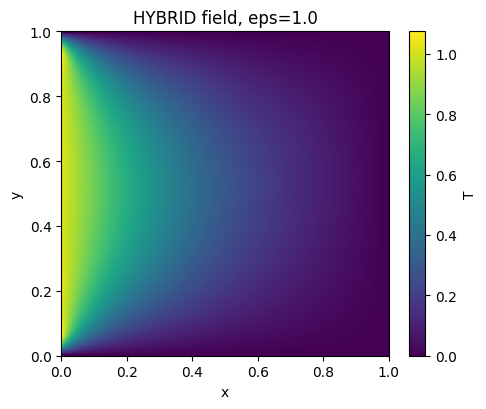

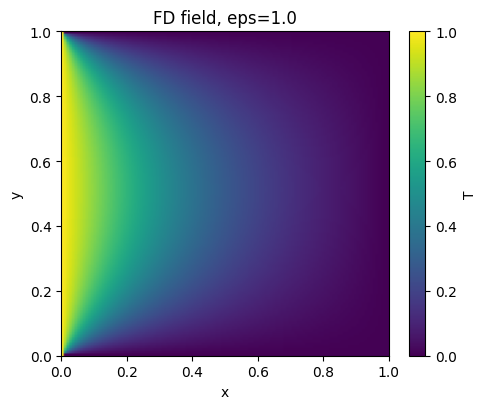

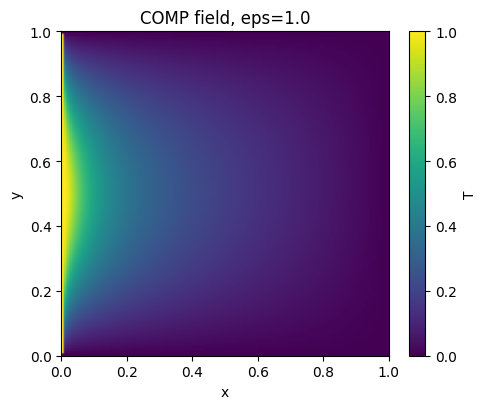

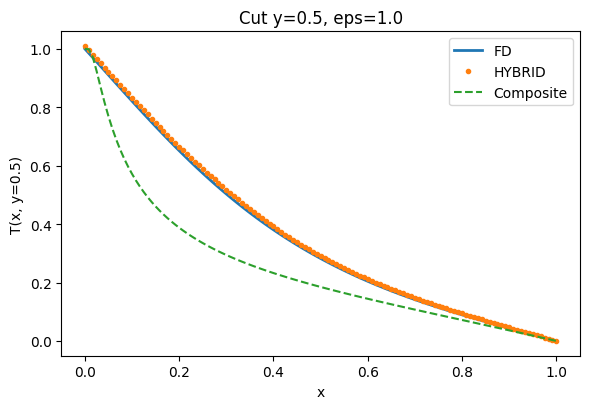

[eps=0.1|warm=True] Ep   25 | PDE 1.935e-01 | inlet*w 1.928e-01 | prior 1.748e-02 | Total 4.038e-01
[eps=0.1|warm=True] Ep   50 | PDE 6.262e-02 | inlet*w 1.553e-01 | prior 1.481e-02 | Total 2.328e-01
[eps=0.1|warm=True] Ep   75 | PDE 4.304e-02 | inlet*w 1.614e-01 | prior 1.436e-02 | Total 2.188e-01
[eps=0.1|warm=True] Ep  100 | PDE 3.604e-02 | inlet*w 1.323e-01 | prior 1.278e-02 | Total 1.812e-01
[eps=0.1|warm=True] Ep  125 | PDE 3.170e-02 | inlet*w 1.093e-01 | prior 1.072e-02 | Total 1.517e-01
[eps=0.1|warm=True] Ep  150 | PDE 2.820e-02 | inlet*w 1.128e-01 | prior 1.045e-02 | Total 1.514e-01
[eps=0.1|warm=True] Ep  175 | PDE 2.690e-02 | inlet*w 1.076e-01 | prior 7.387e-03 | Total 1.419e-01
[eps=0.1|warm=True] Ep  200 | PDE 2.374e-02 | inlet*w 1.180e-01 | prior 6.097e-03 | Total 1.479e-01
[eps=0.1|warm=True] Ep  300 | PDE 2.577e-02 | inlet*w 1.209e-01 | prior 1.858e-03 | Total 1.485e-01
[eps=0.1|warm=False] Ep   25 | PDE 4.425e-02 | inlet*w 1.477e-01 | prior 1.594e-02 | Total 2.079e-01

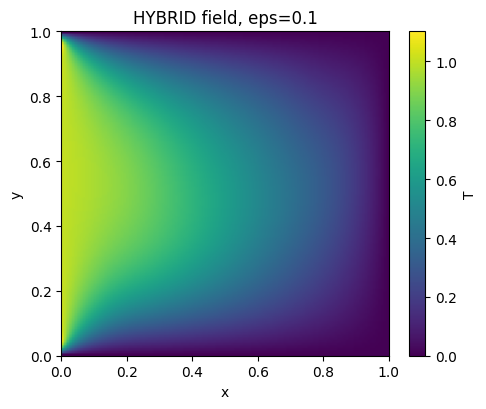

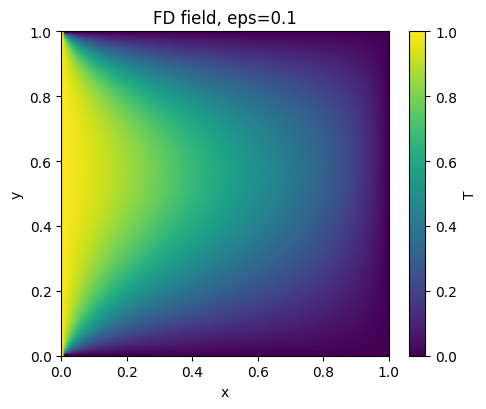

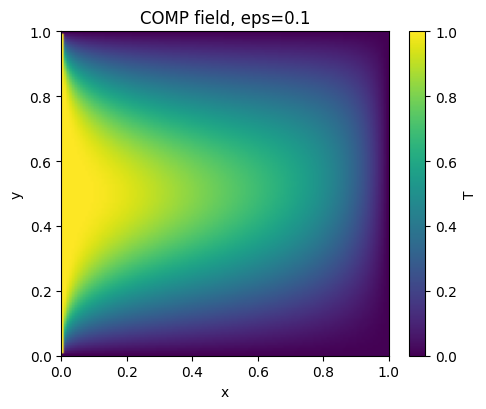

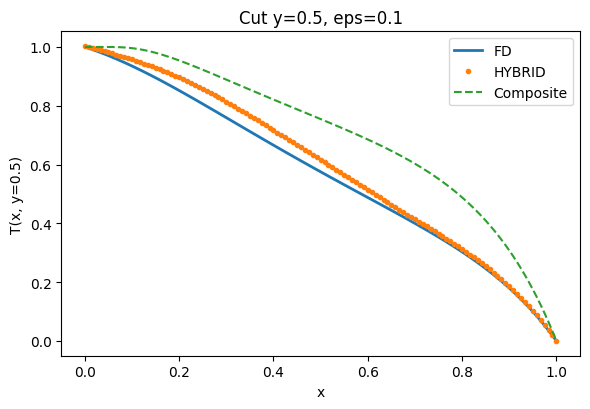

[eps=0.06|warm=True] Ep   25 | PDE 3.122e-01 | inlet*w 3.952e-01 | prior 3.856e-02 | Total 7.460e-01
[eps=0.06|warm=True] Ep   50 | PDE 1.141e-01 | inlet*w 1.304e-01 | prior 3.350e-02 | Total 2.779e-01
[eps=0.06|warm=True] Ep   75 | PDE 5.653e-02 | inlet*w 1.233e-01 | prior 3.186e-02 | Total 2.117e-01
[eps=0.06|warm=True] Ep  100 | PDE 4.267e-02 | inlet*w 9.005e-02 | prior 2.730e-02 | Total 1.600e-01
[eps=0.06|warm=True] Ep  125 | PDE 3.647e-02 | inlet*w 6.757e-02 | prior 2.205e-02 | Total 1.261e-01
[eps=0.06|warm=True] Ep  150 | PDE 3.152e-02 | inlet*w 7.237e-02 | prior 2.075e-02 | Total 1.246e-01
[eps=0.06|warm=True] Ep  175 | PDE 2.764e-02 | inlet*w 6.514e-02 | prior 1.425e-02 | Total 1.070e-01
[eps=0.06|warm=True] Ep  200 | PDE 2.509e-02 | inlet*w 6.722e-02 | prior 1.155e-02 | Total 1.039e-01
[eps=0.06|warm=True] Ep  300 | PDE 2.107e-02 | inlet*w 6.178e-02 | prior 3.383e-03 | Total 8.623e-02
[eps=0.06|warm=False] Ep   25 | PDE 2.971e-02 | inlet*w 8.986e-02 | prior 3.087e-02 | Total

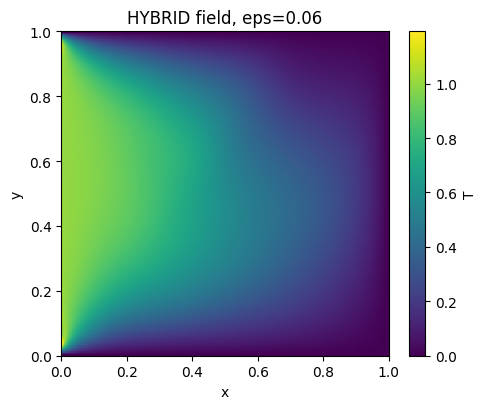

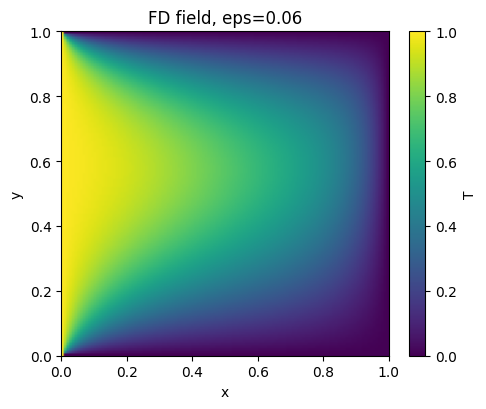

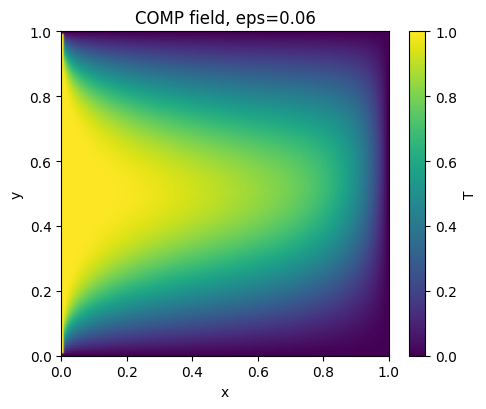

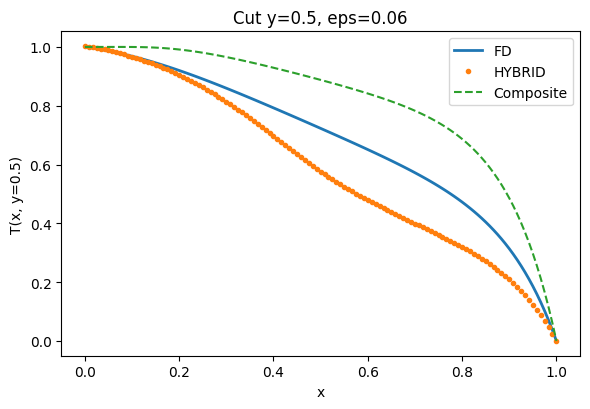

[eps=0.04|warm=True] Ep   25 | PDE 1.895e+01 | inlet*w 9.793e-01 | prior 7.330e-02 | Total 2.001e+01
[eps=0.04|warm=True] Ep   50 | PDE 2.536e+00 | inlet*w 1.731e+00 | prior 6.788e-02 | Total 4.335e+00
[eps=0.04|warm=True] Ep   75 | PDE 1.060e+00 | inlet*w 2.709e-01 | prior 6.264e-02 | Total 1.393e+00
[eps=0.04|warm=True] Ep  100 | PDE 4.046e-01 | inlet*w 9.058e-02 | prior 5.534e-02 | Total 5.505e-01
[eps=0.04|warm=True] Ep  125 | PDE 2.334e-01 | inlet*w 8.927e-02 | prior 4.537e-02 | Total 3.680e-01
[eps=0.04|warm=True] Ep  150 | PDE 1.530e-01 | inlet*w 8.166e-02 | prior 4.247e-02 | Total 2.771e-01
[eps=0.04|warm=True] Ep  175 | PDE 1.182e-01 | inlet*w 8.068e-02 | prior 2.930e-02 | Total 2.281e-01
[eps=0.04|warm=True] Ep  200 | PDE 9.803e-02 | inlet*w 6.640e-02 | prior 2.361e-02 | Total 1.880e-01
[eps=0.04|warm=True] Ep  300 | PDE 6.308e-02 | inlet*w 5.759e-02 | prior 6.841e-03 | Total 1.275e-01
[eps=0.04|warm=False] Ep   25 | PDE 1.536e-01 | inlet*w 9.681e-01 | prior 5.847e-02 | Total

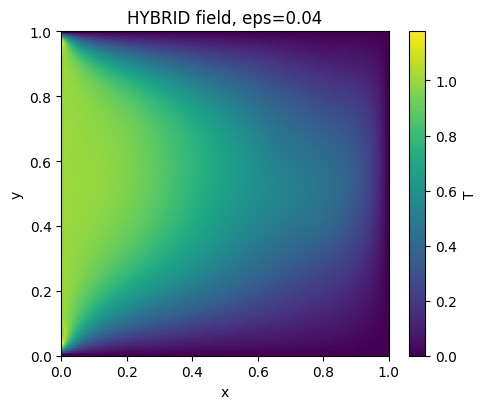

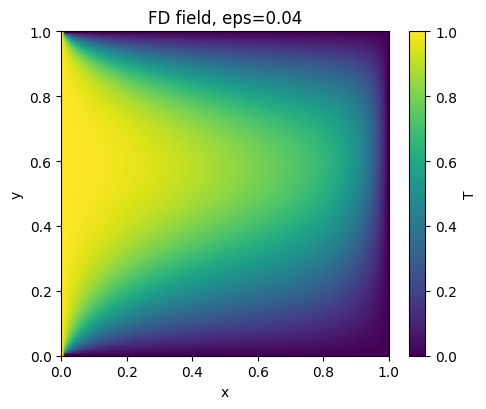

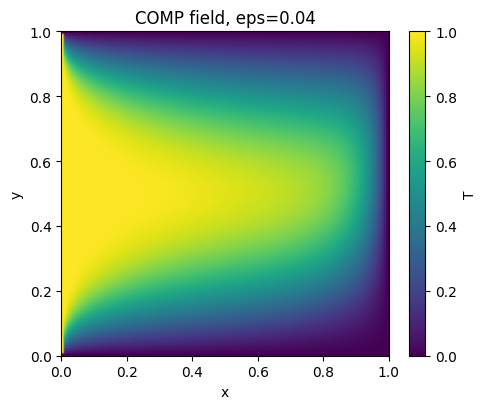

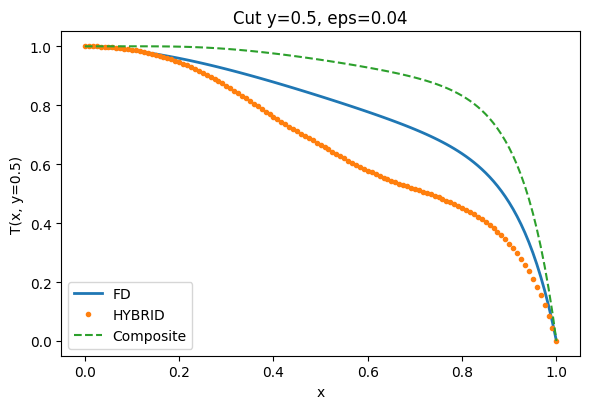


Tabla LaTeX (errores vs FD; global, núcleo y p99):
\begin{table}[H]
\centering
\caption{Errors of HYBRID PINN and Composite against FD on a $121\times121$ grid. Core excludes one-cell boundary.}
\begin{tabular}{lcccccc}
\toprule
$\varepsilon$ & $L^2$ & $L^\infty$ & MAE & $L^2_{\text{core}}$ & $L^\infty_{\text{core}}$ & P99 \\
\midrule
\multicolumn{7}{l}{\textbf{HYBRID vs FD} ($\varepsilon=1$)} \\
 & 2.130e-02 & 1.000e+00 & 7.284e-03 & 1.237e-02 & 3.610e-01 & 2.090e-02 \\
\multicolumn{7}{l}{\textbf{Composite vs FD} ($\varepsilon=1$)} \\
 & 1.586e-01 & 1.000e+00 & 1.025e-01 & 1.608e-01 & 7.171e-01 & 4.919e-01 \\
\multicolumn{7}{l}{\textbf{HYBRID vs FD} ($\varepsilon=0.1$)} \\
 & 4.899e-02 & 1.000e+00 & 3.242e-02 & 4.742e-02 & 2.495e-01 & 1.305e-01 \\
\multicolumn{7}{l}{\textbf{Composite vs FD} ($\varepsilon=0.1$)} \\
 & 1.078e-01 & 1.000e+00 & 8.042e-02 & 1.090e-01 & 6.147e-01 & 3.042e-01 \\
\multicolumn{7}{l}{\textbf{HYBRID vs FD} ($\varepsilon=0.06$)} \\
 & 9.690e-02 & 1.000e+00 & 6.5

In [ ]:
# %% PINN Couette FULL + Curriculum + Outlet-focus + RAR + Prior asintótico (híbrido)
import os, random
import numpy as np
import pandas as pd
import torch, torch.nn as nn, torch.optim as optim
import matplotlib.pyplot as plt
from scipy.sparse import lil_matrix, csc_matrix
from scipy.sparse.linalg import spsolve
from scipy.special import gammaincc

# ---------------- Configuración ----------------
CURRICULUM_EPS = [1.0, 0.1, 0.06, 0.04]   # orden de entrenamiento (warm-start)
GRID_N   = 121
T0, Tw   = 1.0, 0.0
SEED     = 1234
SAVE_DIR = "/content/outputs"
os.makedirs(SAVE_DIR, exist_ok=True)

# Entrenamiento (OOM-safe)
NR_WARMUP    = 2000
NB_WARMUP    = 600
NR_MAIN      = 7000
NB_MAIN      = 1000
MICRO_WARMUP = 800
MICRO_MAIN   = 2000
EPOCHS_WARMUP = 300
EPOCHS_MAIN   = 5000
LBFGS_IT      = 600

# Red
WIDTH, DEPTH = 48, 4
MODEL_NAME   = "couette_hybrid"

# ===== Muestreo y pesos (más capa de salida) =====
INLET_MARGIN  = 0.05
STRIP_X0      = 0.02
BIAS_POW      = 10.0          # más sesgo a x→1
OUTLET_STRIPE = (0.90, 1.0)   # franja pegada a salida
FRAC_OUTLET   = 0.50          # 50% de puntos en la franja de salida
W_REGION      = 10.0          # peso PDE adicional en x>0.90

# Núcleo en y para el prior
CORE_MARGIN_Y = 0.10          # y ∈ [0.10, 0.90]

# RAR (residual-based adaptive refinement)
RAR_ROUNDS = 2
RAR_POOL   = 20000   # puntos de sondeo de residual
RAR_ADD    = 3000    # puntos nuevos añadidos por ronda

# Peso del prior en L-BFGS
LBF_PRIOR = 0.05

# ---------------- Utilidades ----------------
def set_seed(s=SEED):
    random.seed(s)
    np.random.seed(s)
    torch.manual_seed(s)

set_seed()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

# ---------------- Red + transform ----------------
class MLP(nn.Module):
    def __init__(self, in_dim=2, out_dim=1, width=WIDTH, depth=DEPTH):
        super().__init__()
        layers = [nn.Linear(in_dim, width), nn.Tanh()]
        for _ in range(depth-1):
            layers += [nn.Linear(width, width), nn.Tanh()]
        layers += [nn.Linear(width, out_dim)]
        self.net = nn.Sequential(*layers)
        for m in self.net:
            if isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight)
                nn.init.zeros_(m.bias)
    def forward(self, z):  # z en [-1,1]^2
        return self.net(z)

def output_transform(xy, raw):
    x = xy[:, 0:1]
    y = xy[:, 1:2]
    g = (1.0 - x) * y * (1.0 - y)
    return Tw + g * raw

def to_net_coords(xy):
    return 2.0*xy - 1.0

def T_model(net, xy):
    z = to_net_coords(xy)
    return output_transform(xy, net(z))

# ---------------- PDE residual y pérdida (con ponderación de región) ----------------
def pde_residual(net, xy, eps):
    xy = xy.clone().detach().requires_grad_(True)
    T  = T_model(net, xy)
    grads = torch.autograd.grad(
        T, xy, torch.ones_like(T),
        retain_graph=True, create_graph=True
    )[0]
    Tx, Ty = grads[:, 0:1], grads[:, 1:2]
    g2x = torch.autograd.grad(
        Tx, xy, torch.ones_like(Tx),
        retain_graph=True, create_graph=True
    )[0]
    g2y = torch.autograd.grad(
        Ty, xy, torch.ones_like(Ty),
        retain_graph=True, create_graph=True
    )[0]
    Txx, Tyy = g2x[:, 0:1], g2y[:, 1:2]
    eps_t = torch.as_tensor(eps, dtype=T.dtype, device=T.device)
    y     = xy[:, 1:2]
    return y*Tx - eps_t*(Txx + Tyy)

def region_weight(xy):
    x = xy[:, 0:1]
    w = torch.ones_like(x)
    w = w + (W_REGION-1.0)*(x > OUTLET_STRIPE[0]).float()  # mayor peso en x>0.90
    return w

def pde_loss_micro(net, XY, eps, micro):
    n = XY.shape[0]
    total = XY.new_tensor(0.0)
    k = 0
    for i in range(0, n, micro):
        X = XY[i:i+micro]
        R = pde_residual(net, X, eps)
        w = region_weight(X)
        total = total + torch.mean((w*R)**2)
        k += 1
    return total / max(k, 1)

mse = lambda a: torch.mean(a**2)

# ---------------- Muestreo ----------------
def sample_interior(N, device):
    N_out = int(N * FRAC_OUTLET)
    N_rest = N - N_out
    # frente x~0
    N_front = N_rest // 2
    x1 = torch.rand(N_front, 1, device=device) * 0.2
    y1 = torch.rand(N_front, 1, device=device)
    # sesgo a x→1
    N_bias = N_rest - N_front
    u = torch.rand(N_bias, 1, device=device)
    x2 = 1 - (1-u)**BIAS_POW
    y2 = torch.rand(N_bias, 1, device=device)
    # franja salida
    xl, xr = OUTLET_STRIPE
    x3 = torch.rand(N_out, 1, device=device) * (xr - xl) + xl
    y3 = torch.rand(N_out, 1, device=device)

    X = torch.cat([x1, x2, x3], dim=0)
    Y = torch.cat([y1, y2, y3], dim=0)
    return torch.cat([X, Y], dim=1)

def bd_x0(N, device):
    x = torch.zeros(N, 1, device=device)
    y = torch.rand(N, 1, device=device) * (1 - 2*INLET_MARGIN) + INLET_MARGIN
    return torch.cat([x, y], dim=1)

def bd_strip_x0(N, device, x_max=STRIP_X0):
    x = torch.rand(N, 1, device=device) * x_max
    y = torch.rand(N, 1, device=device) * (1 - 2*INLET_MARGIN) + INLET_MARGIN
    return torch.cat([x, y], dim=1)

def sample_outlet_core(N, device):
    """Puntos en la franja de salida y lejos de paredes en y."""
    xl, xr = OUTLET_STRIPE
    x = torch.rand(N, 1, device=device) * (xr - xl) + xl
    y = torch.rand(N, 1, device=device) * (1 - 2*CORE_MARGIN_Y) + CORE_MARGIN_Y
    return torch.cat([x, y], dim=1)

# ---------------- RAR ----------------
def rar_augment(net, eps, base_XY, add=RAR_ADD, pool=RAR_POOL):
    with torch.no_grad():
        XYpool = torch.rand(pool, 2, device=device)  # uniforme
    R = pde_residual(net, XYpool, eps).detach().abs().view(-1)
    idx = torch.topk(R, k=min(add, R.numel())).indices
    return torch.cat([base_XY, XYpool[idx]], dim=0)

# ---------------- Composite asintótico ----------------
def composite_couette(x_grid, y_grid, eps, h=1.0, T0=1.0, Tw=0.0, p=2):
    """
    Composite para y*T_x = eps*(T_xx + T_yy) con:
      x=0: T=T0, y=0,h: T=Tw, x=1: T=Tw.
    Usa Q(s,z)=gammaincc(s,z), unión de capas por inclusión–exclusión
    y ventana w(x)=x**p para la capa de salida. Devuelve [Nx,Ny] (ij).
    """
    X, Y = np.meshgrid(x_grid, y_grid, indexing='ij')
    s     = 1.0/3.0
    delta = 1e-12

    z1 = (Y**3)       / (3.0*eps*np.maximum(X, delta))  # pared inferior
    z2 = ((h - Y)**3) / (3.0*eps*np.maximum(X, delta))  # pared superior
    Qb = gammaincc(s, z1)
    Qt = gammaincc(s, z2)

    S = Qb + Qt - Qb*Qt
    core = 1.0 - S

    w = X**p
    outlet = np.exp(-(1.0 - X)*Y/eps)

    Tcomp = T0 + (Tw - T0) * ( S + w*outlet*core )
    return Tcomp

# ---------------- Prior hacia la compuesta (bilineal, en salida) ----------------
def prior_loss_to_composite(net, xy, Tcomp_t):
    """
    Penaliza (T_pred - T_comp)^2 sobre los puntos xy,
    usando interpolación bilineal sobre Tcomp_t (Nx,Ny).
    """
    Nx, Ny = Tcomp_t.shape
    x = xy[:, 0].clamp(0.0, 1.0 - 1e-7)
    y = xy[:, 1].clamp(0.0, 1.0 - 1e-7)

    hx = 1.0 / (Nx - 1)
    hy = 1.0 / (Ny - 1)

    ix = torch.clamp((x / hx).floor().long(), 0, Nx-2)
    iy = torch.clamp((y / hy).floor().long(), 0, Ny-2)

    tx = (x - ix*hx) / (hx + 1e-12)
    ty = (y - iy*hy) / (hy + 1e-12)

    F00 = Tcomp_t[ix,   iy  ]
    F10 = Tcomp_t[ix+1, iy  ]
    F01 = Tcomp_t[ix,   iy+1]
    F11 = Tcomp_t[ix+1, iy+1]

    Tc = ( (1-tx)*(1-ty)*F00
         +    tx *(1-ty)*F10
         + (1-tx)*   ty *F01
         +    tx *   ty *F11 ).unsqueeze(1)

    Tpred = T_model(net, xy)
    return mse(Tpred - Tc)

# ---------------- FD de referencia (difusión central + upwind en x) ----------------
def solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N):
    xs = np.linspace(0, 1, Nx)
    ys = np.linspace(0, 1, Ny)
    hx = xs[1] - xs[0]
    hy = ys[1] - ys[0]

    def idx(i, j):
        return j*Nx + i

    N = Nx*Ny
    A = lil_matrix((N, N), dtype=float)
    b = np.zeros(N, dtype=float)

    for j in range(Ny):
        y = ys[j]
        for i in range(Nx):
            k = idx(i, j)
            if i == 0:
                A[k, k] = 1.0; b[k] = 1.0;  continue
            if i == Nx-1:
                A[k, k] = 1.0; b[k] = 0.0;  continue
            if j == 0 or j == Ny-1:
                A[k, k] = 1.0; b[k] = 0.0;  continue
            cx   = eps/(hx*hx)
            cy   = eps/(hy*hy)
            conv = y/hx
            A[k, idx(i-1, j)] += (cx + conv)   # upwind
            A[k, idx(i+1, j)] += cx
            A[k, idx(i,   j-1)] += cy
            A[k, idx(i,   j+1)] += cy
            A[k, k] += (-2*cx - 2*cy - conv)

    T = spsolve(csc_matrix(A), b).reshape(Ny, Nx)
    return np.array(T.T, dtype=np.float64)

# ---------------- Métricas robustas ----------------
def metrics_all(Tp, Tr):
    E = Tp - Tr
    L2   = float(np.sqrt(np.mean(E**2)))
    Linf = float(np.max(np.abs(E)))
    MAE  = float(np.mean(np.abs(E)))
    core = (slice(1, -1), slice(1, -1))
    Ec   = E[core]
    L2c   = float(np.sqrt(np.mean(Ec**2)))
    Linfc = float(np.max(np.abs(Ec)))
    MAEc  = float(np.mean(np.abs(Ec)))
    p99   = float(np.percentile(np.abs(E).ravel(), 99))
    return dict(L2=L2, Linf=Linf, MAE=MAE,
                L2_core=L2c, Linf_core=Linfc, MAE_core=MAEc, P99=p99)

def should_log(ep, total):
    if ep <= 200:
        return ep % 25 == 0
    if ep <= 1000:
        return ep % 100 == 0
    return ep % max(total//12, 500) == 0

# ---------------- Entrena una fase (con RAR y prior con annealing) ----------------
def train_phase(net, eps, NR, NB, MICRO, EPOCHS, W_INLET, do_rar=False):
    opt = optim.Adam(net.parameters(), lr=1e-3)
    XYr = sample_interior(NR, device)

    xs_np = np.linspace(0, 1, GRID_N)
    ys_np = np.linspace(0, 1, GRID_N)
    Tcomp_np = composite_couette(xs_np, ys_np, eps)
    Tcomp_t = torch.tensor(Tcomp_np, dtype=torch.float32, device=device)

    if eps >= 0.5:
        prior_max = 0.3; prior_min = 0.02
    else:
        prior_max = 0.9; prior_min = 0.10

    for ep in range(1, EPOCHS+1):
        if do_rar and ep in [int(EPOCHS*0.4), int(EPOCHS*0.75)]:
            XYr = rar_augment(net, eps, XYr, add=RAR_ADD, pool=RAR_POOL)

        X0  = bd_x0(NB, device)
        X0s = bd_strip_x0(NB, device, x_max=STRIP_X0)

        loss_pde = pde_loss_micro(net, XYr, eps, micro=MICRO)
        loss_bc  = mse(T_model(net, X0) - T0) + mse(T_model(net, X0s) - T0)

        XY_prior   = sample_outlet_core(NB, device)
        loss_prior = prior_loss_to_composite(net, XY_prior, Tcomp_t)

        alpha = 0.5 * (1 + np.cos(np.pi * min(ep/EPOCHS, 1.0)))
        lam_prior = prior_min + (prior_max - prior_min) * alpha

        loss = loss_pde + W_INLET*loss_bc + lam_prior*loss_prior

        opt.zero_grad()
        loss.backward()
        opt.step()

        if should_log(ep, EPOCHS):
            print(
                f"[eps={eps:.3g}|warm={NR==NR_WARMUP}] Ep {ep:4d} | "
                f"PDE {loss_pde.item():.3e} | inlet*w {W_INLET*loss_bc.item():.3e} | "
                f"prior {lam_prior*loss_prior.item():.3e} | Total {loss.item():.3e}"
            )

# ---------------- Ejecuta un caso con warm-up → main → L-BFGS ----------------
def run_case(eps, init_state_dict=None):
    set_seed()
    net = MLP().to(device)
    if init_state_dict is not None:
        net.load_state_dict(init_state_dict)

    W_INLET = 50.0 if eps >= 0.5 else 100.0

    train_phase(net, eps, NR_WARMUP, NB_WARMUP,
                MICRO_WARMUP, EPOCHS_WARMUP, W_INLET, do_rar=False)
    train_phase(net, eps, NR_MAIN, NB_MAIN,
                MICRO_MAIN, EPOCHS_MAIN, W_INLET, do_rar=True)

    XYc     = sample_interior(4000, device).detach()
    XYc_out = sample_outlet_core(2000, device).detach()
    X0c     = bd_x0(NB_MAIN, device).detach()
    X0sc    = bd_strip_x0(NB_MAIN, device, x_max=STRIP_X0).detach()

    xs_np = np.linspace(0, 1, GRID_N)
    ys_np = np.linspace(0, 1, GRID_N)
    Tcomp_np = composite_couette(xs_np, ys_np, eps)
    Tcomp_t = torch.tensor(Tcomp_np, dtype=torch.float32, device=device)

    opt2 = optim.LBFGS(
        net.parameters(), lr=1.0,
        max_iter=LBFGS_IT, history_size=50,
        line_search_fn="strong_wolfe"
    )

    def closure():
        opt2.zero_grad()
        loss_pde = pde_loss_micro(net, XYc, eps, micro=MICRO_MAIN)
        loss_bc  = W_INLET*mse(T_model(net, X0c) - T0) \
                 + W_INLET*mse(T_model(net, X0sc) - T0)
        loss_pr  = prior_loss_to_composite(net, XYc_out, Tcomp_t)
        loss = loss_pde + loss_bc + LBF_PRIOR*loss_pr
        loss.backward()
        return loss

    print(f"[eps={eps:.3g}] L-BFGS x{LBFGS_IT}...")
    opt2.step(closure)

    xs = np.linspace(0, 1, GRID_N)
    ys = np.linspace(0, 1, GRID_N)
    xs_t = torch.tensor(xs, dtype=torch.float32, device=device)
    ys_t = torch.tensor(ys, dtype=torch.float32, device=device)
    Xg, Yg = torch.meshgrid(xs_t, ys_t, indexing='ij')
    XY = torch.stack([Xg.reshape(-1), Yg.reshape(-1)], dim=1)

    with torch.no_grad():
        Tpred = T_model(net, XY).reshape(GRID_N, GRID_N).cpu().numpy()
    Tfd   = solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N)
    Tcomp = composite_couette(xs, ys, eps)

    m_pinn = metrics_all(Tpred, Tfd)
    m_comp = metrics_all(Tcomp, Tfd)
    print(f"[eps={eps:.3g}] HYBRID PINN vs FD -> {m_pinn}")
    print(f"[eps={eps:.3g}] COMP vs FD -> {m_comp}")

    pd.DataFrame(Tpred, index=xs, columns=ys).to_csv(
        f"{SAVE_DIR}/T_PINN_eps_{eps:.3g}_{MODEL_NAME}.csv", float_format="%.6f"
    )
    pd.DataFrame(Tfd,   index=xs, columns=ys).to_csv(
        f"{SAVE_DIR}/T_FD_eps_{eps:.3g}.csv", float_format="%.6f"
    )
    pd.DataFrame(Tcomp, index=xs, columns=ys).to_csv(
        f"{SAVE_DIR}/T_Composite_eps_{eps:.3g}.csv", float_format="%.6f"
    )

    for tag, Tmat in [("HYBRID", Tpred), ("FD", Tfd), ("COMP", Tcomp)]:
        plt.figure(figsize=(5.0, 4.2))
        im = plt.imshow(
            Tmat.T, origin='lower',
            extent=[0, 1, 0, 1], aspect='auto'
        )
        plt.colorbar(im, label='T')
        plt.xlabel('x'); plt.ylabel('y')
        plt.title(f'{tag} field, eps={eps}')
        plt.tight_layout()
        plt.savefig(f"{SAVE_DIR}/{tag}_field_eps_{eps:.3g}.png", dpi=140)
        plt.show()

    jmid = GRID_N // 2
    plt.figure(figsize=(6.0, 4.2))
    plt.plot(xs, Tfd[:, jmid], '-',  lw=2, label='FD')
    plt.plot(xs, Tpred[:, jmid], 'o', ms=3, label='HYBRID')
    plt.plot(xs, Tcomp[:, jmid], '--', lw=1.5, label='Composite')
    plt.xlabel('x'); plt.ylabel('T(x, y=0.5)')
    plt.title(f'Cut y=0.5, eps={eps}')
    plt.legend()
    plt.tight_layout()
    plt.savefig(f"{SAVE_DIR}/cut_y05_eps_{eps:.3g}.png", dpi=150)
    plt.show()

    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    return net.state_dict(), m_pinn, m_comp

# ---------------- Loop curriculum (warm-start) + tabla ----------------
results = []
state = None
for eps in CURRICULUM_EPS:
    print("="*72)
    state, m_pinn, m_comp = run_case(eps, init_state_dict=state)
    results.append((eps, m_pinn, m_comp))

print("\nTabla LaTeX (errores vs FD; global, núcleo y p99):")
print(r"\begin{table}[H]")
print(r"\centering")
print(r"\caption{Errors of HYBRID PINN and Composite against FD on a $121\times121$ grid. Core excludes one-cell boundary.}")
print(r"\begin{tabular}{lcccccc}")
print(r"\toprule")
print(r"$\varepsilon$ & $L^2$ & $L^\infty$ & MAE & $L^2_{\text{core}}$ & $L^\infty_{\text{core}}$ & P99 \\")
print(r"\midrule")
for eps, m_pinn, m_comp in results:
    print(rf"\multicolumn{{7}}{{l}}{{\textbf{{HYBRID vs FD}} ($\varepsilon={eps:g}$)}} \\")
    print(rf" & {m_pinn['L2']:.3e} & {m_pinn['Linf']:.3e} & {m_pinn['MAE']:.3e} & {m_pinn['L2_core']:.3e} & {m_pinn['Linf_core']:.3e} & {m_pinn['P99']:.3e} \\")
    print(rf"\multicolumn{{7}}{{l}}{{\textbf{{Composite vs FD}} ($\varepsilon={eps:g}$)}} \\")
    print(rf" & {m_comp['L2']:.3e} & {m_comp['Linf']:.3e} & {m_comp['MAE']:.3e} & {m_comp['L2_core']:.3e} & {m_comp['Linf_core']:.3e} & {m_comp['P99']:.3e} \\")
print(r"\bottomrule")
print(r"\end{tabular}")
print(r"\end{table}")


In [ ]:
# %% Figura error_vs_eps_pinn_hybrid.pdf y ajuste E2 ~ C eps^alpha

# Extrae los E2_core de cada método
eps_arr = np.array(EPS_VAL, dtype=float)

E2_pure = np.array([
    df_val[(df_val["epsilon"] == eps) & (df_val["Method"] == "PINN")]["E2_core"].iloc[0]
    for eps in EPS_VAL
])

E2_hyb = np.array([
    df_val[(df_val["epsilon"] == eps) & (df_val["Method"] == "Hybrid")]["E2_core"].iloc[0]
    for eps in EPS_VAL
])

E2_comp = np.array([
    df_val[(df_val["epsilon"] == eps) & (df_val["Method"] == "Composite")]["E2_core"].iloc[0]
    for eps in EPS_VAL
])

# Ordena por epsilon creciente para la gráfica
idx_sort = np.argsort(eps_arr)
eps_plot   = eps_arr[idx_sort]
E2_pure_p  = E2_pure[idx_sort]
E2_hyb_p   = E2_hyb[idx_sort]
E2_comp_p  = E2_comp[idx_sort]

plt.figure()
plt.loglog(eps_plot, E2_comp_p, "o--", label="Composite")
plt.loglog(eps_plot, E2_pure_p, "s-",  label="PINN")
plt.loglog(eps_plot, E2_hyb_p,  "d-",  label="Hybrid PINN")
plt.xlabel(r"$\varepsilon$")
plt.ylabel(r"$E_{2,\mathrm{core}}$")
plt.grid(True, which="both", ls=":")
plt.legend()
plt.tight_layout()
fig_path = os.path.join(SAVE_DIR, "error_vs_eps_pinn_hybrid.pdf")
plt.savefig(fig_path)
plt.close()
print(f"Figura guardada en: {fig_path}")

# Ajuste tipo power-law E2 ~ C eps^alpha
def fit_power_law(eps_vals, err_vals, label):
    mask = (eps_vals > 0) & (err_vals > 0)
    if np.sum(mask) < 2:
        print(f"[{label}] Insuficientes puntos para ajuste.")
        return
    log_eps = np.log(eps_vals[mask])
    log_err = np.log(err_vals[mask])
    b, a = np.polyfit(log_eps, log_err, 1)
    C = np.exp(a)
    alpha = b
    print(f"[{label}] Ajuste E2_core ~ C eps^alpha:")
    print(f"   C     ≈ {C:.4e}")
    print(f"   alpha ≈ {alpha:.4f}")

fit_power_law(eps_plot, E2_comp_p, "Composite")
fit_power_law(eps_plot, E2_pure_p, "PINN")
fit_power_law(eps_plot, E2_hyb_p,  "Hybrid PINN")


Figura guardada en: /content/outputs/error_vs_eps_pinn_hybrid.pdf
[Composite] Ajuste E2_core ~ C eps^alpha:
   C     ≈ 1.5963e-01
   alpha ≈ 0.1479
[PINN] Ajuste E2_core ~ C eps^alpha:
   C     ≈ 1.1626e-02
   alpha ≈ -0.5414
[Hybrid PINN] Ajuste E2_core ~ C eps^alpha:
   C     ≈ 1.1173e-02
   alpha ≈ -0.6203


In [ ]:
# ============================================================
# (NUEVO) PDE generalizada: u_m(y) = y^m
# ============================================================
# Parámetros RAR (pon los mismos que usas en el experimento Couette)

def pde_residual_shear(net, xy, eps, m):
    """
    Residual para u_m(y) T_x = eps (T_xx + T_yy), con u_m(y) = y^m.
    """
    xy = xy.clone().detach().requires_grad_(True)
    T  = T_model(net, xy)

    grads = torch.autograd.grad(
        T, xy, torch.ones_like(T),
        retain_graph=True, create_graph=True
    )[0]
    Tx, Ty = grads[:,0:1], grads[:,1:2]

    g2x = torch.autograd.grad(
        Tx, xy, torch.ones_like(Tx),
        retain_graph=True, create_graph=True
    )[0]
    g2y = torch.autograd.grad(
        Ty, xy, torch.ones_like(Ty),
        retain_graph=True, create_graph=True
    )[0]
    Txx, Tyy = g2x[:,0:1], g2y[:,1:2]

    eps_t = torch.as_tensor(eps, dtype=T.dtype, device=T.device)
    y     = xy[:,1:2]
    u     = y**m

    return u*Tx - eps_t*(Txx + Tyy)


def pde_loss_micro_shear(net, XY, eps, micro, m):
    """
    Versión micro-batch del loss PDE, usando el residual con y^m.
    """
    n = XY.shape[0]
    total = XY.new_tensor(0.0)
    k = 0
    for i in range(0, n, micro):
        X = XY[i:i+micro]
        R = pde_residual_shear(net, X, eps, m)
        w = region_weight(X)             # mismo peso de región que Couette
        total = total + torch.mean((w*R)**2)
        k += 1
    return total/max(k,1)


def rar_augment_shear(net, eps, m, base_XY, add=RAR_ADD, pool=RAR_POOL):
    """
    Igual que rar_augment, pero usando el residual con y^m.
    """
    with torch.no_grad():
        XYpool = torch.rand(pool, 2, device=device)  # uniforme en el dominio

    R = pde_residual_shear(net, XYpool, eps, m).detach().abs().view(-1)
    idx = torch.topk(R, k=min(add, R.numel())).indices
    return torch.cat([base_XY, XYpool[idx]], dim=0)


def solve_fd_shear(eps, m, Nx=GRID_N, Ny=GRID_N):
    """
    FD de referencia para u_m(y) T_x = eps (T_xx + T_yy),
    con u_m(y) = y^m, mismo esquema upwind que solve_fd_reference.
    """
    xs = np.linspace(0,1,Nx)
    ys = np.linspace(0,1,Ny)
    hx = xs[1] - xs[0]
    hy = ys[1] - ys[0]

    def idx(i,j): return j*Nx + i

    N = Nx*Ny
    A = lil_matrix((N,N), dtype=float)
    b = np.zeros(N, dtype=float)

    for j in range(Ny):
        y = ys[j]
        for i in range(Nx):
            k = idx(i,j)

            # fronteras: mismas condiciones Dirichlet
            if i == 0:         # inlet x=0: T=1
                A[k,k] = 1.0; b[k] = 1.0
                continue
            if i == Nx-1:      # outlet x=1: T=0
                A[k,k] = 1.0; b[k] = 0.0
                continue
            if j == 0 or j == Ny-1:   # paredes y=0,1: T=0
                A[k,k] = 1.0; b[k] = 0.0
                continue

            cx = eps/(hx*hx)
            cy = eps/(hy*hy)
            u  = y**m
            conv = u/hx    # término convectivo upwind (u>0)

            # Difusión + convección en x
            A[k, idx(i-1,j)] += (cx + conv)
            A[k, idx(i+1,j)] += (cx)
            # Difusión en y (central)
            A[k, idx(i,  j-1)] += (cy)
            A[k, idx(i,  j+1)] += (cy)
            # Diagonal
            A[k, k] += (-2*cx - 2*cy - conv)

    T = spsolve(csc_matrix(A), b).reshape(Ny, Nx)
    # Devolvemos [Nx,Ny] en coherencia con solve_fd_reference
    return np.array(T.T, dtype=np.float64)
# ============================================================
# (NUEVO) Entrenamiento para u_m(y) = y^m (sin prior compuesto)
# ============================================================

def train_phase_shear(net, eps, m, NR, NB, MICRO, EPOCHS, W_INLET, do_rar=False):
    opt = optim.Adam(net.parameters(), lr=1e-3)
    XYr = sample_interior(NR, device)

    for ep in range(1, EPOCHS+1):
        # RAR en dos momentos de la fase
        if do_rar and ep in [int(EPOCHS*0.4), int(EPOCHS*0.75)]:
            XYr = rar_augment_shear(net, eps, m, XYr, add=RAR_ADD, pool=RAR_POOL)

        X0  = bd_x0(NB, device)
        X0s = bd_strip_x0(NB, device, x_max=STRIP_X0)

        loss_pde = pde_loss_micro_shear(net, XYr, eps, micro=MICRO, m=m)
        loss_bc  = mse(T_model(net, X0) - T0) + mse(T_model(net, X0s) - T0)

        loss = loss_pde + W_INLET*loss_bc

        opt.zero_grad()
        loss.backward()
        opt.step()

        if should_log(ep, EPOCHS):
            print(f"[shear m={m}, eps={eps:.3g}] Ep {ep:4d} | "
                  f"PDE {loss_pde.item():.3e} | inlet*w {W_INLET*loss_bc.item():.3e} "
                  f"| Total {loss.item():.3e}")


def run_case_shear(eps, m, init_state_dict=None):
    """
    Caso único para u_m(y)=y^m a un eps dado.
    Estructura: warm-up + main + L-BFGS (sin prior compuesto).
    """
    set_seed()
    net = MLP().to(device)
    if init_state_dict is not None:
        net.load_state_dict(init_state_dict)

    W_INLET = 50.0 if eps >= 0.5 else 100.0

    # warm-up (sin RAR)
    train_phase_shear(
        net, eps, m,
        NR_WARMUP, NB_WARMUP, MICRO_WARMUP, EPOCHS_WARMUP,
        W_INLET, do_rar=False
    )

    # fase principal (con RAR)
    train_phase_shear(
        net, eps, m,
        NR_MAIN, NB_MAIN, MICRO_MAIN, EPOCHS_MAIN,
        W_INLET, do_rar=True
    )

    # --- L-BFGS final (PDE + BC, sin prior) ---
    XYc  = sample_interior(4000, device).detach()
    X0c  = bd_x0(NB_MAIN, device).detach()
    X0sc = bd_strip_x0(NB_MAIN, device, x_max=STRIP_X0).detach()

    opt2 = optim.LBFGS(
        net.parameters(), lr=1.0,
        max_iter=LBFGS_IT, history_size=50,
        line_search_fn="strong_wolfe"
    )

    def closure():
        opt2.zero_grad()
        loss = pde_loss_micro_shear(net, XYc, eps, micro=MICRO_MAIN, m=m) \
             + W_INLET*mse(T_model(net, X0c) - T0) \
             + W_INLET*mse(T_model(net, X0sc) - T0)
        loss.backward()
        return loss

    print(f"[shear m={m}, eps={eps:.3g}] L-BFGS x{LBFGS_IT}...")
    opt2.step(closure)

    # --- Evaluación en la malla y comparación con FD ---
    xs = np.linspace(0,1,GRID_N)
    ys = np.linspace(0,1,GRID_N)
    xs_t = torch.tensor(xs, dtype=torch.float32, device=device)
    ys_t = torch.tensor(ys, dtype=torch.float32, device=device)
    Xg, Yg = torch.meshgrid(xs_t, ys_t, indexing='ij')
    XY = torch.stack([Xg.reshape(-1), Yg.reshape(-1)], dim=1)

    with torch.no_grad():
        Tpred = T_model(net, XY).reshape(GRID_N, GRID_N).cpu().numpy()

    Tfd = solve_fd_shear(eps, m, Nx=GRID_N, Ny=GRID_N)

    m_pinn = metrics_all(Tpred, Tfd)
    print(f"[shear m={m}, eps={eps:.3g}] PINN vs FD -> {m_pinn}")

    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    return net.state_dict(), m_pinn, xs, ys, Tfd, Tpred
# ============================================================
# (NUEVO) Figuras y tabla para perfiles generalizados u_m(y)=y^m
# ============================================================

def plot_fields_general_shear(xs, ys, Tfd, Tpred, eps, m):
    """
    Genera una figura con dos subplots (FD, PINN) y la guarda como
    fields_m{m}.png en SAVE_DIR.
    """
    extent = [xs[0], xs[-1], ys[0], ys[-1]]
    vmin, vmax = 0.0, 1.0  # T0=1, Tw=0

    fig, axs = plt.subplots(1, 2, figsize=(8.0, 3.5))

    im0 = axs[0].imshow(
        Tfd.T, origin='lower', extent=extent, aspect='auto',
        vmin=vmin, vmax=vmax
    )
    axs[0].set_title(f"FD, m={m}")
    axs[0].set_xlabel("x")
    axs[0].set_ylabel("y")
    fig.colorbar(im0, ax=axs[0])

    im1 = axs[1].imshow(
        Tpred.T, origin='lower', extent=extent, aspect='auto',
        vmin=vmin, vmax=vmax
    )
    axs[1].set_title(f"PINN, m={m}")
    axs[1].set_xlabel("x")
    axs[1].set_ylabel("y")
    fig.colorbar(im1, ax=axs[1])

    fig.suptitle(f"u_m(y)=y^{m}, eps={eps}", fontsize=10)
    plt.tight_layout()
    plt.savefig(f"{SAVE_DIR}/fields_m{m}.png", dpi=200, bbox_inches="tight")
    plt.show()
    plt.close(fig)


# --- Ejecutar experimento generalizado u_m(y)=y^m ---

M_VALUES  = [1, 2, 3]
EPS_SHEAR = 0.04   # el eps "de referencia" que usas en la figura

shear_results = []

print("\n" + "="*72)
print(" Experimento: perfiles de corte generalizados u_m(y)=y^m ")
print("="*72)

for m in M_VALUES:
    # opcional: usar el último state del curriculum Couette como warm-start
    init_sd = state  # o None si quieres empezar desde cero
    sd_m, m_pinn_m, xs_m, ys_m, Tfd_m, Tpred_m = run_case_shear(EPS_SHEAR, m, init_state_dict=init_sd)
    shear_results.append((m, m_pinn_m))

    # Figura FD vs PINN para este m
    plot_fields_general_shear(xs_m, ys_m, Tfd_m, Tpred_m, EPS_SHEAR, m)

# --- Tabla LaTeX para Table~\ref{tab:errors-general-shear} ---

print("\nTabla LaTeX: errores PINN vs FD para u_m(y)=y^m (núcleo y P99):")
print(r"\begin{table}[H]")
print(r"\centering")
print(r"\caption{PINN errors against FD for generalized shear profiles $u_m(y)=y^m$ at fixed $\varepsilon$.}")
print(r"\label{tab:errors-general-shear}")
print(r"\begin{tabular}{llccc}")
print(r"\toprule")
print(r"$m$ & $\varepsilon$ & $L^2_{\text{core}}$ & $L^\infty_{\text{core}}$ & P99 \\")
print(r"\midrule")
for m, metr in shear_results:
    print(rf"{m} & {EPS_SHEAR:.2f} & "
          rf"{metr['L2_core']:.3e} & {metr['Linf_core']:.3e} & {metr['P99']:.3e} \\")
print(r"\bottomrule")
print(r"\end{tabular}")
print(r"\end{table}")


NameError: name 'GRID_N' is not defined

Device: cuda
[eps=1|warm=True] Ep   25 | PDE 5.723e+00 | inlet*w 5.404e+01 | prior 5.213e-03 | Total 5.976e+01
[eps=1|warm=True] Ep   50 | PDE 1.669e+01 | inlet*w 1.070e+01 | prior 4.176e-02 | Total 2.744e+01
[eps=1|warm=True] Ep   75 | PDE 8.748e+00 | inlet*w 1.351e+01 | prior 2.403e-02 | Total 2.228e+01
[eps=1|warm=True] Ep  100 | PDE 2.942e+00 | inlet*w 1.201e+01 | prior 1.652e-02 | Total 1.497e+01
[eps=1|warm=True] Ep  125 | PDE 8.353e-01 | inlet*w 1.075e+01 | prior 1.623e-02 | Total 1.160e+01
[eps=1|warm=True] Ep  150 | PDE 5.707e-01 | inlet*w 9.767e+00 | prior 1.290e-02 | Total 1.035e+01
[eps=1|warm=True] Ep  175 | PDE 5.139e-01 | inlet*w 1.077e+01 | prior 1.011e-02 | Total 1.129e+01
[eps=1|warm=True] Ep  200 | PDE 4.756e-01 | inlet*w 1.089e+01 | prior 7.101e-03 | Total 1.137e+01
[eps=1|warm=True] Ep  300 | PDE 5.123e-01 | inlet*w 1.031e+01 | prior 1.859e-03 | Total 1.083e+01
[eps=1|warm=False] Ep   25 | PDE 5.464e-01 | inlet*w 1.081e+01 | prior 2.206e-02 | Total 1.138e+01
[eps=1

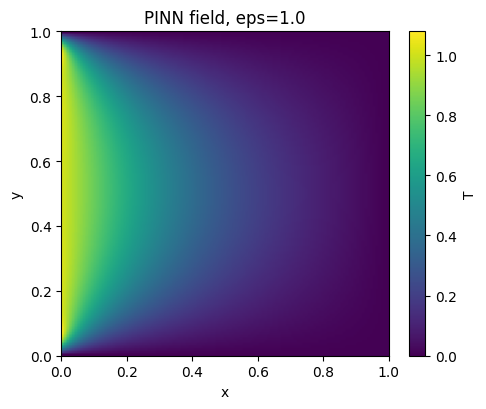

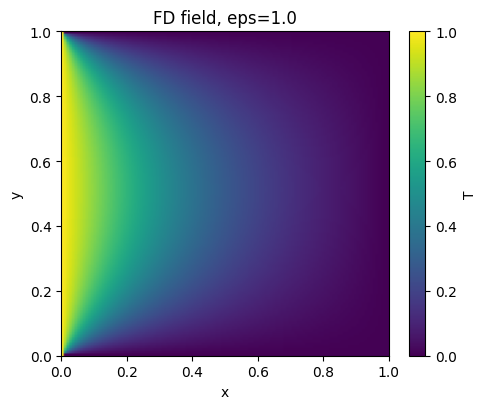

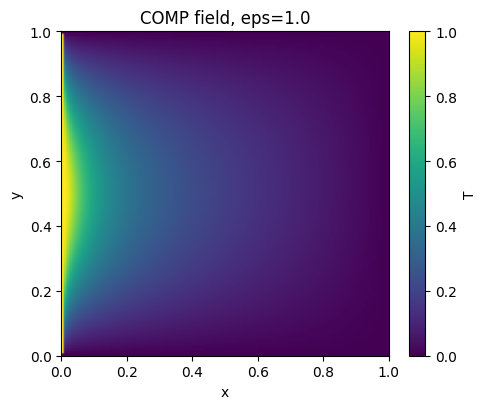

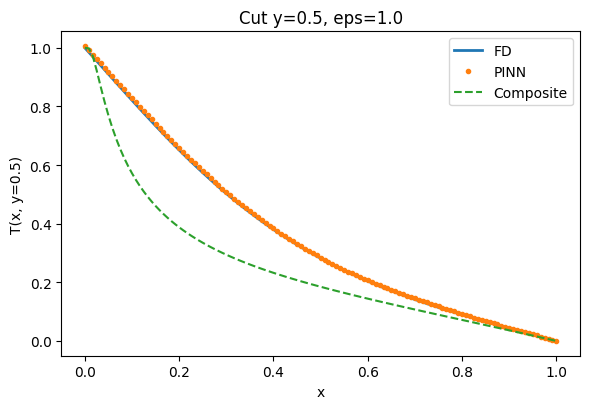

[eps=0.1|warm=True] Ep   25 | PDE 1.349e-01 | inlet*w 1.887e-01 | prior 2.798e-02 | Total 3.516e-01
[eps=0.1|warm=True] Ep   50 | PDE 6.713e-02 | inlet*w 1.182e-01 | prior 2.499e-02 | Total 2.103e-01
[eps=0.1|warm=True] Ep   75 | PDE 4.465e-02 | inlet*w 1.627e-01 | prior 2.263e-02 | Total 2.300e-01
[eps=0.1|warm=True] Ep  100 | PDE 3.616e-02 | inlet*w 1.306e-01 | prior 1.982e-02 | Total 1.866e-01
[eps=0.1|warm=True] Ep  125 | PDE 3.128e-02 | inlet*w 1.421e-01 | prior 1.673e-02 | Total 1.901e-01
[eps=0.1|warm=True] Ep  150 | PDE 2.489e-02 | inlet*w 1.247e-01 | prior 1.353e-02 | Total 1.632e-01
[eps=0.1|warm=True] Ep  175 | PDE 2.336e-02 | inlet*w 1.408e-01 | prior 1.043e-02 | Total 1.746e-01
[eps=0.1|warm=True] Ep  200 | PDE 2.361e-02 | inlet*w 1.483e-01 | prior 7.598e-03 | Total 1.795e-01
[eps=0.1|warm=True] Ep  300 | PDE 4.847e-02 | inlet*w 1.509e-01 | prior 1.971e-03 | Total 2.014e-01
[eps=0.1|warm=False] Ep   25 | PDE 1.239e-01 | inlet*w 3.820e-01 | prior 2.358e-02 | Total 5.294e-01

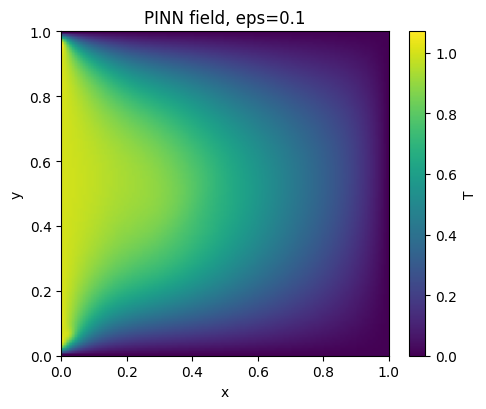

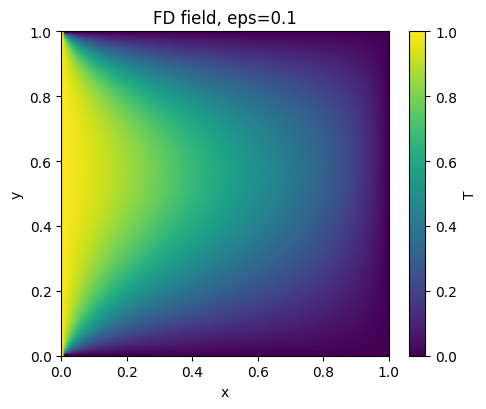

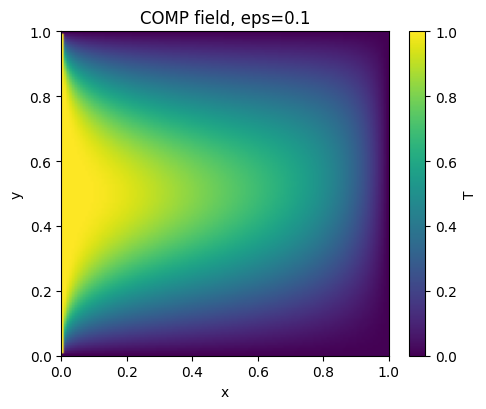

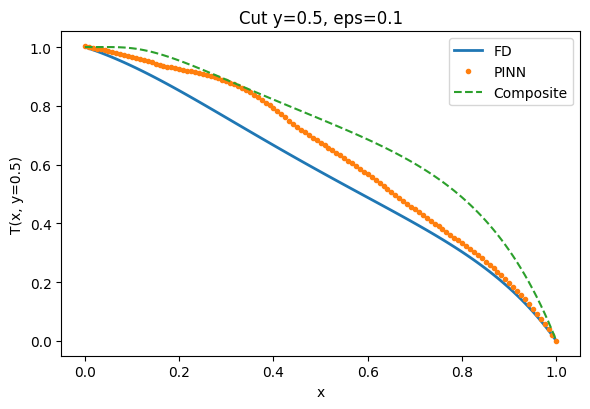

[eps=0.06|warm=True] Ep   25 | PDE 1.223e+00 | inlet*w 8.502e-01 | prior 2.599e-02 | Total 2.099e+00
[eps=0.06|warm=True] Ep   50 | PDE 3.734e-01 | inlet*w 3.399e-01 | prior 2.188e-02 | Total 7.352e-01
[eps=0.06|warm=True] Ep   75 | PDE 1.599e-01 | inlet*w 2.000e-01 | prior 1.883e-02 | Total 3.787e-01
[eps=0.06|warm=True] Ep  100 | PDE 7.998e-02 | inlet*w 1.335e-01 | prior 1.657e-02 | Total 2.301e-01
[eps=0.06|warm=True] Ep  125 | PDE 4.900e-02 | inlet*w 1.241e-01 | prior 1.411e-02 | Total 1.872e-01
[eps=0.06|warm=True] Ep  150 | PDE 3.859e-02 | inlet*w 8.464e-02 | prior 1.150e-02 | Total 1.347e-01
[eps=0.06|warm=True] Ep  175 | PDE 3.407e-02 | inlet*w 8.173e-02 | prior 8.894e-03 | Total 1.247e-01
[eps=0.06|warm=True] Ep  200 | PDE 2.958e-02 | inlet*w 7.177e-02 | prior 6.524e-03 | Total 1.079e-01
[eps=0.06|warm=True] Ep  300 | PDE 2.191e-02 | inlet*w 6.119e-02 | prior 1.733e-03 | Total 8.483e-02
[eps=0.06|warm=False] Ep   25 | PDE 1.258e-01 | inlet*w 2.140e-01 | prior 1.862e-02 | Total

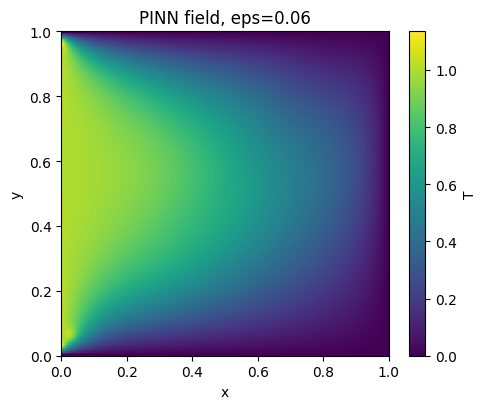

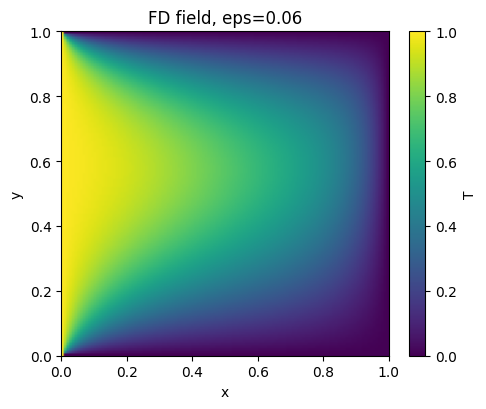

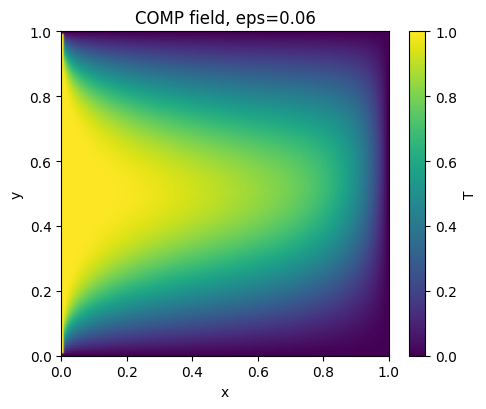

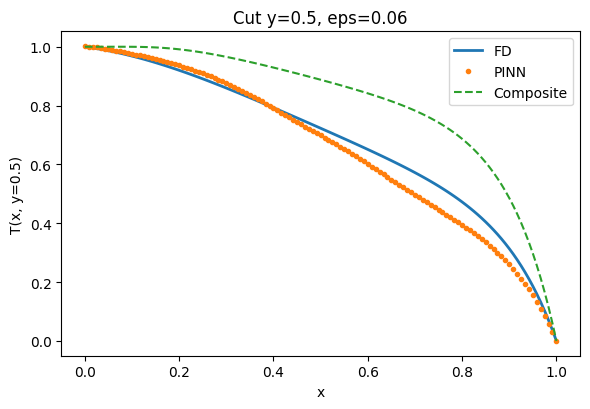

[eps=0.04|warm=True] Ep   25 | PDE 2.391e+00 | inlet*w 2.896e-01 | prior 6.253e-02 | Total 2.743e+00
[eps=0.04|warm=True] Ep   50 | PDE 7.663e-01 | inlet*w 2.322e-01 | prior 4.985e-02 | Total 1.048e+00
[eps=0.04|warm=True] Ep   75 | PDE 5.430e-01 | inlet*w 2.671e-01 | prior 4.334e-02 | Total 8.534e-01
[eps=0.04|warm=True] Ep  100 | PDE 4.184e-01 | inlet*w 3.749e-01 | prior 3.594e-02 | Total 8.293e-01
[eps=0.04|warm=True] Ep  125 | PDE 3.386e-01 | inlet*w 1.898e-01 | prior 2.932e-02 | Total 5.578e-01
[eps=0.04|warm=True] Ep  150 | PDE 2.697e-01 | inlet*w 1.980e-01 | prior 2.322e-02 | Total 4.909e-01
[eps=0.04|warm=True] Ep  175 | PDE 2.239e-01 | inlet*w 1.516e-01 | prior 1.767e-02 | Total 3.933e-01
[eps=0.04|warm=True] Ep  200 | PDE 1.821e-01 | inlet*w 1.500e-01 | prior 1.285e-02 | Total 3.449e-01
[eps=0.04|warm=True] Ep  300 | PDE 9.044e-02 | inlet*w 1.238e-01 | prior 3.237e-03 | Total 2.175e-01
[eps=0.04|warm=False] Ep   25 | PDE 2.521e-01 | inlet*w 3.802e-01 | prior 3.562e-02 | Total

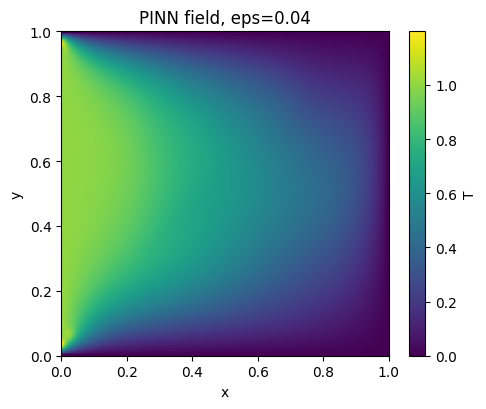

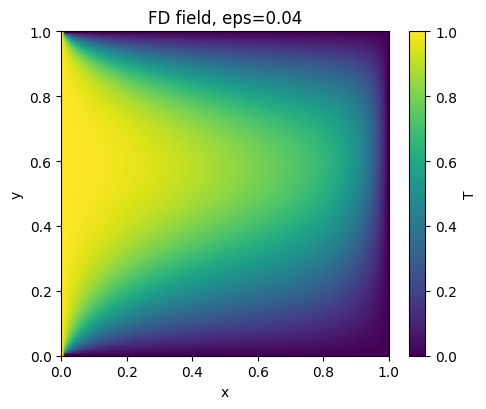

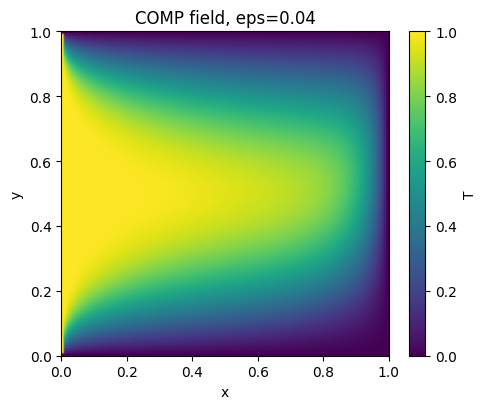

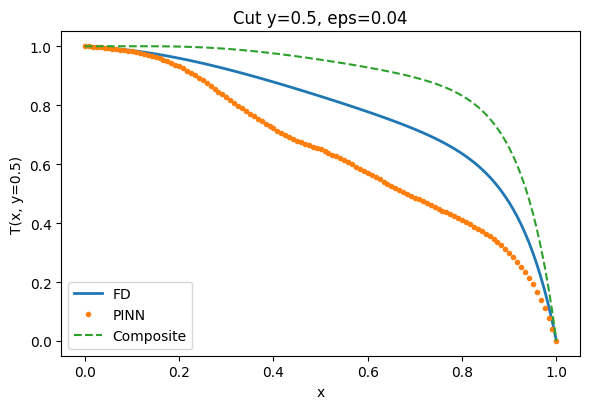


Tabla LaTeX (errores vs FD; global, núcleo y p99):
\begin{table}[H]
\centering
\caption{Errors of PINN and Composite against FD on a $121\times121$ grid. Core excludes one-cell boundary.}
\begin{tabular}{lcccccc}
\toprule
$\varepsilon$ & $L^2$ & $L^\infty$ & MAE & $L^2_{\text{core}}$ & $L^\infty_{\text{core}}$ & P99 \\
\midrule
\multicolumn{7}{l}{\textbf{PINN vs FD} ($\varepsilon=1$)} \\
 & 2.032e-02 & 1.000e+00 & 4.161e-03 & 1.047e-02 & 3.530e-01 & 1.986e-02 \\
\multicolumn{7}{l}{\textbf{Composite vs FD} ($\varepsilon=1$)} \\
 & 1.586e-01 & 1.000e+00 & 1.025e-01 & 1.608e-01 & 7.171e-01 & 4.919e-01 \\
\multicolumn{7}{l}{\textbf{PINN vs FD} ($\varepsilon=0.1$)} \\
 & 6.716e-02 & 1.000e+00 & 4.785e-02 & 6.655e-02 & 2.485e-01 & 1.633e-01 \\
\multicolumn{7}{l}{\textbf{Composite vs FD} ($\varepsilon=0.1$)} \\
 & 1.078e-01 & 1.000e+00 & 8.042e-02 & 1.090e-01 & 6.147e-01 & 3.042e-01 \\
\multicolumn{7}{l}{\textbf{PINN vs FD} ($\varepsilon=0.06$)} \\
 & 4.921e-02 & 1.000e+00 & 3.436e-02 & 4.78

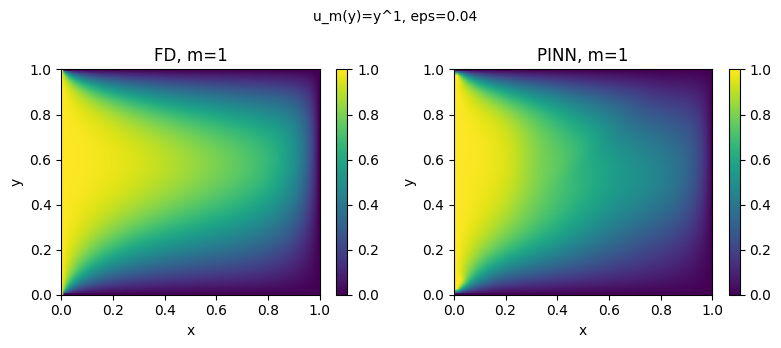

[shear m=2, eps=0.04] Ep   25 | PDE 5.638e-01 | inlet*w 7.546e-01 | Total 1.318e+00
[shear m=2, eps=0.04] Ep   50 | PDE 4.186e-01 | inlet*w 3.014e-01 | Total 7.200e-01
[shear m=2, eps=0.04] Ep   75 | PDE 3.449e-01 | inlet*w 2.439e-01 | Total 5.888e-01
[shear m=2, eps=0.04] Ep  100 | PDE 2.704e-01 | inlet*w 2.127e-01 | Total 4.831e-01
[shear m=2, eps=0.04] Ep  125 | PDE 2.124e-01 | inlet*w 1.494e-01 | Total 3.618e-01
[shear m=2, eps=0.04] Ep  150 | PDE 1.691e-01 | inlet*w 1.600e-01 | Total 3.292e-01
[shear m=2, eps=0.04] Ep  175 | PDE 1.367e-01 | inlet*w 1.619e-01 | Total 2.986e-01
[shear m=2, eps=0.04] Ep  200 | PDE 1.108e-01 | inlet*w 1.814e-01 | Total 2.922e-01
[shear m=2, eps=0.04] Ep  300 | PDE 5.891e-02 | inlet*w 1.305e-01 | Total 1.894e-01
[shear m=2, eps=0.04] Ep   25 | PDE 6.363e-02 | inlet*w 2.006e-01 | Total 2.643e-01
[shear m=2, eps=0.04] Ep   50 | PDE 3.501e-02 | inlet*w 8.433e-02 | Total 1.193e-01
[shear m=2, eps=0.04] Ep   75 | PDE 2.945e-02 | inlet*w 7.513e-02 | Total 1.

In [ ]:
# %% PINN Couette FULL + Curriculum + Outlet-focus + RAR + Prior asintótico (híbrido)
import os, random
import numpy as np
import pandas as pd
import torch, torch.nn as nn, torch.optim as optim
import matplotlib.pyplot as plt
from scipy.sparse import lil_matrix, csc_matrix
from scipy.sparse.linalg import spsolve
from scipy.special import gammaincc

# ---------------- Configuración ----------------
CURRICULUM_EPS = [1.0, 0.1, 0.06, 0.04]   # warm-start
GRID_N   = 121
T0, Tw   = 1.0, 0.0
SEED     = 1234
SAVE_DIR = "/content/outputs"
os.makedirs(SAVE_DIR, exist_ok=True)

# Entrenamiento (OOM-safe)
NR_WARMUP, NB_WARMUP = 2000, 600
NR_MAIN,   NB_MAIN   = 7000, 1000
MICRO_WARMUP = 800
MICRO_MAIN   = 2000
EPOCHS_WARMUP = 300
EPOCHS_MAIN   = 5000
LBFGS_IT      = 600

# Red
WIDTH, DEPTH = 48, 4
MODEL_NAME   = "couette_full_curr"

# ===== Muestreo y pesos (más capa de salida) =====
INLET_MARGIN  = 0.05
STRIP_X0      = 0.02
BIAS_POW      = 10.0          # más sesgo a x→1
OUTLET_STRIPE = (0.90, 1.0)   # franja pegada a salida
FRAC_OUTLET   = 0.50          # 50% de puntos en la franja de salida
W_REGION      = 10.0          # peso PDE adicional en x>0.90

# RAR
RAR_ROUNDS = 2
RAR_POOL   = 20000
RAR_ADD    = 3000

# ===== Regularización suave hacia la compuesta (prior) =====
PRIOR_LAMBDA_MAX = 0.6    # peso inicial del prior
PRIOR_LAMBDA_MIN = 0.05   # peso final (casi apagado)
CORE_MARGIN_Y    = 0.10   # núcleo: y∈[0.10, 0.90]
CORE_MARGIN_XL   = 0.08   # evita inlet inmediato
CORE_MARGIN_XR   = 0.08   # evita outlet inmediato

# ---------------- Utilidades ----------------
def set_seed(s=SEED):
    random.seed(s)
    np.random.seed(s)
    torch.manual_seed(s)

set_seed()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

# Red + transform
class MLP(nn.Module):
    def __init__(self, in_dim=2, out_dim=1, width=WIDTH, depth=DEPTH):
        super().__init__()
        layers = [nn.Linear(in_dim, width), nn.Tanh()]
        for _ in range(depth-1):
            layers += [nn.Linear(width, width), nn.Tanh()]
        layers += [nn.Linear(width, out_dim)]
        self.net = nn.Sequential(*layers)
        for m in self.net:
            if isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight)
                nn.init.zeros_(m.bias)

    def forward(self, z):  # z en [-1,1]^2
        return self.net(z)

def output_transform(xy, raw):
    x = xy[:,0:1]; y = xy[:,1:2]
    g = (1.0 - x) * y * (1.0 - y)
    return Tw + g * raw

def to_net_coords(xy):
    return 2.0*xy - 1.0

def T_model(net, xy):
    z = to_net_coords(xy)
    return output_transform(xy, net(z))

# PDE residual y pérdida (Couette u(y)=y)
def pde_residual(net, xy, eps):
    xy = xy.clone().detach().requires_grad_(True)
    T  = T_model(net, xy)
    grads = torch.autograd.grad(
        T, xy, torch.ones_like(T),
        retain_graph=True, create_graph=True
    )[0]
    Tx, Ty = grads[:,0:1], grads[:,1:2]
    g2x = torch.autograd.grad(
        Tx, xy, torch.ones_like(Tx),
        retain_graph=True, create_graph=True
    )[0]
    g2y = torch.autograd.grad(
        Ty, xy, torch.ones_like(Ty),
        retain_graph=True, create_graph=True
    )[0]
    Txx, Tyy = g2x[:,0:1], g2y[:,1:2]
    eps_t = torch.as_tensor(eps, dtype=T.dtype, device=T.device)
    y   = xy[:,1:2]
    return y*Tx - eps_t*(Txx + Tyy)

def region_weight(xy):
    x = xy[:,0:1]
    w = torch.ones_like(x)
    w = w + (W_REGION-1.0)*(x > OUTLET_STRIPE[0]).float()
    return w

def pde_loss_micro(net, XY, eps, micro):
    n = XY.shape[0]
    total = XY.new_tensor(0.0)
    k = 0
    for i in range(0, n, micro):
        X = XY[i:i+micro]
        R = pde_residual(net, X, eps)
        w = region_weight(X)
        total = total + torch.mean((w*R)**2)
        k += 1
    return total/max(k,1)

mse = lambda a: torch.mean(a**2)

# Muestreo (con franja de salida)
def sample_interior(N, device):
    N_out = int(N*FRAC_OUTLET)
    N_rest= N - N_out
    # frente
    N_front = N_rest//2
    x1 = torch.rand(N_front,1,device=device)*0.2
    y1 = torch.rand(N_front,1,device=device)
    # sesgo a x→1
    N_bias = N_rest - N_front
    u = torch.rand(N_bias,1,device=device)
    x2 = 1 - (1-u)**BIAS_POW
    y2 = torch.rand(N_bias,1,device=device)
    # franja salida
    xl, xr = OUTLET_STRIPE
    x3 = torch.rand(N_out,1,device=device)*(xr-xl)+xl
    y3 = torch.rand(N_out,1,device=device)
    X = torch.cat([x1,x2,x3], dim=0)
    Y = torch.cat([y1,y2,y3], dim=0)
    return torch.cat([X,Y], dim=1)

def bd_x0(N, device):
    x = torch.zeros(N,1,device=device)
    y = torch.rand(N,1,device=device)*(1-2*INLET_MARGIN)+INLET_MARGIN
    return torch.cat([x,y], dim=1)

def bd_strip_x0(N, device, x_max=STRIP_X0):
    x = torch.rand(N,1,device=device)*x_max
    y = torch.rand(N,1,device=device)*(1-2*INLET_MARGIN)+INLET_MARGIN
    return torch.cat([x,y], dim=1)

# RAR: Couette
def rar_augment(net, eps, base_XY, add=RAR_ADD, pool=RAR_POOL):
    with torch.no_grad():
        XYpool = torch.rand(pool,2,device=device)  # uniforme
    R = pde_residual(net, XYpool, eps).detach().abs().view(-1)
    idx = torch.topk(R, k=min(add, R.numel())).indices
    return torch.cat([base_XY, XYpool[idx]], dim=0)

# Composite (diagnóstico opcional)
def composite_couette(x_grid, y_grid, eps, h=1.0, T0=1.0, Tw=0.0, p=2):
    """
    Composite para y*T_x = eps*(T_xx + T_yy) con:
      x=0: T=T0, y=0,h: T=Tw, x=1: T=Tw.
    Usa Q(s,z)=gammaincc(s,z), unión de capas por inclusión–exclusión
    y ventana w(x)=x**p para la capa de salida. Devuelve [Nx,Ny] (ij).
    """
    X, Y = np.meshgrid(x_grid, y_grid, indexing='ij')
    s     = 1.0/3.0
    delta = 1e-12

    z1 = (Y**3)       / (3.0*eps*np.maximum(X, delta))  # pared inferior
    z2 = ((h - Y)**3) / (3.0*eps*np.maximum(X, delta))  # pared superior
    Qb = gammaincc(s, z1)
    Qt = gammaincc(s, z2)

    S = Qb + Qt - Qb*Qt
    core = 1.0 - S

    w = X**p
    outlet = np.exp(-(1.0 - X)*Y/eps)

    Tcomp = T0 + (Tw - T0) * ( S + w*outlet*core )
    return Tcomp

# ====== Prior suave hacia la compuesta (sólo en núcleo) ======
def core_window(xy):
    x = xy[:,0:1]; y = xy[:,1:2]
    m_y = (y > CORE_MARGIN_Y) & (y < 1.0-CORE_MARGIN_Y)
    m_x = (x > CORE_MARGIN_XL) & (x < 1.0-CORE_MARGIN_XR)
    return (m_x & m_y).float()

def prior_loss_to_composite(net, xy, eps, xs_np, ys_np, Tcomp_np):
    """
    Interpola T_comp en (xy) y penaliza sólo en el núcleo (ventana).
    """
    with torch.no_grad():
        xs = torch.tensor(xs_np, dtype=torch.float32, device=xy.device)
        ys = torch.tensor(ys_np, dtype=torch.float32, device=xy.device)
        Tcomp = torch.tensor(Tcomp_np, dtype=torch.float32, device=xy.device)  # [Nx,Ny]

    x = xy[:,0]; y = xy[:,1]
    Nx, Ny = xs.numel(), ys.numel()
    hx = xs[1]-xs[0]; hy = ys[1]-ys[0]

    ix = torch.clamp(((x/xs[-1])*(Nx-1)).floor().long(), 0, Nx-2)
    iy = torch.clamp(((y/ys[-1])*(Ny-1)).floor().long(), 0, Ny-2)
    tx = (x - xs[ix])/(hx+1e-12); ty = (y - ys[iy])/(hy+1e-12)

    def G(i,j): return Tcomp[i, j]
    Tc = ( (1-tx)*(1-ty)*G(ix,   iy)   + tx*(1-ty)*G(ix+1, iy)
         + (1-tx)*ty*G(ix,   iy+1)     + tx*ty*G(ix+1, iy+1) ).unsqueeze(1)

    Tpred = T_model(net, xy)
    wcore = core_window(xy)
    return torch.sum(wcore * (Tpred - Tc)**2) / (torch.sum(wcore)+1e-12)

# FD de referencia (Couette: u(y)=y)
def solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N):
    xs = np.linspace(0,1,Nx); ys = np.linspace(0,1,Ny)
    hx = xs[1]-xs[0]; hy = ys[1]-ys[0]
    def idx(i,j): return j*Nx + i
    N = Nx*Ny
    A = lil_matrix((N,N), dtype=float)
    b = np.zeros(N, dtype=float)
    for j in range(Ny):
        y = ys[j]
        for i in range(Nx):
            k = idx(i,j)
            if i==0:
                A[k,k]=1; b[k]=1;  continue   # inlet
            if i==Nx-1:
                A[k,k]=1; b[k]=0;  continue   # outlet
            if j==0 or j==Ny-1:
                A[k,k]=1; b[k]=0;  continue   # paredes
            cx = eps/(hx*hx)
            cy = eps/(hy*hy)
            conv = y/hx
            A[k, idx(i-1,j)] += ( cx + conv)   # upwind
            A[k, idx(i+1,j)] += ( cx)
            A[k, idx(i,  j-1)] += ( cy)
            A[k, idx(i,  j+1)] += ( cy)
            A[k, k]           += (-2*cx - 2*cy - conv)
    T = spsolve(csc_matrix(A), b).reshape(Ny, Nx)
    return np.array(T.T, dtype=np.float64)

# Métricas robustas
def metrics_all(Tp, Tr):
    E = Tp - Tr
    L2   = float(np.sqrt(np.mean(E**2)))
    Linf = float(np.max(np.abs(E)))
    MAE  = float(np.mean(np.abs(E)))
    core = (slice(1,-1), slice(1,-1))
    Ec   = E[core]
    L2c   = float(np.sqrt(np.mean(Ec**2)))
    Linfc = float(np.max(np.abs(Ec)))
    MAEc  = float(np.mean(np.abs(Ec)))
    p99   = float(np.percentile(np.abs(E).ravel(), 99))
    return dict(L2=L2, Linf=Linf, MAE=MAE,
                L2_core=L2c, Linf_core=Linfc, MAE_core=MAEc, P99=p99)

def should_log(ep, total):
    if ep<=200: return ep%25==0
    if ep<=1000:return ep%100==0
    return ep%max(total//12,500)==0

# Entrena una fase (Couette) con RAR y prior
def train_phase(net, eps, NR, NB, MICRO, EPOCHS, W_INLET, do_rar=False):
    opt = optim.Adam(net.parameters(), lr=1e-3)
    XYr = sample_interior(NR, device)

    # precomputo del campo compuesto para el prior
    xs_np = np.linspace(0,1,GRID_N); ys_np = np.linspace(0,1,GRID_N)
    Tcomp_np = composite_couette(xs_np, ys_np, eps)

    for ep in range(1, EPOCHS+1):
        if do_rar and ep in [int(EPOCHS*0.4), int(EPOCHS*0.75)]:
            XYr = rar_augment(net, eps, XYr, add=RAR_ADD, pool=RAR_POOL)

        X0  = bd_x0(NB, device)
        X0s = bd_strip_x0(NB, device, x_max=STRIP_X0)

        # --- grafos independientes para cada término ---
        loss_pde = pde_loss_micro(net, XYr, eps, micro=MICRO)
        loss_bc  = mse(T_model(net, X0)-T0) + mse(T_model(net, X0s)-T0)

        XY_prior   = XYr.detach()
        loss_prior = prior_loss_to_composite(net, XY_prior, eps, xs_np, ys_np, Tcomp_np)

        # annealing del prior
        alpha = 0.5*(1 + np.cos(np.pi*min(ep/EPOCHS,1.0)))
        lam_prior = PRIOR_LAMBDA_MIN + (PRIOR_LAMBDA_MAX - PRIOR_LAMBDA_MIN)*alpha

        loss = loss_pde + W_INLET*loss_bc + lam_prior*loss_prior

        opt.zero_grad()
        loss.backward()
        opt.step()

        if should_log(ep, EPOCHS):
            print(f"[eps={eps:.3g}|warm={NR==NR_WARMUP}] Ep {ep:4d} | PDE {loss_pde.item():.3e} "
                  f"| inlet*w {W_INLET*loss_bc.item():.3e} | prior {lam_prior*loss_prior.item():.3e} "
                  f"| Total {loss.item():.3e}")

# Ejecuta un caso Couette con warm-up → main → L-BFGS
def run_case(eps, init_state_dict=None):
    set_seed()
    net = MLP().to(device)
    if init_state_dict is not None:
        net.load_state_dict(init_state_dict)

    W_INLET = 50.0 if eps>=0.5 else 100.0

    # warm-up (sin RAR)
    train_phase(net, eps, NR_WARMUP, NB_WARMUP, MICRO_WARMUP,
                EPOCHS_WARMUP, W_INLET, do_rar=False)
    # fase principal (con RAR)
    train_phase(net, eps, NR_MAIN, NB_MAIN, MICRO_MAIN,
                EPOCHS_MAIN, W_INLET, do_rar=True)

    # L-BFGS: recompone grafo en cada closure + prior pequeño
    XYc  = sample_interior(4000, device).detach()
    X0c  = bd_x0(NB_MAIN, device).detach()
    X0sc = bd_strip_x0(NB_MAIN, device, x_max=STRIP_X0).detach()

    xs_np = np.linspace(0,1,GRID_N); ys_np = np.linspace(0,1,GRID_N)
    Tcomp_np = composite_couette(xs_np, ys_np, eps)
    LBF_PRIOR = 0.05

    opt2 = optim.LBFGS(net.parameters(), lr=1.0,
                       max_iter=LBFGS_IT, history_size=50,
                       line_search_fn="strong_wolfe")

    def closure():
        opt2.zero_grad()
        loss = pde_loss_micro(net, XYc, eps, micro=MICRO_MAIN) \
             + W_INLET*mse(T_model(net, X0c)-T0) \
             + W_INLET*mse(T_model(net, X0sc)-T0) \
             + LBF_PRIOR*prior_loss_to_composite(net, XYc, eps, xs_np, ys_np, Tcomp_np)
        loss.backward()
        return loss

    print(f"[eps={eps:.3g}] L-BFGS x{LBFGS_IT}...")
    opt2.step(closure)

    # Evaluación vs FD + figuras
    xs = np.linspace(0,1,GRID_N); ys = np.linspace(0,1,GRID_N)
    xs_t = torch.tensor(xs, dtype=torch.float32, device=device)
    ys_t = torch.tensor(ys, dtype=torch.float32, device=device)
    Xg, Yg = torch.meshgrid(xs_t, ys_t, indexing='ij')
    XY = torch.stack([Xg.reshape(-1), Yg.reshape(-1)], dim=1)
    with torch.no_grad():
        Tpred = T_model(net, XY).reshape(GRID_N, GRID_N).cpu().numpy()
    Tfd = solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N)
    Tcomp = composite_couette(xs, ys, eps)

    m_pinn = metrics_all(Tpred, Tfd)
    m_comp = metrics_all(Tcomp, Tfd)
    print(f"[eps={eps:.3g}] PINN vs FD -> {m_pinn}")
    print(f"[eps={eps:.3g}] COMP vs FD -> {m_comp}")

    # Guardar CSV + mapas + corte
    pd.DataFrame(Tpred, index=xs, columns=ys).to_csv(
        f"{SAVE_DIR}/T_PINN_eps_{eps:.3g}_{MODEL_NAME}.csv", float_format="%.6f")
    pd.DataFrame(Tfd,   index=xs, columns=ys).to_csv(
        f"{SAVE_DIR}/T_FD_eps_{eps:.3g}.csv", float_format="%.6f")
    pd.DataFrame(Tcomp, index=xs, columns=ys).to_csv(
        f"{SAVE_DIR}/T_Composite_eps_{eps:.3g}.csv", float_format="%.6f")

    for tag, Tmat in [("PINN",Tpred), ("FD",Tfd), ("COMP",Tcomp)]:
        plt.figure(figsize=(5.0,4.2))
        im=plt.imshow(Tmat.T, origin='lower', extent=[0,1,0,1], aspect='auto')
        plt.colorbar(im,label='T')
        plt.xlabel('x'); plt.ylabel('y')
        plt.title(f'{tag} field, eps={eps}')
        plt.tight_layout()
        plt.savefig(f"{SAVE_DIR}/{tag}_field_eps_{eps:.3g}.png", dpi=140)
        plt.show()

    jmid = GRID_N//2
    plt.figure(figsize=(6.0,4.2))
    plt.plot(xs, Tfd[:,jmid], '-',  lw=2, label='FD')
    plt.plot(xs, Tpred[:,jmid], 'o', ms=3, label='PINN')
    plt.plot(xs, Tcomp[:,jmid], '--', lw=1.5, label='Composite')
    plt.xlabel('x'); plt.ylabel('T(x, y=0.5)')
    plt.title(f'Cut y=0.5, eps={eps}')
    plt.legend()
    plt.tight_layout()
    plt.savefig(f"{SAVE_DIR}/cut_y05_eps_{eps:.3g}.png", dpi=150)
    plt.show()

    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    return net.state_dict(), m_pinn, m_comp

# ---------------- Loop curriculum (warm-start) + tabla Couette ----------------
results = []
state = None
for eps in CURRICULUM_EPS:
    print("="*72)
    state, m_pinn, m_comp = run_case(eps, init_state_dict=state)
    results.append((eps, m_pinn, m_comp))

print("\nTabla LaTeX (errores vs FD; global, núcleo y p99):")
print(r"\begin{table}[H]")
print(r"\centering")
print(r"\caption{Errors of PINN and Composite against FD on a $121\times121$ grid. Core excludes one-cell boundary.}")
print(r"\begin{tabular}{lcccccc}")
print(r"\toprule")
print(r"$\varepsilon$ & $L^2$ & $L^\infty$ & MAE & $L^2_{\text{core}}$ & $L^\infty_{\text{core}}$ & P99 \\")
print(r"\midrule")
for eps, m_pinn, m_comp in results:
    print(rf"\multicolumn{{7}}{{l}}{{\textbf{{PINN vs FD}} ($\varepsilon={eps:g}$)}} \\")
    print(rf" & {m_pinn['L2']:.3e} & {m_pinn['Linf']:.3e} & {m_pinn['MAE']:.3e} & "
          rf"{m_pinn['L2_core']:.3e} & {m_pinn['Linf_core']:.3e} & {m_pinn['P99']:.3e} \\")
    print(rf"\multicolumn{{7}}{{l}}{{\textbf{{Composite vs FD}} ($\varepsilon={eps:g}$)}} \\")
    print(rf" & {m_comp['L2']:.3e} & {m_comp['Linf']:.3e} & {m_comp['MAE']:.3e} & "
          rf"{m_comp['L2_core']:.3e} & {m_comp['Linf_core']:.3e} & {m_comp['P99']:.3e} \\")
print(r"\bottomrule")
print(r"\end{tabular}")
print(r"\end{table}")

# ============================================================
# NUEVO: perfiles de corte generalizados u_m(y)=y^m
# ============================================================

def pde_residual_shear(net, xy, eps, m):
    """
    Residual para u_m(y) T_x = eps (T_xx + T_yy), con u_m(y) = y^m.
    """
    xy = xy.clone().detach().requires_grad_(True)
    T  = T_model(net, xy)

    grads = torch.autograd.grad(
        T, xy, torch.ones_like(T),
        retain_graph=True, create_graph=True
    )[0]
    Tx, Ty = grads[:,0:1], grads[:,1:2]

    g2x = torch.autograd.grad(
        Tx, xy, torch.ones_like(Tx),
        retain_graph=True, create_graph=True
    )[0]
    g2y = torch.autograd.grad(
        Ty, xy, torch.ones_like(Ty),
        retain_graph=True, create_graph=True
    )[0]
    Txx, Tyy = g2x[:,0:1], g2y[:,1:2]

    eps_t = torch.as_tensor(eps, dtype=T.dtype, device=T.device)
    y     = xy[:,1:2]
    u     = y**m

    return u*Tx - eps_t*(Txx + Tyy)

def pde_loss_micro_shear(net, XY, eps, micro, m):
    """
    Versión micro-batch del loss PDE, usando el residual con y^m.
    """
    n = XY.shape[0]
    total = XY.new_tensor(0.0)
    k = 0
    for i in range(0, n, micro):
        X = XY[i:i+micro]
        R = pde_residual_shear(net, X, eps, m)
        w = region_weight(X)
        total = total + torch.mean((w*R)**2)
        k += 1
    return total/max(k,1)

def rar_augment_shear(net, eps, m, base_XY, add=RAR_ADD, pool=RAR_POOL):
    """
    Igual que rar_augment, pero usando el residual con y^m.
    """
    with torch.no_grad():
        XYpool = torch.rand(pool, 2, device=device)  # uniforme

    R = pde_residual_shear(net, XYpool, eps, m).detach().abs().view(-1)
    idx = torch.topk(R, k=min(add, R.numel())).indices
    return torch.cat([base_XY, XYpool[idx]], dim=0)

def solve_fd_shear(eps, m, Nx=GRID_N, Ny=GRID_N):
    """
    FD de referencia para u_m(y) T_x = eps (T_xx + T_yy),
    con u_m(y) = y^m, mismo esquema upwind que solve_fd_reference.
    """
    xs = np.linspace(0,1,Nx)
    ys = np.linspace(0,1,Ny)
    hx = xs[1] - xs[0]
    hy = ys[1] - ys[0]

    def idx(i,j): return j*Nx + i

    N = Nx*Ny
    A = lil_matrix((N,N), dtype=float)
    b = np.zeros(N, dtype=float)

    for j in range(Ny):
        y = ys[j]
        for i in range(Nx):
            k = idx(i,j)

            # fronteras: mismas condiciones Dirichlet
            if i == 0:         # inlet x=0: T=1
                A[k,k] = 1.0; b[k] = 1.0
                continue
            if i == Nx-1:      # outlet x=1: T=0
                A[k,k] = 1.0; b[k] = 0.0
                continue
            if j == 0 or j == Ny-1:   # paredes y=0,1: T=0
                A[k,k] = 1.0; b[k] = 0.0
                continue

            cx = eps/(hx*hx)
            cy = eps/(hy*hy)
            u  = y**m
            conv = u/hx    # término convectivo upwind (u>0)

            # Difusión + convección en x
            A[k, idx(i-1,j)] += (cx + conv)
            A[k, idx(i+1,j)] += (cx)
            # Difusión en y (central)
            A[k, idx(i,  j-1)] += (cy)
            A[k, idx(i,  j+1)] += (cy)
            # Diagonal
            A[k, k] += (-2*cx - 2*cy - conv)

    T = spsolve(csc_matrix(A), b).reshape(Ny, Nx)
    # Devolvemos [Nx,Ny] en coherencia con solve_fd_reference
    return np.array(T.T, dtype=np.float64)

def train_phase_shear(net, eps, m, NR, NB, MICRO, EPOCHS, W_INLET, do_rar=False):
    opt = optim.Adam(net.parameters(), lr=1e-3)
    XYr = sample_interior(NR, device)

    for ep in range(1, EPOCHS+1):
        # RAR en dos momentos de la fase
        if do_rar and ep in [int(EPOCHS*0.4), int(EPOCHS*0.75)]:
            XYr = rar_augment_shear(net, eps, m, XYr, add=RAR_ADD, pool=RAR_POOL)

        X0  = bd_x0(NB, device)
        X0s = bd_strip_x0(NB, device, x_max=STRIP_X0)

        loss_pde = pde_loss_micro_shear(net, XYr, eps, micro=MICRO, m=m)
        loss_bc  = mse(T_model(net, X0) - T0) + mse(T_model(net, X0s) - T0)

        loss = loss_pde + W_INLET*loss_bc

        opt.zero_grad()
        loss.backward()
        opt.step()

        if should_log(ep, EPOCHS):
            print(f"[shear m={m}, eps={eps:.3g}] Ep {ep:4d} | "
                  f"PDE {loss_pde.item():.3e} | inlet*w {W_INLET*loss_bc.item():.3e} "
                  f"| Total {loss.item():.3e}")

def run_case_shear(eps, m, init_state_dict=None):
    """
    Caso único para u_m(y)=y^m a un eps dado.
    Estructura: warm-up + main + L-BFGS (sin prior compuesto).
    """
    set_seed()
    net = MLP().to(device)
    if init_state_dict is not None:
        net.load_state_dict(init_state_dict)

    W_INLET = 50.0 if eps >= 0.5 else 100.0

    # warm-up (sin RAR)
    train_phase_shear(
        net, eps, m,
        NR_WARMUP, NB_WARMUP, MICRO_WARMUP, EPOCHS_WARMUP,
        W_INLET, do_rar=False
    )

    # fase principal (con RAR)
    train_phase_shear(
        net, eps, m,
        NR_MAIN, NB_MAIN, MICRO_MAIN, EPOCHS_MAIN,
        W_INLET, do_rar=True
    )

    # --- L-BFGS final (PDE + BC, sin prior) ---
    XYc  = sample_interior(4000, device).detach()
    X0c  = bd_x0(NB_MAIN, device).detach()
    X0sc = bd_strip_x0(NB_MAIN, device, x_max=STRIP_X0).detach()

    opt2 = optim.LBFGS(
        net.parameters(), lr=1.0,
        max_iter=LBFGS_IT, history_size=50,
        line_search_fn="strong_wolfe"
    )

    def closure():
        opt2.zero_grad()
        loss = pde_loss_micro_shear(net, XYc, eps, micro=MICRO_MAIN, m=m) \
             + W_INLET*mse(T_model(net, X0c) - T0) \
             + W_INLET*mse(T_model(net, X0sc) - T0)
        loss.backward()
        return loss

    print(f"[shear m={m}, eps={eps:.3g}] L-BFGS x{LBFGS_IT}...")
    opt2.step(closure)

    # --- Evaluación en la malla y comparación con FD ---
    xs = np.linspace(0,1,GRID_N)
    ys = np.linspace(0,1,GRID_N)
    xs_t = torch.tensor(xs, dtype=torch.float32, device=device)
    ys_t = torch.tensor(ys, dtype=torch.float32, device=device)
    Xg, Yg = torch.meshgrid(xs_t, ys_t, indexing='ij')
    XY = torch.stack([Xg.reshape(-1), Yg.reshape(-1)], dim=1)

    with torch.no_grad():
        Tpred = T_model(net, XY).reshape(GRID_N, GRID_N).cpu().numpy()

    Tfd = solve_fd_shear(eps, m, Nx=GRID_N, Ny=GRID_N)

    m_pinn = metrics_all(Tpred, Tfd)
    print(f"[shear m={m}, eps={eps:.3g}] PINN vs FD -> {m_pinn}")

    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    return net.state_dict(), m_pinn, xs, ys, Tfd, Tpred

def plot_fields_general_shear(xs, ys, Tfd, Tpred, eps, m):
    """
    Genera una figura con dos subplots (FD, PINN) y la guarda como
    fields_m{m}.png en SAVE_DIR.
    """
    extent = [xs[0], xs[-1], ys[0], ys[-1]]
    vmin, vmax = 0.0, 1.0  # T0=1, Tw=0

    fig, axs = plt.subplots(1, 2, figsize=(8.0, 3.5))

    im0 = axs[0].imshow(
        Tfd.T, origin='lower', extent=extent, aspect='auto',
        vmin=vmin, vmax=vmax
    )
    axs[0].set_title(f"FD, m={m}")
    axs[0].set_xlabel("x")
    axs[0].set_ylabel("y")
    fig.colorbar(im0, ax=axs[0])

    im1 = axs[1].imshow(
        Tpred.T, origin='lower', extent=extent, aspect='auto',
        vmin=vmin, vmax=vmax
    )
    axs[1].set_title(f"PINN, m={m}")
    axs[1].set_xlabel("x")
    axs[1].set_ylabel("y")
    fig.colorbar(im1, ax=axs[1])

    fig.suptitle(f"u_m(y)=y^{m}, eps={eps}", fontsize=10)
    plt.tight_layout()
    plt.savefig(f"{SAVE_DIR}/fields_m{m}.png", dpi=200, bbox_inches="tight")
    plt.show()
    plt.close(fig)

# --- Ejecutar experimento generalizado u_m(y)=y^m ---

M_VALUES  = [1, 2, 3]
EPS_SHEAR = 0.04   # el eps "de referencia" que usas en la figura

shear_results = []

print("\n" + "="*72)
print(" Experimento: perfiles de corte generalizados u_m(y)=y^m ")
print("="*72)

for m in M_VALUES:
    # opcional: usar el último state del curriculum Couette como warm-start
    init_sd = state  # o None si quieres empezar desde cero
    sd_m, m_pinn_m, xs_m, ys_m, Tfd_m, Tpred_m = run_case_shear(EPS_SHEAR, m, init_state_dict=init_sd)
    shear_results.append((m, m_pinn_m))

    # Figura FD vs PINN para este m
    plot_fields_general_shear(xs_m, ys_m, Tfd_m, Tpred_m, EPS_SHEAR, m)

# --- Tabla LaTeX para Table~\ref{tab:errors-general-shear} ---

print("\nTabla LaTeX: errores PINN vs FD para u_m(y)=y^m (núcleo y P99):")
print(r"\begin{table}[H]")
print(r"\centering")
print(r"\caption{PINN errors against FD for generalized shear profiles $u_m(y)=y^m$ at fixed $\varepsilon$.}")
print(r"\label{tab:errors-general-shear}")
print(r"\begin{tabular}{llccc}")
print(r"\toprule")
print(r"$m$ & $\varepsilon$ & $L^2_{\text{core}}$ & $L^\infty_{\text{core}}$ & P99 \\")
print(r"\midrule")
for m, metr in shear_results:
    print(rf"{m} & {EPS_SHEAR:.2f} & "
          rf"{metr['L2_core']:.3e} & {metr['Linf_core']:.3e} & {metr['P99']:.3e} \\")
print(r"\bottomrule")
print(r"\end{tabular}")
print(r"\end{table}")


Device: cuda
[eps=1|warm=True] Ep   25 | PDE 5.723e+00 | inlet*w 5.404e+01 | prior 5.213e-03 | Total 5.976e+01
[eps=1|warm=True] Ep   50 | PDE 1.669e+01 | inlet*w 1.070e+01 | prior 4.176e-02 | Total 2.744e+01
[eps=1|warm=True] Ep   75 | PDE 8.748e+00 | inlet*w 1.351e+01 | prior 2.403e-02 | Total 2.228e+01
[eps=1|warm=True] Ep  100 | PDE 2.942e+00 | inlet*w 1.201e+01 | prior 1.652e-02 | Total 1.497e+01
[eps=1|warm=True] Ep  125 | PDE 8.353e-01 | inlet*w 1.075e+01 | prior 1.623e-02 | Total 1.160e+01
[eps=1|warm=True] Ep  150 | PDE 5.707e-01 | inlet*w 9.767e+00 | prior 1.290e-02 | Total 1.035e+01
[eps=1|warm=True] Ep  175 | PDE 5.139e-01 | inlet*w 1.077e+01 | prior 1.011e-02 | Total 1.129e+01
[eps=1|warm=True] Ep  200 | PDE 4.756e-01 | inlet*w 1.089e+01 | prior 7.101e-03 | Total 1.137e+01
[eps=1|warm=True] Ep  300 | PDE 5.123e-01 | inlet*w 1.031e+01 | prior 1.859e-03 | Total 1.083e+01
[eps=1|warm=False] Ep   25 | PDE 5.464e-01 | inlet*w 1.081e+01 | prior 2.206e-02 | Total 1.138e+01
[eps=1

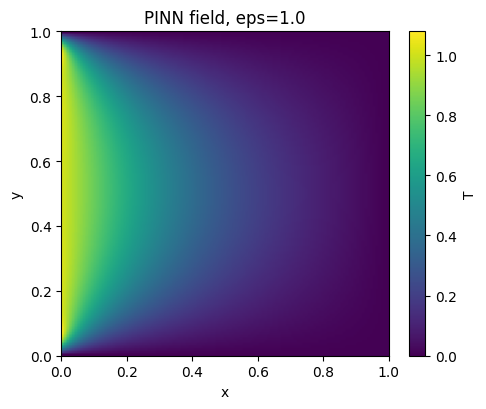

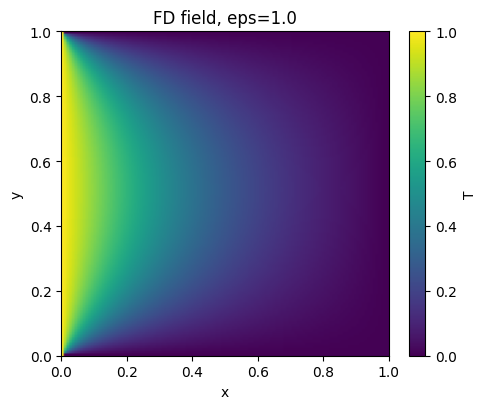

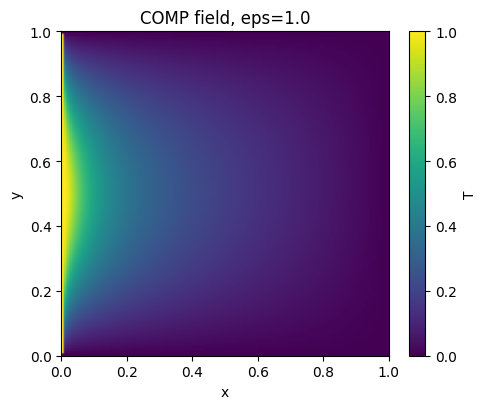

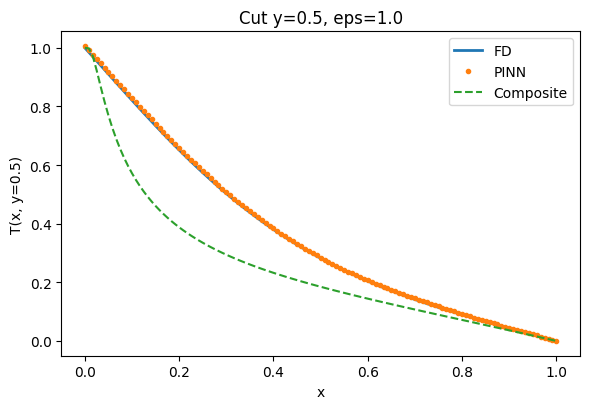

[eps=0.1|warm=True] Ep   25 | PDE 1.349e-01 | inlet*w 1.887e-01 | prior 2.798e-02 | Total 3.516e-01
[eps=0.1|warm=True] Ep   50 | PDE 6.713e-02 | inlet*w 1.182e-01 | prior 2.499e-02 | Total 2.103e-01
[eps=0.1|warm=True] Ep   75 | PDE 4.465e-02 | inlet*w 1.627e-01 | prior 2.263e-02 | Total 2.300e-01
[eps=0.1|warm=True] Ep  100 | PDE 3.616e-02 | inlet*w 1.306e-01 | prior 1.982e-02 | Total 1.866e-01
[eps=0.1|warm=True] Ep  125 | PDE 3.128e-02 | inlet*w 1.421e-01 | prior 1.673e-02 | Total 1.901e-01
[eps=0.1|warm=True] Ep  150 | PDE 2.489e-02 | inlet*w 1.247e-01 | prior 1.353e-02 | Total 1.632e-01
[eps=0.1|warm=True] Ep  175 | PDE 2.336e-02 | inlet*w 1.408e-01 | prior 1.043e-02 | Total 1.746e-01
[eps=0.1|warm=True] Ep  200 | PDE 2.361e-02 | inlet*w 1.483e-01 | prior 7.598e-03 | Total 1.795e-01
[eps=0.1|warm=True] Ep  300 | PDE 4.847e-02 | inlet*w 1.509e-01 | prior 1.971e-03 | Total 2.014e-01
[eps=0.1|warm=False] Ep   25 | PDE 1.239e-01 | inlet*w 3.820e-01 | prior 2.358e-02 | Total 5.294e-01

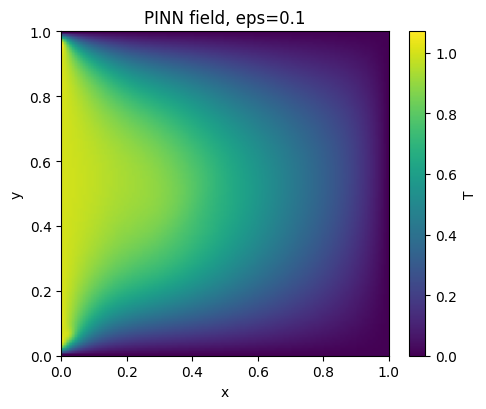

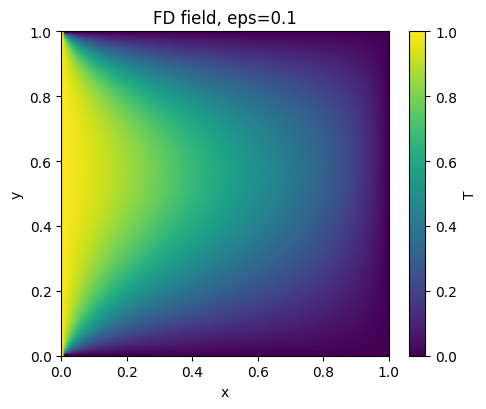

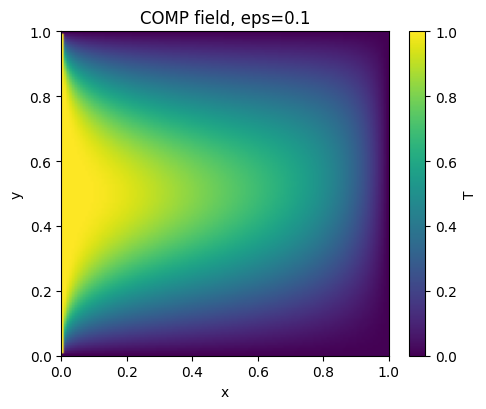

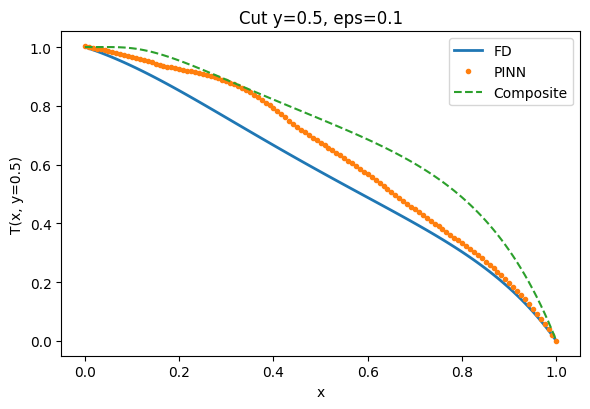

[eps=0.06|warm=True] Ep   25 | PDE 1.223e+00 | inlet*w 8.502e-01 | prior 2.599e-02 | Total 2.099e+00
[eps=0.06|warm=True] Ep   50 | PDE 3.734e-01 | inlet*w 3.399e-01 | prior 2.188e-02 | Total 7.352e-01
[eps=0.06|warm=True] Ep   75 | PDE 1.599e-01 | inlet*w 2.000e-01 | prior 1.883e-02 | Total 3.787e-01
[eps=0.06|warm=True] Ep  100 | PDE 7.998e-02 | inlet*w 1.335e-01 | prior 1.657e-02 | Total 2.301e-01
[eps=0.06|warm=True] Ep  125 | PDE 4.900e-02 | inlet*w 1.241e-01 | prior 1.411e-02 | Total 1.872e-01
[eps=0.06|warm=True] Ep  150 | PDE 3.859e-02 | inlet*w 8.464e-02 | prior 1.150e-02 | Total 1.347e-01
[eps=0.06|warm=True] Ep  175 | PDE 3.407e-02 | inlet*w 8.173e-02 | prior 8.894e-03 | Total 1.247e-01
[eps=0.06|warm=True] Ep  200 | PDE 2.958e-02 | inlet*w 7.177e-02 | prior 6.524e-03 | Total 1.079e-01
[eps=0.06|warm=True] Ep  300 | PDE 2.191e-02 | inlet*w 6.119e-02 | prior 1.733e-03 | Total 8.483e-02
[eps=0.06|warm=False] Ep   25 | PDE 1.258e-01 | inlet*w 2.140e-01 | prior 1.862e-02 | Total

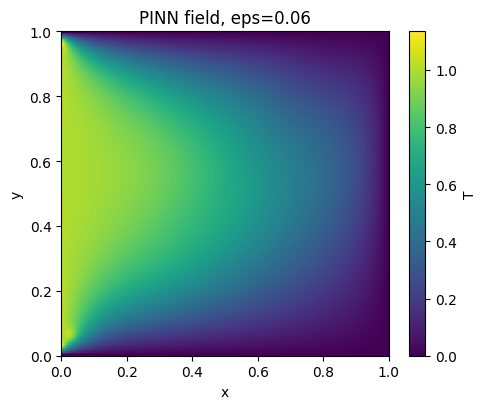

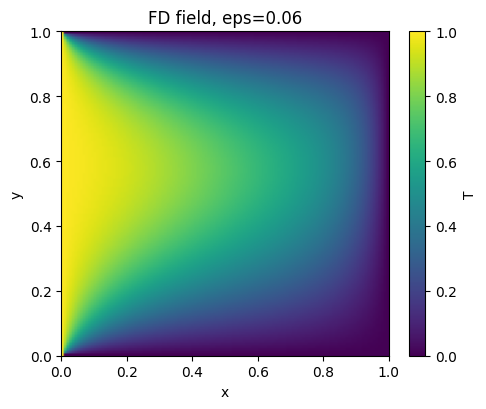

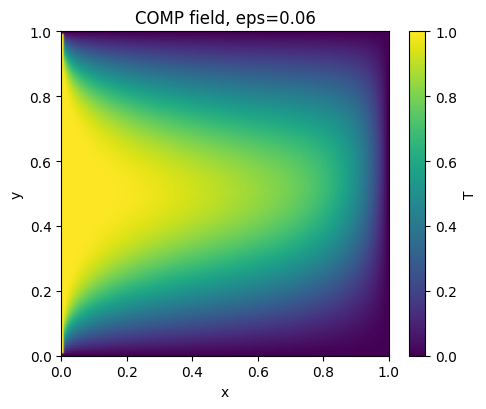

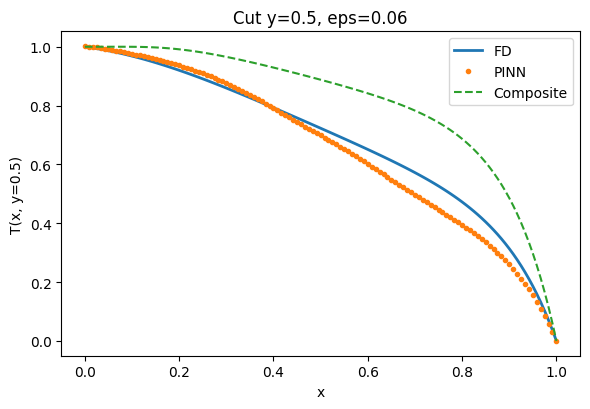

[eps=0.04|warm=True] Ep   25 | PDE 2.391e+00 | inlet*w 2.896e-01 | prior 6.253e-02 | Total 2.743e+00
[eps=0.04|warm=True] Ep   50 | PDE 7.663e-01 | inlet*w 2.322e-01 | prior 4.985e-02 | Total 1.048e+00
[eps=0.04|warm=True] Ep   75 | PDE 5.430e-01 | inlet*w 2.671e-01 | prior 4.334e-02 | Total 8.534e-01
[eps=0.04|warm=True] Ep  100 | PDE 4.184e-01 | inlet*w 3.749e-01 | prior 3.594e-02 | Total 8.293e-01
[eps=0.04|warm=True] Ep  125 | PDE 3.386e-01 | inlet*w 1.898e-01 | prior 2.932e-02 | Total 5.578e-01
[eps=0.04|warm=True] Ep  150 | PDE 2.697e-01 | inlet*w 1.980e-01 | prior 2.322e-02 | Total 4.909e-01
[eps=0.04|warm=True] Ep  175 | PDE 2.239e-01 | inlet*w 1.516e-01 | prior 1.767e-02 | Total 3.933e-01
[eps=0.04|warm=True] Ep  200 | PDE 1.821e-01 | inlet*w 1.500e-01 | prior 1.285e-02 | Total 3.449e-01
[eps=0.04|warm=True] Ep  300 | PDE 9.044e-02 | inlet*w 1.238e-01 | prior 3.237e-03 | Total 2.175e-01
[eps=0.04|warm=False] Ep   25 | PDE 2.521e-01 | inlet*w 3.802e-01 | prior 3.562e-02 | Total

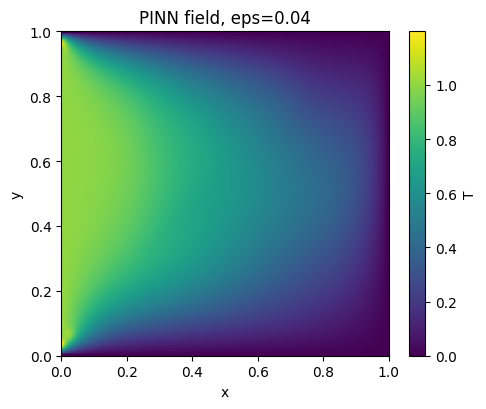

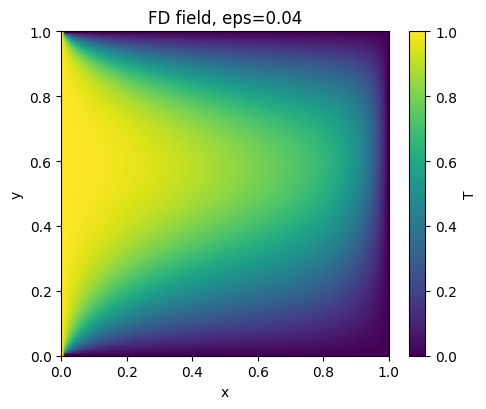

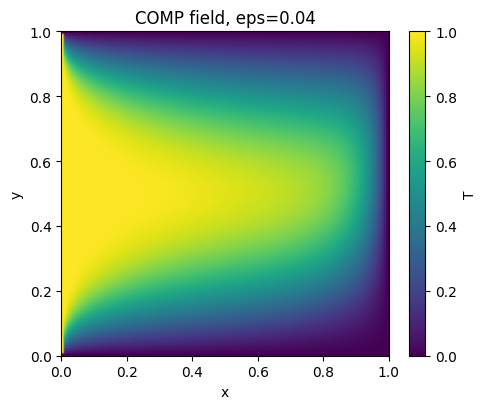

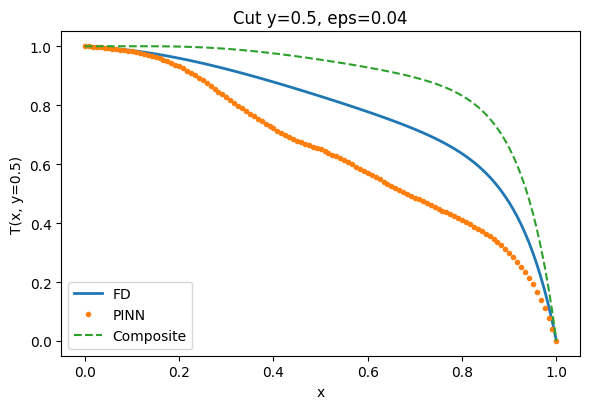


Tabla LaTeX (errores vs FD; global, núcleo y p99):
\begin{table}[H]
\centering
\caption{Errors of PINN and Composite against FD on a $121\times121$ grid. Core excludes one-cell boundary.}
\begin{tabular}{lcccccc}
\toprule
$\varepsilon$ & $L^2$ & $L^\infty$ & MAE & $L^2_{\text{core}}$ & $L^\infty_{\text{core}}$ & P99 \\
\midrule
\multicolumn{7}{l}{\textbf{PINN vs FD} ($\varepsilon=1$)} \\
 & 2.032e-02 & 1.000e+00 & 4.161e-03 & 1.047e-02 & 3.530e-01 & 1.986e-02 \\
\multicolumn{7}{l}{\textbf{Composite vs FD} ($\varepsilon=1$)} \\
 & 1.586e-01 & 1.000e+00 & 1.025e-01 & 1.608e-01 & 7.171e-01 & 4.919e-01 \\
\multicolumn{7}{l}{\textbf{PINN vs FD} ($\varepsilon=0.1$)} \\
 & 6.716e-02 & 1.000e+00 & 4.785e-02 & 6.655e-02 & 2.485e-01 & 1.633e-01 \\
\multicolumn{7}{l}{\textbf{Composite vs FD} ($\varepsilon=0.1$)} \\
 & 1.078e-01 & 1.000e+00 & 8.042e-02 & 1.090e-01 & 6.147e-01 & 3.042e-01 \\
\multicolumn{7}{l}{\textbf{PINN vs FD} ($\varepsilon=0.06$)} \\
 & 4.921e-02 & 1.000e+00 & 3.436e-02 & 4.78

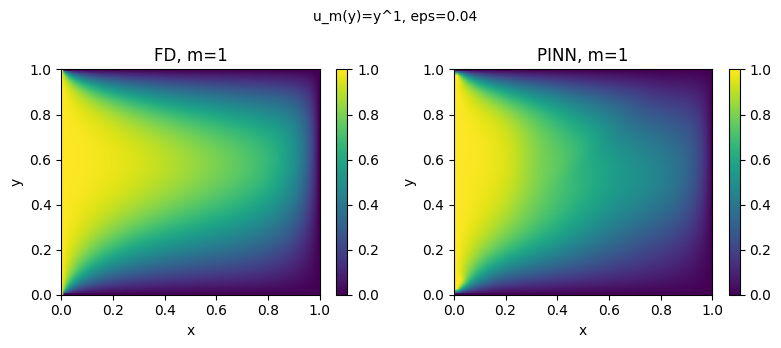

[shear m=2, eps=0.04] Ep   25 | PDE 5.638e-01 | inlet*w 7.546e-01 | Total 1.318e+00
[shear m=2, eps=0.04] Ep   50 | PDE 4.186e-01 | inlet*w 3.014e-01 | Total 7.200e-01
[shear m=2, eps=0.04] Ep   75 | PDE 3.449e-01 | inlet*w 2.439e-01 | Total 5.888e-01
[shear m=2, eps=0.04] Ep  100 | PDE 2.704e-01 | inlet*w 2.127e-01 | Total 4.831e-01
[shear m=2, eps=0.04] Ep  125 | PDE 2.124e-01 | inlet*w 1.494e-01 | Total 3.618e-01
[shear m=2, eps=0.04] Ep  150 | PDE 1.691e-01 | inlet*w 1.600e-01 | Total 3.292e-01
[shear m=2, eps=0.04] Ep  175 | PDE 1.367e-01 | inlet*w 1.619e-01 | Total 2.986e-01
[shear m=2, eps=0.04] Ep  200 | PDE 1.108e-01 | inlet*w 1.814e-01 | Total 2.922e-01
[shear m=2, eps=0.04] Ep  300 | PDE 5.891e-02 | inlet*w 1.305e-01 | Total 1.894e-01
[shear m=2, eps=0.04] Ep   25 | PDE 6.363e-02 | inlet*w 2.006e-01 | Total 2.643e-01
[shear m=2, eps=0.04] Ep   50 | PDE 3.501e-02 | inlet*w 8.433e-02 | Total 1.193e-01
[shear m=2, eps=0.04] Ep   75 | PDE 2.945e-02 | inlet*w 7.513e-02 | Total 1.

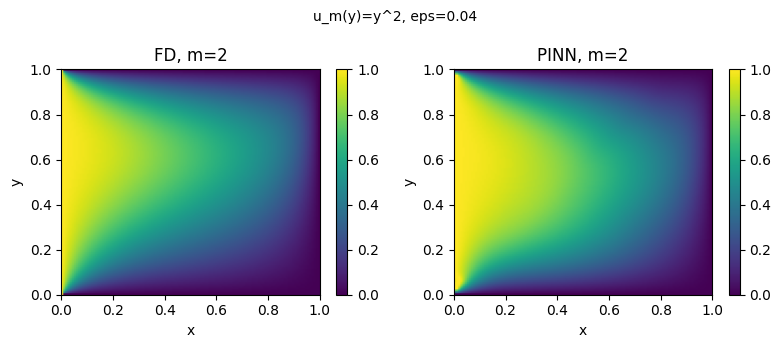

[shear m=3, eps=0.04] Ep   25 | PDE 6.124e-01 | inlet*w 7.878e-01 | Total 1.400e+00
[shear m=3, eps=0.04] Ep   50 | PDE 4.121e-01 | inlet*w 3.493e-01 | Total 7.614e-01
[shear m=3, eps=0.04] Ep   75 | PDE 3.631e-01 | inlet*w 2.546e-01 | Total 6.177e-01
[shear m=3, eps=0.04] Ep  100 | PDE 3.015e-01 | inlet*w 2.113e-01 | Total 5.127e-01
[shear m=3, eps=0.04] Ep  125 | PDE 2.414e-01 | inlet*w 1.512e-01 | Total 3.926e-01
[shear m=3, eps=0.04] Ep  150 | PDE 1.997e-01 | inlet*w 1.617e-01 | Total 3.614e-01
[shear m=3, eps=0.04] Ep  175 | PDE 1.691e-01 | inlet*w 1.638e-01 | Total 3.329e-01
[shear m=3, eps=0.04] Ep  200 | PDE 1.428e-01 | inlet*w 1.841e-01 | Total 3.269e-01
[shear m=3, eps=0.04] Ep  300 | PDE 7.556e-02 | inlet*w 1.399e-01 | Total 2.155e-01
[shear m=3, eps=0.04] Ep   25 | PDE 4.974e-02 | inlet*w 1.662e-01 | Total 2.159e-01
[shear m=3, eps=0.04] Ep   50 | PDE 3.798e-02 | inlet*w 8.454e-02 | Total 1.225e-01
[shear m=3, eps=0.04] Ep   75 | PDE 3.276e-02 | inlet*w 7.304e-02 | Total 1.

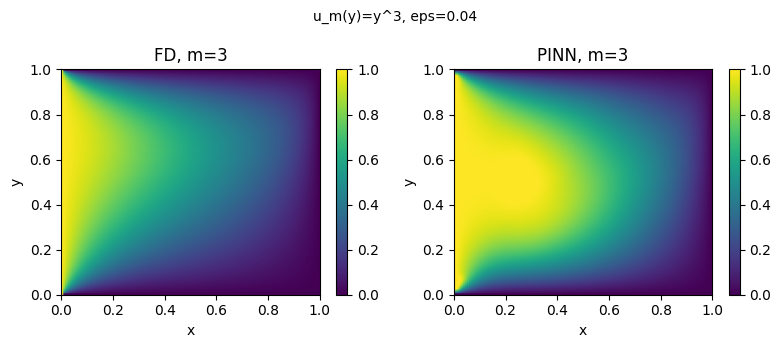


Tabla LaTeX: errores PINN vs FD para u_m(y)=y^m (núcleo y P99):
\begin{table}[H]
\centering
\caption{PINN errors against FD for generalized shear profiles $u_m(y)=y^m$ at fixed $\varepsilon$.}
\label{tab:errors-general-shear}
\begin{tabular}{llccc}
\toprule
$m$ & $\varepsilon$ & $L^2_{\text{core}}$ & $L^\infty_{\text{core}}$ & P99 \\
\midrule
1 & 0.04 & 1.155e-01 & 2.801e-01 & 2.595e-01 \\
2 & 0.04 & 7.172e-02 & 3.181e-01 & 1.775e-01 \\
3 & 0.04 & 1.647e-01 & 4.036e-01 & 3.910e-01 \\
\bottomrule
\end{tabular}
\end{table}


In [ ]:
# %% PINN Couette FULL + Curriculum + Outlet-focus + RAR + Prior asintótico (híbrido)
import os, random
import numpy as np
import pandas as pd
import torch, torch.nn as nn, torch.optim as optim
import matplotlib.pyplot as plt
from scipy.sparse import lil_matrix, csc_matrix
from scipy.sparse.linalg import spsolve
from scipy.special import gammaincc

# ---------------- Configuración ----------------
CURRICULUM_EPS = [1.0, 0.1, 0.06, 0.04]   # warm-start
GRID_N   = 121
T0, Tw   = 1.0, 0.0
SEED     = 1234
SAVE_DIR = "/content/outputs"
os.makedirs(SAVE_DIR, exist_ok=True)

# Entrenamiento (OOM-safe)
NR_WARMUP, NB_WARMUP = 2000, 600
NR_MAIN,   NB_MAIN   = 7000, 1000
MICRO_WARMUP = 800
MICRO_MAIN   = 2000
EPOCHS_WARMUP = 300
EPOCHS_MAIN   = 5000
LBFGS_IT      = 600

# Red
WIDTH, DEPTH = 48, 4
MODEL_NAME   = "couette_full_curr"

# ===== Muestreo y pesos (más capa de salida) =====
INLET_MARGIN  = 0.05
STRIP_X0      = 0.02
BIAS_POW      = 10.0          # más sesgo a x→1
OUTLET_STRIPE = (0.90, 1.0)   # franja pegada a salida
FRAC_OUTLET   = 0.50          # 50% de puntos en la franja de salida
W_REGION      = 10.0          # peso PDE adicional en x>0.90

# RAR
RAR_ROUNDS = 2
RAR_POOL   = 20000
RAR_ADD    = 3000

# ===== Regularización suave hacia la compuesta (prior) =====
PRIOR_LAMBDA_MAX = 0.6    # peso inicial del prior
PRIOR_LAMBDA_MIN = 0.05   # peso final (casi apagado)
CORE_MARGIN_Y    = 0.10   # núcleo: y∈[0.10, 0.90]
CORE_MARGIN_XL   = 0.08   # evita inlet inmediato
CORE_MARGIN_XR   = 0.08   # evita outlet inmediato

# ---------------- Utilidades ----------------
def set_seed(s=SEED):
    random.seed(s)
    np.random.seed(s)
    torch.manual_seed(s)

set_seed()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

# Red + transform
class MLP(nn.Module):
    def __init__(self, in_dim=2, out_dim=1, width=WIDTH, depth=DEPTH):
        super().__init__()
        layers = [nn.Linear(in_dim, width), nn.Tanh()]
        for _ in range(depth-1):
            layers += [nn.Linear(width, width), nn.Tanh()]
        layers += [nn.Linear(width, out_dim)]
        self.net = nn.Sequential(*layers)
        for m in self.net:
            if isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight)
                nn.init.zeros_(m.bias)

    def forward(self, z):  # z en [-1,1]^2
        return self.net(z)

def output_transform(xy, raw):
    x = xy[:,0:1]; y = xy[:,1:2]
    g = (1.0 - x) * y * (1.0 - y)
    return Tw + g * raw

def to_net_coords(xy):
    return 2.0*xy - 1.0

def T_model(net, xy):
    z = to_net_coords(xy)
    return output_transform(xy, net(z))

# PDE residual y pérdida (Couette u(y)=y)
def pde_residual(net, xy, eps):
    xy = xy.clone().detach().requires_grad_(True)
    T  = T_model(net, xy)
    grads = torch.autograd.grad(
        T, xy, torch.ones_like(T),
        retain_graph=True, create_graph=True
    )[0]
    Tx, Ty = grads[:,0:1], grads[:,1:2]
    g2x = torch.autograd.grad(
        Tx, xy, torch.ones_like(Tx),
        retain_graph=True, create_graph=True
    )[0]
    g2y = torch.autograd.grad(
        Ty, xy, torch.ones_like(Ty),
        retain_graph=True, create_graph=True
    )[0]
    Txx, Tyy = g2x[:,0:1], g2y[:,1:2]
    eps_t = torch.as_tensor(eps, dtype=T.dtype, device=T.device)
    y   = xy[:,1:2]
    return y*Tx - eps_t*(Txx + Tyy)

def region_weight(xy):
    x = xy[:,0:1]
    w = torch.ones_like(x)
    w = w + (W_REGION-1.0)*(x > OUTLET_STRIPE[0]).float()
    return w

def pde_loss_micro(net, XY, eps, micro):
    n = XY.shape[0]
    total = XY.new_tensor(0.0)
    k = 0
    for i in range(0, n, micro):
        X = XY[i:i+micro]
        R = pde_residual(net, X, eps)
        w = region_weight(X)
        total = total + torch.mean((w*R)**2)
        k += 1
    return total/max(k,1)

mse = lambda a: torch.mean(a**2)

# Muestreo (con franja de salida)
def sample_interior(N, device):
    N_out = int(N*FRAC_OUTLET)
    N_rest= N - N_out
    # frente
    N_front = N_rest//2
    x1 = torch.rand(N_front,1,device=device)*0.2
    y1 = torch.rand(N_front,1,device=device)
    # sesgo a x→1
    N_bias = N_rest - N_front
    u = torch.rand(N_bias,1,device=device)
    x2 = 1 - (1-u)**BIAS_POW
    y2 = torch.rand(N_bias,1,device=device)
    # franja salida
    xl, xr = OUTLET_STRIPE
    x3 = torch.rand(N_out,1,device=device)*(xr-xl)+xl
    y3 = torch.rand(N_out,1,device=device)
    X = torch.cat([x1,x2,x3], dim=0)
    Y = torch.cat([y1,y2,y3], dim=0)
    return torch.cat([X,Y], dim=1)

def bd_x0(N, device):
    x = torch.zeros(N,1,device=device)
    y = torch.rand(N,1,device=device)*(1-2*INLET_MARGIN)+INLET_MARGIN
    return torch.cat([x,y], dim=1)

def bd_strip_x0(N, device, x_max=STRIP_X0):
    x = torch.rand(N,1,device=device)*x_max
    y = torch.rand(N,1,device=device)*(1-2*INLET_MARGIN)+INLET_MARGIN
    return torch.cat([x,y], dim=1)

# RAR: Couette
def rar_augment(net, eps, base_XY, add=RAR_ADD, pool=RAR_POOL):
    with torch.no_grad():
        XYpool = torch.rand(pool,2,device=device)  # uniforme
    R = pde_residual(net, XYpool, eps).detach().abs().view(-1)
    idx = torch.topk(R, k=min(add, R.numel())).indices
    return torch.cat([base_XY, XYpool[idx]], dim=0)

# Composite (diagnóstico opcional)
def composite_couette(x_grid, y_grid, eps, h=1.0, T0=1.0, Tw=0.0, p=2):
    """
    Composite para y*T_x = eps*(T_xx + T_yy) con:
      x=0: T=T0, y=0,h: T=Tw, x=1: T=Tw.
    Usa Q(s,z)=gammaincc(s,z), unión de capas por inclusión–exclusión
    y ventana w(x)=x**p para la capa de salida. Devuelve [Nx,Ny] (ij).
    """
    X, Y = np.meshgrid(x_grid, y_grid, indexing='ij')
    s     = 1.0/3.0
    delta = 1e-12

    z1 = (Y**3)       / (3.0*eps*np.maximum(X, delta))  # pared inferior
    z2 = ((h - Y)**3) / (3.0*eps*np.maximum(X, delta))  # pared superior
    Qb = gammaincc(s, z1)
    Qt = gammaincc(s, z2)

    S = Qb + Qt - Qb*Qt
    core = 1.0 - S

    w = X**p
    outlet = np.exp(-(1.0 - X)*Y/eps)

    Tcomp = T0 + (Tw - T0) * ( S + w*outlet*core )
    return Tcomp

# ====== Prior suave hacia la compuesta (sólo en núcleo) ======
def core_window(xy):
    x = xy[:,0:1]; y = xy[:,1:2]
    m_y = (y > CORE_MARGIN_Y) & (y < 1.0-CORE_MARGIN_Y)
    m_x = (x > CORE_MARGIN_XL) & (x < 1.0-CORE_MARGIN_XR)
    return (m_x & m_y).float()

def prior_loss_to_composite(net, xy, eps, xs_np, ys_np, Tcomp_np):
    """
    Interpola T_comp en (xy) y penaliza sólo en el núcleo (ventana).
    """
    with torch.no_grad():
        xs = torch.tensor(xs_np, dtype=torch.float32, device=xy.device)
        ys = torch.tensor(ys_np, dtype=torch.float32, device=xy.device)
        Tcomp = torch.tensor(Tcomp_np, dtype=torch.float32, device=xy.device)  # [Nx,Ny]

    x = xy[:,0]; y = xy[:,1]
    Nx, Ny = xs.numel(), ys.numel()
    hx = xs[1]-xs[0]; hy = ys[1]-ys[0]

    ix = torch.clamp(((x/xs[-1])*(Nx-1)).floor().long(), 0, Nx-2)
    iy = torch.clamp(((y/ys[-1])*(Ny-1)).floor().long(), 0, Ny-2)
    tx = (x - xs[ix])/(hx+1e-12); ty = (y - ys[iy])/(hy+1e-12)

    def G(i,j): return Tcomp[i, j]
    Tc = ( (1-tx)*(1-ty)*G(ix,   iy)   + tx*(1-ty)*G(ix+1, iy)
         + (1-tx)*ty*G(ix,   iy+1)     + tx*ty*G(ix+1, iy+1) ).unsqueeze(1)

    Tpred = T_model(net, xy)
    wcore = core_window(xy)
    return torch.sum(wcore * (Tpred - Tc)**2) / (torch.sum(wcore)+1e-12)

# FD de referencia (Couette: u(y)=y)
def solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N):
    xs = np.linspace(0,1,Nx); ys = np.linspace(0,1,Ny)
    hx = xs[1]-xs[0]; hy = ys[1]-ys[0]
    def idx(i,j): return j*Nx + i
    N = Nx*Ny
    A = lil_matrix((N,N), dtype=float)
    b = np.zeros(N, dtype=float)
    for j in range(Ny):
        y = ys[j]
        for i in range(Nx):
            k = idx(i,j)
            if i==0:
                A[k,k]=1; b[k]=1;  continue   # inlet
            if i==Nx-1:
                A[k,k]=1; b[k]=0;  continue   # outlet
            if j==0 or j==Ny-1:
                A[k,k]=1; b[k]=0;  continue   # paredes
            cx = eps/(hx*hx)
            cy = eps/(hy*hy)
            conv = y/hx
            A[k, idx(i-1,j)] += ( cx + conv)   # upwind
            A[k, idx(i+1,j)] += ( cx)
            A[k, idx(i,  j-1)] += ( cy)
            A[k, idx(i,  j+1)] += ( cy)
            A[k, k]           += (-2*cx - 2*cy - conv)
    T = spsolve(csc_matrix(A), b).reshape(Ny, Nx)
    return np.array(T.T, dtype=np.float64)

# Métricas robustas
def metrics_all(Tp, Tr):
    E = Tp - Tr
    L2   = float(np.sqrt(np.mean(E**2)))
    Linf = float(np.max(np.abs(E)))
    MAE  = float(np.mean(np.abs(E)))
    core = (slice(1,-1), slice(1,-1))
    Ec   = E[core]
    L2c   = float(np.sqrt(np.mean(Ec**2)))
    Linfc = float(np.max(np.abs(Ec)))
    MAEc  = float(np.mean(np.abs(Ec)))
    p99   = float(np.percentile(np.abs(E).ravel(), 99))
    return dict(L2=L2, Linf=Linf, MAE=MAE,
                L2_core=L2c, Linf_core=Linfc, MAE_core=MAEc, P99=p99)

def should_log(ep, total):
    if ep<=200: return ep%25==0
    if ep<=1000:return ep%100==0
    return ep%max(total//12,500)==0

# Entrena una fase (Couette) con RAR y prior
def train_phase(net, eps, NR, NB, MICRO, EPOCHS, W_INLET, do_rar=False):
    opt = optim.Adam(net.parameters(), lr=1e-3)
    XYr = sample_interior(NR, device)

    # precomputo del campo compuesto para el prior
    xs_np = np.linspace(0,1,GRID_N); ys_np = np.linspace(0,1,GRID_N)
    Tcomp_np = composite_couette(xs_np, ys_np, eps)

    for ep in range(1, EPOCHS+1):
        if do_rar and ep in [int(EPOCHS*0.4), int(EPOCHS*0.75)]:
            XYr = rar_augment(net, eps, XYr, add=RAR_ADD, pool=RAR_POOL)

        X0  = bd_x0(NB, device)
        X0s = bd_strip_x0(NB, device, x_max=STRIP_X0)

        # --- grafos independientes para cada término ---
        loss_pde = pde_loss_micro(net, XYr, eps, micro=MICRO)
        loss_bc  = mse(T_model(net, X0)-T0) + mse(T_model(net, X0s)-T0)

        XY_prior   = XYr.detach()
        loss_prior = prior_loss_to_composite(net, XY_prior, eps, xs_np, ys_np, Tcomp_np)

        # annealing del prior
        alpha = 0.5*(1 + np.cos(np.pi*min(ep/EPOCHS,1.0)))
        lam_prior = PRIOR_LAMBDA_MIN + (PRIOR_LAMBDA_MAX - PRIOR_LAMBDA_MIN)*alpha

        loss = loss_pde + W_INLET*loss_bc + lam_prior*loss_prior

        opt.zero_grad()
        loss.backward()
        opt.step()

        if should_log(ep, EPOCHS):
            print(f"[eps={eps:.3g}|warm={NR==NR_WARMUP}] Ep {ep:4d} | PDE {loss_pde.item():.3e} "
                  f"| inlet*w {W_INLET*loss_bc.item():.3e} | prior {lam_prior*loss_prior.item():.3e} "
                  f"| Total {loss.item():.3e}")

# Ejecuta un caso Couette con warm-up → main → L-BFGS
def run_case(eps, init_state_dict=None):
    set_seed()
    net = MLP().to(device)
    if init_state_dict is not None:
        net.load_state_dict(init_state_dict)

    W_INLET = 50.0 if eps>=0.5 else 100.0

    # warm-up (sin RAR)
    train_phase(net, eps, NR_WARMUP, NB_WARMUP, MICRO_WARMUP,
                EPOCHS_WARMUP, W_INLET, do_rar=False)
    # fase principal (con RAR)
    train_phase(net, eps, NR_MAIN, NB_MAIN, MICRO_MAIN,
                EPOCHS_MAIN, W_INLET, do_rar=True)

    # L-BFGS: recompone grafo en cada closure + prior pequeño
    XYc  = sample_interior(4000, device).detach()
    X0c  = bd_x0(NB_MAIN, device).detach()
    X0sc = bd_strip_x0(NB_MAIN, device, x_max=STRIP_X0).detach()

    xs_np = np.linspace(0,1,GRID_N); ys_np = np.linspace(0,1,GRID_N)
    Tcomp_np = composite_couette(xs_np, ys_np, eps)
    LBF_PRIOR = 0.05

    opt2 = optim.LBFGS(net.parameters(), lr=1.0,
                       max_iter=LBFGS_IT, history_size=50,
                       line_search_fn="strong_wolfe")

    def closure():
        opt2.zero_grad()
        loss = pde_loss_micro(net, XYc, eps, micro=MICRO_MAIN) \
             + W_INLET*mse(T_model(net, X0c)-T0) \
             + W_INLET*mse(T_model(net, X0sc)-T0) \
             + LBF_PRIOR*prior_loss_to_composite(net, XYc, eps, xs_np, ys_np, Tcomp_np)
        loss.backward()
        return loss

    print(f"[eps={eps:.3g}] L-BFGS x{LBFGS_IT}...")
    opt2.step(closure)

    # Evaluación vs FD + figuras
    xs = np.linspace(0,1,GRID_N); ys = np.linspace(0,1,GRID_N)
    xs_t = torch.tensor(xs, dtype=torch.float32, device=device)
    ys_t = torch.tensor(ys, dtype=torch.float32, device=device)
    Xg, Yg = torch.meshgrid(xs_t, ys_t, indexing='ij')
    XY = torch.stack([Xg.reshape(-1), Yg.reshape(-1)], dim=1)
    with torch.no_grad():
        Tpred = T_model(net, XY).reshape(GRID_N, GRID_N).cpu().numpy()
    Tfd = solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N)
    Tcomp = composite_couette(xs, ys, eps)

    m_pinn = metrics_all(Tpred, Tfd)
    m_comp = metrics_all(Tcomp, Tfd)
    print(f"[eps={eps:.3g}] PINN vs FD -> {m_pinn}")
    print(f"[eps={eps:.3g}] COMP vs FD -> {m_comp}")

    # Guardar CSV + mapas + corte
    pd.DataFrame(Tpred, index=xs, columns=ys).to_csv(
        f"{SAVE_DIR}/T_PINN_eps_{eps:.3g}_{MODEL_NAME}.csv", float_format="%.6f")
    pd.DataFrame(Tfd,   index=xs, columns=ys).to_csv(
        f"{SAVE_DIR}/T_FD_eps_{eps:.3g}.csv", float_format="%.6f")
    pd.DataFrame(Tcomp, index=xs, columns=ys).to_csv(
        f"{SAVE_DIR}/T_Composite_eps_{eps:.3g}.csv", float_format="%.6f")

    for tag, Tmat in [("PINN",Tpred), ("FD",Tfd), ("COMP",Tcomp)]:
        plt.figure(figsize=(5.0,4.2))
        im=plt.imshow(Tmat.T, origin='lower', extent=[0,1,0,1], aspect='auto')
        plt.colorbar(im,label='T')
        plt.xlabel('x'); plt.ylabel('y')
        plt.title(f'{tag} field, eps={eps}')
        plt.tight_layout()
        plt.savefig(f"{SAVE_DIR}/{tag}_field_eps_{eps:.3g}.png", dpi=140)
        plt.show()

    jmid = GRID_N//2
    plt.figure(figsize=(6.0,4.2))
    plt.plot(xs, Tfd[:,jmid], '-',  lw=2, label='FD')
    plt.plot(xs, Tpred[:,jmid], 'o', ms=3, label='PINN')
    plt.plot(xs, Tcomp[:,jmid], '--', lw=1.5, label='Composite')
    plt.xlabel('x'); plt.ylabel('T(x, y=0.5)')
    plt.title(f'Cut y=0.5, eps={eps}')
    plt.legend()
    plt.tight_layout()
    plt.savefig(f"{SAVE_DIR}/cut_y05_eps_{eps:.3g}.png", dpi=150)
    plt.show()

    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    return net.state_dict(), m_pinn, m_comp

# ---------------- Loop curriculum (warm-start) + tabla Couette ----------------
results = []
state = None
for eps in CURRICULUM_EPS:
    print("="*72)
    state, m_pinn, m_comp = run_case(eps, init_state_dict=state)
    results.append((eps, m_pinn, m_comp))

print("\nTabla LaTeX (errores vs FD; global, núcleo y p99):")
print(r"\begin{table}[H]")
print(r"\centering")
print(r"\caption{Errors of PINN and Composite against FD on a $121\times121$ grid. Core excludes one-cell boundary.}")
print(r"\begin{tabular}{lcccccc}")
print(r"\toprule")
print(r"$\varepsilon$ & $L^2$ & $L^\infty$ & MAE & $L^2_{\text{core}}$ & $L^\infty_{\text{core}}$ & P99 \\")
print(r"\midrule")
for eps, m_pinn, m_comp in results:
    print(rf"\multicolumn{{7}}{{l}}{{\textbf{{PINN vs FD}} ($\varepsilon={eps:g}$)}} \\")
    print(rf" & {m_pinn['L2']:.3e} & {m_pinn['Linf']:.3e} & {m_pinn['MAE']:.3e} & "
          rf"{m_pinn['L2_core']:.3e} & {m_pinn['Linf_core']:.3e} & {m_pinn['P99']:.3e} \\")
    print(rf"\multicolumn{{7}}{{l}}{{\textbf{{Composite vs FD}} ($\varepsilon={eps:g}$)}} \\")
    print(rf" & {m_comp['L2']:.3e} & {m_comp['Linf']:.3e} & {m_comp['MAE']:.3e} & "
          rf"{m_comp['L2_core']:.3e} & {m_comp['Linf_core']:.3e} & {m_comp['P99']:.3e} \\")
print(r"\bottomrule")
print(r"\end{tabular}")
print(r"\end{table}")

# ============================================================
# NUEVO: perfiles de corte generalizados u_m(y)=y^m
# ============================================================

def pde_residual_shear(net, xy, eps, m):
    """
    Residual para u_m(y) T_x = eps (T_xx + T_yy), con u_m(y) = y^m.
    """
    xy = xy.clone().detach().requires_grad_(True)
    T  = T_model(net, xy)

    grads = torch.autograd.grad(
        T, xy, torch.ones_like(T),
        retain_graph=True, create_graph=True
    )[0]
    Tx, Ty = grads[:,0:1], grads[:,1:2]

    g2x = torch.autograd.grad(
        Tx, xy, torch.ones_like(Tx),
        retain_graph=True, create_graph=True
    )[0]
    g2y = torch.autograd.grad(
        Ty, xy, torch.ones_like(Ty),
        retain_graph=True, create_graph=True
    )[0]
    Txx, Tyy = g2x[:,0:1], g2y[:,1:2]

    eps_t = torch.as_tensor(eps, dtype=T.dtype, device=T.device)
    y     = xy[:,1:2]
    u     = y**m

    return u*Tx - eps_t*(Txx + Tyy)

def pde_loss_micro_shear(net, XY, eps, micro, m):
    """
    Versión micro-batch del loss PDE, usando el residual con y^m.
    """
    n = XY.shape[0]
    total = XY.new_tensor(0.0)
    k = 0
    for i in range(0, n, micro):
        X = XY[i:i+micro]
        R = pde_residual_shear(net, X, eps, m)
        w = region_weight(X)
        total = total + torch.mean((w*R)**2)
        k += 1
    return total/max(k,1)

def rar_augment_shear(net, eps, m, base_XY, add=RAR_ADD, pool=RAR_POOL):
    """
    Igual que rar_augment, pero usando el residual con y^m.
    """
    with torch.no_grad():
        XYpool = torch.rand(pool, 2, device=device)  # uniforme

    R = pde_residual_shear(net, XYpool, eps, m).detach().abs().view(-1)
    idx = torch.topk(R, k=min(add, R.numel())).indices
    return torch.cat([base_XY, XYpool[idx]], dim=0)

def solve_fd_shear(eps, m, Nx=GRID_N, Ny=GRID_N):
    """
    FD de referencia para u_m(y) T_x = eps (T_xx + T_yy),
    con u_m(y) = y^m, mismo esquema upwind que solve_fd_reference.
    """
    xs = np.linspace(0,1,Nx)
    ys = np.linspace(0,1,Ny)
    hx = xs[1] - xs[0]
    hy = ys[1] - ys[0]

    def idx(i,j): return j*Nx + i

    N = Nx*Ny
    A = lil_matrix((N,N), dtype=float)
    b = np.zeros(N, dtype=float)

    for j in range(Ny):
        y = ys[j]
        for i in range(Nx):
            k = idx(i,j)

            # fronteras: mismas condiciones Dirichlet
            if i == 0:         # inlet x=0: T=1
                A[k,k] = 1.0; b[k] = 1.0
                continue
            if i == Nx-1:      # outlet x=1: T=0
                A[k,k] = 1.0; b[k] = 0.0
                continue
            if j == 0 or j == Ny-1:   # paredes y=0,1: T=0
                A[k,k] = 1.0; b[k] = 0.0
                continue

            cx = eps/(hx*hx)
            cy = eps/(hy*hy)
            u  = y**m
            conv = u/hx    # término convectivo upwind (u>0)

            # Difusión + convección en x
            A[k, idx(i-1,j)] += (cx + conv)
            A[k, idx(i+1,j)] += (cx)
            # Difusión en y (central)
            A[k, idx(i,  j-1)] += (cy)
            A[k, idx(i,  j+1)] += (cy)
            # Diagonal
            A[k, k] += (-2*cx - 2*cy - conv)

    T = spsolve(csc_matrix(A), b).reshape(Ny, Nx)
    # Devolvemos [Nx,Ny] en coherencia con solve_fd_reference
    return np.array(T.T, dtype=np.float64)

def train_phase_shear(net, eps, m, NR, NB, MICRO, EPOCHS, W_INLET, do_rar=False):
    opt = optim.Adam(net.parameters(), lr=1e-3)
    XYr = sample_interior(NR, device)

    for ep in range(1, EPOCHS+1):
        # RAR en dos momentos de la fase
        if do_rar and ep in [int(EPOCHS*0.4), int(EPOCHS*0.75)]:
            XYr = rar_augment_shear(net, eps, m, XYr, add=RAR_ADD, pool=RAR_POOL)

        X0  = bd_x0(NB, device)
        X0s = bd_strip_x0(NB, device, x_max=STRIP_X0)

        loss_pde = pde_loss_micro_shear(net, XYr, eps, micro=MICRO, m=m)
        loss_bc  = mse(T_model(net, X0) - T0) + mse(T_model(net, X0s) - T0)

        loss = loss_pde + W_INLET*loss_bc

        opt.zero_grad()
        loss.backward()
        opt.step()

        if should_log(ep, EPOCHS):
            print(f"[shear m={m}, eps={eps:.3g}] Ep {ep:4d} | "
                  f"PDE {loss_pde.item():.3e} | inlet*w {W_INLET*loss_bc.item():.3e} "
                  f"| Total {loss.item():.3e}")

def run_case_shear(eps, m, init_state_dict=None):
    """
    Caso único para u_m(y)=y^m a un eps dado.
    Estructura: warm-up + main + L-BFGS (sin prior compuesto).
    """
    set_seed()
    net = MLP().to(device)
    if init_state_dict is not None:
        net.load_state_dict(init_state_dict)

    W_INLET = 50.0 if eps >= 0.5 else 100.0

    # warm-up (sin RAR)
    train_phase_shear(
        net, eps, m,
        NR_WARMUP, NB_WARMUP, MICRO_WARMUP, EPOCHS_WARMUP,
        W_INLET, do_rar=False
    )

    # fase principal (con RAR)
    train_phase_shear(
        net, eps, m,
        NR_MAIN, NB_MAIN, MICRO_MAIN, EPOCHS_MAIN,
        W_INLET, do_rar=True
    )

    # --- L-BFGS final (PDE + BC, sin prior) ---
    XYc  = sample_interior(4000, device).detach()
    X0c  = bd_x0(NB_MAIN, device).detach()
    X0sc = bd_strip_x0(NB_MAIN, device, x_max=STRIP_X0).detach()

    opt2 = optim.LBFGS(
        net.parameters(), lr=1.0,
        max_iter=LBFGS_IT, history_size=50,
        line_search_fn="strong_wolfe"
    )

    def closure():
        opt2.zero_grad()
        loss = pde_loss_micro_shear(net, XYc, eps, micro=MICRO_MAIN, m=m) \
             + W_INLET*mse(T_model(net, X0c) - T0) \
             + W_INLET*mse(T_model(net, X0sc) - T0)
        loss.backward()
        return loss

    print(f"[shear m={m}, eps={eps:.3g}] L-BFGS x{LBFGS_IT}...")
    opt2.step(closure)

    # --- Evaluación en la malla y comparación con FD ---
    xs = np.linspace(0,1,GRID_N)
    ys = np.linspace(0,1,GRID_N)
    xs_t = torch.tensor(xs, dtype=torch.float32, device=device)
    ys_t = torch.tensor(ys, dtype=torch.float32, device=device)
    Xg, Yg = torch.meshgrid(xs_t, ys_t, indexing='ij')
    XY = torch.stack([Xg.reshape(-1), Yg.reshape(-1)], dim=1)

    with torch.no_grad():
        Tpred = T_model(net, XY).reshape(GRID_N, GRID_N).cpu().numpy()

    Tfd = solve_fd_shear(eps, m, Nx=GRID_N, Ny=GRID_N)

    m_pinn = metrics_all(Tpred, Tfd)
    print(f"[shear m={m}, eps={eps:.3g}] PINN vs FD -> {m_pinn}")

    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    return net.state_dict(), m_pinn, xs, ys, Tfd, Tpred

def plot_fields_general_shear(xs, ys, Tfd, Tpred, eps, m):
    """
    Genera una figura con dos subplots (FD, PINN) y la guarda como
    fields_m{m}.png en SAVE_DIR.
    """
    extent = [xs[0], xs[-1], ys[0], ys[-1]]
    vmin, vmax = 0.0, 1.0  # T0=1, Tw=0

    fig, axs = plt.subplots(1, 2, figsize=(8.0, 3.5))

    im0 = axs[0].imshow(
        Tfd.T, origin='lower', extent=extent, aspect='auto',
        vmin=vmin, vmax=vmax
    )
    axs[0].set_title(f"FD, m={m}")
    axs[0].set_xlabel("x")
    axs[0].set_ylabel("y")
    fig.colorbar(im0, ax=axs[0])

    im1 = axs[1].imshow(
        Tpred.T, origin='lower', extent=extent, aspect='auto',
        vmin=vmin, vmax=vmax
    )
    axs[1].set_title(f"PINN, m={m}")
    axs[1].set_xlabel("x")
    axs[1].set_ylabel("y")
    fig.colorbar(im1, ax=axs[1])

    fig.suptitle(f"u_m(y)=y^{m}, eps={eps}", fontsize=10)
    plt.tight_layout()
    plt.savefig(f"{SAVE_DIR}/fields_m{m}.png", dpi=200, bbox_inches="tight")
    plt.show()
    plt.close(fig)

# --- Ejecutar experimento generalizado u_m(y)=y^m ---

M_VALUES  = [1, 2, 3]
EPS_SHEAR = 0.04   # el eps "de referencia" que usas en la figura

shear_results = []

print("\n" + "="*72)
print(" Experimento: perfiles de corte generalizados u_m(y)=y^m ")
print("="*72)

for m in M_VALUES:
    # opcional: usar el último state del curriculum Couette como warm-start
    init_sd = state  # o None si quieres empezar desde cero
    sd_m, m_pinn_m, xs_m, ys_m, Tfd_m, Tpred_m = run_case_shear(EPS_SHEAR, m, init_state_dict=init_sd)
    shear_results.append((m, m_pinn_m))

    # Figura FD vs PINN para este m
    plot_fields_general_shear(xs_m, ys_m, Tfd_m, Tpred_m, EPS_SHEAR, m)

# --- Tabla LaTeX para Table~\ref{tab:errors-general-shear} ---

print("\nTabla LaTeX: errores PINN vs FD para u_m(y)=y^m (núcleo y P99):")
print(r"\begin{table}[H]")
print(r"\centering")
print(r"\caption{PINN errors against FD for generalized shear profiles $u_m(y)=y^m$ at fixed $\varepsilon$.}")
print(r"\label{tab:errors-general-shear}")
print(r"\begin{tabular}{llccc}")
print(r"\toprule")
print(r"$m$ & $\varepsilon$ & $L^2_{\text{core}}$ & $L^\infty_{\text{core}}$ & P99 \\")
print(r"\midrule")
for m, metr in shear_results:
    print(rf"{m} & {EPS_SHEAR:.2f} & "
          rf"{metr['L2_core']:.3e} & {metr['Linf_core']:.3e} & {metr['P99']:.3e} \\")
print(r"\bottomrule")
print(r"\end{tabular}")
print(r"\end{table}")
# === Variante de run_case que deja fijar explícitamente lambda_in (W_INLET) ===
def run_case_lambda(eps, lambda_in, init_state_dict=None):
    """
    Igual que run_case(eps, ...), pero usando W_INLET = lambda_in
    para hacer el barrido de sensibilidad en la condición de entrada.
    """
    set_seed()
    net = MLP().to(device)
    if init_state_dict is not None:
        net.load_state_dict(init_state_dict)

    W_INLET = float(lambda_in)

    # warm-up (sin RAR)
    train_phase(net, eps, NR_WARMUP, NB_WARMUP, MICRO_WARMUP,
                EPOCHS_WARMUP, W_INLET, do_rar=False)
    # fase principal (con RAR)
    train_phase(net, eps, NR_MAIN, NB_MAIN, MICRO_MAIN,
                EPOCHS_MAIN, W_INLET, do_rar=True)

    # --- L-BFGS final (igual que en run_case) ---
    XYc  = sample_interior(4000, device).detach()
    X0c  = bd_x0(NB_MAIN, device).detach()
    X0sc = bd_strip_x0(NB_MAIN, device, x_max=STRIP_X0).detach()

    xs_np = np.linspace(0,1,GRID_N); ys_np = np.linspace(0,1,GRID_N)
    Tcomp_np = composite_couette(xs_np, ys_np, eps)
    LBF_PRIOR = 0.05

    opt2 = optim.LBFGS(net.parameters(), lr=1.0,
                       max_iter=LBFGS_IT, history_size=50,
                       line_search_fn="strong_wolfe")

    def closure():
        opt2.zero_grad()
        loss = pde_loss_micro(net, XYc, eps, micro=MICRO_MAIN) \
             + W_INLET*mse(T_model(net, X0c)-T0) \
             + W_INLET*mse(T_model(net, X0sc)-T0) \
             + LBF_PRIOR*prior_loss_to_composite(net, XYc, eps, xs_np, ys_np, Tcomp_np)
        loss.backward()
        return loss

    print(f"[eps={eps:.3g}, lambda_in={lambda_in}] L-BFGS x{LBFGS_IT}...")
    opt2.step(closure)

    # --- Evaluación vs FD en la malla ---
    xs = np.linspace(0,1,GRID_N); ys = np.linspace(0,1,GRID_N)
    xs_t = torch.tensor(xs, dtype=torch.float32, device=device)
    ys_t = torch.tensor(ys, dtype=torch.float32, device=device)
    Xg, Yg = torch.meshgrid(xs_t, ys_t, indexing='ij')
    XY = torch.stack([Xg.reshape(-1), Yg.reshape(-1)], dim=1)
    with torch.no_grad():
        Tpred = T_model(net, XY).reshape(GRID_N, GRID_N).cpu().numpy()

    Tfd = solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N)

    m_pinn = metrics_all(Tpred, Tfd)
    print(f"[eps={eps:.3g}, lambda_in={lambda_in}] PINN vs FD -> {m_pinn}")

    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    return net.state_dict(), m_pinn
# === Experimento de sensibilidad en lambda_in (Tabla~\ref{tab:sensitivity_lambda_in}) ===

def run_sensitivity_lambda_in():
    eps_sens = 0.06
    lambda_values = [50, 100, 200]

    sens_results = []

    print("\n" + "="*72)
    print(f"Sensibilidad en lambda_in para eps = {eps_sens}")
    print("="*72)

    for lam in lambda_values:
        # opcionalmente puedes pasar init_state_dict=state para warm-start
        _, metr = run_case_lambda(eps_sens, lambda_in=lam, init_state_dict=None)
        sens_results.append((lam, metr))

    # Imprime tabla en LaTeX con los errores reales
    print("\nTabla LaTeX: sensibilidad de errores núcleo vs lambda_in (PINN híbrido):")
    print(r"\begin{table}[H]")
    print(r"\centering")
    print(r"\caption{Sensitivity of the core errors to the inlet weight "
          r"$\lambda_{\mathrm{in}}$ for $\varepsilon=0.06$ (hybrid PINN).}")
    print(r"\label{tab:sensitivity_lambda_in}")
    print(r"\begin{tabular}{lccc}")
    print(r"\toprule")
    print(r"$\lambda_{\mathrm{in}}$ & $E_{2,\mathrm{core}}$ & $E_{\infty,\mathrm{core}}$ & P99 \\")
    print(r"\midrule")
    for lam, metr in sens_results:
        print(rf"{lam:d} & {metr['L2_core']:.3e} & "
              rf"{metr['Linf_core']:.3e} & {metr['P99']:.3e} \\")
    print(r"\bottomrule")
    print(r"\end{tabular}")
    print(r"\end{table}")

    return sens_results

# Llamas esto una vez al final de tu notebook/script:
# sens_results = run_sensitivity_lambda_in()


Device: cuda
[eps=1|warm=True] Ep   25 | PDE 5.723e+00 | inlet*w 5.404e+01 | prior 5.213e-03 | Total 5.976e+01
[eps=1|warm=True] Ep   50 | PDE 1.669e+01 | inlet*w 1.070e+01 | prior 4.176e-02 | Total 2.744e+01
[eps=1|warm=True] Ep   75 | PDE 8.748e+00 | inlet*w 1.351e+01 | prior 2.403e-02 | Total 2.228e+01
[eps=1|warm=True] Ep  100 | PDE 2.942e+00 | inlet*w 1.201e+01 | prior 1.652e-02 | Total 1.497e+01
[eps=1|warm=True] Ep  125 | PDE 8.353e-01 | inlet*w 1.075e+01 | prior 1.623e-02 | Total 1.160e+01
[eps=1|warm=True] Ep  150 | PDE 5.707e-01 | inlet*w 9.767e+00 | prior 1.290e-02 | Total 1.035e+01
[eps=1|warm=True] Ep  175 | PDE 5.139e-01 | inlet*w 1.077e+01 | prior 1.011e-02 | Total 1.129e+01
[eps=1|warm=True] Ep  200 | PDE 4.756e-01 | inlet*w 1.089e+01 | prior 7.101e-03 | Total 1.137e+01
[eps=1|warm=True] Ep  300 | PDE 5.123e-01 | inlet*w 1.031e+01 | prior 1.859e-03 | Total 1.083e+01
[eps=1|warm=False] Ep   25 | PDE 5.464e-01 | inlet*w 1.081e+01 | prior 2.206e-02 | Total 1.138e+01
[eps=1

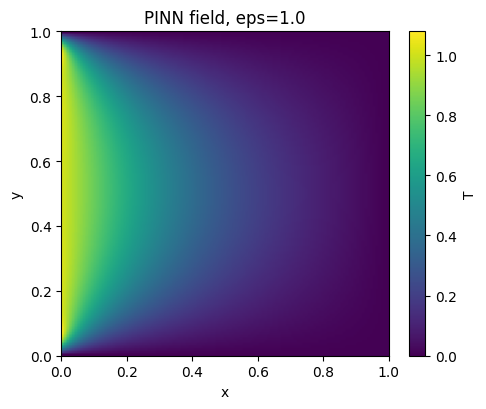

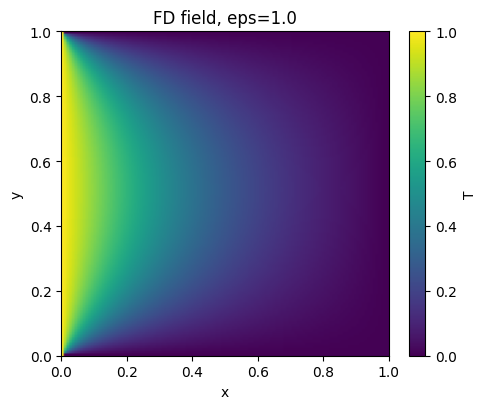

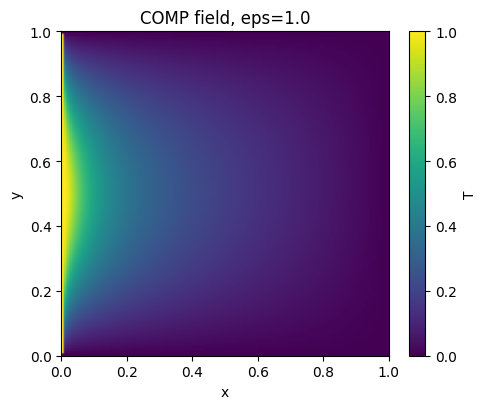

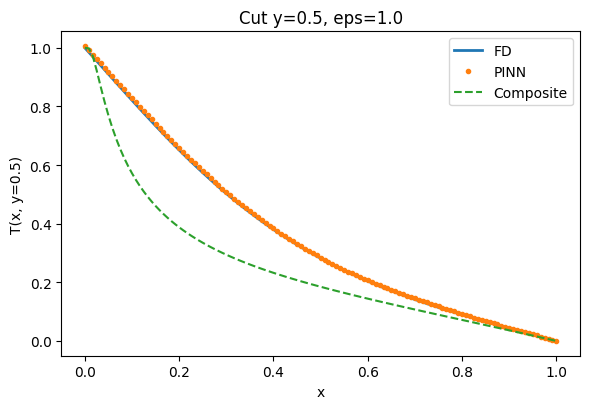

[eps=0.1|warm=True] Ep   25 | PDE 1.349e-01 | inlet*w 1.887e-01 | prior 2.798e-02 | Total 3.516e-01
[eps=0.1|warm=True] Ep   50 | PDE 6.713e-02 | inlet*w 1.182e-01 | prior 2.499e-02 | Total 2.103e-01
[eps=0.1|warm=True] Ep   75 | PDE 4.465e-02 | inlet*w 1.627e-01 | prior 2.263e-02 | Total 2.300e-01
[eps=0.1|warm=True] Ep  100 | PDE 3.616e-02 | inlet*w 1.306e-01 | prior 1.982e-02 | Total 1.866e-01
[eps=0.1|warm=True] Ep  125 | PDE 3.128e-02 | inlet*w 1.421e-01 | prior 1.673e-02 | Total 1.901e-01
[eps=0.1|warm=True] Ep  150 | PDE 2.489e-02 | inlet*w 1.247e-01 | prior 1.353e-02 | Total 1.632e-01
[eps=0.1|warm=True] Ep  175 | PDE 2.336e-02 | inlet*w 1.408e-01 | prior 1.043e-02 | Total 1.746e-01
[eps=0.1|warm=True] Ep  200 | PDE 2.361e-02 | inlet*w 1.483e-01 | prior 7.598e-03 | Total 1.795e-01
[eps=0.1|warm=True] Ep  300 | PDE 4.847e-02 | inlet*w 1.509e-01 | prior 1.971e-03 | Total 2.014e-01
[eps=0.1|warm=False] Ep   25 | PDE 1.239e-01 | inlet*w 3.820e-01 | prior 2.358e-02 | Total 5.294e-01

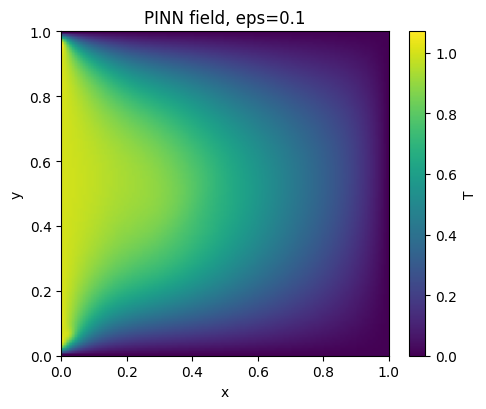

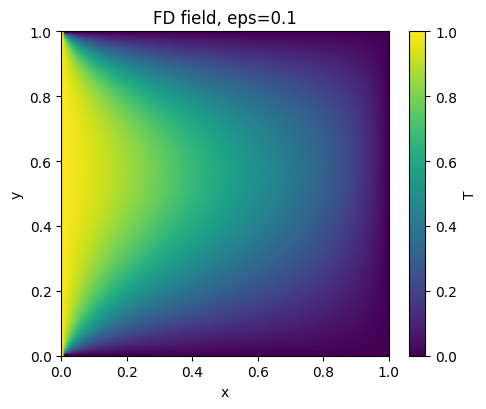

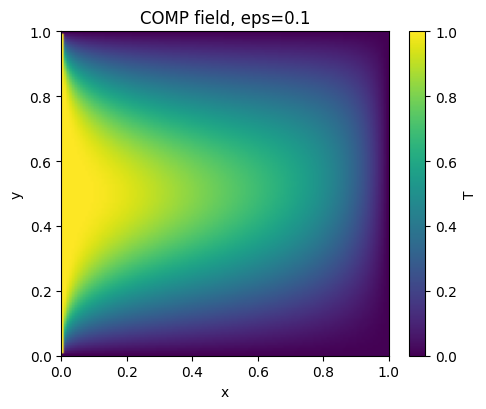

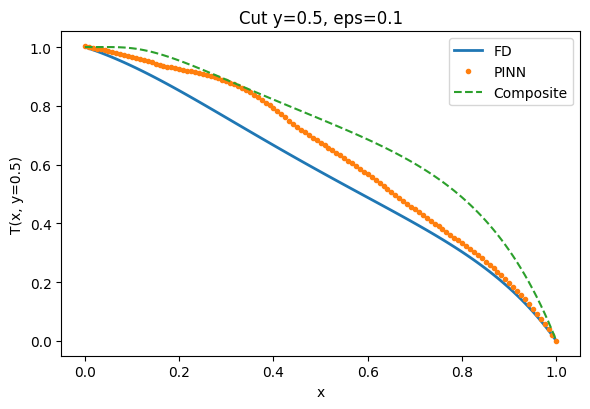

[eps=0.06|warm=True] Ep   25 | PDE 1.223e+00 | inlet*w 8.502e-01 | prior 2.599e-02 | Total 2.099e+00
[eps=0.06|warm=True] Ep   50 | PDE 3.734e-01 | inlet*w 3.399e-01 | prior 2.188e-02 | Total 7.352e-01
[eps=0.06|warm=True] Ep   75 | PDE 1.599e-01 | inlet*w 2.000e-01 | prior 1.883e-02 | Total 3.787e-01
[eps=0.06|warm=True] Ep  100 | PDE 7.998e-02 | inlet*w 1.335e-01 | prior 1.657e-02 | Total 2.301e-01
[eps=0.06|warm=True] Ep  125 | PDE 4.900e-02 | inlet*w 1.241e-01 | prior 1.411e-02 | Total 1.872e-01
[eps=0.06|warm=True] Ep  150 | PDE 3.859e-02 | inlet*w 8.464e-02 | prior 1.150e-02 | Total 1.347e-01
[eps=0.06|warm=True] Ep  175 | PDE 3.407e-02 | inlet*w 8.173e-02 | prior 8.894e-03 | Total 1.247e-01
[eps=0.06|warm=True] Ep  200 | PDE 2.958e-02 | inlet*w 7.177e-02 | prior 6.524e-03 | Total 1.079e-01
[eps=0.06|warm=True] Ep  300 | PDE 2.191e-02 | inlet*w 6.119e-02 | prior 1.733e-03 | Total 8.483e-02
[eps=0.06|warm=False] Ep   25 | PDE 1.258e-01 | inlet*w 2.140e-01 | prior 1.862e-02 | Total

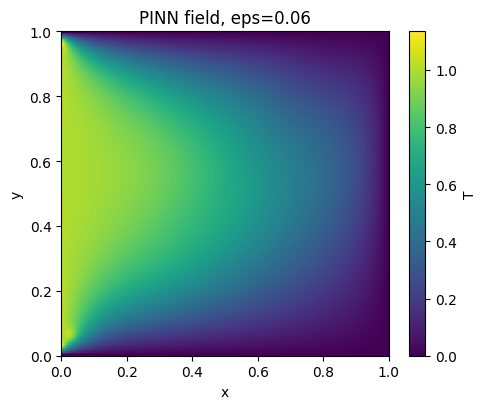

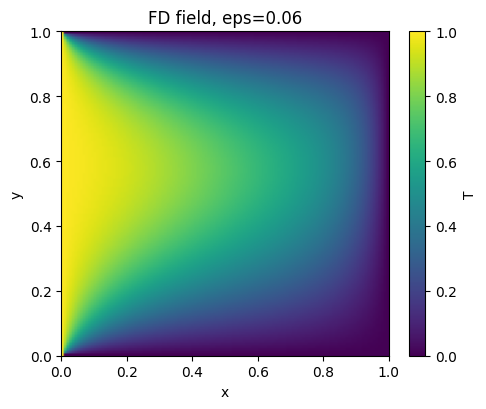

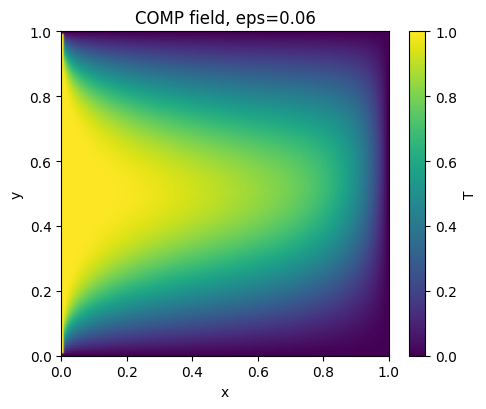

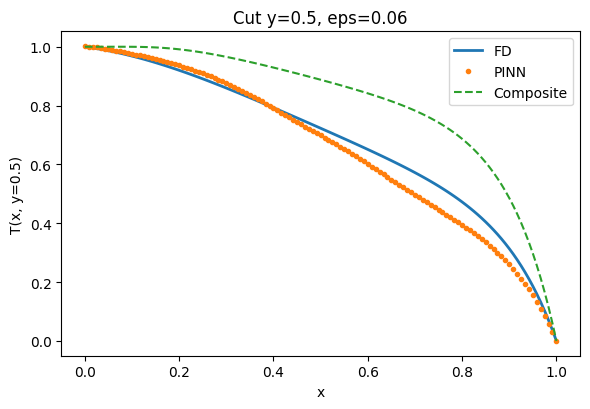

[eps=0.04|warm=True] Ep   25 | PDE 2.391e+00 | inlet*w 2.896e-01 | prior 6.253e-02 | Total 2.743e+00
[eps=0.04|warm=True] Ep   50 | PDE 7.663e-01 | inlet*w 2.322e-01 | prior 4.985e-02 | Total 1.048e+00
[eps=0.04|warm=True] Ep   75 | PDE 5.430e-01 | inlet*w 2.671e-01 | prior 4.334e-02 | Total 8.534e-01
[eps=0.04|warm=True] Ep  100 | PDE 4.184e-01 | inlet*w 3.749e-01 | prior 3.594e-02 | Total 8.293e-01
[eps=0.04|warm=True] Ep  125 | PDE 3.386e-01 | inlet*w 1.898e-01 | prior 2.932e-02 | Total 5.578e-01
[eps=0.04|warm=True] Ep  150 | PDE 2.697e-01 | inlet*w 1.980e-01 | prior 2.322e-02 | Total 4.909e-01
[eps=0.04|warm=True] Ep  175 | PDE 2.239e-01 | inlet*w 1.516e-01 | prior 1.767e-02 | Total 3.933e-01
[eps=0.04|warm=True] Ep  200 | PDE 1.821e-01 | inlet*w 1.500e-01 | prior 1.285e-02 | Total 3.449e-01
[eps=0.04|warm=True] Ep  300 | PDE 9.044e-02 | inlet*w 1.238e-01 | prior 3.237e-03 | Total 2.175e-01
[eps=0.04|warm=False] Ep   25 | PDE 2.521e-01 | inlet*w 3.802e-01 | prior 3.562e-02 | Total

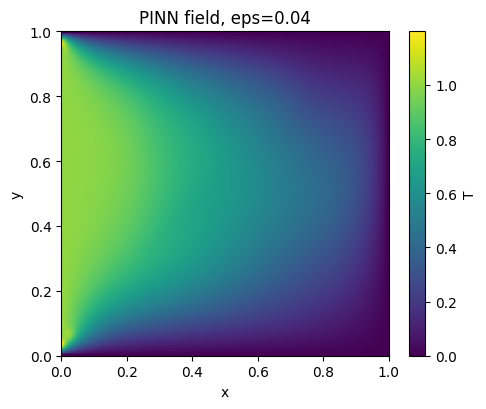

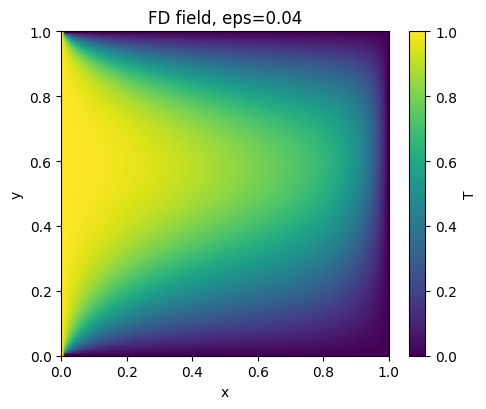

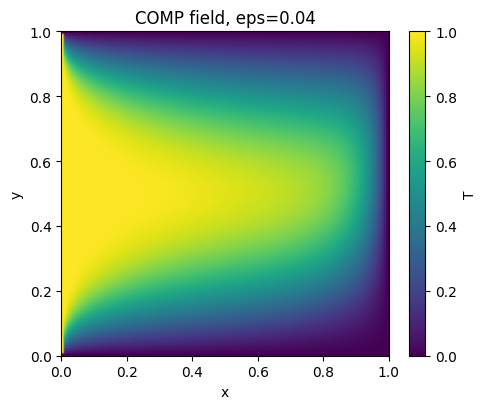

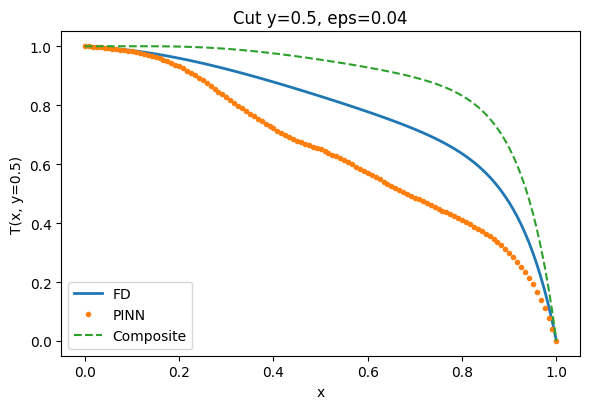


Tabla LaTeX (errores vs FD; global, núcleo y p99):
\begin{table}[H]
\centering
\caption{Errors of PINN and Composite against FD on a $121\times121$ grid. Core excludes one-cell boundary.}
\begin{tabular}{lcccccc}
\toprule
$\varepsilon$ & $L^2$ & $L^\infty$ & MAE & $L^2_{\text{core}}$ & $L^\infty_{\text{core}}$ & P99 \\
\midrule
\multicolumn{7}{l}{\textbf{PINN vs FD} ($\varepsilon=1$)} \\
 & 2.032e-02 & 1.000e+00 & 4.161e-03 & 1.047e-02 & 3.530e-01 & 1.986e-02 \\
\multicolumn{7}{l}{\textbf{Composite vs FD} ($\varepsilon=1$)} \\
 & 1.586e-01 & 1.000e+00 & 1.025e-01 & 1.608e-01 & 7.171e-01 & 4.919e-01 \\
\multicolumn{7}{l}{\textbf{PINN vs FD} ($\varepsilon=0.1$)} \\
 & 6.716e-02 & 1.000e+00 & 4.785e-02 & 6.655e-02 & 2.485e-01 & 1.633e-01 \\
\multicolumn{7}{l}{\textbf{Composite vs FD} ($\varepsilon=0.1$)} \\
 & 1.078e-01 & 1.000e+00 & 8.042e-02 & 1.090e-01 & 6.147e-01 & 3.042e-01 \\
\multicolumn{7}{l}{\textbf{PINN vs FD} ($\varepsilon=0.06$)} \\
 & 4.921e-02 & 1.000e+00 & 3.436e-02 & 4.78

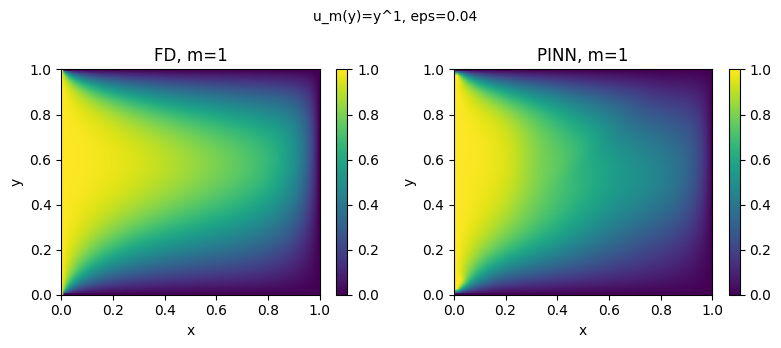

[shear m=2, eps=0.04] Ep   25 | PDE 5.638e-01 | inlet*w 7.546e-01 | Total 1.318e+00
[shear m=2, eps=0.04] Ep   50 | PDE 4.186e-01 | inlet*w 3.014e-01 | Total 7.200e-01
[shear m=2, eps=0.04] Ep   75 | PDE 3.449e-01 | inlet*w 2.439e-01 | Total 5.888e-01
[shear m=2, eps=0.04] Ep  100 | PDE 2.704e-01 | inlet*w 2.127e-01 | Total 4.831e-01
[shear m=2, eps=0.04] Ep  125 | PDE 2.124e-01 | inlet*w 1.494e-01 | Total 3.618e-01
[shear m=2, eps=0.04] Ep  150 | PDE 1.691e-01 | inlet*w 1.600e-01 | Total 3.292e-01
[shear m=2, eps=0.04] Ep  175 | PDE 1.367e-01 | inlet*w 1.619e-01 | Total 2.986e-01
[shear m=2, eps=0.04] Ep  200 | PDE 1.108e-01 | inlet*w 1.814e-01 | Total 2.922e-01
[shear m=2, eps=0.04] Ep  300 | PDE 5.891e-02 | inlet*w 1.305e-01 | Total 1.894e-01
[shear m=2, eps=0.04] Ep   25 | PDE 6.363e-02 | inlet*w 2.006e-01 | Total 2.643e-01
[shear m=2, eps=0.04] Ep   50 | PDE 3.501e-02 | inlet*w 8.433e-02 | Total 1.193e-01
[shear m=2, eps=0.04] Ep   75 | PDE 2.945e-02 | inlet*w 7.513e-02 | Total 1.

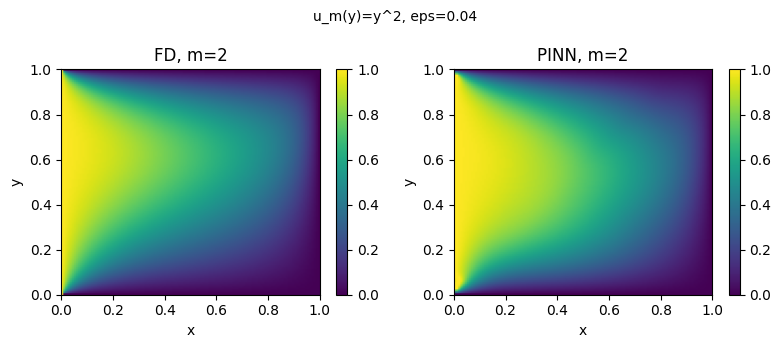

[shear m=3, eps=0.04] Ep   25 | PDE 6.124e-01 | inlet*w 7.878e-01 | Total 1.400e+00
[shear m=3, eps=0.04] Ep   50 | PDE 4.121e-01 | inlet*w 3.493e-01 | Total 7.614e-01
[shear m=3, eps=0.04] Ep   75 | PDE 3.631e-01 | inlet*w 2.546e-01 | Total 6.177e-01
[shear m=3, eps=0.04] Ep  100 | PDE 3.015e-01 | inlet*w 2.113e-01 | Total 5.127e-01
[shear m=3, eps=0.04] Ep  125 | PDE 2.414e-01 | inlet*w 1.512e-01 | Total 3.926e-01
[shear m=3, eps=0.04] Ep  150 | PDE 1.997e-01 | inlet*w 1.617e-01 | Total 3.614e-01
[shear m=3, eps=0.04] Ep  175 | PDE 1.691e-01 | inlet*w 1.638e-01 | Total 3.329e-01
[shear m=3, eps=0.04] Ep  200 | PDE 1.428e-01 | inlet*w 1.841e-01 | Total 3.269e-01
[shear m=3, eps=0.04] Ep  300 | PDE 7.556e-02 | inlet*w 1.399e-01 | Total 2.155e-01
[shear m=3, eps=0.04] Ep   25 | PDE 4.974e-02 | inlet*w 1.662e-01 | Total 2.159e-01
[shear m=3, eps=0.04] Ep   50 | PDE 3.798e-02 | inlet*w 8.454e-02 | Total 1.225e-01
[shear m=3, eps=0.04] Ep   75 | PDE 3.276e-02 | inlet*w 7.304e-02 | Total 1.

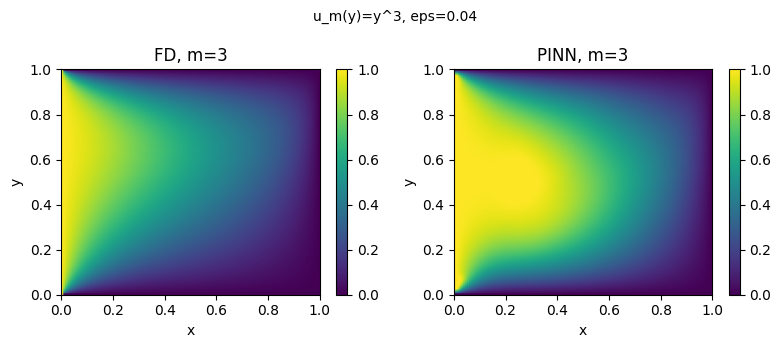


Tabla LaTeX: errores PINN vs FD para u_m(y)=y^m (núcleo y P99):
\begin{table}[H]
\centering
\caption{PINN errors against FD for generalized shear profiles $u_m(y)=y^m$ at fixed $\varepsilon$.}
\label{tab:errors-general-shear}
\begin{tabular}{llccc}
\toprule
$m$ & $\varepsilon$ & $L^2_{\text{core}}$ & $L^\infty_{\text{core}}$ & P99 \\
\midrule
1 & 0.04 & 1.155e-01 & 2.801e-01 & 2.595e-01 \\
2 & 0.04 & 7.172e-02 & 3.181e-01 & 1.775e-01 \\
3 & 0.04 & 1.647e-01 & 4.036e-01 & 3.910e-01 \\
\bottomrule
\end{tabular}
\end{table}


In [ ]:
# %% PINN Couette FULL + Curriculum + Outlet-focus + RAR + Prior asintótico (híbrido)
import os, random
import numpy as np
import pandas as pd
import torch, torch.nn as nn, torch.optim as optim
import matplotlib.pyplot as plt
from scipy.sparse import lil_matrix, csc_matrix
from scipy.sparse.linalg import spsolve
from scipy.special import gammaincc

# ---------------- Configuración ----------------
CURRICULUM_EPS = [1.0, 0.1, 0.06, 0.04]   # warm-start
GRID_N   = 121
T0, Tw   = 1.0, 0.0
SEED     = 1234
SAVE_DIR = "/content/outputs"
os.makedirs(SAVE_DIR, exist_ok=True)

# Entrenamiento (OOM-safe)
NR_WARMUP, NB_WARMUP = 2000, 600
NR_MAIN,   NB_MAIN   = 7000, 1000
MICRO_WARMUP = 800
MICRO_MAIN   = 2000
EPOCHS_WARMUP = 300
EPOCHS_MAIN   = 5000
LBFGS_IT      = 600

# Red
WIDTH, DEPTH = 48, 4
MODEL_NAME   = "couette_full_curr"

# ===== Muestreo y pesos (más capa de salida) =====
INLET_MARGIN  = 0.05
STRIP_X0      = 0.02
BIAS_POW      = 10.0          # más sesgo a x→1
OUTLET_STRIPE = (0.90, 1.0)   # franja pegada a salida
FRAC_OUTLET   = 0.50          # 50% de puntos en la franja de salida
W_REGION      = 10.0          # peso PDE adicional en x>0.90

# RAR
RAR_ROUNDS = 2
RAR_POOL   = 20000
RAR_ADD    = 3000

# ===== Regularización suave hacia la compuesta (prior) =====
PRIOR_LAMBDA_MAX = 0.6    # peso inicial del prior
PRIOR_LAMBDA_MIN = 0.05   # peso final (casi apagado)
CORE_MARGIN_Y    = 0.10   # núcleo: y∈[0.10, 0.90]
CORE_MARGIN_XL   = 0.08   # evita inlet inmediato
CORE_MARGIN_XR   = 0.08   # evita outlet inmediato

# ---------------- Utilidades ----------------
def set_seed(s=SEED):
    random.seed(s)
    np.random.seed(s)
    torch.manual_seed(s)

set_seed()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

# Red + transform
class MLP(nn.Module):
    def __init__(self, in_dim=2, out_dim=1, width=WIDTH, depth=DEPTH):
        super().__init__()
        layers = [nn.Linear(in_dim, width), nn.Tanh()]
        for _ in range(depth-1):
            layers += [nn.Linear(width, width), nn.Tanh()]
        layers += [nn.Linear(width, out_dim)]
        self.net = nn.Sequential(*layers)
        for m in self.net:
            if isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight)
                nn.init.zeros_(m.bias)

    def forward(self, z):  # z en [-1,1]^2
        return self.net(z)

def output_transform(xy, raw):
    x = xy[:,0:1]; y = xy[:,1:2]
    g = (1.0 - x) * y * (1.0 - y)
    return Tw + g * raw

def to_net_coords(xy):
    return 2.0*xy - 1.0

def T_model(net, xy):
    z = to_net_coords(xy)
    return output_transform(xy, net(z))

# PDE residual y pérdida (Couette u(y)=y)
def pde_residual(net, xy, eps):
    xy = xy.clone().detach().requires_grad_(True)
    T  = T_model(net, xy)
    grads = torch.autograd.grad(
        T, xy, torch.ones_like(T),
        retain_graph=True, create_graph=True
    )[0]
    Tx, Ty = grads[:,0:1], grads[:,1:2]
    g2x = torch.autograd.grad(
        Tx, xy, torch.ones_like(Tx),
        retain_graph=True, create_graph=True
    )[0]
    g2y = torch.autograd.grad(
        Ty, xy, torch.ones_like(Ty),
        retain_graph=True, create_graph=True
    )[0]
    Txx, Tyy = g2x[:,0:1], g2y[:,1:2]
    eps_t = torch.as_tensor(eps, dtype=T.dtype, device=T.device)
    y   = xy[:,1:2]
    return y*Tx - eps_t*(Txx + Tyy)

def region_weight(xy):
    x = xy[:,0:1]
    w = torch.ones_like(x)
    w = w + (W_REGION-1.0)*(x > OUTLET_STRIPE[0]).float()
    return w

def pde_loss_micro(net, XY, eps, micro):
    n = XY.shape[0]
    total = XY.new_tensor(0.0)
    k = 0
    for i in range(0, n, micro):
        X = XY[i:i+micro]
        R = pde_residual(net, X, eps)
        w = region_weight(X)
        total = total + torch.mean((w*R)**2)
        k += 1
    return total/max(k,1)

mse = lambda a: torch.mean(a**2)

# Muestreo (con franja de salida)
def sample_interior(N, device):
    N_out = int(N*FRAC_OUTLET)
    N_rest= N - N_out
    # frente
    N_front = N_rest//2
    x1 = torch.rand(N_front,1,device=device)*0.2
    y1 = torch.rand(N_front,1,device=device)
    # sesgo a x→1
    N_bias = N_rest - N_front
    u = torch.rand(N_bias,1,device=device)
    x2 = 1 - (1-u)**BIAS_POW
    y2 = torch.rand(N_bias,1,device=device)
    # franja salida
    xl, xr = OUTLET_STRIPE
    x3 = torch.rand(N_out,1,device=device)*(xr-xl)+xl
    y3 = torch.rand(N_out,1,device=device)
    X = torch.cat([x1,x2,x3], dim=0)
    Y = torch.cat([y1,y2,y3], dim=0)
    return torch.cat([X,Y], dim=1)

def bd_x0(N, device):
    x = torch.zeros(N,1,device=device)
    y = torch.rand(N,1,device=device)*(1-2*INLET_MARGIN)+INLET_MARGIN
    return torch.cat([x,y], dim=1)

def bd_strip_x0(N, device, x_max=STRIP_X0):
    x = torch.rand(N,1,device=device)*x_max
    y = torch.rand(N,1,device=device)*(1-2*INLET_MARGIN)+INLET_MARGIN
    return torch.cat([x,y], dim=1)

# RAR: Couette
def rar_augment(net, eps, base_XY, add=RAR_ADD, pool=RAR_POOL):
    with torch.no_grad():
        XYpool = torch.rand(pool,2,device=device)  # uniforme
    R = pde_residual(net, XYpool, eps).detach().abs().view(-1)
    idx = torch.topk(R, k=min(add, R.numel())).indices
    return torch.cat([base_XY, XYpool[idx]], dim=0)

# Composite (diagnóstico opcional)
def composite_couette(x_grid, y_grid, eps, h=1.0, T0=1.0, Tw=0.0, p=2):
    """
    Composite para y*T_x = eps*(T_xx + T_yy) con:
      x=0: T=T0, y=0,h: T=Tw, x=1: T=Tw.
    Usa Q(s,z)=gammaincc(s,z), unión de capas por inclusión–exclusión
    y ventana w(x)=x**p para la capa de salida. Devuelve [Nx,Ny] (ij).
    """
    X, Y = np.meshgrid(x_grid, y_grid, indexing='ij')
    s     = 1.0/3.0
    delta = 1e-12

    z1 = (Y**3)       / (3.0*eps*np.maximum(X, delta))  # pared inferior
    z2 = ((h - Y)**3) / (3.0*eps*np.maximum(X, delta))  # pared superior
    Qb = gammaincc(s, z1)
    Qt = gammaincc(s, z2)

    S = Qb + Qt - Qb*Qt
    core = 1.0 - S

    w = X**p
    outlet = np.exp(-(1.0 - X)*Y/eps)

    Tcomp = T0 + (Tw - T0) * ( S + w*outlet*core )
    return Tcomp

# ====== Prior suave hacia la compuesta (sólo en núcleo) ======
def core_window(xy):
    x = xy[:,0:1]; y = xy[:,1:2]
    m_y = (y > CORE_MARGIN_Y) & (y < 1.0-CORE_MARGIN_Y)
    m_x = (x > CORE_MARGIN_XL) & (x < 1.0-CORE_MARGIN_XR)
    return (m_x & m_y).float()

def prior_loss_to_composite(net, xy, eps, xs_np, ys_np, Tcomp_np):
    """
    Interpola T_comp en (xy) y penaliza sólo en el núcleo (ventana).
    """
    with torch.no_grad():
        xs = torch.tensor(xs_np, dtype=torch.float32, device=xy.device)
        ys = torch.tensor(ys_np, dtype=torch.float32, device=xy.device)
        Tcomp = torch.tensor(Tcomp_np, dtype=torch.float32, device=xy.device)  # [Nx,Ny]

    x = xy[:,0]; y = xy[:,1]
    Nx, Ny = xs.numel(), ys.numel()
    hx = xs[1]-xs[0]; hy = ys[1]-ys[0]

    ix = torch.clamp(((x/xs[-1])*(Nx-1)).floor().long(), 0, Nx-2)
    iy = torch.clamp(((y/ys[-1])*(Ny-1)).floor().long(), 0, Ny-2)
    tx = (x - xs[ix])/(hx+1e-12); ty = (y - ys[iy])/(hy+1e-12)

    def G(i,j): return Tcomp[i, j]
    Tc = ( (1-tx)*(1-ty)*G(ix,   iy)   + tx*(1-ty)*G(ix+1, iy)
         + (1-tx)*ty*G(ix,   iy+1)     + tx*ty*G(ix+1, iy+1) ).unsqueeze(1)

    Tpred = T_model(net, xy)
    wcore = core_window(xy)
    return torch.sum(wcore * (Tpred - Tc)**2) / (torch.sum(wcore)+1e-12)

# FD de referencia (Couette: u(y)=y)
def solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N):
    xs = np.linspace(0,1,Nx); ys = np.linspace(0,1,Ny)
    hx = xs[1]-xs[0]; hy = ys[1]-ys[0]
    def idx(i,j): return j*Nx + i
    N = Nx*Ny
    A = lil_matrix((N,N), dtype=float)
    b = np.zeros(N, dtype=float)
    for j in range(Ny):
        y = ys[j]
        for i in range(Nx):
            k = idx(i,j)
            if i==0:
                A[k,k]=1; b[k]=1;  continue   # inlet
            if i==Nx-1:
                A[k,k]=1; b[k]=0;  continue   # outlet
            if j==0 or j==Ny-1:
                A[k,k]=1; b[k]=0;  continue   # paredes
            cx = eps/(hx*hx)
            cy = eps/(hy*hy)
            conv = y/hx
            A[k, idx(i-1,j)] += ( cx + conv)   # upwind
            A[k, idx(i+1,j)] += ( cx)
            A[k, idx(i,  j-1)] += ( cy)
            A[k, idx(i,  j+1)] += ( cy)
            A[k, k]           += (-2*cx - 2*cy - conv)
    T = spsolve(csc_matrix(A), b).reshape(Ny, Nx)
    return np.array(T.T, dtype=np.float64)

# Métricas robustas
def metrics_all(Tp, Tr):
    E = Tp - Tr
    L2   = float(np.sqrt(np.mean(E**2)))
    Linf = float(np.max(np.abs(E)))
    MAE  = float(np.mean(np.abs(E)))
    core = (slice(1,-1), slice(1,-1))
    Ec   = E[core]
    L2c   = float(np.sqrt(np.mean(Ec**2)))
    Linfc = float(np.max(np.abs(Ec)))
    MAEc  = float(np.mean(np.abs(Ec)))
    p99   = float(np.percentile(np.abs(E).ravel(), 99))
    return dict(L2=L2, Linf=Linf, MAE=MAE,
                L2_core=L2c, Linf_core=Linfc, MAE_core=MAEc, P99=p99)

def should_log(ep, total):
    if ep<=200: return ep%25==0
    if ep<=1000:return ep%100==0
    return ep%max(total//12,500)==0

# Entrena una fase (Couette) con RAR y prior
def train_phase(net, eps, NR, NB, MICRO, EPOCHS, W_INLET, do_rar=False):
    opt = optim.Adam(net.parameters(), lr=1e-3)
    XYr = sample_interior(NR, device)

    # precomputo del campo compuesto para el prior
    xs_np = np.linspace(0,1,GRID_N); ys_np = np.linspace(0,1,GRID_N)
    Tcomp_np = composite_couette(xs_np, ys_np, eps)

    for ep in range(1, EPOCHS+1):
        if do_rar and ep in [int(EPOCHS*0.4), int(EPOCHS*0.75)]:
            XYr = rar_augment(net, eps, XYr, add=RAR_ADD, pool=RAR_POOL)

        X0  = bd_x0(NB, device)
        X0s = bd_strip_x0(NB, device, x_max=STRIP_X0)

        # --- grafos independientes para cada término ---
        loss_pde = pde_loss_micro(net, XYr, eps, micro=MICRO)
        loss_bc  = mse(T_model(net, X0)-T0) + mse(T_model(net, X0s)-T0)

        XY_prior   = XYr.detach()
        loss_prior = prior_loss_to_composite(net, XY_prior, eps, xs_np, ys_np, Tcomp_np)

        # annealing del prior
        alpha = 0.5*(1 + np.cos(np.pi*min(ep/EPOCHS,1.0)))
        lam_prior = PRIOR_LAMBDA_MIN + (PRIOR_LAMBDA_MAX - PRIOR_LAMBDA_MIN)*alpha

        loss = loss_pde + W_INLET*loss_bc + lam_prior*loss_prior

        opt.zero_grad()
        loss.backward()
        opt.step()

        if should_log(ep, EPOCHS):
            print(f"[eps={eps:.3g}|warm={NR==NR_WARMUP}] Ep {ep:4d} | PDE {loss_pde.item():.3e} "
                  f"| inlet*w {W_INLET*loss_bc.item():.3e} | prior {lam_prior*loss_prior.item():.3e} "
                  f"| Total {loss.item():.3e}")

# Ejecuta un caso Couette con warm-up → main → L-BFGS
def run_case(eps, init_state_dict=None):
    set_seed()
    net = MLP().to(device)
    if init_state_dict is not None:
        net.load_state_dict(init_state_dict)

    W_INLET = 50.0 if eps>=0.5 else 100.0

    # warm-up (sin RAR)
    train_phase(net, eps, NR_WARMUP, NB_WARMUP, MICRO_WARMUP,
                EPOCHS_WARMUP, W_INLET, do_rar=False)
    # fase principal (con RAR)
    train_phase(net, eps, NR_MAIN, NB_MAIN, MICRO_MAIN,
                EPOCHS_MAIN, W_INLET, do_rar=True)

    # L-BFGS: recompone grafo en cada closure + prior pequeño
    XYc  = sample_interior(4000, device).detach()
    X0c  = bd_x0(NB_MAIN, device).detach()
    X0sc = bd_strip_x0(NB_MAIN, device, x_max=STRIP_X0).detach()

    xs_np = np.linspace(0,1,GRID_N); ys_np = np.linspace(0,1,GRID_N)
    Tcomp_np = composite_couette(xs_np, ys_np, eps)
    LBF_PRIOR = 0.05

    opt2 = optim.LBFGS(net.parameters(), lr=1.0,
                       max_iter=LBFGS_IT, history_size=50,
                       line_search_fn="strong_wolfe")

    def closure():
        opt2.zero_grad()
        loss = pde_loss_micro(net, XYc, eps, micro=MICRO_MAIN) \
             + W_INLET*mse(T_model(net, X0c)-T0) \
             + W_INLET*mse(T_model(net, X0sc)-T0) \
             + LBF_PRIOR*prior_loss_to_composite(net, XYc, eps, xs_np, ys_np, Tcomp_np)
        loss.backward()
        return loss

    print(f"[eps={eps:.3g}] L-BFGS x{LBFGS_IT}...")
    opt2.step(closure)

    # Evaluación vs FD + figuras
    xs = np.linspace(0,1,GRID_N); ys = np.linspace(0,1,GRID_N)
    xs_t = torch.tensor(xs, dtype=torch.float32, device=device)
    ys_t = torch.tensor(ys, dtype=torch.float32, device=device)
    Xg, Yg = torch.meshgrid(xs_t, ys_t, indexing='ij')
    XY = torch.stack([Xg.reshape(-1), Yg.reshape(-1)], dim=1)
    with torch.no_grad():
        Tpred = T_model(net, XY).reshape(GRID_N, GRID_N).cpu().numpy()
    Tfd = solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N)
    Tcomp = composite_couette(xs, ys, eps)

    m_pinn = metrics_all(Tpred, Tfd)
    m_comp = metrics_all(Tcomp, Tfd)
    print(f"[eps={eps:.3g}] PINN vs FD -> {m_pinn}")
    print(f"[eps={eps:.3g}] COMP vs FD -> {m_comp}")

    # Guardar CSV + mapas + corte
    pd.DataFrame(Tpred, index=xs, columns=ys).to_csv(
        f"{SAVE_DIR}/T_PINN_eps_{eps:.3g}_{MODEL_NAME}.csv", float_format="%.6f")
    pd.DataFrame(Tfd,   index=xs, columns=ys).to_csv(
        f"{SAVE_DIR}/T_FD_eps_{eps:.3g}.csv", float_format="%.6f")
    pd.DataFrame(Tcomp, index=xs, columns=ys).to_csv(
        f"{SAVE_DIR}/T_Composite_eps_{eps:.3g}.csv", float_format="%.6f")

    for tag, Tmat in [("PINN",Tpred), ("FD",Tfd), ("COMP",Tcomp)]:
        plt.figure(figsize=(5.0,4.2))
        im=plt.imshow(Tmat.T, origin='lower', extent=[0,1,0,1], aspect='auto')
        plt.colorbar(im,label='T')
        plt.xlabel('x'); plt.ylabel('y')
        plt.title(f'{tag} field, eps={eps}')
        plt.tight_layout()
        plt.savefig(f"{SAVE_DIR}/{tag}_field_eps_{eps:.3g}.png", dpi=140)
        plt.show()

    jmid = GRID_N//2
    plt.figure(figsize=(6.0,4.2))
    plt.plot(xs, Tfd[:,jmid], '-',  lw=2, label='FD')
    plt.plot(xs, Tpred[:,jmid], 'o', ms=3, label='PINN')
    plt.plot(xs, Tcomp[:,jmid], '--', lw=1.5, label='Composite')
    plt.xlabel('x'); plt.ylabel('T(x, y=0.5)')
    plt.title(f'Cut y=0.5, eps={eps}')
    plt.legend()
    plt.tight_layout()
    plt.savefig(f"{SAVE_DIR}/cut_y05_eps_{eps:.3g}.png", dpi=150)
    plt.show()

    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    return net.state_dict(), m_pinn, m_comp

# ---------------- Loop curriculum (warm-start) + tabla Couette ----------------
results = []
state = None
for eps in CURRICULUM_EPS:
    print("="*72)
    state, m_pinn, m_comp = run_case(eps, init_state_dict=state)
    results.append((eps, m_pinn, m_comp))

print("\nTabla LaTeX (errores vs FD; global, núcleo y p99):")
print(r"\begin{table}[H]")
print(r"\centering")
print(r"\caption{Errors of PINN and Composite against FD on a $121\times121$ grid. Core excludes one-cell boundary.}")
print(r"\begin{tabular}{lcccccc}")
print(r"\toprule")
print(r"$\varepsilon$ & $L^2$ & $L^\infty$ & MAE & $L^2_{\text{core}}$ & $L^\infty_{\text{core}}$ & P99 \\")
print(r"\midrule")
for eps, m_pinn, m_comp in results:
    print(rf"\multicolumn{{7}}{{l}}{{\textbf{{PINN vs FD}} ($\varepsilon={eps:g}$)}} \\")
    print(rf" & {m_pinn['L2']:.3e} & {m_pinn['Linf']:.3e} & {m_pinn['MAE']:.3e} & "
          rf"{m_pinn['L2_core']:.3e} & {m_pinn['Linf_core']:.3e} & {m_pinn['P99']:.3e} \\")
    print(rf"\multicolumn{{7}}{{l}}{{\textbf{{Composite vs FD}} ($\varepsilon={eps:g}$)}} \\")
    print(rf" & {m_comp['L2']:.3e} & {m_comp['Linf']:.3e} & {m_comp['MAE']:.3e} & "
          rf"{m_comp['L2_core']:.3e} & {m_comp['Linf_core']:.3e} & {m_comp['P99']:.3e} \\")
print(r"\bottomrule")
print(r"\end{tabular}")
print(r"\end{table}")

# ============================================================
# NUEVO: perfiles de corte generalizados u_m(y)=y^m
# ============================================================

def pde_residual_shear(net, xy, eps, m):
    """
    Residual para u_m(y) T_x = eps (T_xx + T_yy), con u_m(y) = y^m.
    """
    xy = xy.clone().detach().requires_grad_(True)
    T  = T_model(net, xy)

    grads = torch.autograd.grad(
        T, xy, torch.ones_like(T),
        retain_graph=True, create_graph=True
    )[0]
    Tx, Ty = grads[:,0:1], grads[:,1:2]

    g2x = torch.autograd.grad(
        Tx, xy, torch.ones_like(Tx),
        retain_graph=True, create_graph=True
    )[0]
    g2y = torch.autograd.grad(
        Ty, xy, torch.ones_like(Ty),
        retain_graph=True, create_graph=True
    )[0]
    Txx, Tyy = g2x[:,0:1], g2y[:,1:2]

    eps_t = torch.as_tensor(eps, dtype=T.dtype, device=T.device)
    y     = xy[:,1:2]
    u     = y**m

    return u*Tx - eps_t*(Txx + Tyy)

def pde_loss_micro_shear(net, XY, eps, micro, m):
    """
    Versión micro-batch del loss PDE, usando el residual con y^m.
    """
    n = XY.shape[0]
    total = XY.new_tensor(0.0)
    k = 0
    for i in range(0, n, micro):
        X = XY[i:i+micro]
        R = pde_residual_shear(net, X, eps, m)
        w = region_weight(X)
        total = total + torch.mean((w*R)**2)
        k += 1
    return total/max(k,1)

def rar_augment_shear(net, eps, m, base_XY, add=RAR_ADD, pool=RAR_POOL):
    """
    Igual que rar_augment, pero usando el residual con y^m.
    """
    with torch.no_grad():
        XYpool = torch.rand(pool, 2, device=device)  # uniforme

    R = pde_residual_shear(net, XYpool, eps, m).detach().abs().view(-1)
    idx = torch.topk(R, k=min(add, R.numel())).indices
    return torch.cat([base_XY, XYpool[idx]], dim=0)

def solve_fd_shear(eps, m, Nx=GRID_N, Ny=GRID_N):
    """
    FD de referencia para u_m(y) T_x = eps (T_xx + T_yy),
    con u_m(y) = y^m, mismo esquema upwind que solve_fd_reference.
    """
    xs = np.linspace(0,1,Nx)
    ys = np.linspace(0,1,Ny)
    hx = xs[1] - xs[0]
    hy = ys[1] - ys[0]

    def idx(i,j): return j*Nx + i

    N = Nx*Ny
    A = lil_matrix((N,N), dtype=float)
    b = np.zeros(N, dtype=float)

    for j in range(Ny):
        y = ys[j]
        for i in range(Nx):
            k = idx(i,j)

            # fronteras: mismas condiciones Dirichlet
            if i == 0:         # inlet x=0: T=1
                A[k,k] = 1.0; b[k] = 1.0
                continue
            if i == Nx-1:      # outlet x=1: T=0
                A[k,k] = 1.0; b[k] = 0.0
                continue
            if j == 0 or j == Ny-1:   # paredes y=0,1: T=0
                A[k,k] = 1.0; b[k] = 0.0
                continue

            cx = eps/(hx*hx)
            cy = eps/(hy*hy)
            u  = y**m
            conv = u/hx    # término convectivo upwind (u>0)

            # Difusión + convección en x
            A[k, idx(i-1,j)] += (cx + conv)
            A[k, idx(i+1,j)] += (cx)
            # Difusión en y (central)
            A[k, idx(i,  j-1)] += (cy)
            A[k, idx(i,  j+1)] += (cy)
            # Diagonal
            A[k, k] += (-2*cx - 2*cy - conv)

    T = spsolve(csc_matrix(A), b).reshape(Ny, Nx)
    # Devolvemos [Nx,Ny] en coherencia con solve_fd_reference
    return np.array(T.T, dtype=np.float64)

def train_phase(net, eps, NR, NB, MICRO, EPOCHS, W_INLET, do_rar=False,
                history=None, tag=""):
    opt = optim.Adam(net.parameters(), lr=1e-3)
    XYr = sample_interior(NR, device)

    # precomputo del campo compuesto para el prior
    xs_np = np.linspace(0,1,GRID_N); ys_np = np.linspace(0,1,GRID_N)
    Tcomp_np = composite_couette(xs_np, ys_np, eps)

    for ep in range(1, EPOCHS+1):
        if do_rar and ep in [int(EPOCHS*0.4), int(EPOCHS*0.75)]:
            XYr = rar_augment(net, eps, XYr, add=RAR_ADD, pool=RAR_POOL)

        X0  = bd_x0(NB, device)
        X0s = bd_strip_x0(NB, device, x_max=STRIP_X0)

        # --- grafos independientes para cada término ---
        loss_pde = pde_loss_micro(net, XYr, eps, micro=MICRO)
        loss_bc  = mse(T_model(net, X0)-T0) + mse(T_model(net, X0s)-T0)

        XY_prior   = XYr.detach()
        loss_prior = prior_loss_to_composite(net, XY_prior, eps, xs_np, ys_np, Tcomp_np)

        # annealing del prior
        alpha = 0.5*(1 + np.cos(np.pi*min(ep/EPOCHS,1.0)))
        lam_prior = PRIOR_LAMBDA_MIN + (PRIOR_LAMBDA_MAX - PRIOR_LAMBDA_MIN)*alpha

        loss = loss_pde + W_INLET*loss_bc + lam_prior*loss_prior

        opt.zero_grad()
        loss.backward()
        opt.step()

        # --- guardar en historial si se pide ---
        if history is not None:
            history.append({
                "epoch": ep,
                "tag": tag,
                "loss_pde": float(loss_pde.detach().cpu()),
                "loss_inlet": float(loss_bc.detach().cpu()),
                "loss_total": float(loss.detach().cpu()),
            })

        if should_log(ep, EPOCHS):
            print(f"[eps={eps:.3g}|warm={NR==NR_WARMUP}] Ep {ep:4d} | PDE {loss_pde.item():.3e} "
                  f"| inlet*w {W_INLET*loss_bc.item():.3e} | prior {lam_prior*loss_prior.item():.3e} "
                  f"| Total {loss.item():.3e}")
def run_single_hybrid_with_history(eps=0.06, lambda_in=100.0):
    """
    Entrena el PINN híbrido para un eps dado y guarda el historial
    de pérdidas en un CSV, para luego graficar.
    """
    set_seed()
    net = MLP().to(device)
    W_INLET = float(lambda_in) if lambda_in is not None else (50.0 if eps>=0.5 else 100.0)

    history = []

    # warm-up
    train_phase(net, eps, NR_WARMUP, NB_WARMUP, MICRO_WARMUP,
                EPOCHS_WARMUP, W_INLET, do_rar=False,
                history=history, tag="warmup")

    # fase principal
    train_phase(net, eps, NR_MAIN, NB_MAIN, MICRO_MAIN,
                EPOCHS_MAIN, W_INLET, do_rar=True,
                history=history, tag="main")

    # guardar historial en CSV
    df_hist = pd.DataFrame(history)
    df_hist.to_csv(f"{SAVE_DIR}/loss_history_hybrid_eps_{eps:.3g}.csv",
                   index=False, float_format="%.6e")

    return net.state_dict(), df_hist

# Ejemplo de llamada:
# sd_hybrid, df_hybrid = run_single_hybrid_with_history(0.06, lambda_in=100.0)


def run_case_shear(eps, m, init_state_dict=None):
    """
    Caso único para u_m(y)=y^m a un eps dado.
    Estructura: warm-up + main + L-BFGS (sin prior compuesto).
    """
    set_seed()
    net = MLP().to(device)
    if init_state_dict is not None:
        net.load_state_dict(init_state_dict)

    W_INLET = 50.0 if eps >= 0.5 else 100.0

    # warm-up (sin RAR)
    train_phase_shear(
        net, eps, m,
        NR_WARMUP, NB_WARMUP, MICRO_WARMUP, EPOCHS_WARMUP,
        W_INLET, do_rar=False
    )

    # fase principal (con RAR)
    train_phase_shear(
        net, eps, m,
        NR_MAIN, NB_MAIN, MICRO_MAIN, EPOCHS_MAIN,
        W_INLET, do_rar=True
    )

    # --- L-BFGS final (PDE + BC, sin prior) ---
    XYc  = sample_interior(4000, device).detach()
    X0c  = bd_x0(NB_MAIN, device).detach()
    X0sc = bd_strip_x0(NB_MAIN, device, x_max=STRIP_X0).detach()

    opt2 = optim.LBFGS(
        net.parameters(), lr=1.0,
        max_iter=LBFGS_IT, history_size=50,
        line_search_fn="strong_wolfe"
    )

    def closure():
        opt2.zero_grad()
        loss = pde_loss_micro_shear(net, XYc, eps, micro=MICRO_MAIN, m=m) \
             + W_INLET*mse(T_model(net, X0c) - T0) \
             + W_INLET*mse(T_model(net, X0sc) - T0)
        loss.backward()
        return loss

    print(f"[shear m={m}, eps={eps:.3g}] L-BFGS x{LBFGS_IT}...")
    opt2.step(closure)

    # --- Evaluación en la malla y comparación con FD ---
    xs = np.linspace(0,1,GRID_N)
    ys = np.linspace(0,1,GRID_N)
    xs_t = torch.tensor(xs, dtype=torch.float32, device=device)
    ys_t = torch.tensor(ys, dtype=torch.float32, device=device)
    Xg, Yg = torch.meshgrid(xs_t, ys_t, indexing='ij')
    XY = torch.stack([Xg.reshape(-1), Yg.reshape(-1)], dim=1)

    with torch.no_grad():
        Tpred = T_model(net, XY).reshape(GRID_N, GRID_N).cpu().numpy()

    Tfd = solve_fd_shear(eps, m, Nx=GRID_N, Ny=GRID_N)

    m_pinn = metrics_all(Tpred, Tfd)
    print(f"[shear m={m}, eps={eps:.3g}] PINN vs FD -> {m_pinn}")

    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    return net.state_dict(), m_pinn, xs, ys, Tfd, Tpred

def plot_fields_general_shear(xs, ys, Tfd, Tpred, eps, m):
    """
    Genera una figura con dos subplots (FD, PINN) y la guarda como
    fields_m{m}.png en SAVE_DIR.
    """
    extent = [xs[0], xs[-1], ys[0], ys[-1]]
    vmin, vmax = 0.0, 1.0  # T0=1, Tw=0

    fig, axs = plt.subplots(1, 2, figsize=(8.0, 3.5))

    im0 = axs[0].imshow(
        Tfd.T, origin='lower', extent=extent, aspect='auto',
        vmin=vmin, vmax=vmax
    )
    axs[0].set_title(f"FD, m={m}")
    axs[0].set_xlabel("x")
    axs[0].set_ylabel("y")
    fig.colorbar(im0, ax=axs[0])

    im1 = axs[1].imshow(
        Tpred.T, origin='lower', extent=extent, aspect='auto',
        vmin=vmin, vmax=vmax
    )
    axs[1].set_title(f"PINN, m={m}")
    axs[1].set_xlabel("x")
    axs[1].set_ylabel("y")
    fig.colorbar(im1, ax=axs[1])

    fig.suptitle(f"u_m(y)=y^{m}, eps={eps}", fontsize=10)
    plt.tight_layout()
    plt.savefig(f"{SAVE_DIR}/fields_m{m}.png", dpi=200, bbox_inches="tight")
    plt.show()
    plt.close(fig)

# --- Ejecutar experimento generalizado u_m(y)=y^m ---

M_VALUES  = [1, 2, 3]
EPS_SHEAR = 0.04   # el eps "de referencia" que usas en la figura

shear_results = []

print("\n" + "="*72)
print(" Experimento: perfiles de corte generalizados u_m(y)=y^m ")
print("="*72)

for m in M_VALUES:
    # opcional: usar el último state del curriculum Couette como warm-start
    init_sd = state  # o None si quieres empezar desde cero
    sd_m, m_pinn_m, xs_m, ys_m, Tfd_m, Tpred_m = run_case_shear(EPS_SHEAR, m, init_state_dict=init_sd)
    shear_results.append((m, m_pinn_m))

    # Figura FD vs PINN para este m
    plot_fields_general_shear(xs_m, ys_m, Tfd_m, Tpred_m, EPS_SHEAR, m)

# --- Tabla LaTeX para Table~\ref{tab:errors-general-shear} ---

print("\nTabla LaTeX: errores PINN vs FD para u_m(y)=y^m (núcleo y P99):")
print(r"\begin{table}[H]")
print(r"\centering")
print(r"\caption{PINN errors against FD for generalized shear profiles $u_m(y)=y^m$ at fixed $\varepsilon$.}")
print(r"\label{tab:errors-general-shear}")
print(r"\begin{tabular}{llccc}")
print(r"\toprule")
print(r"$m$ & $\varepsilon$ & $L^2_{\text{core}}$ & $L^\infty_{\text{core}}$ & P99 \\")
print(r"\midrule")
for m, metr in shear_results:
    print(rf"{m} & {EPS_SHEAR:.2f} & "
          rf"{metr['L2_core']:.3e} & {metr['Linf_core']:.3e} & {metr['P99']:.3e} \\")
print(r"\bottomrule")
print(r"\end{tabular}")
print(r"\end{table}")
# === Variante de run_case que deja fijar explícitamente lambda_in (W_INLET) ===
def run_case_lambda(eps, lambda_in, init_state_dict=None):
    """
    Igual que run_case(eps, ...), pero usando W_INLET = lambda_in
    para hacer el barrido de sensibilidad en la condición de entrada.
    """
    set_seed()
    net = MLP().to(device)
    if init_state_dict is not None:
        net.load_state_dict(init_state_dict)

    W_INLET = float(lambda_in)

    # warm-up (sin RAR)
    train_phase(net, eps, NR_WARMUP, NB_WARMUP, MICRO_WARMUP,
                EPOCHS_WARMUP, W_INLET, do_rar=False)
    # fase principal (con RAR)
    train_phase(net, eps, NR_MAIN, NB_MAIN, MICRO_MAIN,
                EPOCHS_MAIN, W_INLET, do_rar=True)

    # --- L-BFGS final (igual que en run_case) ---
    XYc  = sample_interior(4000, device).detach()
    X0c  = bd_x0(NB_MAIN, device).detach()
    X0sc = bd_strip_x0(NB_MAIN, device, x_max=STRIP_X0).detach()

    xs_np = np.linspace(0,1,GRID_N); ys_np = np.linspace(0,1,GRID_N)
    Tcomp_np = composite_couette(xs_np, ys_np, eps)
    LBF_PRIOR = 0.05

    opt2 = optim.LBFGS(net.parameters(), lr=1.0,
                       max_iter=LBFGS_IT, history_size=50,
                       line_search_fn="strong_wolfe")

    def closure():
        opt2.zero_grad()
        loss = pde_loss_micro(net, XYc, eps, micro=MICRO_MAIN) \
             + W_INLET*mse(T_model(net, X0c)-T0) \
             + W_INLET*mse(T_model(net, X0sc)-T0) \
             + LBF_PRIOR*prior_loss_to_composite(net, XYc, eps, xs_np, ys_np, Tcomp_np)
        loss.backward()
        return loss

    print(f"[eps={eps:.3g}, lambda_in={lambda_in}] L-BFGS x{LBFGS_IT}...")
    opt2.step(closure)

    # --- Evaluación vs FD en la malla ---
    xs = np.linspace(0,1,GRID_N); ys = np.linspace(0,1,GRID_N)
    xs_t = torch.tensor(xs, dtype=torch.float32, device=device)
    ys_t = torch.tensor(ys, dtype=torch.float32, device=device)
    Xg, Yg = torch.meshgrid(xs_t, ys_t, indexing='ij')
    XY = torch.stack([Xg.reshape(-1), Yg.reshape(-1)], dim=1)
    with torch.no_grad():
        Tpred = T_model(net, XY).reshape(GRID_N, GRID_N).cpu().numpy()

    Tfd = solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N)

    m_pinn = metrics_all(Tpred, Tfd)
    print(f"[eps={eps:.3g}, lambda_in={lambda_in}] PINN vs FD -> {m_pinn}")

    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    return net.state_dict(), m_pinn
# === Experimento de sensibilidad en lambda_in (Tabla~\ref{tab:sensitivity_lambda_in}) ===

def run_sensitivity_lambda_in():
    eps_sens = 0.06
    lambda_values = [50, 100, 200]

    sens_results = []

    print("\n" + "="*72)
    print(f"Sensibilidad en lambda_in para eps = {eps_sens}")
    print("="*72)

    for lam in lambda_values:
        # opcionalmente puedes pasar init_state_dict=state para warm-start
        _, metr = run_case_lambda(eps_sens, lambda_in=lam, init_state_dict=None)
        sens_results.append((lam, metr))

    # Imprime tabla en LaTeX con los errores reales
    print("\nTabla LaTeX: sensibilidad de errores núcleo vs lambda_in (PINN híbrido):")
    print(r"\begin{table}[H]")
    print(r"\centering")
    print(r"\caption{Sensitivity of the core errors to the inlet weight "
          r"$\lambda_{\mathrm{in}}$ for $\varepsilon=0.06$ (hybrid PINN).}")
    print(r"\label{tab:sensitivity_lambda_in}")
    print(r"\begin{tabular}{lccc}")
    print(r"\toprule")
    print(r"$\lambda_{\mathrm{in}}$ & $E_{2,\mathrm{core}}$ & $E_{\infty,\mathrm{core}}$ & P99 \\")
    print(r"\midrule")
    for lam, metr in sens_results:
        print(rf"{lam:d} & {metr['L2_core']:.3e} & "
              rf"{metr['Linf_core']:.3e} & {metr['P99']:.3e} \\")
    print(r"\bottomrule")
    print(r"\end{tabular}")
    print(r"\end{table}")

    return sens_results

# Llamas esto una vez al final de tu notebook/script:
# sens_results = run_sensitivity_lambda_in()


Device: cuda

 Experimento: perfiles de corte generalizados u_m(y)=y^m 
[shear m=1, eps=0.04] Ep   25 | PDE 2.413e+00 | inlet*w 2.179e+01 | Total 2.421e+01
[shear m=1, eps=0.04] Ep   50 | PDE 1.041e+00 | inlet*w 1.936e+01 | Total 2.040e+01
[shear m=1, eps=0.04] Ep   75 | PDE 5.668e-01 | inlet*w 2.156e+01 | Total 2.213e+01
[shear m=1, eps=0.04] Ep  100 | PDE 4.504e-01 | inlet*w 2.091e+01 | Total 2.136e+01
[shear m=1, eps=0.04] Ep  125 | PDE 4.639e-01 | inlet*w 2.016e+01 | Total 2.062e+01
[shear m=1, eps=0.04] Ep  150 | PDE 4.525e-01 | inlet*w 1.815e+01 | Total 1.861e+01
[shear m=1, eps=0.04] Ep  175 | PDE 4.456e-01 | inlet*w 2.008e+01 | Total 2.053e+01
[shear m=1, eps=0.04] Ep  200 | PDE 4.482e-01 | inlet*w 2.021e+01 | Total 2.066e+01
[shear m=1, eps=0.04] Ep  300 | PDE 4.190e-01 | inlet*w 1.945e+01 | Total 1.987e+01
[shear m=1, eps=0.04] Ep   25 | PDE 3.913e-01 | inlet*w 2.049e+01 | Total 2.088e+01
[shear m=1, eps=0.04] Ep   50 | PDE 3.582e-01 | inlet*w 1.912e+01 | Total 1.947e+01
[she

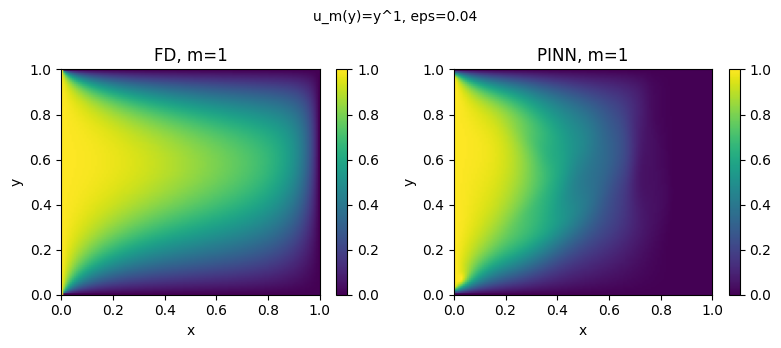

[shear m=2, eps=0.04] Ep   25 | PDE 2.532e-01 | inlet*w 2.657e-01 | Total 5.189e-01
[shear m=2, eps=0.04] Ep   50 | PDE 1.154e-01 | inlet*w 1.537e-01 | Total 2.691e-01
[shear m=2, eps=0.04] Ep   75 | PDE 7.507e-02 | inlet*w 1.948e-01 | Total 2.699e-01
[shear m=2, eps=0.04] Ep  100 | PDE 5.236e-02 | inlet*w 1.486e-01 | Total 2.009e-01
[shear m=2, eps=0.04] Ep  125 | PDE 4.498e-02 | inlet*w 1.241e-01 | Total 1.690e-01
[shear m=2, eps=0.04] Ep  150 | PDE 3.835e-02 | inlet*w 1.328e-01 | Total 1.711e-01
[shear m=2, eps=0.04] Ep  175 | PDE 3.567e-02 | inlet*w 1.300e-01 | Total 1.657e-01
[shear m=2, eps=0.04] Ep  200 | PDE 3.539e-02 | inlet*w 1.536e-01 | Total 1.890e-01
[shear m=2, eps=0.04] Ep  300 | PDE 2.861e-02 | inlet*w 1.036e-01 | Total 1.322e-01
[shear m=2, eps=0.04] Ep   25 | PDE 1.428e-01 | inlet*w 2.241e-01 | Total 3.669e-01
[shear m=2, eps=0.04] Ep   50 | PDE 7.611e-02 | inlet*w 1.574e-01 | Total 2.335e-01
[shear m=2, eps=0.04] Ep   75 | PDE 5.277e-02 | inlet*w 1.172e-01 | Total 1.

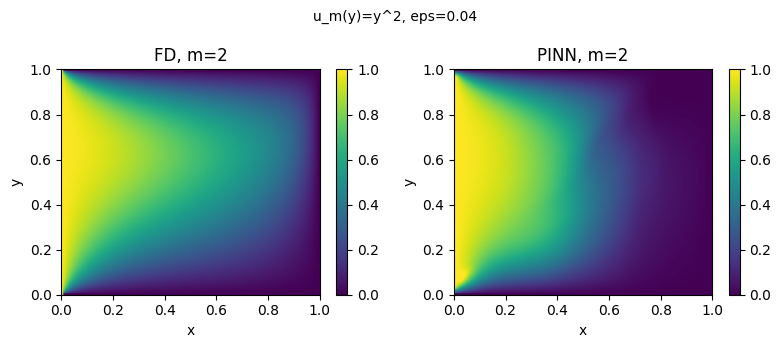

[shear m=3, eps=0.04] Ep   25 | PDE 3.894e-01 | inlet*w 1.688e-01 | Total 5.583e-01
[shear m=3, eps=0.04] Ep   50 | PDE 1.749e-01 | inlet*w 8.556e-02 | Total 2.604e-01
[shear m=3, eps=0.04] Ep   75 | PDE 1.086e-01 | inlet*w 8.939e-02 | Total 1.979e-01
[shear m=3, eps=0.04] Ep  100 | PDE 7.477e-02 | inlet*w 6.356e-02 | Total 1.383e-01
[shear m=3, eps=0.04] Ep  125 | PDE 5.049e-02 | inlet*w 4.570e-02 | Total 9.618e-02
[shear m=3, eps=0.04] Ep  150 | PDE 3.858e-02 | inlet*w 3.982e-02 | Total 7.839e-02
[shear m=3, eps=0.04] Ep  175 | PDE 2.943e-02 | inlet*w 3.963e-02 | Total 6.906e-02
[shear m=3, eps=0.04] Ep  200 | PDE 2.418e-02 | inlet*w 3.750e-02 | Total 6.168e-02
[shear m=3, eps=0.04] Ep  300 | PDE 1.516e-02 | inlet*w 2.408e-02 | Total 3.923e-02
[shear m=3, eps=0.04] Ep   25 | PDE 3.364e-01 | inlet*w 1.743e-01 | Total 5.107e-01
[shear m=3, eps=0.04] Ep   50 | PDE 1.651e-01 | inlet*w 1.016e-01 | Total 2.667e-01
[shear m=3, eps=0.04] Ep   75 | PDE 1.061e-01 | inlet*w 7.738e-02 | Total 1.

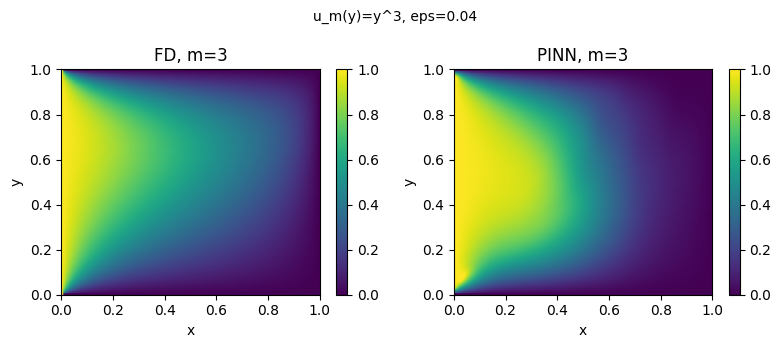


Tabla LaTeX: errores PINN vs FD para u_m(y)=y^m (núcleo y P99):
\begin{table}[H]
\centering
\caption{PINN errors against FD for generalized shear profiles $u_m(y)=y^m$ at fixed $\varepsilon=.04$.}
\label{tab:errors-general-shear}
\begin{tabular}{llccc}
\toprule
$m$ & $\varepsilon$ & $L^2_{\text{core}}$ & $L^\infty_{\text{core}}$ & P99 \\
\midrule
1 & 0.04 & 2.783e-01 & 6.686e-01 & 6.432e-01 \\
2 & 0.04 & 1.716e-01 & 4.343e-01 & 4.230e-01 \\
3 & 0.04 & 1.242e-01 & 2.863e-01 & 2.688e-01 \\
\bottomrule
\end{tabular}
\end{table}


In [ ]:
# %% PINN para perfiles de corte generalizados u_m(y)=y^m
import os, random
import numpy as np
import pandas as pd
import torch, torch.nn as nn, torch.optim as optim
import matplotlib.pyplot as plt
from scipy.sparse import lil_matrix, csc_matrix
from scipy.sparse.linalg import spsolve

# ---------------- Configuración ----------------
GRID_N   = 121
T0, Tw   = 1.0, 0.0
SEED     = 1234
SAVE_DIR = "/content/outputs"
os.makedirs(SAVE_DIR, exist_ok=True)

# Entrenamiento (OOM-safe)
NR_WARMUP = 2000
NB_WARMUP = 600
NR_MAIN   = 7000
NB_MAIN   = 1000
MICRO_WARMUP = 800
MICRO_MAIN   = 2000
EPOCHS_WARMUP = 300
EPOCHS_MAIN   = 5000
LBFGS_IT      = 600

# Red
WIDTH, DEPTH = 48, 4

# Muestreo y pesos
INLET_MARGIN  = 0.05
STRIP_X0      = 0.02
BIAS_POW      = 10.0          # más sesgo a x→1
OUTLET_STRIPE = (0.90, 1.0)   # franja pegada a salida
FRAC_OUTLET   = 0.50          # 50% de puntos en la franja de salida
W_REGION      = 10.0          # peso PDE adicional en x>0.90

# RAR
RAR_POOL   = 20000
RAR_ADD    = 3000

# ---------------- Utilidades ----------------
def set_seed(s=SEED):
    random.seed(s)
    np.random.seed(s)
    torch.manual_seed(s)

set_seed()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

# Red + transform
class MLP(nn.Module):
    def __init__(self, in_dim=2, out_dim=1, width=WIDTH, depth=DEPTH):
        super().__init__()
        layers = [nn.Linear(in_dim, width), nn.Tanh()]
        for _ in range(depth-1):
            layers += [nn.Linear(width, width), nn.Tanh()]
        layers += [nn.Linear(width, out_dim)]
        self.net = nn.Sequential(*layers)
        for m in self.net:
            if isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight)
                nn.init.zeros_(m.bias)

    def forward(self, z):  # z en [-1,1]^2
        return self.net(z)

def output_transform(xy, raw):
    x = xy[:,0:1]; y = xy[:,1:2]
    g = (1.0 - x) * y * (1.0 - y)  # misma estructura que en Couette
    return Tw + g * raw

def to_net_coords(xy):
    return 2.0*xy - 1.0

def T_model(net, xy):
    z = to_net_coords(xy)
    return output_transform(xy, net(z))

mse = lambda a: torch.mean(a**2)

def region_weight(xy):
    x = xy[:,0:1]
    w = torch.ones_like(x)
    w = w + (W_REGION-1.0)*(x > OUTLET_STRIPE[0]).float()
    return w

# Muestreo interior + fronteras
def sample_interior(N, device):
    N_out = int(N*FRAC_OUTLET)
    N_rest= N - N_out
    # frente
    N_front = N_rest//2
    x1 = torch.rand(N_front,1,device=device)*0.2
    y1 = torch.rand(N_front,1,device=device)
    # sesgo a x→1
    N_bias = N_rest - N_front
    u = torch.rand(N_bias,1,device=device)
    x2 = 1 - (1-u)**BIAS_POW
    y2 = torch.rand(N_bias,1,device=device)
    # franja salida
    xl, xr = OUTLET_STRIPE
    x3 = torch.rand(N_out,1,device=device)*(xr-xl)+xl
    y3 = torch.rand(N_out,1,device=device)
    X = torch.cat([x1,x2,x3], dim=0)
    Y = torch.cat([y1,y2,y3], dim=0)
    return torch.cat([X,Y], dim=1)

def bd_x0(N, device):
    x = torch.zeros(N,1,device=device)
    y = torch.rand(N,1,device=device)*(1-2*INLET_MARGIN)+INLET_MARGIN
    return torch.cat([x,y], dim=1)

def bd_strip_x0(N, device, x_max=STRIP_X0):
    x = torch.rand(N,1,device=device)*x_max
    y = torch.rand(N,1,device=device)*(1-2*INLET_MARGIN)+INLET_MARGIN
    return torch.cat([x,y], dim=1)

# ====================== PDE generalizada u_m(y)=y^m ======================

def pde_residual_shear(net, xy, eps, m):
    """
    Residual para u_m(y) T_x = eps (T_xx + T_yy), con u_m(y) = y^m.
    """
    xy = xy.clone().detach().requires_grad_(True)
    T  = T_model(net, xy)

    grads = torch.autograd.grad(
        T, xy, torch.ones_like(T),
        retain_graph=True, create_graph=True
    )[0]
    Tx, Ty = grads[:,0:1], grads[:,1:2]

    g2x = torch.autograd.grad(
        Tx, xy, torch.ones_like(Tx),
        retain_graph=True, create_graph=True
    )[0]
    g2y = torch.autograd.grad(
        Ty, xy, torch.ones_like(Ty),
        retain_graph=True, create_graph=True
    )[0]
    Txx, Tyy = g2x[:,0:1], g2y[:,1:2]

    eps_t = torch.as_tensor(eps, dtype=T.dtype, device=T.device)
    y     = xy[:,1:2]
    u     = y**m

    return u*Tx - eps_t*(Txx + Tyy)

def pde_loss_micro_shear(net, XY, eps, micro, m):
    n = XY.shape[0]
    total = XY.new_tensor(0.0)
    k = 0
    for i in range(0, n, micro):
        X = XY[i:i+micro]
        R = pde_residual_shear(net, X, eps, m)
        w = region_weight(X)
        total = total + torch.mean((w*R)**2)
        k += 1
    return total/max(k,1)

def rar_augment_shear(net, eps, m, base_XY, add=RAR_ADD, pool=RAR_POOL):
    with torch.no_grad():
        XYpool = torch.rand(pool, 2, device=device)  # uniforme

    R = pde_residual_shear(net, XYpool, eps, m).detach().abs().view(-1)
    idx = torch.topk(R, k=min(add, R.numel())).indices
    return torch.cat([base_XY, XYpool[idx]], dim=0)

# FD de referencia para u_m(y)=y^m
def solve_fd_shear(eps, m, Nx=GRID_N, Ny=GRID_N):
    xs = np.linspace(0,1,Nx)
    ys = np.linspace(0,1,Ny)
    hx = xs[1] - xs[0]
    hy = ys[1] - ys[0]

    def idx(i,j): return j*Nx + i

    N = Nx*Ny
    A = lil_matrix((N,N), dtype=float)
    b = np.zeros(N, dtype=float)

    for j in range(Ny):
        y = ys[j]
        for i in range(Nx):
            k = idx(i,j)

            # fronteras: mismas condiciones Dirichlet
            if i == 0:         # inlet x=0: T=1
                A[k,k] = 1.0; b[k] = 1.0
                continue
            if i == Nx-1:      # outlet x=1: T=0
                A[k,k] = 1.0; b[k] = 0.0
                continue
            if j == 0 or j == Ny-1:   # paredes y=0,1: T=0
                A[k,k] = 1.0; b[k] = 0.0
                continue

            cx = eps/(hx*hx)
            cy = eps/(hy*hy)
            u  = y**m
            conv = u/hx    # término convectivo upwind (u>0)

            # Difusión + convección en x
            A[k, idx(i-1,j)] += (cx + conv)
            A[k, idx(i+1,j)] += (cx)
            # Difusión en y (central)
            A[k, idx(i,  j-1)] += (cy)
            A[k, idx(i,  j+1)] += (cy)
            # Diagonal
            A[k, k] += (-2*cx - 2*cy - conv)

    T = spsolve(csc_matrix(A), b).reshape(Ny, Nx)
    # [Nx,Ny] para ser coherentes con la malla de la PINN
    return np.array(T.T, dtype=np.float64)

# Métricas
def metrics_all(Tp, Tr):
    E = Tp - Tr
    L2   = float(np.sqrt(np.mean(E**2)))
    Linf = float(np.max(np.abs(E)))
    MAE  = float(np.mean(np.abs(E)))
    core = (slice(1,-1), slice(1,-1))
    Ec   = E[core]
    L2c   = float(np.sqrt(np.mean(Ec**2)))
    Linfc = float(np.max(np.abs(Ec)))
    MAEc  = float(np.mean(np.abs(Ec)))
    p99   = float(np.percentile(np.abs(E).ravel(), 99))
    return dict(L2=L2, Linf=Linf, MAE=MAE,
                L2_core=L2c, Linf_core=Linfc, MAE_core=MAEc, P99=p99)

def should_log(ep, total):
    if ep<=200: return ep%25==0
    if ep<=1000:return ep%100==0
    return ep%max(total//12,500)==0

# Entrenamiento para u_m(y)=y^m
def train_phase_shear(net, eps, m, NR, NB, MICRO, EPOCHS, W_INLET, do_rar=False):
    opt = optim.Adam(net.parameters(), lr=1e-3)
    XYr = sample_interior(NR, device)

    for ep in range(1, EPOCHS+1):
        # RAR en dos momentos de la fase
        if do_rar and ep in [int(EPOCHS*0.4), int(EPOCHS*0.75)]:
            XYr = rar_augment_shear(net, eps, m, XYr, add=RAR_ADD, pool=RAR_POOL)

        X0  = bd_x0(NB, device)
        X0s = bd_strip_x0(NB, device, x_max=STRIP_X0)

        loss_pde = pde_loss_micro_shear(net, XYr, eps, micro=MICRO, m=m)
        loss_bc  = mse(T_model(net, X0) - T0) + mse(T_model(net, X0s) - T0)

        loss = loss_pde + W_INLET*loss_bc

        opt.zero_grad()
        loss.backward()
        opt.step()

        if should_log(ep, EPOCHS):
            print(f"[shear m={m}, eps={eps:.3g}] Ep {ep:4d} | "
                  f"PDE {loss_pde.item():.3e} | inlet*w {W_INLET*loss_bc.item():.3e} "
                  f"| Total {loss.item():.3e}")

def run_case_shear(eps, m, init_state_dict=None):
    """
    Caso único para u_m(y)=y^m a un eps dado.
    """
    set_seed()
    net = MLP().to(device)
    if init_state_dict is not None:
        net.load_state_dict(init_state_dict)

    W_INLET = 50.0 if eps >= 0.5 else 100.0

    # warm-up (sin RAR)
    train_phase_shear(
        net, eps, m,
        NR_WARMUP, NB_WARMUP, MICRO_WARMUP, EPOCHS_WARMUP,
        W_INLET, do_rar=False
    )

    # fase principal (con RAR)
    train_phase_shear(
        net, eps, m,
        NR_MAIN, NB_MAIN, MICRO_MAIN, EPOCHS_MAIN,
        W_INLET, do_rar=True
    )

    # --- L-BFGS final (PDE + BC) ---
    XYc  = sample_interior(4000, device).detach()
    X0c  = bd_x0(NB_MAIN, device).detach()
    X0sc = bd_strip_x0(NB_MAIN, device, x_max=STRIP_X0).detach()

    opt2 = optim.LBFGS(
        net.parameters(), lr=1.0,
        max_iter=LBFGS_IT, history_size=50,
        line_search_fn="strong_wolfe"
    )

    def closure():
        opt2.zero_grad()
        loss = pde_loss_micro_shear(net, XYc, eps, micro=MICRO_MAIN, m=m) \
             + W_INLET*mse(T_model(net, X0c) - T0) \
             + W_INLET*mse(T_model(net, X0sc) - T0)
        loss.backward()
        return loss

    print(f"[shear m={m}, eps={eps:.3g}] L-BFGS x{LBFGS_IT}...")
    opt2.step(closure)

    # --- Evaluación en la malla y comparación con FD ---
    xs = np.linspace(0,1,GRID_N)
    ys = np.linspace(0,1,GRID_N)
    xs_t = torch.tensor(xs, dtype=torch.float32, device=device)
    ys_t = torch.tensor(ys, dtype=torch.float32, device=device)
    Xg, Yg = torch.meshgrid(xs_t, ys_t, indexing='ij')
    XY = torch.stack([Xg.reshape(-1), Yg.reshape(-1)], dim=1)

    with torch.no_grad():
        Tpred = T_model(net, XY).reshape(GRID_N, GRID_N).cpu().numpy()

    Tfd = solve_fd_shear(eps, m, Nx=GRID_N, Ny=GRID_N)

    m_pinn = metrics_all(Tpred, Tfd)
    print(f"[shear m={m}, eps={eps:.3g}] PINN vs FD -> {m_pinn}")

    # opcional: guardar campos
    pd.DataFrame(Tpred, index=xs, columns=ys).to_csv(
        f"{SAVE_DIR}/T_PINN_shear_m{m}_eps_{eps:.3g}.csv", float_format="%.6f")
    pd.DataFrame(Tfd,   index=xs, columns=ys).to_csv(
        f"{SAVE_DIR}/T_FD_shear_m{m}_eps_{eps:.3g}.csv", float_format="%.6f")

    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    return net.state_dict(), m_pinn, xs, ys, Tfd, Tpred

def plot_fields_general_shear(xs, ys, Tfd, Tpred, eps, m):
    """
    Genera una figura con dos subplots (FD, PINN) y la guarda como
    fields_m{m}.png en SAVE_DIR.
    """
    extent = [xs[0], xs[-1], ys[0], ys[-1]]
    vmin, vmax = 0.0, 1.0  # T0=1, Tw=0

    fig, axs = plt.subplots(1, 2, figsize=(8.0, 3.5))

    im0 = axs[0].imshow(
        Tfd.T, origin='lower', extent=extent, aspect='auto',
        vmin=vmin, vmax=vmax
    )
    axs[0].set_title(f"FD, m={m}")
    axs[0].set_xlabel("x")
    axs[0].set_ylabel("y")
    fig.colorbar(im0, ax=axs[0])

    im1 = axs[1].imshow(
        Tpred.T, origin='lower', extent=extent, aspect='auto',
        vmin=vmin, vmax=vmax
    )
    axs[1].set_title(f"PINN, m={m}")
    axs[1].set_xlabel("x")
    axs[1].set_ylabel("y")
    fig.colorbar(im1, ax=axs[1])

    fig.suptitle(f"u_m(y)=y^{m}, eps={eps}", fontsize=10)
    plt.tight_layout()
    plt.savefig(f"{SAVE_DIR}/fields_m{m}.png", dpi=200, bbox_inches="tight")
    plt.show()
    plt.close(fig)

# ====================== MAIN: experimento u_m(y)=y^m ======================

M_VALUES  = [1, 2, 3]
EPS_SHEAR = 0.04   # el eps "de referencia" que usas en la figura

shear_results = []

print("\n" + "="*72)
print(" Experimento: perfiles de corte generalizados u_m(y)=y^m ")
print("="*72)

state = None   # si quieres warm-start entre m, ve actualizando esta variable
for m in M_VALUES:
    init_sd = state  # o None si quieres cada m desde cero
    sd_m, m_pinn_m, xs_m, ys_m, Tfd_m, Tpred_m = run_case_shear(EPS_SHEAR, m, init_state_dict=init_sd)
    state = sd_m
    shear_results.append((m, m_pinn_m))

    # Figura FD vs PINN para este m
    plot_fields_general_shear(xs_m, ys_m, Tfd_m, Tpred_m, EPS_SHEAR, m)

# --- Tabla LaTeX para Table~\ref{tab:errors-general-shear} ---

print("\nTabla LaTeX: errores PINN vs FD para u_m(y)=y^m (núcleo y P99):")
print(r"\begin{table}[H]")
print(r"\centering")
print(r"\caption{PINN errors against FD for generalized shear profiles $u_m(y)=y^m$ at fixed $\varepsilon=.04$.}")
print(r"\label{tab:errors-general-shear}")
print(r"\begin{tabular}{llccc}")
print(r"\toprule")
print(r"$m$ & $\varepsilon$ & $L^2_{\text{core}}$ & $L^\infty_{\text{core}}$ & P99 \\")
print(r"\midrule")
for m, metr in shear_results:
    print(rf"{m} & {EPS_SHEAR:.2f} & "
          rf"{metr['L2_core']:.3e} & {metr['Linf_core']:.3e} & {metr['P99']:.3e} \\")
print(r"\bottomrule")
print(r"\end{tabular}")
print(r"\end{table}")


In [ ]:
# %% PINN Couette FULL + Curriculum + Outlet-focus + RAR + Prior asintótico (híbrido)
import os, random
import numpy as np
import pandas as pd
import torch, torch.nn as nn, torch.optim as optim
import matplotlib.pyplot as plt
from scipy.sparse import lil_matrix, csc_matrix
from scipy.sparse.linalg import spsolve
from scipy.special import gammaincc

# ---------------- Configuración ----------------
CURRICULUM_EPS = [1.0, 0.1, 0.06, 0.04]   # warm-start
GRID_N   = 121
T0, Tw   = 1.0, 0.0
SEED     = 1234
SAVE_DIR = "/content/outputs"
os.makedirs(SAVE_DIR, exist_ok=True)

# Entrenamiento (OOM-safe)
NR_WARMUP, NB_WARMUP = 2000, 600
NR_MAIN,   NB_MAIN   = 7000, 1000
MICRO_WARMUP = 800
MICRO_MAIN   = 2000
EPOCHS_WARMUP = 300
EPOCHS_MAIN   = 5000
LBFGS_IT      = 600

# Red
WIDTH, DEPTH = 48, 4
MODEL_NAME   = "couette_full_curr"

# ===== Muestreo y pesos (más capa de salida) =====
INLET_MARGIN  = 0.05
STRIP_X0      = 0.02
BIAS_POW      = 10.0          # más sesgo a x→1
OUTLET_STRIPE = (0.90, 1.0)   # franja pegada a salida
FRAC_OUTLET   = 0.50          # 50% de puntos en la franja de salida
W_REGION      = 10.0          # peso PDE adicional en x>0.90

# RAR
RAR_ROUNDS = 2
RAR_POOL   = 20000
RAR_ADD    = 3000

# ===== Regularización suave hacia la compuesta (prior) =====
PRIOR_LAMBDA_MAX = 0.6    # peso inicial del prior
PRIOR_LAMBDA_MIN = 0.05   # peso final (casi apagado)
CORE_MARGIN_Y    = 0.10   # núcleo: y∈[0.10, 0.90]
CORE_MARGIN_XL   = 0.08   # evita inlet inmediato
CORE_MARGIN_XR   = 0.08   # evita outlet inmediato

# ---------------- Utilidades ----------------
def set_seed(s=SEED):
    random.seed(s); np.random.seed(s); torch.manual_seed(s)
set_seed()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

# Red + transform
class MLP(nn.Module):
    def __init__(self, in_dim=2, out_dim=1, width=WIDTH, depth=DEPTH):
        super().__init__()
        layers = [nn.Linear(in_dim, width), nn.Tanh()]
        for _ in range(depth-1):
            layers += [nn.Linear(width, width), nn.Tanh()]
        layers += [nn.Linear(width, out_dim)]
        self.net = nn.Sequential(*layers)
        for m in self.net:
            if isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight); nn.init.zeros_(m.bias)
    def forward(self, z):  # z en [-1,1]^2
        return self.net(z)

def output_transform(xy, raw):
    x = xy[:,0:1]; y = xy[:,1:2]
    g = (1.0 - x) * y * (1.0 - y)
    return Tw + g * raw

def to_net_coords(xy): return 2.0*xy - 1.0

def T_model(net, xy):
    z = to_net_coords(xy)
    return output_transform(xy, net(z))

# PDE residual y pérdida (con ponderación de región)
def pde_residual(net, xy, eps):
    xy = xy.clone().detach().requires_grad_(True)
    T  = T_model(net, xy)
    grads = torch.autograd.grad(T, xy, torch.ones_like(T), retain_graph=True, create_graph=True)[0]
    Tx, Ty = grads[:,0:1], grads[:,1:2]
    g2x = torch.autograd.grad(Tx, xy, torch.ones_like(Tx), retain_graph=True, create_graph=True)[0]
    g2y = torch.autograd.grad(Ty, xy, torch.ones_like(Ty), retain_graph=True, create_graph=True)[0]
    Txx, Tyy = g2x[:,0:1], g2y[:,1:2]
    eps = torch.as_tensor(eps, dtype=T.dtype, device=T.device)
    y   = xy[:,1:2]
    return y*Tx - eps*(Txx + Tyy)

def region_weight(xy):
    x = xy[:,0:1]
    w = torch.ones_like(x)
    w = w + (W_REGION-1.0)*(x > OUTLET_STRIPE[0]).float()  # mayor peso en x>0.90
    return w

def pde_loss_micro(net, XY, eps, micro):
    n = XY.shape[0]; total = XY.new_tensor(0.0); k=0
    for i in range(0, n, micro):
        X = XY[i:i+micro]
        R = pde_residual(net, X, eps)
        w = region_weight(X)
        total = total + torch.mean((w*R)**2)
        k+=1
    return total/max(k,1)

#def mse(a):
#    return torch.mean(a**2)
mse = lambda a: torch.mean(a**2)


# Muestreo (con franja de salida)
def sample_interior(N, device):
    N_out = int(N*FRAC_OUTLET)
    N_rest= N - N_out
    # frente
    N_front = N_rest//2
    x1 = torch.rand(N_front,1,device=device)*0.2
    y1 = torch.rand(N_front,1,device=device)
    # sesgo a x→1
    N_bias = N_rest - N_front
    u = torch.rand(N_bias,1,device=device); x2 = 1 - (1-u)**BIAS_POW
    y2 = torch.rand(N_bias,1,device=device)
    # franja salida
    xl, xr = OUTLET_STRIPE
    x3 = torch.rand(N_out,1,device=device)*(xr-xl)+xl
    y3 = torch.rand(N_out,1,device=device)
    X = torch.cat([x1,x2,x3], dim=0)
    Y = torch.cat([y1,y2,y3], dim=0)
    return torch.cat([X,Y], dim=1)

def bd_x0(N, device):
    x = torch.zeros(N,1,device=device)
    y = torch.rand(N,1,device=device)*(1-2*INLET_MARGIN)+INLET_MARGIN
    return torch.cat([x,y], dim=1)

def bd_strip_x0(N, device, x_max=STRIP_X0):
    x = torch.rand(N,1,device=device)*x_max
    y = torch.rand(N,1,device=device)*(1-2*INLET_MARGIN)+INLET_MARGIN
    return torch.cat([x,y], dim=1)

# RAR: añade puntos donde el residual es mayor (sin requires_grad aquí)
def rar_augment(net, eps, base_XY, add=RAR_ADD, pool=RAR_POOL):
    with torch.no_grad():
        XYpool = torch.rand(pool,2,device=device)  # uniforme
    # pde_residual ya activa grad en copia interna
    R = pde_residual(net, XYpool, eps).detach().abs().view(-1)
    idx = torch.topk(R, k=min(add, R.numel())).indices
    return torch.cat([base_XY, XYpool[idx]], dim=0)

# Composite (diagnóstico opcional)
def composite_couette(x_grid, y_grid, eps, h=1.0, T0=1.0, Tw=0.0, p=2):
    """
    Composite para y*T_x = eps*(T_xx + T_yy) con:
      x=0: T=T0, y=0,h: T=Tw, x=1: T=Tw.
    Usa Q(s,z)=gammaincc(s,z), unión de capas por inclusión–exclusión
    y ventana w(x)=x**p para la capa de salida. Devuelve [Nx,Ny] (ij).
    """
    X, Y = np.meshgrid(x_grid, y_grid, indexing='ij')
    s     = 1.0/3.0
    delta = 1e-12

    z1 = (Y**3)       / (3.0*eps*np.maximum(X, delta))  # pared inferior
    z2 = ((h - Y)**3) / (3.0*eps*np.maximum(X, delta))  # pared superior
    Qb = gammaincc(s, z1)
    Qt = gammaincc(s, z2)

    S = Qb + Qt - Qb*Qt
    core = 1.0 - S

    w = X**p
    outlet = np.exp(-(1.0 - X)*Y/eps)

    Tcomp = T0 + (Tw - T0) * ( S + w*outlet*core )
    return Tcomp

# ====== Prior suave hacia la compuesta (sólo en núcleo) ======
def core_window(xy):
    x = xy[:,0:1]; y = xy[:,1:2]
    m_y = (y > CORE_MARGIN_Y) & (y < 1.0-CORE_MARGIN_Y)
    m_x = (x > CORE_MARGIN_XL) & (x < 1.0-CORE_MARGIN_XR)
    return (m_x & m_y).float()

def prior_loss_to_composite(net, xy, eps, xs_np, ys_np, Tcomp_np):
    """
    Interpola T_comp en (xy) y penaliza sólo en el núcleo (ventana).
    """
    with torch.no_grad():
        xs = torch.tensor(xs_np, dtype=torch.float32, device=xy.device)
        ys = torch.tensor(ys_np, dtype=torch.float32, device=xy.device)
        Tcomp = torch.tensor(Tcomp_np, dtype=torch.float32, device=xy.device)  # [Nx,Ny]

    x = xy[:,0]; y = xy[:,1]
    Nx, Ny = xs.numel(), ys.numel()
    hx = xs[1]-xs[0]; hy = ys[1]-ys[0]

    ix = torch.clamp(((x/xs[-1])*(Nx-1)).floor().long(), 0, Nx-2)
    iy = torch.clamp(((y/ys[-1])*(Ny-1)).floor().long(), 0, Ny-2)
    tx = (x - xs[ix])/(hx+1e-12); ty = (y - ys[iy])/(hy+1e-12)

    def G(i,j): return Tcomp[i, j]
    Tc = ( (1-tx)*(1-ty)*G(ix,   iy)   + tx*(1-ty)*G(ix+1, iy)
         + (1-tx)*ty*G(ix,   iy+1)     + tx*ty*G(ix+1, iy+1) ).unsqueeze(1)

    Tpred = T_model(net, xy)
    wcore = core_window(xy)
    return torch.sum(wcore * (Tpred - Tc)**2) / (torch.sum(wcore)+1e-12)

# FD de referencia (difusión central + upwind en x)
def solve_fd(eps, m):
    xs = np.linspace(0,1,Nx); ys = np.linspace(0,1,Ny)
    hx = xs[1]-xs[0]; hy = ys[1]-ys[0]
    def idx(i,j): return j*Nx + i
    N = Nx*Ny
    A = lil_matrix((N,N), dtype=float)
    b = np.zeros(N, dtype=float)
    for j in range(1, Ny-1):
        yj = y[j]
        u = yj ** m          # <-- u_m(y) = y^m
        for i in range(1, Nx-1):
            row = idx(i, j)
        for i in range(Nx):
            k = idx(i,j)
            if i==0:      A[k,k]=1; b[k]=1;  continue
            if i==Nx-1:   A[k,k]=1; b[k]=0;  continue
            if j==0 or j==Ny-1: A[k,k]=1; b[k]=0; continue
            cx = eps/(hx*hx); cy = eps/(hy*hy); conv = y/hx
            A[k, idx(i-1,j)] += ( cx + conv)   # upwind
            A[k, idx(i+1,j)] += ( cx)
            A[k, idx(i,  j-1)] += ( cy)
            A[k, idx(i,  j+1)] += ( cy)
            A[k, k]           += (-2*cx - 2*cy - conv)
    T = spsolve(csc_matrix(A), b).reshape(Ny, Nx)
    return np.array(T.T, dtype=np.float64)

# Métricas robustas
def metrics_all(Tp, Tr):
    E = Tp - Tr
    L2   = float(np.sqrt(np.mean(E**2)))
    Linf = float(np.max(np.abs(E)))
    MAE  = float(np.mean(np.abs(E)))
    core = (slice(1,-1), slice(1,-1))
    Ec   = E[core]
    L2c   = float(np.sqrt(np.mean(Ec**2)))
    Linfc = float(np.max(np.abs(Ec)))
    MAEc  = float(np.mean(np.abs(Ec)))
    p99   = float(np.percentile(np.abs(E).ravel(), 99))
    return dict(L2=L2, Linf=Linf, MAE=MAE, L2_core=L2c, Linf_core=Linfc, MAE_core=MAEc, P99=p99)

def should_log(ep, total):
    if ep<=200: return ep%25==0
    if ep<=1000:return ep%100==0
    return ep%max(total//12,500)==0

# Entrena una fase (con RAR y prior con annealing)
def train_phase(net, eps, NR, NB, MICRO, EPOCHS, W_INLET, do_rar=False):
    opt = optim.Adam(net.parameters(), lr=1e-3)
    XYr = sample_interior(NR, device)

    # precomputo del campo compuesto para el prior
    xs_np = np.linspace(0,1,GRID_N); ys_np = np.linspace(0,1,GRID_N)
    Tcomp_np = composite_couette(xs_np, ys_np, eps)

    for ep in range(1, EPOCHS+1):
        if do_rar and ep in [int(EPOCHS*0.4), int(EPOCHS*0.75)]:
            XYr = rar_augment(net, eps, XYr, add=RAR_ADD, pool=RAR_POOL)

        X0  = bd_x0(NB, device)
        X0s = bd_strip_x0(NB, device, x_max=STRIP_X0)

        # --- grafos independientes para cada término ---
        loss_pde = pde_loss_micro(net, XYr, eps, micro=MICRO)
        loss_bc  = mse(T_model(net, X0)-T0) + mse(T_model(net, X0s)-T0)

        XY_prior   = XYr.detach()  # evita reusar grafo del PDE
        loss_prior = prior_loss_to_composite(net, XY_prior, eps, xs_np, ys_np, Tcomp_np)

        # annealing del prior
        alpha = 0.5*(1 + np.cos(np.pi*min(ep/EPOCHS,1.0)))
        lam_prior = PRIOR_LAMBDA_MIN + (PRIOR_LAMBDA_MAX - PRIOR_LAMBDA_MIN)*alpha

        loss = loss_pde + W_INLET*loss_bc + lam_prior*loss_prior

        opt.zero_grad()
        loss.backward()
        opt.step()

        if should_log(ep, EPOCHS):
            print(f"[eps={eps:.3g}|warm={NR==NR_WARMUP}] Ep {ep:4d} | PDE {loss_pde.item():.3e} "
                  f"| inlet*w {W_INLET*loss_bc.item():.3e} | prior {lam_prior*loss_prior.item():.3e} "
                  f"| Total {loss.item():.3e}")

# Ejecuta un caso con warm-up → main → L-BFGS
def run_case(eps, init_state_dict=None):
    set_seed()
    net = MLP().to(device)
    if init_state_dict is not None:
        net.load_state_dict(init_state_dict)

    W_INLET = 50.0 if eps>=0.5 else 100.0

    # warm-up (sin RAR)
    train_phase(net, eps, NR_WARMUP, NB_WARMUP, MICRO_WARMUP, EPOCHS_WARMUP, W_INLET, do_rar=False)
    # fase principal (con RAR)
    train_phase(net, eps, NR_MAIN, NB_MAIN, MICRO_MAIN, EPOCHS_MAIN, W_INLET, do_rar=True)

    # L-BFGS: recompone grafo en cada closure + prior pequeño
    XYc  = sample_interior(4000, device).detach()
    X0c  = bd_x0(NB_MAIN, device).detach()
    X0sc = bd_strip_x0(NB_MAIN, device, x_max=STRIP_X0).detach()

    xs_np = np.linspace(0,1,GRID_N); ys_np = np.linspace(0,1,GRID_N)
    Tcomp_np = composite_couette(xs_np, ys_np, eps)
    LBF_PRIOR = 0.05

    opt2 = optim.LBFGS(net.parameters(), lr=1.0, max_iter=LBFGS_IT, history_size=50, line_search_fn="strong_wolfe")
    def closure():
        opt2.zero_grad()
        loss = pde_loss_micro(net, XYc, eps, micro=MICRO_MAIN) \
             + W_INLET*mse(T_model(net, X0c)-T0) + W_INLET*mse(T_model(net, X0sc)-T0) \
             + LBF_PRIOR*prior_loss_to_composite(net, XYc, eps, xs_np, ys_np, Tcomp_np)
        loss.backward()
        return loss
    print(f"[eps={eps:.3g}] L-BFGS x{LBFGS_IT}..."); opt2.step(closure)

    # Evaluación vs FD + figuras
    xs = np.linspace(0,1,GRID_N); ys = np.linspace(0,1,GRID_N)
    xs_t = torch.tensor(xs, dtype=torch.float32, device=device)
    ys_t = torch.tensor(ys, dtype=torch.float32, device=device)
    Xg, Yg = torch.meshgrid(xs_t, ys_t, indexing='ij')
    XY = torch.stack([Xg.reshape(-1), Yg.reshape(-1)], dim=1)
    with torch.no_grad():
        Tpred = T_model(net, XY).reshape(GRID_N, GRID_N).cpu().numpy()
    Tfd = solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N)
    Tcomp = composite_couette(xs, ys, eps)

    m_pinn = metrics_all(Tpred, Tfd)
    m_comp = metrics_all(Tcomp, Tfd)
    print(f"[eps={eps:.3g}] PINN vs FD -> {m_pinn}")
    print(f"[eps={eps:.3g}] COMP vs FD -> {m_comp}")

    # Guardar CSV + mapas + corte
    pd.DataFrame(Tpred, index=xs, columns=ys).to_csv(f"{SAVE_DIR}/T_PINN_eps_{eps:.3g}_{MODEL_NAME}.csv", float_format="%.6f")
    pd.DataFrame(Tfd,   index=xs, columns=ys).to_csv(f"{SAVE_DIR}/T_FD_eps_{eps:.3g}.csv", float_format="%.6f")
    pd.DataFrame(Tcomp, index=xs, columns=ys).to_csv(f"{SAVE_DIR}/T_Composite_eps_{eps:.3g}.csv", float_format="%.6f")

    for tag, Tmat in [("PINN",Tpred), ("FD",Tfd), ("COMP",Tcomp)]:
        plt.figure(figsize=(5.0,4.2))
        im=plt.imshow(Tmat.T, origin='lower', extent=[0,1,0,1], aspect='auto')
        plt.colorbar(im,label='T'); plt.xlabel('x'); plt.ylabel('y'); plt.title(f'{tag} field, eps={eps}')
        plt.tight_layout(); plt.savefig(f"{SAVE_DIR}/{tag}_field_eps_{eps:.3g}.png", dpi=140); plt.show()

    jmid = GRID_N//2
    plt.figure(figsize=(6.0,4.2))
    plt.plot(xs, Tfd[:,jmid], '-',  lw=2, label='FD')
    plt.plot(xs, Tpred[:,jmid], 'o', ms=3, label='PINN')
    plt.plot(xs, Tcomp[:,jmid], '--', lw=1.5, label='Composite')
    plt.xlabel('x'); plt.ylabel('T(x, y=0.5)'); plt.title(f'Cut y=0.5, eps={eps}')
    plt.legend(); plt.tight_layout(); plt.savefig(f"{SAVE_DIR}/cut_y05_eps_{eps:.3g}.png", dpi=150); plt.show()

    if torch.cuda.is_available(): torch.cuda.empty_cache()
    return net.state_dict(), m_pinn, m_comp

# ---------------- Loop curriculum (warm-start) + tabla ----------------
results = []
state = None
for eps in CURRICULUM_EPS:
    print("="*72)
    state, m_pinn, m_comp = run_case(eps, init_state_dict=state)
    results.append((eps, m_pinn, m_comp))

print("\nTabla LaTeX (errores vs FD; global, núcleo y p99):")
print(r"\begin{table}[H]")
print(r"\centering")
print(r"\caption{Errors of PINN and Composite against FD on a $121\times121$ grid. Core excludes one-cell boundary.}")
print(r"\begin{tabular}{lcccccc}")
print(r"\toprule")
print(r"$\varepsilon$ & $L^2$ & $L^\infty$ & MAE & $L^2_{\text{core}}$ & $L^\infty_{\text{core}}$ & P99 \\")
print(r"\midrule")
for eps, m_pinn, m_comp in results:
    print(rf"\multicolumn{{7}}{{l}}{{\textbf{{PINN vs FD}} ($\varepsilon={eps:g}$)}} \\")
    print(rf" & {m_pinn['L2']:.3e} & {m_pinn['Linf']:.3e} & {m_pinn['MAE']:.3e} & {m_pinn['L2_core']:.3e} & {m_pinn['Linf_core']:.3e} & {m_pinn['P99']:.3e} \\")
    print(rf"\multicolumn{{7}}{{l}}{{\textbf{{Composite vs FD}} ($\varepsilon={eps:g}$)}} \\")
    print(rf" & {m_comp['L2']:.3e} & {m_comp['Linf']:.3e} & {m_comp['MAE']:.3e} & {m_comp['L2_core']:.3e} & {m_comp['Linf_core']:.3e} & {m_comp['P99']:.3e} \\")
print(r"\bottomrule")
print(r"\end{tabular}")
print(r"\end{table}")


ValueError: unexpected '{' in field name

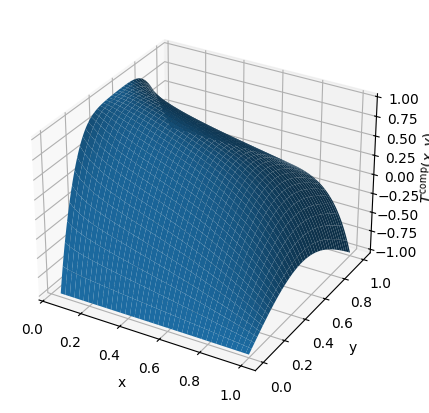

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpmath import gammainc, gamma, mp

# ---------------------------
# Parámetros del problema
# ---------------------------
eps = 0.1        # ε
mp.dps = 40      # precisión para mpmath

s = mp.mpf('1')/3
Gamma_s = gamma(s)   # Γ(1/3)

# ---------------------------
# Gamma incompleta superior Γ(1/3, z)
# ---------------------------
def upper_incomplete_gamma(z):
    z_mp = mp.mpf(z)
    # Γ(s, z) = ∫_z^∞ t^{s-1} e^{-t} dt
    return gammainc(s, z_mp, mp.inf)

# vectorizar para trabajar con arrays de numpy
upper_inc_gamma_vec = np.vectorize(lambda z: float(upper_incomplete_gamma(z)))

# ---------------------------
# T^comp(x,y)
# ---------------------------
def T_comp(x, y, eps=0.1):
    z1 = (y**3) / (3*eps*x)
    z2 = ((1-y)**3) / (3*eps*x)
    term_outlet = np.exp(-(1-x)*y/eps)
    term_inner_bottom = upper_inc_gamma_vec(z1) / float(Gamma_s)
    term_inner_top    = upper_inc_gamma_vec(z2) / float(Gamma_s)
    return 1 - term_outlet - term_inner_bottom - term_inner_top

# ---------------------------
# Malla (evito x = 0 para no dividir por 0)
# ---------------------------
x_vals = np.linspace(0.05, 1.0, 120)
y_vals = np.linspace(0.0, 1.0, 120)
X, Y = np.meshgrid(x_vals, y_vals)
Z = T_comp(X, Y, eps=eps)

# ---------------------------
# Gráfica 3D de superficie
# ---------------------------
from mpl_toolkits.mplot3d import Axes3D  # necesario para 3D

fig = plt.figure(figsize=(7, 5))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, Y, Z)
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel(r"$T^{\mathrm{comp}}(x,y)$")
ax.set_title(r"Composite approximation $T^{\mathrm{comp}}$ con $\varepsilon = {}$".format(eps))
plt.tight_layout()
plt.show()


In [ ]:
import torch

#mse = lambda a: torch.mean(a**2)

# Ejemplo:
r = torch.tensor([1.0, -2.0, 3.0])
print(mse(r))  # -> mean([1,4,9]) = 14/3


tensor(4.6667)


In [ ]:
# %% PINN Couette: Híbrido + Prior + Sándwich suave + RAR + L-BFGS (copy-paste)
import os, random
import numpy as np
import pandas as pd
import torch, torch.nn as nn, torch.optim as optim
import matplotlib.pyplot as plt
from scipy.sparse import lil_matrix, csc_matrix
from scipy.sparse.linalg import spsolve
from scipy.special import gammaincc

# ---------------- Configuración ----------------
CURRICULUM_EPS = [1.0, 0.1, 0.06, 0.04]   # warm-start
GRID_N   = 121
T0, Tw   = 1.0, 0.0
SEED     = 1234
SAVE_DIR = "/content/outputs"
os.makedirs(SAVE_DIR, exist_ok=True)

# Entrenamiento (OOM-safe)
NR_WARMUP, NB_WARMUP = 2000, 600
NR_MAIN,   NB_MAIN   = 7000, 1000
MICRO_WARMUP = 800
MICRO_MAIN   = 2000
EPOCHS_WARMUP = 300
EPOCHS_MAIN   = 5000
LBFGS_IT      = 600

# Red
WIDTH, DEPTH = 48, 4
MODEL_NAME   = "couette_full_curr"

# ===== Muestreo y pesos (más capa de salida) =====
INLET_MARGIN  = 0.05
STRIP_X0      = 0.02
BIAS_POW      = 10.0          # más sesgo a x→1
OUTLET_STRIPE = (0.90, 1.0)   # franja pegada a salida
FRAC_OUTLET   = 0.50          # 50% de puntos en la franja de salida
W_REGION      = 10.0          # peso PDE adicional en x>0.90

# RAR
RAR_ROUNDS = 2
RAR_POOL   = 20000
RAR_ADD    = 3000

# ===== Regularización suave hacia la compuesta (prior) =====
PRIOR_LAMBDA_MAX = 0.6    # peso inicial del prior
PRIOR_LAMBDA_MIN = 0.05   # peso final (casi apagado)
CORE_MARGIN_Y    = 0.10   # núcleo: y∈[0.10, 0.90]
CORE_MARGIN_XL   = 0.08   # evita inlet inmediato
CORE_MARGIN_XR   = 0.08   # evita outlet inmediato

# ---------------- Utilidades ----------------
def set_seed(s=SEED):
    random.seed(s); np.random.seed(s); torch.manual_seed(s)
set_seed()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

class MLP(nn.Module):
    def __init__(self, in_dim=2, out_dim=1, width=WIDTH, depth=DEPTH):
        super().__init__()
        layers = [nn.Linear(in_dim, width), nn.Tanh()]
        for _ in range(depth-1):
            layers += [nn.Linear(width, width), nn.Tanh()]
        layers += [nn.Linear(width, out_dim)]
        self.net = nn.Sequential(*layers)
        for m in self.net:
            if isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight); nn.init.zeros_(m.bias)
    def forward(self, z):
        return self.net(z)

def output_transform(xy, raw):
    x = xy[:,0:1]; y = xy[:,1:2]
    g = (1.0 - x) * y * (1.0 - y)
    return Tw + g * raw

def to_net_coords(xy): return 2.0*xy - 1.0

def T_model(net, xy):
    z = to_net_coords(xy)
    return output_transform(xy, net(z))

# PDE residual y pérdida (con ponderación de región)
def pde_residual(net, xy, eps):
    xy = xy.clone().detach().requires_grad_(True)
    T  = T_model(net, xy)
    grads = torch.autograd.grad(T, xy, torch.ones_like(T), retain_graph=True, create_graph=True)[0]
    Tx, Ty = grads[:,0:1], grads[:,1:2]
    g2x = torch.autograd.grad(Tx, xy, torch.ones_like(Tx), retain_graph=True, create_graph=True)[0]
    g2y = torch.autograd.grad(Ty, xy, torch.ones_like(Ty), retain_graph=True, create_graph=True)[0]
    Txx, Tyy = g2x[:,0:1], g2y[:,1:2]
    eps = torch.as_tensor(eps, dtype=T.dtype, device=T.device)
    y   = xy[:,1:2]
    return y*Tx - eps*(Txx + Tyy)

def region_weight(xy):
    x = xy[:,0:1]
    w = torch.ones_like(x)
    w = w + (W_REGION-1.0)*(x > OUTLET_STRIPE[0]).float()  # mayor peso en x>0.90
    return w

def pde_loss_micro(net, XY, eps, micro):
    n = XY.shape[0]; total = XY.new_tensor(0.0); k=0
    for i in range(0, n, micro):
        X = XY[i:i+micro]
        R = pde_residual(net, X, eps)
        w = region_weight(X)
        total = total + torch.mean((w*R)**2)
        k+=1
    return total/max(k,1)

def mse(a): return torch.mean(a**2)

# Muestreo (con franja de salida)
def sample_interior(N, device):
    N_out = int(N*FRAC_OUTLET)
    N_rest= N - N_out
    # frente
    N_front = N_rest//2
    x1 = torch.rand(N_front,1,device=device)*0.2
    y1 = torch.rand(N_front,1,device=device)
    # sesgo a x→1
    N_bias = N_rest - N_front
    u = torch.rand(N_bias,1,device=device); x2 = 1 - (1-u)**BIAS_POW
    y2 = torch.rand(N_bias,1,device=device)
    # franja salida
    xl, xr = OUTLET_STRIPE
    x3 = torch.rand(N_out,1,device=device)*(xr-xl)+xl
    y3 = torch.rand(N_out,1,device=device)
    X = torch.cat([x1,x2,x3], dim=0)
    Y = torch.cat([y1,y2,y3], dim=0)
    return torch.cat([X,Y], dim=1)

def bd_x0(N, device):
    x = torch.zeros(N,1,device=device)
    y = torch.rand(N,1,device=device)*(1-2*INLET_MARGIN)+INLET_MARGIN
    return torch.cat([x,y], dim=1)

def bd_strip_x0(N, device, x_max=STRIP_X0):
    x = torch.rand(N,1,device=device)*x_max
    y = torch.rand(N,1,device=device)*(1-2*INLET_MARGIN)+INLET_MARGIN
    return torch.cat([x,y], dim=1)

# RAR: añade puntos donde el residual es mayor
def rar_augment(net, eps, base_XY, add=RAR_ADD, pool=RAR_POOL):
    with torch.no_grad():
        XYpool = torch.rand(pool,2,device=device)  # uniforme
    R = pde_residual(net, XYpool, eps).detach().abs().view(-1)
    idx = torch.topk(R, k=min(add, R.numel())).indices
    return torch.cat([base_XY, XYpool[idx]], dim=0)

# Composite (diagnóstico opcional)
def composite_couette(x_grid, y_grid, eps, h=1.0, T0=1.0, Tw=0.0, p=2):
    X, Y = np.meshgrid(x_grid, y_grid, indexing='ij')
    s     = 1.0/3.0
    delta = 1e-12
    z1 = (Y**3)       / (3.0*eps*np.maximum(X, delta))  # pared inferior
    z2 = ((h - Y)**3) / (3.0*eps*np.maximum(X, delta))  # pared superior
    Qb = gammaincc(s, z1)
    Qt = gammaincc(s, z2)
    S = Qb + Qt - Qb*Qt
    core = 1.0 - S
    w = X**p
    outlet = np.exp(-(1.0 - X)*Y/eps)
    Tcomp = T0 + (Tw - T0) * ( S + w*outlet*core )
    return Tcomp

# ====== Prior suave hacia la compuesta (sólo en núcleo) ======
def core_window(xy):
    x = xy[:,0:1]; y = xy[:,1:2]
    m_y = (y > CORE_MARGIN_Y) & (y < 1.0-CORE_MARGIN_Y)
    m_x = (x > CORE_MARGIN_XL) & (x < 1.0-CORE_MARGIN_XR)
    return (m_x & m_y).float()

def prior_loss_to_composite(net, xy, eps, xs_np, ys_np, Tcomp_np):
    with torch.no_grad():
        xs = torch.tensor(xs_np, dtype=torch.float32, device=xy.device)
        ys = torch.tensor(ys_np, dtype=torch.float32, device=xy.device)
        Tcomp = torch.tensor(Tcomp_np, dtype=torch.float32, device=xy.device)  # [Nx,Ny]
    x = xy[:,0]; y = xy[:,1]
    Nx, Ny = xs.numel(), ys.numel()
    hx = xs[1]-xs[0]; hy = ys[1]-ys[0]
    ix = torch.clamp(((x/xs[-1])*(Nx-1)).floor().long(), 0, Nx-2)
    iy = torch.clamp(((y/ys[-1])*(Ny-1)).floor().long(), 0, Ny-2)
    tx = (x - xs[ix])/(hx+1e-12); ty = (y - ys[iy])/(hy+1e-12)
    def G(i,j): return Tcomp[i, j]
    Tc = ( (1-tx)*(1-ty)*G(ix,   iy)   + tx*(1-ty)*G(ix+1, iy)
         + (1-tx)*ty*G(ix,   iy+1)     + tx*ty*G(ix+1, iy+1) ).unsqueeze(1)
    Tpred = T_model(net, xy)
    wcore = core_window(xy)
    return torch.sum(wcore * (Tpred - Tc)**2) / (torch.sum(wcore)+1e-12)

# --- Bilineal desde una malla (para FD/compuesta) ---
def bilinear_from_grid(xy, xs_np, ys_np, T_np, device):
    with torch.no_grad():
        xs = torch.tensor(xs_np, dtype=torch.float32, device=device)
        ys = torch.tensor(ys_np, dtype=torch.float32, device=device)
        T  = torch.tensor(T_np,  dtype=torch.float32, device=device)  # [Nx,Ny]
    x = xy[:,0]; y = xy[:,1]
    Nx, Ny = xs.numel(), ys.numel()
    hx = xs[1]-xs[0]; hy = ys[1]-ys[0]
    ix = torch.clamp(((x/xs[-1])*(Nx-1)).floor().long(), 0, Nx-2)
    iy = torch.clamp(((y/ys[-1])*(Ny-1)).floor().long(), 0, Ny-2)
    tx = (x - xs[ix])/(hx+1e-12); ty = (y - ys[iy])/(hy+1e-12)
    def G(i,j): return T[i, j]
    return ( (1-tx)*(1-ty)*G(ix,iy) + tx*(1-ty)*G(ix+1,iy)
           + (1-tx)*ty*G(ix,iy+1)   + tx*ty*G(ix+1,iy+1) ).unsqueeze(1)

# Ventanas para “sándwich”
def core_mask(xy):
    x = xy[:,0:1]; y = xy[:,1:2]
    m_y = (y > CORE_MARGIN_Y) & (y < 1.0-CORE_MARGIN_Y)
    m_x = (x > CORE_MARGIN_XL) & (x < 1.0-CORE_MARGIN_XR)
    return (m_x & m_y).float()

def outlet_mask(xy, xl=OUTLET_STRIPE[0], xr=OUTLET_STRIPE[1]):
    x = xy[:,0:1]
    return ((x >= xl) & (x <= xr)).float()

def hinge_pos(v):   # max(0, v)
    return torch.relu(v)

# Monotonía en x: penaliza T_x < 0 si esperas relajación hacia Tw
def monotonicity_penalty(net, xy, coef=1.0):
    xy = xy.clone().detach().requires_grad_(True)
    T  = T_model(net, xy)
    dT = torch.autograd.grad(T, xy, torch.ones_like(T), retain_graph=True, create_graph=True)[0][:,0:1]
    return coef*torch.mean(hinge_pos(-dT))

# FD de referencia (difusión central + upwind en x)
def solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N):
    xs = np.linspace(0,1,Nx); ys = np.linspace(0,1,Ny)
    hx = xs[1]-xs[0]; hy = ys[1]-ys[0]
    def idx(i,j): return j*Nx + i
    N = Nx*Ny
    A = lil_matrix((N,N), dtype=float)
    b = np.zeros(N, dtype=float)
    for j in range(Ny):
        y = ys[j]
        for i in range(Nx):
            k = idx(i,j)
            if i==0:      A[k,k]=1; b[k]=1;  continue
            if i==Nx-1:   A[k,k]=1; b[k]=0;  continue
            if j==0 or j==Ny-1: A[k,k]=1; b[k]=0; continue
            cx = eps/(hx*hx); cy = eps/(hy*hy); conv = y/hx
            A[k, idx(i-1,j)] += ( cx + conv)   # upwind
            A[k, idx(i+1,j)] += ( cx)
            A[k, idx(i,  j-1)] += ( cy)
            A[k, idx(i,  j+1)] += ( cy)
            A[k, k]           += (-2*cx - 2*cy - conv)
    T = spsolve(csc_matrix(A), b).reshape(Ny, Nx)
    return np.array(T.T, dtype=np.float64)

# Métricas robustas
def metrics_all(Tp, Tr):
    E = Tp - Tr
    L2   = float(np.sqrt(np.mean(E**2)))
    Linf = float(np.max(np.abs(E)))
    MAE  = float(np.mean(np.abs(E)))
    core = (slice(1,-1), slice(1,-1))
    Ec   = E[core]
    L2c   = float(np.sqrt(np.mean(Ec**2)))
    Linfc = float(np.max(np.abs(Ec)))
    MAEc  = float(np.mean(np.abs(Ec)))
    p99   = float(np.percentile(np.abs(E).ravel(), 99))
    return dict(L2=L2, Linf=Linf, MAE=MAE, L2_core=L2c, Linf_core=Linfc, MAE_core=MAEc, P99=p99)

def should_log(ep, total):
    if ep<=200: return ep%25==0
    if ep<=1000:return ep%100==0
    return ep%max(total//12,500)==0

# Entrena una fase (con RAR, prior, sándwich y monotonía)
def train_phase(net, eps, NR, NB, MICRO, EPOCHS, W_INLET, do_rar=False, *,
                xs_np, ys_np, Tfd_np, Tcomp_np):

    opt = optim.Adam(net.parameters(), lr=1e-3)
    XYr = sample_interior(NR, device)

    # annealing base para prior compuesto y “sándwich”
    LAM_SANDWICH_MAX = 0.8
    LAM_SANDWICH_MIN = 0.05
    MONO_COEF_BASE   = 0.1  # penalización suave de monotonía

    for ep in range(1, EPOCHS+1):
        if do_rar and ep in [int(EPOCHS*0.4), int(EPOCHS*0.75)]:
            XYr = rar_augment(net, eps, XYr, add=RAR_ADD, pool=RAR_POOL)

        X0  = bd_x0(NB, device)
        X0s = bd_strip_x0(NB, device, x_max=STRIP_X0)

        # Términos estándar
        loss_pde = pde_loss_micro(net, XYr, eps, micro=MICRO)
        loss_bc  = mse(T_model(net, X0)-T0) + mse(T_model(net, X0s)-T0)

        # Prior a compuesta solo en núcleo
        XY_prior   = XYr.detach()
        loss_prior = prior_loss_to_composite(net, XY_prior, eps, xs_np, ys_np, Tcomp_np)

        # -------- SÁNDWICH --------
        with torch.no_grad():
            Tfd_at    = bilinear_from_grid(XYr, xs_np, ys_np, Tfd_np, device)
            Tcomp_at  = bilinear_from_grid(XYr, xs_np, ys_np, Tcomp_np, device)

        Tpred = T_model(net, XYr)
        m_core   = core_mask(XYr)
        m_outlet = outlet_mask(XYr)

        # cota inferior en núcleo: Tpred >= Tcomp
        vio_low_core  = m_core * hinge_pos(Tcomp_at - Tpred)
        # cota superior en outlet: Tpred <= Tfd
        vio_up_outlet = m_outlet * hinge_pos(Tpred - Tfd_at)

        loss_sandwich = torch.mean(vio_low_core**2) + torch.mean(vio_up_outlet**2)

        # Monotonía en x solo en outlet
        XY_mono = XYr[m_outlet.squeeze(1)>0.5]
        loss_mono = 0.0
        if XY_mono.numel() > 0:
            loss_mono = monotonicity_penalty(net, XY_mono, coef=MONO_COEF_BASE)

        # Annealing
        alpha = 0.5*(1 + np.cos(np.pi*min(ep/EPOCHS,1.0)))
        lam_prior    = PRIOR_LAMBDA_MIN    + (PRIOR_LAMBDA_MAX    - PRIOR_LAMBDA_MIN)*alpha
        lam_sandwich = LAM_SANDWICH_MIN    + (LAM_SANDWICH_MAX    - LAM_SANDWICH_MIN)*alpha
        lam_mono     = 0.5*MONO_COEF_BASE  * alpha

        loss = loss_pde + W_INLET*loss_bc + lam_prior*loss_prior + lam_sandwich*loss_sandwich + lam_mono*loss_mono

        opt.zero_grad()
        loss.backward()
        opt.step()

        if should_log(ep, EPOCHS):
            print(f"[eps={eps:.3g}|warm={NR==NR_WARMUP}] Ep {ep:4d} | PDE {loss_pde.item():.3e} "
                  f"| inlet*w {W_INLET*loss_bc.item():.3e} | prior {lam_prior*loss_prior.item():.3e} "
                  f"| sand {lam_sandwich*loss_sandwich.item():.3e} | mono {lam_mono*float(loss_mono):.3e} "
                  f"| Total {loss.item():.3e}")

# Ejecuta un caso con warm-up → main → L-BFGS
def run_case(eps, init_state_dict=None):
    set_seed()
    net = MLP().to(device)
    if init_state_dict is not None:
        net.load_state_dict(init_state_dict)

    W_INLET = 50.0 if eps>=0.5 else 100.0

    # Precalcular referencias
    xs_np = np.linspace(0,1,GRID_N); ys_np = np.linspace(0,1,GRID_N)
    Tfd_np   = solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N)         # cache
    Tcomp_np = composite_couette(xs_np, ys_np, eps)                  # cache

    # warm-up (sin RAR)
    train_phase(net, eps, NR_WARMUP, NB_WARMUP, MICRO_WARMUP, EPOCHS_WARMUP, W_INLET, do_rar=False,
                xs_np=xs_np, ys_np=ys_np, Tfd_np=Tfd_np, Tcomp_np=Tcomp_np)
    # fase principal (con RAR)
    train_phase(net, eps, NR_MAIN, NB_MAIN, MICRO_MAIN, EPOCHS_MAIN, W_INLET, do_rar=True,
                xs_np=xs_np, ys_np=ys_np, Tfd_np=Tfd_np, Tcomp_np=Tcomp_np)

    # L-BFGS (prior y sándwich pequeños, baratos)
    XYc  = sample_interior(4000, device).detach()
    X0c  = bd_x0(NB_MAIN, device).detach()
    X0sc = bd_strip_x0(NB_MAIN, device, x_max=STRIP_X0).detach()

    LBF_PRIOR   = 0.05
    LBF_SAND    = 0.10
    opt2 = optim.LBFGS(net.parameters(), lr=1.0, max_iter=LBFGS_IT, history_size=50, line_search_fn="strong_wolfe")
    def closure():
        opt2.zero_grad()
        loss_core = pde_loss_micro(net, XYc, eps, micro=MICRO_MAIN) \
                  + W_INLET*(mse(T_model(net, X0c)-T0) + mse(T_model(net, X0sc)-T0)) \
                  + LBF_PRIOR*prior_loss_to_composite(net, XYc, eps, xs_np, ys_np, Tcomp_np)
        with torch.no_grad():
            Tfd_at   = bilinear_from_grid(XYc, xs_np, ys_np, Tfd_np, device)
            Tcomp_at = bilinear_from_grid(XYc, xs_np, ys_np, Tcomp_np, device)
        Tpred = T_model(net, XYc)
        m_core   = core_mask(XYc)
        m_outlet = outlet_mask(XYc)
        loss_sand = torch.mean((m_core*hinge_pos(Tcomp_at - Tpred))**2) \
                  + torch.mean((m_outlet*hinge_pos(Tpred - Tfd_at))**2)
        loss = loss_core + LBF_SAND*loss_sand
        loss.backward()
        return loss
    print(f"[eps={eps:.3g}] L-BFGS x{LBFGS_IT}..."); opt2.step(closure)

    # Evaluación vs FD + figuras
    xs = np.linspace(0,1,GRID_N); ys = np.linspace(0,1,GRID_N)
    xs_t = torch.tensor(xs, dtype=torch.float32, device=device)
    ys_t = torch.tensor(ys, dtype=torch.float32, device=device)
    Xg, Yg = torch.meshgrid(xs_t, ys_t, indexing='ij')
    XY = torch.stack([Xg.reshape(-1), Yg.reshape(-1)], dim=1)
    with torch.no_grad():
        Tpred = T_model(net, XY).reshape(GRID_N, GRID_N).cpu().numpy()
    Tfd = Tfd_np
    Tcomp = Tcomp_np

    m_pinn = metrics_all(Tpred, Tfd)
    m_comp = metrics_all(Tcomp, Tfd)
    print(f"[eps={eps:.3g}] PINN vs FD -> {m_pinn}")
    print(f"[eps={eps:.3g}] COMP vs FD -> {m_comp}")

    # Guardar CSV + mapas + corte
    pd.DataFrame(Tpred, index=xs, columns=ys).to_csv(f"{SAVE_DIR}/T_PINN_eps_{eps:.3g}_{MODEL_NAME}.csv", float_format="%.6f")
    pd.DataFrame(Tfd,   index=xs, columns=ys).to_csv(f"{SAVE_DIR}/T_FD_eps_{eps:.3g}.csv", float_format="%.6f")
    pd.DataFrame(Tcomp, index=xs, columns=ys).to_csv(f"{SAVE_DIR}/T_Composite_eps_{eps:.3g}.csv", float_format="%.6f")

    for tag, Tmat in [("PINN",Tpred), ("FD",Tfd), ("COMP",Tcomp)]:
        plt.figure(figsize=(5.0,4.2))
        im=plt.imshow(Tmat.T, origin='lower', extent=[0,1,0,1], aspect='auto')
        plt.colorbar(im,label='T'); plt.xlabel('x'); plt.ylabel('y'); plt.title(f'{tag} field, eps={eps}')
        plt.tight_layout(); plt.savefig(f"{SAVE_DIR}/{tag}_field_eps_{eps:.3g}.png", dpi=140); plt.close()

    jmid = GRID_N//2
    plt.figure(figsize=(6.0,4.2))
    plt.plot(xs, Tfd[:,jmid], '-',  lw=2, label='FD')
    plt.plot(xs, Tpred[:,jmid], 'o', ms=3, label='PINN')
    plt.plot(xs, Tcomp[:,jmid], '--', lw=1.5, label='Composite')
    plt.xlabel('x'); plt.ylabel('T(x, y=0.5)'); plt.title(f'Cut y=0.5, eps={eps}')
    plt.legend(); plt.tight_layout(); plt.savefig(f"{SAVE_DIR}/cut_y05_eps_{eps:.3g}.png", dpi=150); plt.close()

    if torch.cuda.is_available(): torch.cuda.empty_cache()
    return net.state_dict(), m_pinn, m_comp

# ---------------- Loop curriculum (warm-start) + tabla ----------------
if __name__ == "__main__":
    results = []
    state = None
    for eps in CURRICULUM_EPS:
        print("="*72)
        state, m_pinn, m_comp = run_case(eps, init_state_dict=state)
        results.append((eps, m_pinn, m_comp))

    print("\nTabla LaTeX (errores vs FD; global, núcleo y p99):")
    print(r"\begin{table}[H]")
    print(r"\centering")
    print(r"\caption{Errors of PINN and Composite against FD on a $121\times121$ grid. Core excludes one-cell boundary.}")
    print(r"\begin{tabular}{lcccccc}")
    print(r"\toprule")
    print(r"$\varepsilon$ & $L^2$ & $L^\infty$ & MAE & $L^2_{\text{core}}$ & $L^\infty_{\text{core}}$ & P99 \\")
    print(r"\midrule")
    for eps, m_pinn, m_comp in results:
        print(rf"\multicolumn{{7}}{{l}}{{\textbf{{PINN vs FD}} ($\varepsilon={eps:g}$)}} \\")
        print(rf" & {m_pinn['L2']:.3e} & {m_pinn['Linf']:.3e} & {m_pinn['MAE']:.3e} & {m_pinn['L2_core']:.3e} & {m_pinn['Linf_core']:.3e} & {m_pinn['P99']:.3e} \\")
        print(rf"\multicolumn{{7}}{{l}}{{\textbf{{Composite vs FD}} ($\varepsilon={eps:g}$)}} \\")
        print(rf" & {m_comp['L2']:.3e} & {m_comp['Linf']:.3e} & {m_comp['MAE']:.3e} & {m_comp['L2_core']:.3e} & {m_comp['Linf_core']:.3e} & {m_comp['P99']:.3e} \\")
    print(r"\bottomrule")
    print(r"\end{tabular}")
    print(r"\end{table}")


Device: cuda


/tmp/ipython-input-3072073522.py:338: UserWarning: Converting a tensor with requires_grad=True to a scalar may lead to unexpected behavior.
Consider using tensor.detach() first. (Triggered internally at /pytorch/torch/csrc/autograd/generated/python_variable_methods.cpp:835.)
  f"| sand {lam_sandwich*loss_sandwich.item():.3e} | mono {lam_mono*float(loss_mono):.3e} "


[eps=1|warm=True] Ep   25 | PDE 5.722e+00 | inlet*w 5.405e+01 | prior 5.219e-03 | sand 1.610e-03 | mono 5.734e-04 | Total 5.978e+01
[eps=1|warm=True] Ep   50 | PDE 1.670e+01 | inlet*w 1.070e+01 | prior 4.175e-02 | sand 7.730e-05 | mono 2.310e-03 | Total 2.745e+01
[eps=1|warm=True] Ep   75 | PDE 8.748e+00 | inlet*w 1.351e+01 | prior 2.401e-02 | sand 1.769e-05 | mono 1.631e-03 | Total 2.228e+01
[eps=1|warm=True] Ep  100 | PDE 2.942e+00 | inlet*w 1.201e+01 | prior 1.652e-02 | sand 8.794e-09 | mono 9.764e-04 | Total 1.497e+01
[eps=1|warm=True] Ep  125 | PDE 8.352e-01 | inlet*w 1.075e+01 | prior 1.623e-02 | sand 8.716e-09 | mono 7.749e-04 | Total 1.160e+01
[eps=1|warm=True] Ep  150 | PDE 5.708e-01 | inlet*w 9.767e+00 | prior 1.290e-02 | sand 4.409e-07 | mono 5.180e-04 | Total 1.035e+01
[eps=1|warm=True] Ep  175 | PDE 5.138e-01 | inlet*w 1.077e+01 | prior 1.010e-02 | sand 4.981e-07 | mono 3.735e-04 | Total 1.129e+01
[eps=1|warm=True] Ep  200 | PDE 4.756e-01 | inlet*w 1.088e+01 | prior 7.099e

In [ ]:
# %% PINN Couette FULL + Curriculum + Outlet-focus + RAR + Métricas robustas (LISTO PARA PEGAR)
import os, random, numpy as np, pandas as pd
import torch, torch.nn as nn, torch.optim as optim
import matplotlib.pyplot as plt
from scipy.sparse import lil_matrix, csc_matrix
from scipy.sparse.linalg import spsolve
from scipy.special import gammaincc

# ---------------- Configuración general ----------------
CURRICULUM_EPS = [1.0, 0.1, 0.06, 0.04]   # orden de entrenamiento (warm-start)
GRID_N   = 121
T0, Tw   = 1.0, 0.0
SEED     = 1234
SAVE_DIR = "/content/outputs"
os.makedirs(SAVE_DIR, exist_ok=True)

# Entrenamiento (OOM-safe)
NR_WARMUP, NB_WARMUP = 2000, 600
NR_MAIN,   NB_MAIN   = 7000, 1000
MICRO_WARMUP = 800
MICRO_MAIN   = 2000
EPOCHS_WARMUP = 300
EPOCHS_MAIN   = 5000
LBFGS_IT      = 600

# Red
WIDTH, DEPTH = 48, 4
MODEL_NAME   = "couette_full_curr"

# Muestreo y pesos
INLET_MARGIN = 0.05
STRIP_X0     = 0.02
BIAS_POW     = 8.0          # sesgo fuerte a x→1
OUTLET_STRIPE = (0.85, 1.0) # franja de salida
FRAC_OUTLET   = 0.35        # ~35% puntos en franja de salida
W_REGION      = 6.0         # peso adicional en PDE para x>0.85

# RAR
RAR_ROUNDS   = 2
RAR_POOL     = 20000        # puntos para sondeo residual
RAR_ADD      = 3000         # puntos nuevos añadidos por ronda

# ---------------- Utilidades base ----------------
def set_seed(s=SEED):
    random.seed(s); np.random.seed(s); torch.manual_seed(s)
set_seed()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

# ---------------- MLP + transform ----------------
class MLP(nn.Module):
    def __init__(self, in_dim=2, out_dim=1, width=WIDTH, depth=DEPTH):
        super().__init__()
        layers = [nn.Linear(in_dim, width), nn.Tanh()]
        for _ in range(depth-1):
            layers += [nn.Linear(width, width), nn.Tanh()]
        layers += [nn.Linear(width, out_dim)]
        self.net = nn.Sequential(*layers)
        for m in self.net:
            if isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight); nn.init.zeros_(m.bias)
    def forward(self, z):  # z en [-1,1]^2
        return self.net(z)

def output_transform(xy, raw):
    # impone Tw en y=0,1 y libertad en interior + fija outlet suave
    x = xy[:,0:1]; y = xy[:,1:2]
    g = (1.0 - x) * y * (1.0 - y)
    return Tw + g * raw

def to_net_coords(xy):
    return 2.0*xy - 1.0

def T_model(net, xy):
    z = to_net_coords(xy)
    return output_transform(xy, net(z))

# ---------------- PDE residual y pérdida ----------------
def pde_residual(net, xy, eps):
    xy = xy.clone().detach().requires_grad_(True)
    T  = T_model(net, xy)
    grads = torch.autograd.grad(T, xy, torch.ones_like(T), retain_graph=True, create_graph=True)[0]
    Tx, Ty = grads[:,0:1], grads[:,1:2]
    g2x = torch.autograd.grad(Tx, xy, torch.ones_like(Tx), retain_graph=True, create_graph=True)[0]
    g2y = torch.autograd.grad(Ty, xy, torch.ones_like(Ty), retain_graph=True, create_graph=True)[0]
    Txx, Tyy = g2x[:,0:1], g2y[:,1:2]
    eps = torch.as_tensor(eps, dtype=T.dtype, device=T.device)
    y   = xy[:,1:2]
    return y*Tx - eps*(Txx + Tyy)

def region_weight(xy):
    x = xy[:,0:1]
    w = torch.ones_like(x)
    w = w + (W_REGION-1.0)*(x > OUTLET_STRIPE[0]).float()  # mayor peso en x>0.85
    return w

def pde_loss_micro(net, XY, eps, micro):
    n = XY.shape[0]; total = XY.new_tensor(0.0); k=0
    for i in range(0, n, micro):
        X = XY[i:i+micro]
        R = pde_residual(net, X, eps)
        w = region_weight(X)
        total = total + torch.mean((w*R)**2)
        k+=1
    return total/max(k,1)

mse =  a: torch.mean(a**2)

# ---------------- Muestreo (con franja de salida) ----------------
def sample_interior(N, device):
    N_out = int(N*FRAC_OUTLET)
    N_rest= N - N_out
    # frente
    N_front = N_rest//2
    x1 = torch.rand(N_front,1,device=device)*0.2
    y1 = torch.rand(N_front,1,device=device)
    # sesgado a x→1
    N_bias = N_rest - N_front
    u = torch.rand(N_bias,1,device=device); x2 = 1 - (1-u)**BIAS_POW
    y2 = torch.rand(N_bias,1,device=device)
    # franja salida
    xl, xr = OUTLET_STRIPE
    x3 = torch.rand(N_out,1,device=device)*(xr-xl)+xl
    y3 = torch.rand(N_out,1,device=device)
    X = torch.cat([x1,x2,x3], dim=0)
    Y = torch.cat([y1,y2,y3], dim=0)
    return torch.cat([X,Y], dim=1)

def bd_x0(N, device):
    x = torch.zeros(N,1,device=device)
    y = torch.rand(N,1,device=device)*(1-2*INLET_MARGIN)+INLET_MARGIN
    return torch.cat([x,y], dim=1)

def bd_strip_x0(N, device, x_max=STRIP_X0):
    x = torch.rand(N,1,device=device)*x_max
    y = torch.rand(N,1,device=device)*(1-2*INLET_MARGIN)+INLET_MARGIN
    return torch.cat([x,y], dim=1)

# ---------------- RAR: añade puntos de alto residual ----------------
def rar_augment(net, eps, base_XY, add=RAR_ADD, pool=RAR_POOL):
    with torch.no_grad():
        XYpool = torch.rand(pool,2,device=device)  # uniforme en dominio
    XYpool.requires_grad_(True)
    R = pde_residual(net, XYpool, eps).detach().abs().view(-1)
    idx = torch.topk(R, k=min(add, R.numel())).indices
    return torch.cat([base_XY, XYpool[idx]], dim=0)

# ---------------- Composite CORREGIDA ----------------
def composite_couette(x_grid, y_grid, eps, h=1.0, T0=1.0, Tw=0.0, p=2):
    """
    Composite para y*T_x = eps*(T_xx + T_yy) con:
      - Entrada x=0: T = T0
      - Muros y=0,y=h: T = Tw
      - Salida x=1: T = Tw
    Q(s,z)=gammaincc(s,z) con s=1/3; unión de paredes por inclusión–exclusión;
    capa de salida con ventana w(x)=x**p para que T(0,y)=T0.
    Devuelve array [Nx,Ny] con indexing='ij'.
    """
    X, Y = np.meshgrid(x_grid, y_grid, indexing='ij')
    s     = 1.0/3.0
    delta = 1e-12

    # Capas de pared (gamma regularizada); evitar x=0
    z1 = (Y**3)       / (3.0*eps*np.maximum(X, delta))      # pared inferior
    z2 = ((h - Y)**3) / (3.0*eps*np.maximum(X, delta))      # pared superior
    Qb = gammaincc(s, z1)
    Qt = gammaincc(s, z2)

    # Unión de capas + núcleo
    S = Qb + Qt - Qb*Qt
    core = 1.0 - S

    # Capa de salida solo en núcleo, con ventana (apaga en x=0)
    w = X**p
    outlet = np.exp(-(1.0 - X)*Y/eps)

    Tcomp = T0 + (Tw - T0) * ( S + w*outlet*core )
    return Tcomp

# ---------------- FD de referencia (upwind en x) ----------------
def solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N):
    xs = np.linspace(0,1,Nx); ys = np.linspace(0,1,Ny)
    hx = xs[1]-xs[0]; hy = ys[1]-ys[0]
    def idx(i,j): return j*Nx + i
    N = Nx*Ny
    A = lil_matrix((N,N), dtype=float)
    b = np.zeros(N, dtype=float)
    for j in range(Ny):
        y = ys[j]
        for i in range(Nx):
            k = idx(i,j)
            if i==0:      A[k,k]=1; b[k]=T0;  continue
            if i==Nx-1:   A[k,k]=1; b[k]=Tw;  continue
            if j==0 or j==Ny-1: A[k,k]=1; b[k]=Tw; continue
            cx = eps/(hx*hx); cy = eps/(hy*hy); conv = y/hx
            A[k, idx(i-1,j)] += ( cx + conv)   # upwind
            A[k, idx(i+1,j)] += ( cx)
            A[k, idx(i,  j-1)] += ( cy)
            A[k, idx(i,  j+1)] += ( cy)
            A[k, k]           += (-2*cx - 2*cy - conv)
    T = spsolve(csc_matrix(A), b).reshape(Ny, Nx)
    return np.array(T.T, dtype=np.float64)

# ---------------- Métricas robustas ----------------
def metrics_all(Tp, Tr):
    E = Tp - Tr
    L2   = float(np.sqrt(np.mean(E**2)))
    Linf = float(np.max(np.abs(E)))
    MAE  = float(np.mean(np.abs(E)))
    core = (slice(1,-1), slice(1,-1))  # núcleo (quita 1 celda)
    Ec   = E[core]
    L2c   = float(np.sqrt(np.mean(Ec**2)))
    Linfc = float(np.max(np.abs(Ec)))
    MAEc  = float(np.mean(np.abs(Ec)))
    p99   = float(np.percentile(np.abs(E).ravel(), 99))
    return dict(L2=L2, Linf=Linf, MAE=MAE, L2_core=L2c, Linf_core=Linfc, MAE_core=MAEc, P99=p99)

def should_log(ep, total):
    if ep<=200: return ep%25==0
    if ep<=1000:return ep%100==0
    return ep%max(total//12,500)==0

# ---------------- Entrenar una fase (con opción RAR) ----------------
def train_phase(net, eps, NR, NB, MICRO, EPOCHS, W_INLET, do_rar=False):
    opt = optim.Adam(net.parameters(), lr=1e-3)
    XYr = sample_interior(NR, device)
    for ep in range(1, EPOCHS+1):
        if do_rar and ep in [int(EPOCHS*0.4), int(EPOCHS*0.75)]:
            XYr = rar_augment(net, eps, XYr, add=RAR_ADD, pool=RAR_POOL)

        X0  = bd_x0(NB, device)
        X0s = bd_strip_x0(NB, device, x_max=STRIP_X0)

        loss_pde = pde_loss_micro(net, XYr, eps, micro=MICRO)
        loss_bc  = mse(T_model(net, X0)-T0) + mse(T_model(net, X0s)-T0)
        loss     = loss_pde + W_INLET*loss_bc

        opt.zero_grad(); loss.backward(); opt.step()

        if should_log(ep, EPOCHS):
            print(f"[eps={eps:.3g}|warm={NR==NR_WARMUP}] Ep {ep:4d} | PDE {loss_pde.item():.3e} | inlet*w {W_INLET*loss_bc.item():.3e} | Total {loss.item():.3e}")

# ---------------- Ejecuta un caso con warm-up → main → L-BFGS ----------------
def run_case(eps, init_state_dict=None):
    set_seed()
    net = MLP().to(device)
    if init_state_dict is not None:
        net.load_state_dict(init_state_dict)

    W_INLET = 50.0 if eps>=0.5 else 100.0

    # warm-up (sin RAR)
    train_phase(net, eps, NR_WARMUP, NB_WARMUP, MICRO_WARMUP, EPOCHS_WARMUP, W_INLET, do_rar=False)
    # fase principal (con RAR)
    train_phase(net, eps, NR_MAIN, NB_MAIN, MICRO_MAIN, EPOCHS_MAIN, W_INLET, do_rar=True)

    # L-BFGS breve
    XYc  = sample_interior(4000, device)
    X0c  = bd_x0(NB_MAIN, device)
    X0sc = bd_strip_x0(NB_MAIN, device, x_max=STRIP_X0)
    opt2 = optim.LBFGS(net.parameters(), lr=1.0, max_iter=LBFGS_IT, history_size=50, line_search_fn="strong_wolfe")
    def closure():
        opt2.zero_grad()
        loss = pde_loss_micro(net, XYc, eps, micro=MICRO_MAIN) \
             + W_INLET*mse(T_model(net, X0c)-T0) + W_INLET*mse(T_model(net, X0sc)-T0)
        loss.backward(); return loss
    print(f"[eps={eps:.3g}] L-BFGS x{LBFGS_IT}..."); opt2.step(closure)

    # Evaluación vs FD + figuras
    xs = np.linspace(0,1,GRID_N); ys = np.linspace(0,1,GRID_N)
    xs_t = torch.tensor(xs, dtype=torch.float32, device=device)
    ys_t = torch.tensor(ys, dtype=torch.float32, device=device)
    Xg, Yg = torch.meshgrid(xs_t, ys_t, indexing='ij')
    XY = torch.stack([Xg.reshape(-1), Yg.reshape(-1)], dim=1)
    with torch.no_grad():
        Tpred = T_model(net, XY).reshape(GRID_N, GRID_N).cpu().numpy()
    Tfd   = solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N)
    Tcomp = composite_couette(xs, ys, eps, h=1.0, T0=T0, Tw=Tw, p=2)

    m_pinn = metrics_all(Tpred, Tfd)
    m_comp = metrics_all(Tcomp, Tfd)
    print(f"[eps={eps:.3g}] PINN vs FD -> {m_pinn}")
    print(f"[eps={eps:.3g}] COMP vs FD -> {m_comp}")

    # Guardar CSV + mapas + corte
    pd.DataFrame(Tpred, index=xs, columns=ys).to_csv(f"{SAVE_DIR}/T_PINN_eps_{eps:.3g}_{MODEL_NAME}.csv", float_format="%.6f")
    pd.DataFrame(Tfd,   index=xs, columns=ys).to_csv(f"{SAVE_DIR}/T_FD_eps_{eps:.3g}.csv", float_format="%.6f")
    pd.DataFrame(Tcomp, index=xs, columns=ys).to_csv(f"{SAVE_DIR}/T_Composite_eps_{eps:.3g}.csv", float_format="%.6f")

    for tag, Tmat in [("PINN",Tpred), ("FD",Tfd), ("COMP",Tcomp)]:
        plt.figure(figsize=(5.0,4.2))
        im=plt.imshow(Tmat.T, origin='lower', extent=[0,1,0,1], aspect='auto')
        plt.colorbar(im,label='T'); plt.xlabel('x'); plt.ylabel('y'); plt.title(f'{tag} field, eps={eps}')
        plt.tight_layout(); plt.savefig(f"{SAVE_DIR}/{tag}_field_eps_{eps:.3g}.png", dpi=140); plt.show()

    jmid = GRID_N//2
    ymid = ys[jmid]
    plt.figure(figsize=(6.0,4.2))
    plt.plot(xs, Tfd[:,jmid], '-',  lw=2, label='FD')
    plt.plot(xs, Tpred[:,jmid], 'o', ms=3, label='PINN')
    plt.plot(xs, Tcomp[:,jmid], '--', lw=1.5, label='Composite')
    plt.xlabel('x'); plt.ylabel(f'T(x, y={ymid:.3f})'); plt.title(f'Cut y={ymid:.3f}, eps={eps}')
    plt.legend(); plt.tight_layout(); plt.savefig(f"{SAVE_DIR}/cut_y{ymid:.2f}_eps_{eps:.3g}.png", dpi=150); plt.show()

    if torch.cuda.is_available(): torch.cuda.empty_cache()
    return net.state_dict(), m_pinn, m_comp

# ---------------- Loop curriculum (warm-start) + tabla ----------------
results = []
state = None
for eps in CURRICULUM_EPS:
    print("="*72)
    state, m_pinn, m_comp = run_case(eps, init_state_dict=state)
    results.append((eps, m_pinn, m_comp))

print("\nTabla LaTeX (errores vs FD; global, núcleo y p99):")
print(r"\begin{table}[H]")
print(r"\centering")
print(r"\caption{Errors of PINN and Composite against FD on a $121\times121$ grid. Core excludes one-cell boundary.}")
print(r"\begin{tabular}{lcccccc}")
print(r"\toprule")
print(r"$\varepsilon$ & $L^2$ & $L^\infty$ & MAE & $L^2_{\text{core}}$ & $L^\infty_{\text{core}}$ & P99 \\")
print(r"\midrule")
for eps, m_pinn, m_comp in results:
    print(rf"\multicolumn{{7}}{{l}}{{\textbf{{PINN vs FD}} ($\varepsilon={eps:g}$)}} \\")
    print(rf" & {m_pinn['L2']:.3e} & {m_pinn['Linf']:.3e} & {m_pinn['MAE']:.3e} & {m_pinn['L2_core']:.3e} & {m_pinn['Linf_core']:.3e} & {m_pinn['P99']:.3e} \\")
    print(rf"\multicolumn{{7}}{{l}}{{\textbf{{Composite vs FD}} ($\varepsilon={eps:g}$)}} \\")
    print(rf" & {m_comp['L2']:.3e} & {m_comp['Linf']:.3e} & {m_comp['MAE']:.3e} & {m_comp['L2_core']:.3e} & {m_comp['Linf_core']:.3e} & {m_comp['P99']:.3e} \\")
print(r"\bottomrule")
print(r"\end{tabular}")
print(r"\end{table}")


Device: cuda
[eps=1|warm=True] Ep   25 | PDE 1.095e+01 | inlet*w 5.112e+01 | Total 6.207e+01
[eps=1|warm=True] Ep   50 | PDE 1.744e+01 | inlet*w 1.265e+01 | Total 3.009e+01
[eps=1|warm=True] Ep   75 | PDE 1.240e+01 | inlet*w 1.716e+01 | Total 2.956e+01
[eps=1|warm=True] Ep  100 | PDE 1.316e+01 | inlet*w 1.540e+01 | Total 2.855e+01
[eps=1|warm=True] Ep  125 | PDE 1.199e+01 | inlet*w 1.449e+01 | Total 2.648e+01
[eps=1|warm=True] Ep  150 | PDE 7.336e+00 | inlet*w 1.199e+01 | Total 1.933e+01
[eps=1|warm=True] Ep  175 | PDE 1.230e+00 | inlet*w 1.113e+01 | Total 1.236e+01
[eps=1|warm=True] Ep  200 | PDE 4.870e-01 | inlet*w 1.124e+01 | Total 1.173e+01
[eps=1|warm=True] Ep  300 | PDE 3.875e-01 | inlet*w 1.063e+01 | Total 1.102e+01
[eps=1|warm=False] Ep   25 | PDE 4.103e-01 | inlet*w 1.119e+01 | Total 1.160e+01
[eps=1|warm=False] Ep   50 | PDE 3.905e-01 | inlet*w 1.041e+01 | Total 1.080e+01
[eps=1|warm=False] Ep   75 | PDE 3.775e-01 | inlet*w 1.106e+01 | Total 1.144e+01
[eps=1|warm=False] Ep  1

In [ ]:
from scipy.special import gammaincc  # Q(s,z) = gammaincc(s,z)

def T_comp(x, y, eps, h, T0, Tw, delta=1e-12):
    z1 = y**3 / (3.0*eps*(x+delta))          # pared inferior
    z2 = (h - y)**3 / (3.0*eps*(x+delta))    # pared superior
    outer = T0
    inner_bot = gammaincc(1.0/3.0, z1)
    inner_top = gammaincc(1.0/3.0, z2)
    outlet = np.exp(-(1.0 - x)*y/eps)
    return outer + (Tw - T0) * (outlet + inner_bot + inner_top - 1.0)


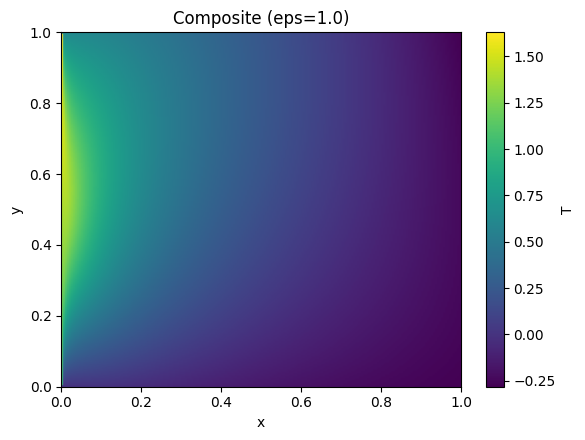

Guardado: /content/outputs/Tcomp_eps1_0.png


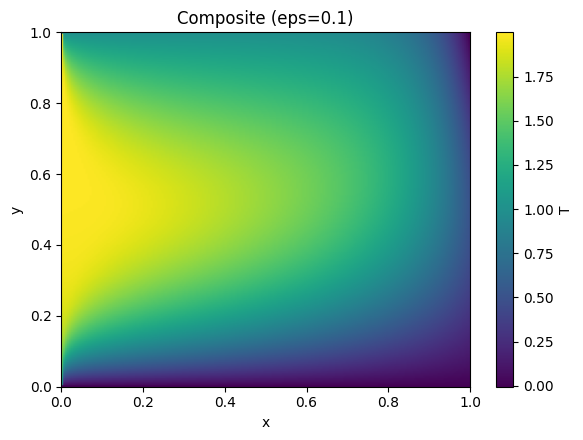

Guardado: /content/outputs/Tcomp_eps0_1.png


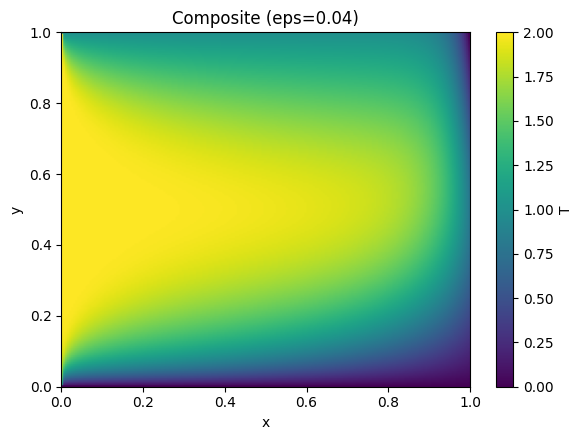

Guardado: /content/outputs/Tcomp_eps0_04.png


In [ ]:
import os, numpy as np, matplotlib.pyplot as plt
from scipy.special import gammaincc

def T_comp(x, y, eps, h, T0, Tw, delta=1e-12):
    z1 = y**3 / (3.0*eps*(x + delta))
    z2 = (h - y)**3 / (3.0*eps*(x + delta))
    return T0 + (Tw - T0)*( np.exp(-(1.0 - x)*y/eps)
                            + gammaincc(1/3, z1) + gammaincc(1/3, z2) - 1.0 )

out_dir = "/content/outputs"; os.makedirs(out_dir, exist_ok=True)
h, T0, Tw = 1.0, 1.0, 0.0
nx, ny = 200, 200
x = np.linspace(0,1,nx); y = np.linspace(0,h,ny)
X, Y = np.meshgrid(x,y)

for eps in [1.0, 0.1, 0.04]:
    T = T_comp(X, Y, eps, h, T0, Tw)
    plt.figure(figsize=(6,4.5))
    im = plt.imshow(T, origin='lower', extent=[0,1,0,h], aspect='auto')
    plt.xlabel('x'); plt.ylabel('y'); plt.title(f'Composite (eps={eps})')
    plt.colorbar(im, label='T'); plt.tight_layout()
    fname = f"{out_dir}/Tcomp_eps{str(eps).replace('.','_')}.png"
    plt.savefig(fname, dpi=200); plt.show()
    print("Guardado:", fname)


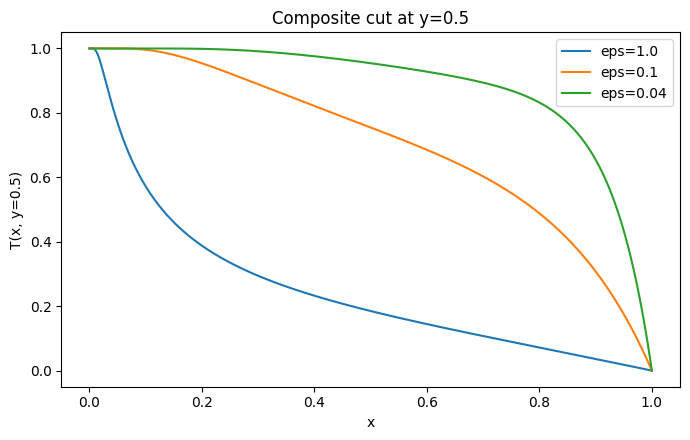

PNG: /content/outputs/Tcomp_cut_y0_5.png
CSV: /content/outputs/Tcomp_cut_y0_5.csv
          x  T_eps=1.0  T_eps=0.1  T_eps=0.04
0  0.000000   1.000000   1.000000         1.0
1  0.002506   0.999996   1.000000         1.0
2  0.005013   0.999943   1.000000         1.0
3  0.007519   0.999120   1.000000         1.0
4  0.010025   0.995958   0.999999         1.0
5  0.012531   0.989577   0.999999         1.0
6  0.015038   0.980081   0.999998         1.0
7  0.017544   0.968048   0.999998         1.0


In [ ]:
# --- DEPENDENCIAS ---
import os, numpy as np, pandas as pd
import matplotlib.pyplot as plt
from scipy.special import gammaincc  # Q(s,z)=Gamma(s,z)/Gamma(s)

# --- DEFINICIÓN DE T_comp ---
from scipy.special import gammaincc

import numpy as np
from scipy.special import gammaincc  # Q(s,z)

def T_comp(x, y, eps, h, T0, Tw, delta=1e-12, p=2):
    """
    p: potencia de la ventana de salida (w(x) = x**p).
       p>=1 hace que w(0)=0 y w(1)=1.
    """
    # capas de pared (gamma incompleta regularizada)
    z1 = y**3       /(3.0*eps*(x + delta))
    z2 = (h - y)**3 /(3.0*eps*(x + delta))
    Qb = gammaincc(1/3, z1)   # pared inferior
    Qt = gammaincc(1/3, z2)   # pared superior

    # unión de capas (inclusión–exclusión)
    S = Qb + Qt - Qb*Qt
    core = 1.0 - S

    # capa de salida solo en el núcleo, con ventana w(x) que anula en x=0
    w = np.power(x, p)                # p=2 funciona bien
    outlet = np.exp(-(1.0 - x)*y/eps) # decaimiento hacia la salida
    return T0 + (Tw - T0) * ( S + w*outlet*core )



# --- PARÁMETROS ---
h, T0, Tw = 1.0, 1.0, 0.0
y0 = 0.5
eps_list = [1.0, 0.1, 0.04]
x = np.linspace(0.0, 1.0, 400)

# --- CÁLCULO ---
curves = {eps: T_comp(x, y0*np.ones_like(x), eps, h, T0, Tw) for eps in eps_list}

# --- GRAFICAR ---
plt.figure(figsize=(7,4.5))
for eps in eps_list:
    plt.plot(x, curves[eps], label=f"eps={eps}")
plt.xlabel("x")
plt.ylabel(f"T(x, y={y0})")
plt.title(f"Composite cut at y={y0}")
plt.legend()
plt.tight_layout()

out_dir = "/content/outputs"
os.makedirs(out_dir, exist_ok=True)
png_path = f"{out_dir}/Tcomp_cut_y0_5.png"
plt.savefig(png_path, dpi=200)
plt.show()

# --- GUARDAR CSV ---
df = pd.DataFrame({"x": x})
for eps in eps_list:
    df[f"T_eps={eps}"] = curves[eps]
csv_path = f"{out_dir}/Tcomp_cut_y0_5.csv"
df.to_csv(csv_path, index=False)

print("PNG:", png_path)
print("CSV:", csv_path)
print(df.head(8))  # vista rápida


In [ ]:
import numpy as np
from scipy.special import gammaincc  # Q(s,z) = Gamma(s,z)/Gamma(s)

def T_comp(x, y, eps, h, T0, Tw, delta=1e-12, p=2):
    """
    p: potencia de la ventana de salida (w(x) = x**p).
       p>=1 hace que w(0)=0 y w(1)=1.
    """
    # capas de pared (gamma incompleta regularizada)
    z1 = y**3       /(3.0*eps*(x + delta))
    z2 = (h - y)**3 /(3.0*eps*(x + delta))
    Qb = gammaincc(1/3, z1)   # pared inferior
    Qt = gammaincc(1/3, z2)   # pared superior

    # unión de capas (inclusión–exclusión)
    S = Qb + Qt - Qb*Qt
    core = 1.0 - S

    # capa de salida solo en el núcleo, con ventana w(x) que anula en x=0
    w = np.power(x, p)                # p=2 funciona bien
    outlet = np.exp(-(1.0 - x)*y/eps) # decaimiento hacia la salida
    return T0 + (Tw - T0) * ( S + w*outlet*core )


In [ ]:
import numpy as np
from scipy.special import gammaincc  # Q(s,z)

def T_comp(x, y, eps, h, T0, Tw, delta=1e-12):
    # gammas regularizadas en las paredes
    z1 = y**3        / (3.0*eps*(x + delta))
    z2 = (h - y)**3  / (3.0*eps*(x + delta))
    Qb = gammaincc(1/3, z1)   # bottom
    Qt = gammaincc(1/3, z2)   # top

    S  = Qb + Qt - Qb*Qt      # inclusión–exclusión (union de capas de pared)
    core = 1.0 - S            # región núcleo
    outlet = np.exp(-(1.0 - x)*y/eps)

    return T0 + (Tw - T0) * ( S + outlet*core )


In [ ]:
from scipy.special import gammainc  # <-- OJO: gammainc = P(s,z) (inferior normalizada)

def composite_couette(x_grid, y_grid, eps):
    """
    Couette: y T_x = eps (T_xx + T_yy)
    Compuesta con gamma incompleta inferior normalizada (P) + capa de salida normalizada.
    BCs: T(0,y)=1 (núcleo), T(1,y)=0, T(x,0)=T(x,1)=0.
    """
    X, Y = np.meshgrid(x_grid, y_grid, indexing='ij')
    s = 1.0/3.0
    tiny = 1e-12

    Z1 = (Y**3) / (9.0*eps*np.maximum(X, tiny))
    Z2 = ((1.0 - Y)**3) / (9.0*eps*np.maximum(X, tiny))

    # P(s,z) = gammainc(s, z)  (inferior regularizada)
    P1 = gammainc(s, Z1)
    P2 = gammainc(s, Z2)

    wall_part = (P1 + P2 - 1.0)

    # Capa de salida normalizada: f(0)=1, f(1)=0
    denom = 1.0 - np.exp(-Y/eps)
    # Evitar división por cero exactamente en y=0:
    denom = np.where(denom == 0.0, 1.0, denom)

    outlet = (1.0 - np.exp(-(1.0 - X)*Y/eps)) / denom

    return wall_part * outlet


In [ ]:
from scipy.special import gammainc  # P(s,z) = gamma_lower(s,z)/Gamma(s)

def composite_couette(x_grid, y_grid, eps):
    """
    Couette: y T_x = eps (T_xx + T_yy)
    Compuesta con gamma inferior normalizada + capa de salida normalizada.
    BCs: T(0,y)=1 (núcleo), T(1,y)=0, T(x,0)=T(x,1)=0.
    """
    X, Y = np.meshgrid(x_grid, y_grid, indexing='ij')
    s = 1.0/3.0
    tiny = 1e-12
    Z1 = (Y**3) / (9.0*eps*np.maximum(X, tiny))
    Z2 = ((1.0 - Y)**3) / (9.0*eps*np.maximum(X, tiny))
    P1 = gammainc(s, Z1)  # lower regularized P
    P2 = gammainc(s, Z2)
    wall_part = (P1 + P2 - 1.0)
    denom = 1.0 - np.exp(-Y/eps)
    denom = np.where(np.abs(denom) < 1e-14, 1.0, denom)  # evita 0 en y=0
    outlet = (1.0 - np.exp(-(1.0 - X)*Y/eps)) / denom   # f(0)=1, f(1)=0
    return wall_part * outlet


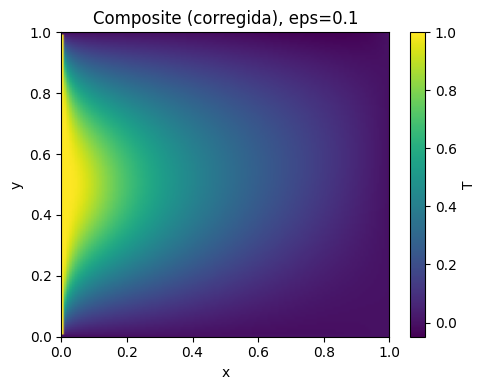

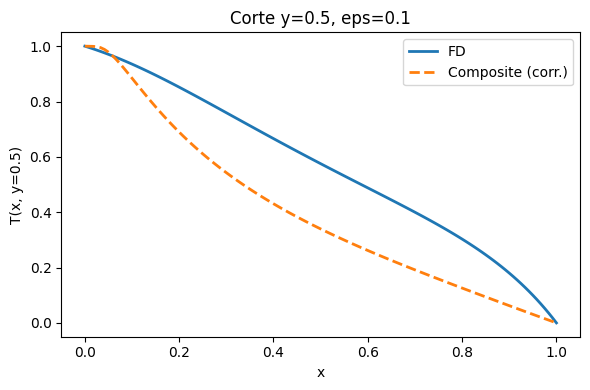

In [ ]:
# --- PRUEBA MINIMA: campo y corte usando la compuesta corregida ---
import numpy as np
import matplotlib.pyplot as plt
from scipy.sparse import lil_matrix, csc_matrix
from scipy.sparse.linalg import spsolve
from scipy.special import gammainc  # OJO: inferior normalizada P(s,z)

GRID_N = 121

def composite_couette(x_grid, y_grid, eps):
    X, Y = np.meshgrid(x_grid, y_grid, indexing='ij')
    s = 1.0/3.0
    tiny = 1e-12
    Z1 = (Y**3) / (9.0*eps*np.maximum(X, tiny))
    Z2 = ((1.0 - Y)**3) / (9.0*eps*np.maximum(X, tiny))
    P1 = gammainc(s, Z1)   # P(s,z) (lower regularized)
    P2 = gammainc(s, Z2)
    wall_part = (P1 + P2 - 1.0)
    denom = 1.0 - np.exp(-Y/eps)
    denom = np.where(np.abs(denom) < 1e-14, 1.0, denom)  # evita 0 en y=0
    outlet = (1.0 - np.exp(-(1.0 - X)*Y/eps)) / denom
    return wall_part * outlet

def solve_fd_reference(eps, Nx=GRID_N, Ny=GRID_N):
    xs = np.linspace(0,1,Nx); ys = np.linspace(0,1,Ny)
    hx = xs[1]-xs[0]; hy = ys[1]-ys[0]
    def idx(i,j): return j*Nx + i
    N = Nx*Ny
    A = lil_matrix((N,N), dtype=float)
    b = np.zeros(N, dtype=float)
    for j in range(Ny):
        y = ys[j]
        for i in range(Nx):
            k = idx(i,j)
            if i==0:      A[k,k]=1; b[k]=1;  continue
            if i==Nx-1:   A[k,k]=1; b[k]=0;  continue
            if j==0 or j==Ny-1: A[k,k]=1; b[k]=0; continue
            cx = eps/(hx*hx); cy = eps/(hy*hy); conv = y/hx
            A[k, idx(i-1,j)] += ( cx + conv)   # upwind en x
            A[k, idx(i+1,j)] += ( cx)
            A[k, idx(i,  j-1)] += ( cy)
            A[k, idx(i,  j+1)] += ( cy)
            A[k, k]           += (-2*cx - 2*cy - conv)
    from scipy.sparse.linalg import spsolve
    T = spsolve(csc_matrix(A), b).reshape(Ny, Nx)
    return xs, ys, np.array(T.T, dtype=np.float64)

# ===== ejecuta una prueba rápida =====
eps = 0.1
xs = np.linspace(0,1,GRID_N); ys = np.linspace(0,1,GRID_N)
_, _, Tfd = solve_fd_reference(eps)
Tcomp = composite_couette(xs, ys, eps)

# Mapa 2D
plt.figure(figsize=(5,4))
im = plt.imshow(Tcomp.T, origin='lower', extent=[0,1,0,1], aspect='auto')
plt.colorbar(im, label='T'); plt.xlabel('x'); plt.ylabel('y')
plt.title(f'Composite (corregida), eps={eps}')
plt.tight_layout(); plt.show()

# Corte y=0.5
jmid = GRID_N//2
plt.figure(figsize=(6,4))
plt.plot(xs, Tfd[:,jmid], lw=2, label='FD')
plt.plot(xs, Tcomp[:,jmid], '--', lw=2, label='Composite (corr.)')
plt.xlabel('x'); plt.ylabel('T(x, y=0.5)'); plt.title(f'Corte y=0.5, eps={eps}')
plt.legend(); plt.tight_layout(); plt.show()
